In [1]:
# ce notebook génére des nouveaux datasets via deux méthodes (encoding et moyenne) instaurant des nouvelles variables

import numpy as np 
import pandas as pd 
import scipy as sc 
import matplotlib.pyplot as plt 
from itertools import product
from sklearn import linear_model
from sklearn.utils import shuffle
import json
import seaborn as sns


import missingno as msno


import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as gobj
py.init_notebook_mode(connected=True)

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

import folium 
import branca.colormap as cm
from geopy.geocoders import Nominatim
import math

from sklearn.preprocessing import StandardScaler
from sklearn import decomposition
from sklearn.cluster import KMeans
from sklearn import (manifold, datasets, decomposition, ensemble,discriminant_analysis, random_projection)

In [2]:
# ouvrir le dataset : 
data_fly = pd.read_csv('DF_CASCADE_DEST.csv')

Nous commençons par définir quelques fonctions utiles

In [3]:
# détermine le nombre, les occurences / les pourcentages des objets pour une variable donnée
def plot_value_counts2(col_name,n_oc):
    
    #we don't want more than 31 bars
    if len(pd.DataFrame(df[col_name].dropna().value_counts())) > n_oc:
        max = n_oc
    else:
        max = len(pd.DataFrame(df[col_name].dropna().value_counts()))
        
        
    values_count = pd.DataFrame(df[col_name].dropna().value_counts()[:max])
    values_count.columns = ['count']
    # convert the index column into a regular column.
    values_count[col_name] = [ str(i) for i in values_count.index ]
    # add a column with the percentage of each data point to the sum of all data points.
    values_count['percent'] = values_count['count'].div(values_count['count'].sum()).multiply(100).round(2)
    # change the order of the columns.
    values_count = values_count.reindex([col_name,'count','percent'],axis=1)
    values_count.reset_index(drop=True,inplace=True)
    return (values_count)

def plot_value_counts(col_name):       
    
    values_count = pd.DataFrame(df[col_name].dropna().value_counts())
    print (values_count.shape)
    values_count.columns = ['count']
    # convert the index column into a regular column.
    values_count[col_name] = [ str(i) for i in values_count.index ]
    # add a column with the percentage of each data point to the sum of all data points.
    values_count['percent'] = values_count['count'].div(values_count['count'].sum()).multiply(100).round(2)
    # change the order of the columns.
    values_count = values_count.reindex([col_name,'count','percent'],axis=1)
    values_count.reset_index(drop=True,inplace=True)
    return (values_count)

In [4]:
# associe chaque objet en une nouvelle variable binaire
def associate(valeurs,df,column_name):
    for i in range (valeurs.shape[0]):
        print (i)
        ind = df.columns.get_loc(column_name)        
        #définir un vecteur de même nombre d'élément que les colonnes du dataset
        val = np.zeros(df.shape[0])
        # associer ce vecteur en colonne
        df[valeurs.iloc[i,0]] = val[:]
        # retenir l'index de cette colonne 
        ind_val = df.columns.get_loc(valeurs.iloc[i,0])
        # associer la valeur 1 lorsque la variable remplie la condition
        mask = df[df[column_name] == valeurs.iloc[i,0]]
        mask.iloc[:,ind_val] = 1
        df.iloc[:,ind_val] = df.iloc[:,ind_val].add(mask.iloc[:,ind_val], fill_value=0)
    return (df)

In [5]:
# définir une fonction qui ressemble à la fonction "associate" mais qui encore des chemins à partir de deux colonnes 

def associate_path(path,df,column_orig,column_dest,coup):
    for i in range (coup):#(len(path_orig)):
        print (i)
               
        #définir un vecteur de même nombre d'élément que les colonnes du dataset
        val = np.zeros(df.shape[0])
        # associer ce vecteur en colonne
        df["path_{}".format(i)] = val[:]
        # retenir l'index de cette colonne 
        ind_val = df.columns.get_loc("path_{}".format(i))
        # associer la valeur 1 lorsque la variable remplie la condition
        mask = df[(df[column_orig] == path.iloc[(path.shape[0]-i-1),1]) & 
                  (df[column_dest] == path.iloc[(path.shape[0]-i-1),2])]
        mask.iloc[:,ind_val] = 1
        df.iloc[:,ind_val] = df.iloc[:,ind_val].add(mask.iloc[:,ind_val], fill_value=0)
    return (df)

In [6]:
# associe chaque objet en une nouvelle variable binaire
def associate_new(valeurs,df,column_name,coup):
    for i in range (coup):
        print (i)
        ind = df.columns.get_loc(column_name)        
        #définir un vecteur de même nombre d'élément que les colonnes du dataset
        val = np.zeros(df.shape[0])
        # associer ce vecteur en colonne
        df[valeurs.iloc[(valeurs.shape[0]-1-i),0]] = val[:]
        # retenir l'index de cette colonne 
        ind_val = df.columns.get_loc(valeurs.iloc[(valeurs.shape[0]-1-i),0])
        # associer la valeur 1 lorsque la variable remplie la condition
        mask = df[df[column_name] == valeurs.iloc[(valeurs.shape[0]-1-i),0]]
        mask.iloc[:,ind_val] = 1
        df.iloc[:,ind_val] = df.iloc[:,ind_val].add(mask.iloc[:,ind_val], fill_value=0)
    return (df)

   - un premier data_set prendra en entrée uniquement la date en jours de l'année et en jours de la semaine encodés et non encodés ainsi que l'heure non encodée et encodée par heures soit 1+1+1+7+24 variables
   - un second data_set prendra en entrée uniquement la date en jours de l'année encodés soit 24+356 variables 
   - un troisième data set prendra en entrée les variables du premier dataset plus la companie aerienne
   - un quatrième data set prendra en entrée les variables de troisième dataset + les traffic associés aux aeroports + les retards moyens associés aux aeroports 
   - un cinquième data set prendra en entrée les variables du troisième dataset + des variables trajets "encodées"
   - un sixième data set propose une nouvelle solution en associant aux variables (origin, dest, tail_num, week_days) les moyennes du retard au départ de chaque élément qu'ils contiennent. (cette méthode prend un temps de calcul non négligeable mais gagne en mémoire et en temps de calcul dans la partie modélisation, c'est celle qui sera privilégiée à terme)
   - Le 7ième data set introduit une nouvelle variable (il s'agit du calcul pour chaque vol de la moyenne dans les trois heures précédent le départ du retard au départ de l'aéroport associé à ce vol) / en même temps, nous cherchons à définir une variable quantifiant l'histoire de l'appareil, c'est à dire le retard d'un avion lors de son vol précédent lorsqu'il fait une escale courte. On s'appercevra que le très faible nombre de cas ne permet pas de considérer cette variable comme pertinente.
   - Le 8ième data set introduit une nouvelle variable (moyenne dans les trois heures précédents l'arrivée d'un vol du retard à l'arrivé de l'aéroport d'arrivé) 
   
   
   
   
   
   
   

# 1---- Travailler avec les dates > save DF_DATE

In [7]:
# dataframe DATE > premier data set
DF_DATE = data_fly[['FL_DATE','CRS_DEP_TIME','DEP_DELAY_NEW','ARR_DELAY_NEW','CANCELLED','DIVERTED']]

In [8]:
# convertir les données en données dates 
ind_date = DF_DATE.columns.get_loc('FL_DATE')
DF_DATE.iloc[:,ind_date] = pd.to_datetime(DF_DATE.FL_DATE,errors='coerce')
print (DF_DATE.shape)

(5635754, 6)


In [9]:
# on ajoute une colonne du jour de la semaine
DF_DATE['DAY'] = DF_DATE.iloc[:,ind_date].dt.weekday_name
# on ajoute un colonne du jour de l'année
DF_DATE['DAY_YEAR'] = DF_DATE.iloc[:,ind_date].dt.dayofyear
print (DF_DATE.shape)

(5635754, 8)


In [10]:
# compter le nombre de jours : 
df = DF_DATE.copy()
valeurs = plot_value_counts2(col_name='DAY',n_oc=100)
print (valeurs.shape)

(7, 3)


In [11]:
# associer à chaque jour sa variable correspondante :
DF_DATE = associate(valeurs=valeurs,df=df,column_name='DAY')
print (DF_DATE.shape)

0
1
2
3
4
5
6
(5635754, 15)


In [12]:
# convertir les données heures et en minustes 
ind_date = DF_DATE.columns.get_loc('CRS_DEP_TIME')
DF_DATE['HOUR'] = np.around(DF_DATE.iloc[:,ind_date]/100)
DF_DATE['MINUTES'] = (DF_DATE.iloc[:,ind_date]/100)%2
DF_DATE.loc[:,'MINUTES'][DF_DATE['MINUTES']>=1] = DF_DATE.loc[:,'MINUTES'][DF_DATE['MINUTES']>=1] - 1

DF_DATE['MINUTES'] = DF_DATE['MINUTES'] + np.around(DF_DATE.iloc[:,ind_date]/100)*60
print (DF_DATE.shape)



(5635754, 17)


In [13]:
# compter le nombre d'heures
df = DF_DATE.copy()
valeurs = plot_value_counts(col_name='HOUR')
print (valeurs.shape)

(25, 1)
(25, 3)


In [14]:
# convertir en float 
valeurs.iloc[:,0] = pd.to_numeric(valeurs.iloc[:,0], errors='coerce').fillna(0, downcast='infer')
# vérifier le min et le max 
print ('-----------maximum ----------')
print (np.amax(valeurs.loc[:,'HOUR']))
print ('---------- minimum ------------')
print (np.amin(valeurs.loc[:,'HOUR']))


-----------maximum ----------
24
---------- minimum ------------
0


In [15]:
# associer à chaque heure sa variable correspondante :
df = DF_DATE.copy()
DF_DATE = associate(valeurs=valeurs,df=df,column_name='HOUR')
print (DF_DATE.shape)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
(5635754, 42)


In [17]:
# remove unuseful features
DF_DATE = DF_DATE.drop(columns = ['FL_DATE'])
DF_DATE = DF_DATE.drop(columns = ['CRS_DEP_TIME'])

In [18]:
# mélanger les données
DF_DATE = shuffle(DF_DATE)
m = DF_DATE.shape[0]
# save 
DF_DATE.to_csv("DF_DATE.csv")
# garder un échantillon de 1/10 du jeux de donnée pour travailler plus rapidement
DF_DATE_RED = DF_DATE.iloc[0:int(np.around(m/10)), :]
# save 
DF_DATE_RED.to_csv("DF_DATE_RED.csv")

# 2 ----- Ajouter la companie aerienne > Save DF_CARRIER_DATE

In [7]:
# on peut choisir d'ouvrir df_date pour sauver de la mémoire
DF_DATE = pd.read_csv('DF_DATE.csv')

In [8]:
# dataframe DF_CARRIER_DATE
DF_DATE['CARRIER'] = data_fly['CARRIER']
df = DF_DATE.copy()

valeurs = plot_value_counts2(col_name='CARRIER',n_oc=1000)
DF_CARRIER_DATE = associate(valeurs=valeurs,df=df,column_name='CARRIER')
# enlever la colonne 'CARRIER'
DF_CARRIER_DATE = DF_CARRIER_DATE.drop(columns = ['CARRIER'])

# mélanger les données
DF_CARRIER_DATE = shuffle(DF_CARRIER_DATE)
m = DF_CARRIER_DATE.shape[0]
# save 
DF_CARRIER_DATE.to_csv("DF_CARRIER_DATE.csv")
# garder un échantillon de 1/10 du jeux de donnée pour travailler plus rapidement
DF_CARRIER_DATE_RED = DF_CARRIER_DATE.iloc[0:int(np.around(m/10)), :]
# save 
DF_CARRIER_DATE_RED.to_csv("DF_CARRIER_DATE_RED.csv")


0
1
2
3
4
5
6
7
8
9
10
11
12


# 3 ---- Considérer les trajets > Save DF_PATH

In [ ]:
# on peut choisir d'ouvrir df_carrier_date pour dégager de la mémoire 
DF_CARRIER_DATE = pd.read_csv('DF_CARRIER_DATE.csv')

In [9]:
DF_CARRIER_DATE['ORIGIN_CITY_NAME'] = data_fly['ORIGIN_CITY_NAME']
DF_CARRIER_DATE['DEST_CITY_NAME'] = data_fly['DEST_CITY_NAME']
df = DF_CARRIER_DATE.copy()

In [10]:
# réduire le nombre d'exemple pour encoder plus facilement 
m = df.shape[0]
df = df.iloc[0:int(np.around(m/100)),:]
print (df.shape)

(56358, 56)


In [11]:
# créer une liste de variables "lignes aeriennes"
path_orig = []
path_dest = []
# quantifie l'importance du trajet 
path_count = []

city_orig = plot_value_counts2(col_name='ORIGIN_CITY_NAME',n_oc=100000)
print (city_orig)
print (df.shape)
for i in range (city_orig.shape[0]):
    
    # réduit le dataset à la ville considérée
    city = df[df['ORIGIN_CITY_NAME'] == city_orig.iloc[i,0]]
    print (city.shape)
    df1 = df.copy()
    df = city.copy()   
    city_dest = plot_value_counts2(col_name='DEST_CITY_NAME',n_oc=100000)
    df = df1
    for j in range (city_dest.shape[0]):
        path_orig.append(city_orig.iloc[i,0])
        path_dest.append(city_dest.iloc[j,0]) 
        path_count.append(city_dest.iloc[j,1])
        
print (city_orig.shape)
print (len(path_orig))


            ORIGIN_CITY_NAME  count  percent
0                Atlanta, GA   3975     7.05
1                Chicago, IL   3414     6.06
2                 Denver, CO   2183     3.87
3            Los Angeles, CA   2161     3.83
4               New York, NY   1961     3.48
5      Dallas/Fort Worth, TX   1952     3.46
6                Houston, TX   1912     3.39
7          San Francisco, CA   1687     2.99
8                Phoenix, AZ   1595     2.83
9              Las Vegas, NV   1531     2.72
10               Seattle, WA   1311     2.33
11               Orlando, FL   1304     2.31
12           Minneapolis, MN   1300     2.31
13               Detroit, MI   1262     2.24
14                Boston, MA   1194     2.12
15            Washington, DC   1133     2.01
16                Newark, NJ   1129     2.00
17        Salt Lake City, UT   1102     1.96
18             Charlotte, NC   1041     1.85
19             Baltimore, MD    937     1.66
20       Fort Lauderdale, FL    834     1.48
21        

In [12]:
# créer un dataframe path_orig path_dest path_count
d = {'path_count': path_count, 'path_orig': path_orig, 'path_dest': path_dest}
path = pd.DataFrame(data=d)

b = path.iloc[:,0].sum(axis=0)
print (b)

# arranger le dataframe par ordre croissant des chemins 
path = path.sort_values(by='path_count',axis=0)

a = 0
# valeur de coupure
c = 0
coup = 0 

# couper les listes à 90% du total des trajets

for c in range (path.shape[0]):
    a = path.iloc[(path.shape[0]-c):path.shape[0],0].sum(axis=0)
        
    if (a/b > 0.90): # explique plus de 92% 
        coup = c
        print (a/b)
        break     
        

print (coup)     


56358
0.9001206572270131
2164


In [13]:
# apply associate_path function 

DF_PATH = associate_path(path=path,df=df,
                         column_orig='ORIGIN_CITY_NAME',column_dest='DEST_CITY_NAME',coup=coup)
# remove unuseful features
DF_PATH = DF_PATH.drop(columns = ['ORIGIN_CITY_NAME'])
DF_PATH = DF_PATH.drop(columns = ['DEST_CITY_NAME'])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


In [15]:
DF_PATH['TAIL_NUM'] = data_fly['TAIL_NUM']

In [16]:
# dataframe DF_PATH
# mélanger les données
DF_PATH = shuffle(DF_PATH)
print (DF_PATH.shape)
# save 
DF_PATH.to_csv("DF_PATH.csv")


(56358, 2219)


# 4 ----- Considérer l'appareil > Save DF_PATH_TAIL

In [6]:
# on peut choisir d'ouvrir df_carrier_date pour dégager de la mémoire 
DF_PATH = pd.read_csv('DF_PATH.csv')

In [13]:
# supprimer les colonnes correspondant à la companie 
DF_PATH = DF_PATH.drop(columns = ['WN'])
DF_PATH = DF_PATH.drop(columns = ['DL'])
DF_PATH = DF_PATH.drop(columns = ['AA'])
DF_PATH = DF_PATH.drop(columns = ['OO'])
DF_PATH = DF_PATH.drop(columns = ['UA'])
DF_PATH = DF_PATH.drop(columns = ['EV'])
DF_PATH = DF_PATH.drop(columns = ['B6'])
DF_PATH = DF_PATH.drop(columns = ['AS'])
DF_PATH = DF_PATH.drop(columns = ['NK'])
DF_PATH = DF_PATH.drop(columns = ['F9'])
DF_PATH = DF_PATH.drop(columns = ['HA'])
DF_PATH = DF_PATH.drop(columns = ['VX'])
DF_PATH = DF_PATH.drop(columns = ['30397'])

In [ ]:
DF_PATH['TAIL_NUM'] = data_fly['TAIL_NUM']

In [14]:
# apply associate function for TAIL_NUM
df = DF_PATH.copy()
valeurs = plot_value_counts2(col_name='TAIL_NUM',n_oc=100000)
print (valeurs.shape)

(4704, 3)


In [15]:
b = valeurs.iloc[:,1].sum(axis=0)
print (b)

# arranger le dataframe par ordre croissant des chemins 
valeurs = valeurs.sort_values(by='count',axis=0)
a = 0
# valeur de coupure
c = 0
coup = 0 

# couper les listes à 90% du total des trajets
for c in range (valeurs.shape[0]):
    a = valeurs.iloc[(valeurs.shape[0]-c):valeurs.shape[0],1].sum(axis=0)
        
    if (a/b > 0.80): # explique plus de 80% 
        coup = c
        print (a/b)
        break          

print (coup)     

56235
0.8000177825197831
2738


In [16]:
DF_PATH_TAIL = associate_new(valeurs=valeurs,df=df,column_name='TAIL_NUM',coup=coup)

# enlever la colonne 'TAIL_NUM'
DF_PATH_TAIL = DF_PATH_TAIL.drop(columns = ['TAIL_NUM'])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


In [17]:
# Dataframe DF_PATH_TAIL

# mélanger les données
DF_PATH_TAIL = shuffle(DF_PATH_TAIL)
print (DF_PATH_TAIL.shape)

DF_PATH_TAIL.to_csv("DF_PATH_TAIL.csv")


(56358, 4944)


# 5 ----- ENCODER LES JOURS DE L'ANNEE > DF_YEAR

In [27]:
# dataframe DATE > premier data set
DF_DATE = data_fly[['FL_DATE','CRS_DEP_TIME','DEP_DELAY_NEW','ARR_DELAY_NEW','CANCELLED','DIVERTED']]

In [28]:
# convertir les données en données dates 
ind_date = DF_DATE.columns.get_loc('FL_DATE')
DF_DATE.iloc[:,ind_date] = pd.to_datetime(DF_DATE.FL_DATE,errors='coerce')
print (DF_DATE.shape)

(5635754, 6)


In [29]:
# on ajoute un colonne du jour de l'année
DF_DATE['DAY_YEAR'] = DF_DATE.iloc[:,ind_date].dt.dayofyear
print (DF_DATE.shape)

(5635754, 7)


In [30]:
# compter le nombre de jours : 
df = DF_DATE.copy()
valeurs = plot_value_counts(col_name='DAY_YEAR')
print (valeurs.shape)

(366, 1)
(366, 3)


In [31]:
# associer à chaque jour sa variable correspondante :
valeurs.iloc[:,0] = pd.to_numeric(valeurs.iloc[:,0], errors='coerce').fillna(0, downcast='infer')

DF_DATE = associate(valeurs=valeurs,df=df,column_name='DAY_YEAR')
print (DF_DATE.shape)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57


MemoryError: 

In [ ]:
# convertir les données heures et en minustes 
ind_date = DF_DATE.columns.get_loc('CRS_DEP_TIME')
DF_DATE['HOUR'] = np.around(DF_DATE.iloc[:,ind_date]/100)
DF_DATE['MINUTES'] = (DF_DATE.iloc[:,ind_date]/100)%2
DF_DATE.loc[:,'MINUTES'][DF_DATE['MINUTES']>=1] = DF_DATE.loc[:,'MINUTES'][DF_DATE['MINUTES']>=1] - 1

DF_DATE['MINUTES'] = DF_DATE['MINUTES'] + np.around(DF_DATE.iloc[:,ind_date]/100)*60
print (DF_DATE.shape)



In [ ]:
# compter le nombre d'heures
df = DF_DATE.copy()
valeurs = plot_value_counts(col_name='HOUR')
print (valeurs.shape)

In [ ]:
# remove unuseful features
DF_DATE = DF_DATE.drop(columns = ['FL_DATE'])
DF_DATE = DF_DATE.drop(columns = ['CRS_DEP_TIME'])

In [ ]:
# mélanger les données
DF_DATE = shuffle(DF_DATE)
m = DF_DATE.shape[0]
# save 
DF_DATE.to_csv("DF_YEAR.csv")
# garder un échantillon de 1/10 du jeux de donnée pour travailler plus rapidement
DF_DATE_RED = DF_DATE.iloc[0:int(np.around(m/10)), :]
# save 
DF_DATE_RED.to_csv("DF_YEAR_RED.csv")

# 6 ----- VIA LA MOYENNE DES RETARDS > DF_MEANS

In [9]:
# dataframe DATE > premier data set
DF_DATE = data_fly[['FL_DATE','CRS_DEP_TIME','DEP_DELAY_NEW','ARR_DELAY_NEW','CANCELLED','DIVERTED','ORIGIN_CITY_NAME',
                   'DEST_CITY_NAME','TAIL_NUM','CRS_ARR_TIME','DISTANCE','AIR_TIME']]

In [10]:
# convertir les données en données dates 
ind_date = DF_DATE.columns.get_loc('FL_DATE')
DF_DATE.iloc[:,ind_date] = pd.to_datetime(DF_DATE.FL_DATE,errors='coerce')
print (DF_DATE.shape)

(5635754, 12)


In [11]:
# on ajoute un colonne du jour de l'année
# on ajoute une colonne du jour de la semaine
DF_DATE['DAY'] = DF_DATE.iloc[:,ind_date].dt.weekday_name
DF_DATE['DAY_YEAR'] = DF_DATE.iloc[:,ind_date].dt.dayofyear
print (DF_DATE.shape)

(5635754, 14)


In [12]:
# convertir les données heures et en minustes 
ind_date = DF_DATE.columns.get_loc('CRS_DEP_TIME')

DF_DATE['MINUTES'] = (DF_DATE.iloc[:,ind_date]/100)%2
DF_DATE.loc[:,'MINUTES'][DF_DATE['MINUTES']>=1] = DF_DATE.loc[:,'MINUTES'][DF_DATE['MINUTES']>=1] - 1

DF_DATE['MINUTES'] = DF_DATE['MINUTES'] + np.around(DF_DATE.iloc[:,ind_date]/100)*60
print (DF_DATE.shape)


(5635754, 15)


In [13]:
# Trouver les éléments des variables non continues 
df = DF_DATE.copy()
valeurs_wd_day = plot_value_counts(col_name='DAY')
valeurs_orig = plot_value_counts(col_name='ORIGIN_CITY_NAME')
valeurs_dest = plot_value_counts(col_name='DEST_CITY_NAME')
valeurs_tail = plot_value_counts(col_name='TAIL_NUM')
print ('------TAIL_NUM-------')
print (valeurs_tail)
print ('-----ORIGIN--------')
print (valeurs_orig)
print ('-----DEST------')
print (valeurs_dest)

(7, 1)
(310, 1)
(308, 1)
(5036, 1)
------TAIL_NUM-------
     TAIL_NUM  count  percent
0      N491HA   3937     0.07
1      N486HA   3733     0.07
2      N492HA   3704     0.07
3      N493HA   3655     0.07
4      N485HA   3631     0.06
5      N476HA   3631     0.06
6      N481HA   3620     0.06
7      N479HA   3608     0.06
8      N477HA   3591     0.06
9      N487HA   3430     0.06
10     N484HA   3417     0.06
11     N475HA   3311     0.06
12     N489HA   3261     0.06
13     N490HA   3223     0.06
14     N480HA   3186     0.06
15     N478HA   3069     0.05
16     N488HA   2725     0.05
17     N685AE   2591     0.05
18     N672AE   2580     0.05
19     N680AE   2569     0.05
20     N684JW   2559     0.05
21     N678AE   2557     0.05
22     N667GB   2556     0.05
23     N675AE   2536     0.05
24     N624AE   2522     0.04
25     N676AE   2518     0.04
26     N671AE   2507     0.04
27     N483HA   2496     0.04
28     N687JS   2491     0.04
29     N876AS   2415     0.04
...       ...

In [14]:
# créer une colonne de retard moyen en fonction du jour du week end 
ind = DF_DATE.columns.get_loc('DEP_DELAY_NEW')
# créer un vecteur numpy 0
vect= np.zeros(DF_DATE.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_DATE['MOY_WD_DAY'] = vect[:]
DF_DATE['TR_WD_DAY'] = vect[:]
for i in range (valeurs_wd_day.shape[0]):
    DF_DATE.loc[:,'MOY_WD_DAY'][DF_DATE['DAY'] == valeurs_wd_day.iloc[i,0]] = DF_DATE.iloc[:,ind][DF_DATE['DAY'] == valeurs_wd_day.iloc[i,0]].mean(axis=0)
    DF_DATE.loc[:,'TR_WD_DAY'][DF_DATE['DAY'] == valeurs_wd_day.iloc[i,0]] = valeurs_wd_day.iloc[i,1]
    
    
            
    
print (DF_DATE.loc[1000:1030,'MOY_WD_DAY'])    
    

1000    11.088354
1001    12.810339
1002    10.706662
1003    12.027348
1004    12.027348
1005    12.027348
1006    10.706662
1007    12.209800
1008    11.088354
1009    13.221908
1010    12.027348
1011    13.221908
1012    11.088354
1013    12.027348
1014    11.104190
1015    10.706662
1016    12.027348
1017    12.810339
1018    12.209800
1019    13.221908
1020    12.810339
1021    12.810339
1022    11.088354
1023    11.104190
1024    12.209800
1025    12.027348
1026    11.088354
1027    10.706662
1028    12.810339
1029    12.027348
1030    11.104190
Name: MOY_WD_DAY, dtype: float64


In [15]:
# créer une colonne de retard moyen en fonction du jour du week end 
# créer un vecteur numpy 0
vect= np.zeros(DF_DATE.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_DATE['MOY_ORIG'] = vect[:]
DF_DATE['TR_ORIG'] = vect[:]
for i in range (valeurs_orig.shape[0]):
    DF_DATE.loc[:,'MOY_ORIG'][DF_DATE['ORIGIN_CITY_NAME'] == valeurs_orig.iloc[i,0]] = DF_DATE.iloc[:,ind][DF_DATE['ORIGIN_CITY_NAME'] == valeurs_orig.iloc[i,0]].mean(axis=0)
    DF_DATE.loc[:,'TR_ORIG'][DF_DATE['ORIGIN_CITY_NAME'] == valeurs_orig.iloc[i,0]] =  valeurs_orig.iloc[i,1]
    
print (DF_DATE.loc[10:30,'MOY_ORIG'])    
    

10    14.317509
11    14.339559
12    11.610125
13    14.339559
14    16.250136
15    10.346309
16     8.860369
17    11.429234
18    10.431723
19    11.552299
20     8.290061
21    10.540618
22    11.552299
23    15.918534
24    11.552299
25    10.540618
26    11.552299
27    14.339559
28    10.431723
29    13.776919
30    11.429234
Name: MOY_ORIG, dtype: float64


In [16]:
# créer une colonne de retard moyen en fonction du jour du week end 
# créer un vecteur numpy 0
vect= np.zeros(DF_DATE.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_DATE['MOY_DEST'] = vect[:]
DF_DATE['TR_DEST'] = vect[:]
for i in range (valeurs_dest.shape[0]):
    DF_DATE.loc[:,'MOY_DEST'][DF_DATE['DEST_CITY_NAME'] == valeurs_dest.iloc[i,0]] = DF_DATE.iloc[:,ind][DF_DATE['DEST_CITY_NAME'] == valeurs_dest.iloc[i,0]].mean(axis=0)
    DF_DATE.loc[:,'TR_DEST'][DF_DATE['DEST_CITY_NAME'] == valeurs_dest.iloc[i,0]] = valeurs_dest.iloc[i,1]
    
    
    
print (DF_DATE.loc[10:30,'MOY_DEST'])    

10    13.399185
11    17.507263
12    10.887734
13    11.714441
14    14.402914
15    10.435915
16    12.575504
17    13.679564
18    14.071057
19    10.893820
20    11.081478
21    12.361676
22    12.011584
23    12.908245
24    17.507263
25    11.312435
26    10.741751
27    18.155632
28    14.071057
29    12.908245
30    13.399185
Name: MOY_DEST, dtype: float64


In [17]:
df = DF_DATE
print(plot_value_counts(col_name='MOY_WD_DAY'))

(8, 1)
           MOY_WD_DAY   count  percent
0  13.221908398319258  845349    15.00
1  12.810339382660096  837792    14.87
2  12.209800452691983  830575    14.74
3  10.706662330433172  829971    14.73
4  11.088354153615605  821802    14.58
5  12.027347761886245  783163    13.90
6  11.104190051669486  687101    12.19
7                 0.0       1     0.00


In [18]:
# créer une colonne de retard moyen en fonction du jour du week end 
# créer un vecteur numpy 0
vect= np.zeros(DF_DATE.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_DATE['MOY_TAIL'] = vect[:]
DF_DATE['TR_TAIL'] = vect[:]
for i in range (valeurs_tail.shape[0]):
    DF_DATE.loc[:,'MOY_TAIL'][DF_DATE['TAIL_NUM'] == valeurs_tail.iloc[i,0]] = DF_DATE.iloc[:,ind][DF_DATE['TAIL_NUM'] == valeurs_tail.iloc[i,0]].mean(axis=0)
    DF_DATE.loc[:,'TR_TAIL'][DF_DATE['TAIL_NUM'] == valeurs_tail.iloc[i,0]] = valeurs_tail.iloc[i,1]
       
print (DF_DATE.loc[10:30,'MOY_TAIL'])    

10    16.624928
11    10.148674
12    12.682131
13    10.911320
14    12.410830
15     7.349862
16    10.812344
17    10.774125
18    15.402769
19    12.065408
20    11.775286
21    10.398402
22     8.922071
23    12.778942
24    12.276932
25    11.480628
26    10.151009
27    12.805333
28     9.686332
29    11.495875
30    12.618881
Name: MOY_TAIL, dtype: float64


on utilise ici un géo-encoder pour inférer les données géographiques du nom des villes 

In [19]:
# afficher les coordonnées correspondantes
geolocator = Nominatim(user_agent='Tann',timeout=100) 

lat = np.zeros(valeurs_orig.shape[0]) # latitude correspondant à la ville
long = np.zeros(valeurs_orig.shape[0]) # longitude correspondant à la ville
ind = valeurs_orig.columns.get_loc('ORIGIN_CITY_NAME')
liste = []

for i in range (valeurs_orig.shape[0]):       
    
    location = geolocator.geocode(valeurs_orig.iloc[i,ind])
    if location is None:
        liste.append(i) 
        
    elif location:    
    
        lat[i] = location.latitude
        long[i] = location.longitude
    
valeurs_orig['latitude'] = lat[:]
valeurs_orig['longitude'] = long[:]

In [20]:
# ajouter les coordonnées manuellement pour des aeroports pour lesquels le géo-encodeur a échoué à encoder automatiquent 
for i in range (len(liste)):
    print (valeurs_orig.iloc[liste[i],ind])
ind_lat = valeurs_orig.columns.get_loc('latitude')
ind_long = valeurs_orig.columns.get_loc('longitude')
valeurs_orig.iloc[liste[0],ind_lat] = 38.684574
valeurs_orig.iloc[liste[0],ind_long] = -121.588406

valeurs_orig.iloc[liste[1],ind_lat] = 26.179868
valeurs_orig.iloc[liste[1],ind_long] = -98.239391

valeurs_orig.iloc[liste[2],ind_lat] = 43.536496
valeurs_orig.iloc[liste[2],ind_long] = -84.080847

valeurs_orig.iloc[liste[3],ind_lat] = 36.477382
valeurs_orig.iloc[liste[3],ind_long] = -82.405566

valeurs_orig.iloc[liste[4],ind_lat] = 41.338021
valeurs_orig.iloc[liste[4],ind_long] = -75.728052

valeurs_orig.iloc[liste[5],ind_lat] = 43.503787
valeurs_orig.iloc[liste[5],ind_long] = -114.296088

valeurs_orig.iloc[liste[6],ind_lat] = 34.712303
valeurs_orig.iloc[liste[6],ind_long] =  -77.580538

valeurs_orig.iloc[liste[7],ind_lat] =  41.507298
valeurs_orig.iloc[liste[7],ind_long] = -74.103223

valeurs_orig.iloc[liste[8],ind_lat] = 35.076250
valeurs_orig.iloc[liste[8],ind_long] = -77.038637

valeurs_orig.iloc[liste[9],ind_lat] = 45.814810
valeurs_orig.iloc[liste[9],ind_long] =  -88.115630

valeurs_orig.iloc[liste[10],ind_lat] = 31.665073
valeurs_orig.iloc[liste[10],ind_long] = -89.170729

valeurs_orig.iloc[liste[11],ind_lat] = 13.486790
valeurs_orig.iloc[liste[11],ind_long] = 144.794289

Sacramento, CA
Mission/McAllen/Edinburg, TX
Bristol/Johnson City/Kingsport, TN
Saginaw/Bay City/Midland, MI
Scranton/Wilkes-Barre, PA
Sun Valley/Hailey/Ketchum, ID
Jacksonville/Camp Lejeune, NC
Newburgh/Poughkeepsie, NY
Hattiesburg/Laurel, MS
Iron Mountain/Kingsfd, MI
New Bern/Morehead/Beaufort, NC
Guam, TT
Saipan, TT
Manhattan/Ft. Riley, KS


In [21]:
# créer quatres vecteurs colonne de 0 
vect= np.zeros(DF_DATE.shape[0])
DF_DATE['LAT_DEP'] = vect[:]
DF_DATE['LONG_DEP'] = vect[:]
DF_DATE['LAT_ARR'] = vect[:]
DF_DATE['LONG_ARR'] = vect[:]

indlat_dep = DF_DATE.columns.get_loc('LAT_DEP')
indlong_dep = DF_DATE.columns.get_loc('LONG_DEP')
indlat_arr = DF_DATE.columns.get_loc('LAT_ARR')
indlong_arr = DF_DATE.columns.get_loc('LONG_ARR')

for i in range (valeurs_orig.shape[0]):
    DF_DATE.iloc[:,indlat_dep][DF_DATE['ORIGIN_CITY_NAME'] == valeurs_orig.iloc[i,0]] = valeurs_orig.iloc[i,ind_lat]
    DF_DATE.iloc[:,indlong_dep][DF_DATE['ORIGIN_CITY_NAME'] == valeurs_orig.iloc[i,0]] = valeurs_orig.iloc[i,ind_long]
    DF_DATE.iloc[:,indlat_arr][DF_DATE['DEST_CITY_NAME'] == valeurs_orig.iloc[i,0]] = valeurs_orig.iloc[i,ind_lat]
    DF_DATE.iloc[:,indlong_arr][DF_DATE['DEST_CITY_NAME'] == valeurs_orig.iloc[i,0]] = valeurs_orig.iloc[i,ind_long]

In [22]:
# remove unuseful features
DF_DATE = DF_DATE.drop(columns = ['FL_DATE'])
#DF_DATE = DF_DATE.drop(columns = ['CRS_DEP_TIME'])
#DF_DATE = DF_DATE.drop(columns = ['ARR_DELAY_NEW'])
#DF_DATE = DF_DATE.drop(columns = ['ORIGIN_CITY_NAME'])
#DF_DATE = DF_DATE.drop(columns = ['TAIL_NUM'])
#DF_DATE = DF_DATE.drop(columns = ['DEST_CITY_NAME'])
#DF_DATE = DF_DATE.drop(columns = ['DAY'])

DF_MEANS = DF_DATE.copy()


In [23]:
# mélanger les données
DF_MEANS = shuffle(DF_MEANS)
m = DF_MEANS.shape[0]
# save 
DF_MEANS.to_csv("DF_MEANS.csv")
# garder un échantillon de 1/10 du jeux de donnée pour travailler plus rapidement
DF_MEANS_RED = DF_MEANS.iloc[0:int(np.around(m/10)), :]
# save 
DF_MEANS_RED.to_csv("DF_MEANS_RED.csv")

# Ajouter des nouvelles variables pertinantes 

Nous supposons que la probabilité de retard d'un avion dans un aeroport donné dépend aussi de son histoire récente.
C'est à dire de la quantité de retard dans les instants proches. (Nous prendrons ici l'heure qui précéde).
Nous voulons donc souligner l'effet "cascade". Exemple (gréve,probleme climatique etc...)

In [31]:
# on peut choisir d'ouvrir df_means pour dégager de la mémoire 
DF_MEANS = pd.read_csv('DF_MEANS.csv')

In [ ]:
#on choisit de ne garder que les retards de moins de 200mins 
print (DF_MEANS.shape[0])
DF_MEANS = DF_MEANS[DF_MEANS['DEP_DELAY_NEW'] < 200]
print (DF_MEANS.shape[0])

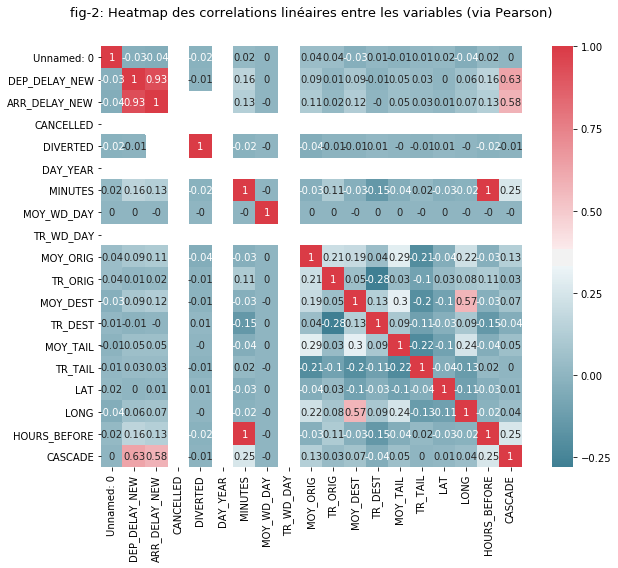

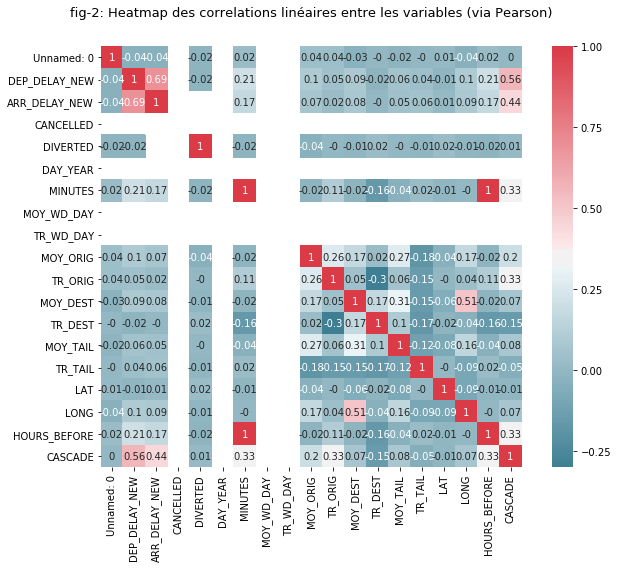

In [13]:
f, ax = plt.subplots(figsize=(10, 8))


corr = DF_MEANS.corr(method='pearson')
#corr = np.around(corr,1)
corr = np.around(corr,2)
sns.heatmap(corr, annot=True ,mask=np.zeros_like((corr), dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.title('fig-2: Heatmap des correlations linéaires entre les variables (via Pearson)',fontsize=13,loc='center', pad = 30)
plt.tight_layout(h_pad=2)
plt.savefig('correlation', dpi=400)
plt.show()

f, ax = plt.subplots(figsize=(10, 8))


corr = DF_MEANS.corr(method='spearman')
#corr = np.around(corr,1)
corr = np.around(corr,2)
sns.heatmap(corr, annot=True ,mask=np.zeros_like((corr), dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.title('fig-2: Heatmap des correlations linéaires entre les variables (via Pearson)',fontsize=13,loc='center', pad = 30)
plt.tight_layout(h_pad=2)
plt.savefig('correlation', dpi=400)
plt.show()


On va donc travailler avec les deux variables (heures et retard moyen de l'aeroport de départ) pour créer une nouvelle variable "CASCADE", cette variable n'est rien d'autre que le retard moyen par ville de départ dans les deux heures qui précédent le vol.

In [16]:
print (DF_MEANS.columns[:])

Index(['Unnamed: 0', 'CRS_DEP_TIME', 'DEP_DELAY_NEW', 'ARR_DELAY_NEW',
       'CANCELLED', 'DIVERTED', 'ORIGIN_CITY_NAME', 'DEST_CITY_NAME',
       'TAIL_NUM', 'CRS_ARR_TIME', 'DISTANCE', 'AIR_TIME', 'DAY', 'DAY_YEAR',
       'MINUTES', 'MOY_WD_DAY', 'TR_WD_DAY', 'MOY_ORIG', 'TR_ORIG', 'MOY_DEST',
       'TR_DEST', 'MOY_TAIL', 'TR_TAIL', 'LAT_DEP', 'LONG_DEP', 'LAT_ARR',
       'LONG_ARR', 'HOURS_BEFORE', 'CASCADE', 'MINUTES_ARR', 'CASCADE_AER'],
      dtype='object')


In [22]:
# enlever la première colonne
DF_MEANS = DF_MEANS.drop(columns = ['Unnamed: 0'])


In [9]:
print (DF_MEANS.shape)

(5635754, 26)


In [32]:
# réduire le nombre d'exemple pour encoder plus facilement 
DF_MEANS = DF_MEANS.copy()
m = DF_MEANS.shape[0]
DF_MEANS = DF_MEANS.iloc[0:int(np.around(m/10)),:]
print (DF_MEANS.shape)

(563575, 27)


In [33]:
# Créer une colonne heure 

# on enleve 120minutes 
DF_MEANS['HOURS_BEFORE'] = (DF_MEANS['MINUTES'] - 120)
# la variable hours before (qui se mesure en minute) ne peut être inferieur à 0
DF_MEANS.loc[:,'HOURS_BEFORE'][DF_MEANS['HOURS_BEFORE'] < 0] = 0




In [34]:
# convertir les données heures et en minustes 
ind_date = DF_MEANS.columns.get_loc('CRS_ARR_TIME')

DF_MEANS['MINUTES_ARR'] = (DF_MEANS.iloc[:,ind_date]/100)%2
DF_MEANS.loc[:,'MINUTES_ARR'][DF_MEANS['MINUTES_ARR']>=1] = DF_MEANS.loc[:,'MINUTES_ARR'][DF_MEANS['MINUTES_ARR']>=1] - 1

DF_MEANS['MINUTES_ARR'] = DF_MEANS['MINUTES_ARR'] + np.around(DF_MEANS.iloc[:,ind_date]/100)*60
print (DF_MEANS.shape)


(563575, 29)


In [26]:
# on choisit de ne garder que les retards de moins de 200mins 
print (DF_MEANS.shape[0])
DF_MEANS = DF_MEANS[DF_MEANS['DEP_DELAY_NEW'] < 200]
print (DF_MEANS.shape[0])

563575
553114


In [13]:
# pour un vol donné, on ne garde uniquement les vols du même jour de l'année, du même aeroport de départ et 
# dont la valeur de la variable minutes est compris entre la valeur de la variable minutes du vol orginal et la variable
# "hours_before" du vol original.
df = DF_MEANS.copy()
valeur_orig = plot_value_counts(col_name='ORIGIN_CITY_NAME')




(306, 1)


In [35]:
ind_dep = DF_MEANS.columns.get_loc('DEP_DELAY_NEW')
ind_min = DF_MEANS.columns.get_loc('MINUTES')
ind_hb = DF_MEANS.columns.get_loc('HOURS_BEFORE')
ind_day = DF_MEANS.columns.get_loc('DAY_YEAR')
ind_orig = DF_MEANS.columns.get_loc('ORIGIN_CITY_NAME')

# créer une colonne de retard moyen en fonction du jour du week end 
# créer un vecteur numpy 0
vect= np.zeros(DF_MEANS.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_MEANS['CASCADE'] = vect[:]
print (DF_MEANS.shape)
# travailler sur la moitier de l'année 
#DF_MEANS2 = DF_MEANS[(DF_MEANS['DAY_YEAR'] == 145)]#|(DF_MEANS['DAY_YEAR'] == 30)|(DF_MEANS['DAY_YEAR'] == 63)|(DF_MEANS['DAY_YEAR'] == 81)|(DF_MEANS['DAY_YEAR'] == 125)|(DF_MEANS['DAY_YEAR'] == 206)|(DF_MEANS['DAY_YEAR'] == 252)|(DF_MEANS['DAY_YEAR'] == 278)|(DF_MEANS['DAY_YEAR'] == 318)|(DF_MEANS['DAY_YEAR'] == 357)]
DF_MEANS2 = DF_MEANS[DF_MEANS['DAY_YEAR'] < 185]

print (DF_MEANS2.shape)
for i in range (DF_MEANS2.shape[0]):
    print ('____________________')
    print(i)           
    DF_MEANS2.loc[:,'CASCADE'][(DF_MEANS2['DAY_YEAR'] == DF_MEANS2.iloc[i,ind_day]) & (DF_MEANS2['ORIGIN_CITY_NAME']==  DF_MEANS2.iloc[i,ind_orig]) & (DF_MEANS2['HOURS_BEFORE'] <= DF_MEANS2.iloc[i,ind_min]) & (DF_MEANS2['HOURS_BEFORE'] > DF_MEANS2.iloc[i,ind_hb])] = DF_MEANS2.iloc[:,ind_dep][(DF_MEANS2['DAY_YEAR'] == DF_MEANS2.iloc[i,ind_day]) & (DF_MEANS2['ORIGIN_CITY_NAME']== DF_MEANS2.iloc[i,ind_orig]) & (DF_MEANS2['HOURS_BEFORE'] <= DF_MEANS2.iloc[i,ind_min])  & (DF_MEANS2['HOURS_BEFORE'] > DF_MEANS2.iloc[i,ind_hb])].mean(axis=0)


(563575, 30)
(283203, 30)
____________________
0
____________________
1
____________________
2
____________________
3
____________________
4
____________________
5
____________________
6
____________________
7
____________________
8
____________________
9
____________________
10
____________________
11
____________________
12
____________________
13
____________________
14
____________________
15
____________________
16
____________________
17
____________________
18
____________________
19
____________________
20
____________________
21
____________________
22
____________________
23
____________________
24
____________________
25
____________________
26
____________________
27
____________________
28
____________________
29
____________________
30
____________________
31
____________________
32
____________________
33
____________________
34
____________________
35
____________________
36
____________________
37
____________________
38
____________________
39
____________________
40


____________________
333
____________________
334
____________________
335
____________________
336
____________________
337
____________________
338
____________________
339
____________________
340
____________________
341
____________________
342
____________________
343
____________________
344
____________________
345
____________________
346
____________________
347
____________________
348
____________________
349
____________________
350
____________________
351
____________________
352
____________________
353
____________________
354
____________________
355
____________________
356
____________________
357
____________________
358
____________________
359
____________________
360
____________________
361
____________________
362
____________________
363
____________________
364
____________________
365
____________________
366
____________________
367
____________________
368
____________________
369
____________________
370
____________________
371
____________________
372


____________________
661
____________________
662
____________________
663
____________________
664
____________________
665
____________________
666
____________________
667
____________________
668
____________________
669
____________________
670
____________________
671
____________________
672
____________________
673
____________________
674
____________________
675
____________________
676
____________________
677
____________________
678
____________________
679
____________________
680
____________________
681
____________________
682
____________________
683
____________________
684
____________________
685
____________________
686
____________________
687
____________________
688
____________________
689
____________________
690
____________________
691
____________________
692
____________________
693
____________________
694
____________________
695
____________________
696
____________________
697
____________________
698
____________________
699
____________________
700


____________________
990
____________________
991
____________________
992
____________________
993
____________________
994
____________________
995
____________________
996
____________________
997
____________________
998
____________________
999
____________________
1000
____________________
1001
____________________
1002
____________________
1003
____________________
1004
____________________
1005
____________________
1006
____________________
1007
____________________
1008
____________________
1009
____________________
1010
____________________
1011
____________________
1012
____________________
1013
____________________
1014
____________________
1015
____________________
1016
____________________
1017
____________________
1018
____________________
1019
____________________
1020
____________________
1021
____________________
1022
____________________
1023
____________________
1024
____________________
1025
____________________
1026
____________________
1027
____________________
1

____________________
1307
____________________
1308
____________________
1309
____________________
1310
____________________
1311
____________________
1312
____________________
1313
____________________
1314
____________________
1315
____________________
1316
____________________
1317
____________________
1318
____________________
1319
____________________
1320
____________________
1321
____________________
1322
____________________
1323
____________________
1324
____________________
1325
____________________
1326
____________________
1327
____________________
1328
____________________
1329
____________________
1330
____________________
1331
____________________
1332
____________________
1333
____________________
1334
____________________
1335
____________________
1336
____________________
1337
____________________
1338
____________________
1339
____________________
1340
____________________
1341
____________________
1342
____________________
1343
____________________
1344
____________

____________________
1623
____________________
1624
____________________
1625
____________________
1626
____________________
1627
____________________
1628
____________________
1629
____________________
1630
____________________
1631
____________________
1632
____________________
1633
____________________
1634
____________________
1635
____________________
1636
____________________
1637
____________________
1638
____________________
1639
____________________
1640
____________________
1641
____________________
1642
____________________
1643
____________________
1644
____________________
1645
____________________
1646
____________________
1647
____________________
1648
____________________
1649
____________________
1650
____________________
1651
____________________
1652
____________________
1653
____________________
1654
____________________
1655
____________________
1656
____________________
1657
____________________
1658
____________________
1659
____________________
1660
____________

____________________
1941
____________________
1942
____________________
1943
____________________
1944
____________________
1945
____________________
1946
____________________
1947
____________________
1948
____________________
1949
____________________
1950
____________________
1951
____________________
1952
____________________
1953
____________________
1954
____________________
1955
____________________
1956
____________________
1957
____________________
1958
____________________
1959
____________________
1960
____________________
1961
____________________
1962
____________________
1963
____________________
1964
____________________
1965
____________________
1966
____________________
1967
____________________
1968
____________________
1969
____________________
1970
____________________
1971
____________________
1972
____________________
1973
____________________
1974
____________________
1975
____________________
1976
____________________
1977
____________________
1978
____________

____________________
2258
____________________
2259
____________________
2260
____________________
2261
____________________
2262
____________________
2263
____________________
2264
____________________
2265
____________________
2266
____________________
2267
____________________
2268
____________________
2269
____________________
2270
____________________
2271
____________________
2272
____________________
2273
____________________
2274
____________________
2275
____________________
2276
____________________
2277
____________________
2278
____________________
2279
____________________
2280
____________________
2281
____________________
2282
____________________
2283
____________________
2284
____________________
2285
____________________
2286
____________________
2287
____________________
2288
____________________
2289
____________________
2290
____________________
2291
____________________
2292
____________________
2293
____________________
2294
____________________
2295
____________

____________________
2576
____________________
2577
____________________
2578
____________________
2579
____________________
2580
____________________
2581
____________________
2582
____________________
2583
____________________
2584
____________________
2585
____________________
2586
____________________
2587
____________________
2588
____________________
2589
____________________
2590
____________________
2591
____________________
2592
____________________
2593
____________________
2594
____________________
2595
____________________
2596
____________________
2597
____________________
2598
____________________
2599
____________________
2600
____________________
2601
____________________
2602
____________________
2603
____________________
2604
____________________
2605
____________________
2606
____________________
2607
____________________
2608
____________________
2609
____________________
2610
____________________
2611
____________________
2612
____________________
2613
____________

____________________
2894
____________________
2895
____________________
2896
____________________
2897
____________________
2898
____________________
2899
____________________
2900
____________________
2901
____________________
2902
____________________
2903
____________________
2904
____________________
2905
____________________
2906
____________________
2907
____________________
2908
____________________
2909
____________________
2910
____________________
2911
____________________
2912
____________________
2913
____________________
2914
____________________
2915
____________________
2916
____________________
2917
____________________
2918
____________________
2919
____________________
2920
____________________
2921
____________________
2922
____________________
2923
____________________
2924
____________________
2925
____________________
2926
____________________
2927
____________________
2928
____________________
2929
____________________
2930
____________________
2931
____________

____________________
3212
____________________
3213
____________________
3214
____________________
3215
____________________
3216
____________________
3217
____________________
3218
____________________
3219
____________________
3220
____________________
3221
____________________
3222
____________________
3223
____________________
3224
____________________
3225
____________________
3226
____________________
3227
____________________
3228
____________________
3229
____________________
3230
____________________
3231
____________________
3232
____________________
3233
____________________
3234
____________________
3235
____________________
3236
____________________
3237
____________________
3238
____________________
3239
____________________
3240
____________________
3241
____________________
3242
____________________
3243
____________________
3244
____________________
3245
____________________
3246
____________________
3247
____________________
3248
____________________
3249
____________

____________________
3529
____________________
3530
____________________
3531
____________________
3532
____________________
3533
____________________
3534
____________________
3535
____________________
3536
____________________
3537
____________________
3538
____________________
3539
____________________
3540
____________________
3541
____________________
3542
____________________
3543
____________________
3544
____________________
3545
____________________
3546
____________________
3547
____________________
3548
____________________
3549
____________________
3550
____________________
3551
____________________
3552
____________________
3553
____________________
3554
____________________
3555
____________________
3556
____________________
3557
____________________
3558
____________________
3559
____________________
3560
____________________
3561
____________________
3562
____________________
3563
____________________
3564
____________________
3565
____________________
3566
____________

____________________
3846
____________________
3847
____________________
3848
____________________
3849
____________________
3850
____________________
3851
____________________
3852
____________________
3853
____________________
3854
____________________
3855
____________________
3856
____________________
3857
____________________
3858
____________________
3859
____________________
3860
____________________
3861
____________________
3862
____________________
3863
____________________
3864
____________________
3865
____________________
3866
____________________
3867
____________________
3868
____________________
3869
____________________
3870
____________________
3871
____________________
3872
____________________
3873
____________________
3874
____________________
3875
____________________
3876
____________________
3877
____________________
3878
____________________
3879
____________________
3880
____________________
3881
____________________
3882
____________________
3883
____________

____________________
4162
____________________
4163
____________________
4164
____________________
4165
____________________
4166
____________________
4167
____________________
4168
____________________
4169
____________________
4170
____________________
4171
____________________
4172
____________________
4173
____________________
4174
____________________
4175
____________________
4176
____________________
4177
____________________
4178
____________________
4179
____________________
4180
____________________
4181
____________________
4182
____________________
4183
____________________
4184
____________________
4185
____________________
4186
____________________
4187
____________________
4188
____________________
4189
____________________
4190
____________________
4191
____________________
4192
____________________
4193
____________________
4194
____________________
4195
____________________
4196
____________________
4197
____________________
4198
____________________
4199
____________

____________________
4478
____________________
4479
____________________
4480
____________________
4481
____________________
4482
____________________
4483
____________________
4484
____________________
4485
____________________
4486
____________________
4487
____________________
4488
____________________
4489
____________________
4490
____________________
4491
____________________
4492
____________________
4493
____________________
4494
____________________
4495
____________________
4496
____________________
4497
____________________
4498
____________________
4499
____________________
4500
____________________
4501
____________________
4502
____________________
4503
____________________
4504
____________________
4505
____________________
4506
____________________
4507
____________________
4508
____________________
4509
____________________
4510
____________________
4511
____________________
4512
____________________
4513
____________________
4514
____________________
4515
____________

____________________
4794
____________________
4795
____________________
4796
____________________
4797
____________________
4798
____________________
4799
____________________
4800
____________________
4801
____________________
4802
____________________
4803
____________________
4804
____________________
4805
____________________
4806
____________________
4807
____________________
4808
____________________
4809
____________________
4810
____________________
4811
____________________
4812
____________________
4813
____________________
4814
____________________
4815
____________________
4816
____________________
4817
____________________
4818
____________________
4819
____________________
4820
____________________
4821
____________________
4822
____________________
4823
____________________
4824
____________________
4825
____________________
4826
____________________
4827
____________________
4828
____________________
4829
____________________
4830
____________________
4831
____________

____________________
5110
____________________
5111
____________________
5112
____________________
5113
____________________
5114
____________________
5115
____________________
5116
____________________
5117
____________________
5118
____________________
5119
____________________
5120
____________________
5121
____________________
5122
____________________
5123
____________________
5124
____________________
5125
____________________
5126
____________________
5127
____________________
5128
____________________
5129
____________________
5130
____________________
5131
____________________
5132
____________________
5133
____________________
5134
____________________
5135
____________________
5136
____________________
5137
____________________
5138
____________________
5139
____________________
5140
____________________
5141
____________________
5142
____________________
5143
____________________
5144
____________________
5145
____________________
5146
____________________
5147
____________

____________________
5426
____________________
5427
____________________
5428
____________________
5429
____________________
5430
____________________
5431
____________________
5432
____________________
5433
____________________
5434
____________________
5435
____________________
5436
____________________
5437
____________________
5438
____________________
5439
____________________
5440
____________________
5441
____________________
5442
____________________
5443
____________________
5444
____________________
5445
____________________
5446
____________________
5447
____________________
5448
____________________
5449
____________________
5450
____________________
5451
____________________
5452
____________________
5453
____________________
5454
____________________
5455
____________________
5456
____________________
5457
____________________
5458
____________________
5459
____________________
5460
____________________
5461
____________________
5462
____________________
5463
____________

____________________
5744
____________________
5745
____________________
5746
____________________
5747
____________________
5748
____________________
5749
____________________
5750
____________________
5751
____________________
5752
____________________
5753
____________________
5754
____________________
5755
____________________
5756
____________________
5757
____________________
5758
____________________
5759
____________________
5760
____________________
5761
____________________
5762
____________________
5763
____________________
5764
____________________
5765
____________________
5766
____________________
5767
____________________
5768
____________________
5769
____________________
5770
____________________
5771
____________________
5772
____________________
5773
____________________
5774
____________________
5775
____________________
5776
____________________
5777
____________________
5778
____________________
5779
____________________
5780
____________________
5781
____________

____________________
6061
____________________
6062
____________________
6063
____________________
6064
____________________
6065
____________________
6066
____________________
6067
____________________
6068
____________________
6069
____________________
6070
____________________
6071
____________________
6072
____________________
6073
____________________
6074
____________________
6075
____________________
6076
____________________
6077
____________________
6078
____________________
6079
____________________
6080
____________________
6081
____________________
6082
____________________
6083
____________________
6084
____________________
6085
____________________
6086
____________________
6087
____________________
6088
____________________
6089
____________________
6090
____________________
6091
____________________
6092
____________________
6093
____________________
6094
____________________
6095
____________________
6096
____________________
6097
____________________
6098
____________

____________________
6379
____________________
6380
____________________
6381
____________________
6382
____________________
6383
____________________
6384
____________________
6385
____________________
6386
____________________
6387
____________________
6388
____________________
6389
____________________
6390
____________________
6391
____________________
6392
____________________
6393
____________________
6394
____________________
6395
____________________
6396
____________________
6397
____________________
6398
____________________
6399
____________________
6400
____________________
6401
____________________
6402
____________________
6403
____________________
6404
____________________
6405
____________________
6406
____________________
6407
____________________
6408
____________________
6409
____________________
6410
____________________
6411
____________________
6412
____________________
6413
____________________
6414
____________________
6415
____________________
6416
____________

____________________
6696
____________________
6697
____________________
6698
____________________
6699
____________________
6700
____________________
6701
____________________
6702
____________________
6703
____________________
6704
____________________
6705
____________________
6706
____________________
6707
____________________
6708
____________________
6709
____________________
6710
____________________
6711
____________________
6712
____________________
6713
____________________
6714
____________________
6715
____________________
6716
____________________
6717
____________________
6718
____________________
6719
____________________
6720
____________________
6721
____________________
6722
____________________
6723
____________________
6724
____________________
6725
____________________
6726
____________________
6727
____________________
6728
____________________
6729
____________________
6730
____________________
6731
____________________
6732
____________________
6733
____________

____________________
7012
____________________
7013
____________________
7014
____________________
7015
____________________
7016
____________________
7017
____________________
7018
____________________
7019
____________________
7020
____________________
7021
____________________
7022
____________________
7023
____________________
7024
____________________
7025
____________________
7026
____________________
7027
____________________
7028
____________________
7029
____________________
7030
____________________
7031
____________________
7032
____________________
7033
____________________
7034
____________________
7035
____________________
7036
____________________
7037
____________________
7038
____________________
7039
____________________
7040
____________________
7041
____________________
7042
____________________
7043
____________________
7044
____________________
7045
____________________
7046
____________________
7047
____________________
7048
____________________
7049
____________

____________________
7328
____________________
7329
____________________
7330
____________________
7331
____________________
7332
____________________
7333
____________________
7334
____________________
7335
____________________
7336
____________________
7337
____________________
7338
____________________
7339
____________________
7340
____________________
7341
____________________
7342
____________________
7343
____________________
7344
____________________
7345
____________________
7346
____________________
7347
____________________
7348
____________________
7349
____________________
7350
____________________
7351
____________________
7352
____________________
7353
____________________
7354
____________________
7355
____________________
7356
____________________
7357
____________________
7358
____________________
7359
____________________
7360
____________________
7361
____________________
7362
____________________
7363
____________________
7364
____________________
7365
____________

____________________
7646
____________________
7647
____________________
7648
____________________
7649
____________________
7650
____________________
7651
____________________
7652
____________________
7653
____________________
7654
____________________
7655
____________________
7656
____________________
7657
____________________
7658
____________________
7659
____________________
7660
____________________
7661
____________________
7662
____________________
7663
____________________
7664
____________________
7665
____________________
7666
____________________
7667
____________________
7668
____________________
7669
____________________
7670
____________________
7671
____________________
7672
____________________
7673
____________________
7674
____________________
7675
____________________
7676
____________________
7677
____________________
7678
____________________
7679
____________________
7680
____________________
7681
____________________
7682
____________________
7683
____________

____________________
7963
____________________
7964
____________________
7965
____________________
7966
____________________
7967
____________________
7968
____________________
7969
____________________
7970
____________________
7971
____________________
7972
____________________
7973
____________________
7974
____________________
7975
____________________
7976
____________________
7977
____________________
7978
____________________
7979
____________________
7980
____________________
7981
____________________
7982
____________________
7983
____________________
7984
____________________
7985
____________________
7986
____________________
7987
____________________
7988
____________________
7989
____________________
7990
____________________
7991
____________________
7992
____________________
7993
____________________
7994
____________________
7995
____________________
7996
____________________
7997
____________________
7998
____________________
7999
____________________
8000
____________

____________________
8281
____________________
8282
____________________
8283
____________________
8284
____________________
8285
____________________
8286
____________________
8287
____________________
8288
____________________
8289
____________________
8290
____________________
8291
____________________
8292
____________________
8293
____________________
8294
____________________
8295
____________________
8296
____________________
8297
____________________
8298
____________________
8299
____________________
8300
____________________
8301
____________________
8302
____________________
8303
____________________
8304
____________________
8305
____________________
8306
____________________
8307
____________________
8308
____________________
8309
____________________
8310
____________________
8311
____________________
8312
____________________
8313
____________________
8314
____________________
8315
____________________
8316
____________________
8317
____________________
8318
____________

____________________
8597
____________________
8598
____________________
8599
____________________
8600
____________________
8601
____________________
8602
____________________
8603
____________________
8604
____________________
8605
____________________
8606
____________________
8607
____________________
8608
____________________
8609
____________________
8610
____________________
8611
____________________
8612
____________________
8613
____________________
8614
____________________
8615
____________________
8616
____________________
8617
____________________
8618
____________________
8619
____________________
8620
____________________
8621
____________________
8622
____________________
8623
____________________
8624
____________________
8625
____________________
8626
____________________
8627
____________________
8628
____________________
8629
____________________
8630
____________________
8631
____________________
8632
____________________
8633
____________________
8634
____________

____________________
8915
____________________
8916
____________________
8917
____________________
8918
____________________
8919
____________________
8920
____________________
8921
____________________
8922
____________________
8923
____________________
8924
____________________
8925
____________________
8926
____________________
8927
____________________
8928
____________________
8929
____________________
8930
____________________
8931
____________________
8932
____________________
8933
____________________
8934
____________________
8935
____________________
8936
____________________
8937
____________________
8938
____________________
8939
____________________
8940
____________________
8941
____________________
8942
____________________
8943
____________________
8944
____________________
8945
____________________
8946
____________________
8947
____________________
8948
____________________
8949
____________________
8950
____________________
8951
____________________
8952
____________

____________________
9232
____________________
9233
____________________
9234
____________________
9235
____________________
9236
____________________
9237
____________________
9238
____________________
9239
____________________
9240
____________________
9241
____________________
9242
____________________
9243
____________________
9244
____________________
9245
____________________
9246
____________________
9247
____________________
9248
____________________
9249
____________________
9250
____________________
9251
____________________
9252
____________________
9253
____________________
9254
____________________
9255
____________________
9256
____________________
9257
____________________
9258
____________________
9259
____________________
9260
____________________
9261
____________________
9262
____________________
9263
____________________
9264
____________________
9265
____________________
9266
____________________
9267
____________________
9268
____________________
9269
____________

____________________
9549
____________________
9550
____________________
9551
____________________
9552
____________________
9553
____________________
9554
____________________
9555
____________________
9556
____________________
9557
____________________
9558
____________________
9559
____________________
9560
____________________
9561
____________________
9562
____________________
9563
____________________
9564
____________________
9565
____________________
9566
____________________
9567
____________________
9568
____________________
9569
____________________
9570
____________________
9571
____________________
9572
____________________
9573
____________________
9574
____________________
9575
____________________
9576
____________________
9577
____________________
9578
____________________
9579
____________________
9580
____________________
9581
____________________
9582
____________________
9583
____________________
9584
____________________
9585
____________________
9586
____________

____________________
9867
____________________
9868
____________________
9869
____________________
9870
____________________
9871
____________________
9872
____________________
9873
____________________
9874
____________________
9875
____________________
9876
____________________
9877
____________________
9878
____________________
9879
____________________
9880
____________________
9881
____________________
9882
____________________
9883
____________________
9884
____________________
9885
____________________
9886
____________________
9887
____________________
9888
____________________
9889
____________________
9890
____________________
9891
____________________
9892
____________________
9893
____________________
9894
____________________
9895
____________________
9896
____________________
9897
____________________
9898
____________________
9899
____________________
9900
____________________
9901
____________________
9902
____________________
9903
____________________
9904
____________

____________________
10178
____________________
10179
____________________
10180
____________________
10181
____________________
10182
____________________
10183
____________________
10184
____________________
10185
____________________
10186
____________________
10187
____________________
10188
____________________
10189
____________________
10190
____________________
10191
____________________
10192
____________________
10193
____________________
10194
____________________
10195
____________________
10196
____________________
10197
____________________
10198
____________________
10199
____________________
10200
____________________
10201
____________________
10202
____________________
10203
____________________
10204
____________________
10205
____________________
10206
____________________
10207
____________________
10208
____________________
10209
____________________
10210
____________________
10211
____________________
10212
____________________
10213
____________________
10214
_

____________________
10484
____________________
10485
____________________
10486
____________________
10487
____________________
10488
____________________
10489
____________________
10490
____________________
10491
____________________
10492
____________________
10493
____________________
10494
____________________
10495
____________________
10496
____________________
10497
____________________
10498
____________________
10499
____________________
10500
____________________
10501
____________________
10502
____________________
10503
____________________
10504
____________________
10505
____________________
10506
____________________
10507
____________________
10508
____________________
10509
____________________
10510
____________________
10511
____________________
10512
____________________
10513
____________________
10514
____________________
10515
____________________
10516
____________________
10517
____________________
10518
____________________
10519
____________________
10520
_

____________________
10790
____________________
10791
____________________
10792
____________________
10793
____________________
10794
____________________
10795
____________________
10796
____________________
10797
____________________
10798
____________________
10799
____________________
10800
____________________
10801
____________________
10802
____________________
10803
____________________
10804
____________________
10805
____________________
10806
____________________
10807
____________________
10808
____________________
10809
____________________
10810
____________________
10811
____________________
10812
____________________
10813
____________________
10814
____________________
10815
____________________
10816
____________________
10817
____________________
10818
____________________
10819
____________________
10820
____________________
10821
____________________
10822
____________________
10823
____________________
10824
____________________
10825
____________________
10826
_

____________________
11096
____________________
11097
____________________
11098
____________________
11099
____________________
11100
____________________
11101
____________________
11102
____________________
11103
____________________
11104
____________________
11105
____________________
11106
____________________
11107
____________________
11108
____________________
11109
____________________
11110
____________________
11111
____________________
11112
____________________
11113
____________________
11114
____________________
11115
____________________
11116
____________________
11117
____________________
11118
____________________
11119
____________________
11120
____________________
11121
____________________
11122
____________________
11123
____________________
11124
____________________
11125
____________________
11126
____________________
11127
____________________
11128
____________________
11129
____________________
11130
____________________
11131
____________________
11132
_

____________________
11402
____________________
11403
____________________
11404
____________________
11405
____________________
11406
____________________
11407
____________________
11408
____________________
11409
____________________
11410
____________________
11411
____________________
11412
____________________
11413
____________________
11414
____________________
11415
____________________
11416
____________________
11417
____________________
11418
____________________
11419
____________________
11420
____________________
11421
____________________
11422
____________________
11423
____________________
11424
____________________
11425
____________________
11426
____________________
11427
____________________
11428
____________________
11429
____________________
11430
____________________
11431
____________________
11432
____________________
11433
____________________
11434
____________________
11435
____________________
11436
____________________
11437
____________________
11438
_

____________________
11706
____________________
11707
____________________
11708
____________________
11709
____________________
11710
____________________
11711
____________________
11712
____________________
11713
____________________
11714
____________________
11715
____________________
11716
____________________
11717
____________________
11718
____________________
11719
____________________
11720
____________________
11721
____________________
11722
____________________
11723
____________________
11724
____________________
11725
____________________
11726
____________________
11727
____________________
11728
____________________
11729
____________________
11730
____________________
11731
____________________
11732
____________________
11733
____________________
11734
____________________
11735
____________________
11736
____________________
11737
____________________
11738
____________________
11739
____________________
11740
____________________
11741
____________________
11742
_

____________________
12012
____________________
12013
____________________
12014
____________________
12015
____________________
12016
____________________
12017
____________________
12018
____________________
12019
____________________
12020
____________________
12021
____________________
12022
____________________
12023
____________________
12024
____________________
12025
____________________
12026
____________________
12027
____________________
12028
____________________
12029
____________________
12030
____________________
12031
____________________
12032
____________________
12033
____________________
12034
____________________
12035
____________________
12036
____________________
12037
____________________
12038
____________________
12039
____________________
12040
____________________
12041
____________________
12042
____________________
12043
____________________
12044
____________________
12045
____________________
12046
____________________
12047
____________________
12048
_

____________________
12318
____________________
12319
____________________
12320
____________________
12321
____________________
12322
____________________
12323
____________________
12324
____________________
12325
____________________
12326
____________________
12327
____________________
12328
____________________
12329
____________________
12330
____________________
12331
____________________
12332
____________________
12333
____________________
12334
____________________
12335
____________________
12336
____________________
12337
____________________
12338
____________________
12339
____________________
12340
____________________
12341
____________________
12342
____________________
12343
____________________
12344
____________________
12345
____________________
12346
____________________
12347
____________________
12348
____________________
12349
____________________
12350
____________________
12351
____________________
12352
____________________
12353
____________________
12354
_

____________________
12624
____________________
12625
____________________
12626
____________________
12627
____________________
12628
____________________
12629
____________________
12630
____________________
12631
____________________
12632
____________________
12633
____________________
12634
____________________
12635
____________________
12636
____________________
12637
____________________
12638
____________________
12639
____________________
12640
____________________
12641
____________________
12642
____________________
12643
____________________
12644
____________________
12645
____________________
12646
____________________
12647
____________________
12648
____________________
12649
____________________
12650
____________________
12651
____________________
12652
____________________
12653
____________________
12654
____________________
12655
____________________
12656
____________________
12657
____________________
12658
____________________
12659
____________________
12660
_

____________________
12930
____________________
12931
____________________
12932
____________________
12933
____________________
12934
____________________
12935
____________________
12936
____________________
12937
____________________
12938
____________________
12939
____________________
12940
____________________
12941
____________________
12942
____________________
12943
____________________
12944
____________________
12945
____________________
12946
____________________
12947
____________________
12948
____________________
12949
____________________
12950
____________________
12951
____________________
12952
____________________
12953
____________________
12954
____________________
12955
____________________
12956
____________________
12957
____________________
12958
____________________
12959
____________________
12960
____________________
12961
____________________
12962
____________________
12963
____________________
12964
____________________
12965
____________________
12966
_

____________________
13236
____________________
13237
____________________
13238
____________________
13239
____________________
13240
____________________
13241
____________________
13242
____________________
13243
____________________
13244
____________________
13245
____________________
13246
____________________
13247
____________________
13248
____________________
13249
____________________
13250
____________________
13251
____________________
13252
____________________
13253
____________________
13254
____________________
13255
____________________
13256
____________________
13257
____________________
13258
____________________
13259
____________________
13260
____________________
13261
____________________
13262
____________________
13263
____________________
13264
____________________
13265
____________________
13266
____________________
13267
____________________
13268
____________________
13269
____________________
13270
____________________
13271
____________________
13272
_

____________________
13541
____________________
13542
____________________
13543
____________________
13544
____________________
13545
____________________
13546
____________________
13547
____________________
13548
____________________
13549
____________________
13550
____________________
13551
____________________
13552
____________________
13553
____________________
13554
____________________
13555
____________________
13556
____________________
13557
____________________
13558
____________________
13559
____________________
13560
____________________
13561
____________________
13562
____________________
13563
____________________
13564
____________________
13565
____________________
13566
____________________
13567
____________________
13568
____________________
13569
____________________
13570
____________________
13571
____________________
13572
____________________
13573
____________________
13574
____________________
13575
____________________
13576
____________________
13577
_

____________________
13847
____________________
13848
____________________
13849
____________________
13850
____________________
13851
____________________
13852
____________________
13853
____________________
13854
____________________
13855
____________________
13856
____________________
13857
____________________
13858
____________________
13859
____________________
13860
____________________
13861
____________________
13862
____________________
13863
____________________
13864
____________________
13865
____________________
13866
____________________
13867
____________________
13868
____________________
13869
____________________
13870
____________________
13871
____________________
13872
____________________
13873
____________________
13874
____________________
13875
____________________
13876
____________________
13877
____________________
13878
____________________
13879
____________________
13880
____________________
13881
____________________
13882
____________________
13883
_

____________________
14153
____________________
14154
____________________
14155
____________________
14156
____________________
14157
____________________
14158
____________________
14159
____________________
14160
____________________
14161
____________________
14162
____________________
14163
____________________
14164
____________________
14165
____________________
14166
____________________
14167
____________________
14168
____________________
14169
____________________
14170
____________________
14171
____________________
14172
____________________
14173
____________________
14174
____________________
14175
____________________
14176
____________________
14177
____________________
14178
____________________
14179
____________________
14180
____________________
14181
____________________
14182
____________________
14183
____________________
14184
____________________
14185
____________________
14186
____________________
14187
____________________
14188
____________________
14189
_

____________________
14459
____________________
14460
____________________
14461
____________________
14462
____________________
14463
____________________
14464
____________________
14465
____________________
14466
____________________
14467
____________________
14468
____________________
14469
____________________
14470
____________________
14471
____________________
14472
____________________
14473
____________________
14474
____________________
14475
____________________
14476
____________________
14477
____________________
14478
____________________
14479
____________________
14480
____________________
14481
____________________
14482
____________________
14483
____________________
14484
____________________
14485
____________________
14486
____________________
14487
____________________
14488
____________________
14489
____________________
14490
____________________
14491
____________________
14492
____________________
14493
____________________
14494
____________________
14495
_

____________________
14765
____________________
14766
____________________
14767
____________________
14768
____________________
14769
____________________
14770
____________________
14771
____________________
14772
____________________
14773
____________________
14774
____________________
14775
____________________
14776
____________________
14777
____________________
14778
____________________
14779
____________________
14780
____________________
14781
____________________
14782
____________________
14783
____________________
14784
____________________
14785
____________________
14786
____________________
14787
____________________
14788
____________________
14789
____________________
14790
____________________
14791
____________________
14792
____________________
14793
____________________
14794
____________________
14795
____________________
14796
____________________
14797
____________________
14798
____________________
14799
____________________
14800
____________________
14801
_

____________________
15071
____________________
15072
____________________
15073
____________________
15074
____________________
15075
____________________
15076
____________________
15077
____________________
15078
____________________
15079
____________________
15080
____________________
15081
____________________
15082
____________________
15083
____________________
15084
____________________
15085
____________________
15086
____________________
15087
____________________
15088
____________________
15089
____________________
15090
____________________
15091
____________________
15092
____________________
15093
____________________
15094
____________________
15095
____________________
15096
____________________
15097
____________________
15098
____________________
15099
____________________
15100
____________________
15101
____________________
15102
____________________
15103
____________________
15104
____________________
15105
____________________
15106
____________________
15107
_

____________________
15377
____________________
15378
____________________
15379
____________________
15380
____________________
15381
____________________
15382
____________________
15383
____________________
15384
____________________
15385
____________________
15386
____________________
15387
____________________
15388
____________________
15389
____________________
15390
____________________
15391
____________________
15392
____________________
15393
____________________
15394
____________________
15395
____________________
15396
____________________
15397
____________________
15398
____________________
15399
____________________
15400
____________________
15401
____________________
15402
____________________
15403
____________________
15404
____________________
15405
____________________
15406
____________________
15407
____________________
15408
____________________
15409
____________________
15410
____________________
15411
____________________
15412
____________________
15413
_

____________________
15683
____________________
15684
____________________
15685
____________________
15686
____________________
15687
____________________
15688
____________________
15689
____________________
15690
____________________
15691
____________________
15692
____________________
15693
____________________
15694
____________________
15695
____________________
15696
____________________
15697
____________________
15698
____________________
15699
____________________
15700
____________________
15701
____________________
15702
____________________
15703
____________________
15704
____________________
15705
____________________
15706
____________________
15707
____________________
15708
____________________
15709
____________________
15710
____________________
15711
____________________
15712
____________________
15713
____________________
15714
____________________
15715
____________________
15716
____________________
15717
____________________
15718
____________________
15719
_

____________________
15987
____________________
15988
____________________
15989
____________________
15990
____________________
15991
____________________
15992
____________________
15993
____________________
15994
____________________
15995
____________________
15996
____________________
15997
____________________
15998
____________________
15999
____________________
16000
____________________
16001
____________________
16002
____________________
16003
____________________
16004
____________________
16005
____________________
16006
____________________
16007
____________________
16008
____________________
16009
____________________
16010
____________________
16011
____________________
16012
____________________
16013
____________________
16014
____________________
16015
____________________
16016
____________________
16017
____________________
16018
____________________
16019
____________________
16020
____________________
16021
____________________
16022
____________________
16023
_

____________________
16291
____________________
16292
____________________
16293
____________________
16294
____________________
16295
____________________
16296
____________________
16297
____________________
16298
____________________
16299
____________________
16300
____________________
16301
____________________
16302
____________________
16303
____________________
16304
____________________
16305
____________________
16306
____________________
16307
____________________
16308
____________________
16309
____________________
16310
____________________
16311
____________________
16312
____________________
16313
____________________
16314
____________________
16315
____________________
16316
____________________
16317
____________________
16318
____________________
16319
____________________
16320
____________________
16321
____________________
16322
____________________
16323
____________________
16324
____________________
16325
____________________
16326
____________________
16327
_

____________________
16596
____________________
16597
____________________
16598
____________________
16599
____________________
16600
____________________
16601
____________________
16602
____________________
16603
____________________
16604
____________________
16605
____________________
16606
____________________
16607
____________________
16608
____________________
16609
____________________
16610
____________________
16611
____________________
16612
____________________
16613
____________________
16614
____________________
16615
____________________
16616
____________________
16617
____________________
16618
____________________
16619
____________________
16620
____________________
16621
____________________
16622
____________________
16623
____________________
16624
____________________
16625
____________________
16626
____________________
16627
____________________
16628
____________________
16629
____________________
16630
____________________
16631
____________________
16632
_

____________________
16900
____________________
16901
____________________
16902
____________________
16903
____________________
16904
____________________
16905
____________________
16906
____________________
16907
____________________
16908
____________________
16909
____________________
16910
____________________
16911
____________________
16912
____________________
16913
____________________
16914
____________________
16915
____________________
16916
____________________
16917
____________________
16918
____________________
16919
____________________
16920
____________________
16921
____________________
16922
____________________
16923
____________________
16924
____________________
16925
____________________
16926
____________________
16927
____________________
16928
____________________
16929
____________________
16930
____________________
16931
____________________
16932
____________________
16933
____________________
16934
____________________
16935
____________________
16936
_

____________________
17206
____________________
17207
____________________
17208
____________________
17209
____________________
17210
____________________
17211
____________________
17212
____________________
17213
____________________
17214
____________________
17215
____________________
17216
____________________
17217
____________________
17218
____________________
17219
____________________
17220
____________________
17221
____________________
17222
____________________
17223
____________________
17224
____________________
17225
____________________
17226
____________________
17227
____________________
17228
____________________
17229
____________________
17230
____________________
17231
____________________
17232
____________________
17233
____________________
17234
____________________
17235
____________________
17236
____________________
17237
____________________
17238
____________________
17239
____________________
17240
____________________
17241
____________________
17242
_

____________________
17511
____________________
17512
____________________
17513
____________________
17514
____________________
17515
____________________
17516
____________________
17517
____________________
17518
____________________
17519
____________________
17520
____________________
17521
____________________
17522
____________________
17523
____________________
17524
____________________
17525
____________________
17526
____________________
17527
____________________
17528
____________________
17529
____________________
17530
____________________
17531
____________________
17532
____________________
17533
____________________
17534
____________________
17535
____________________
17536
____________________
17537
____________________
17538
____________________
17539
____________________
17540
____________________
17541
____________________
17542
____________________
17543
____________________
17544
____________________
17545
____________________
17546
____________________
17547
_

____________________
17817
____________________
17818
____________________
17819
____________________
17820
____________________
17821
____________________
17822
____________________
17823
____________________
17824
____________________
17825
____________________
17826
____________________
17827
____________________
17828
____________________
17829
____________________
17830
____________________
17831
____________________
17832
____________________
17833
____________________
17834
____________________
17835
____________________
17836
____________________
17837
____________________
17838
____________________
17839
____________________
17840
____________________
17841
____________________
17842
____________________
17843
____________________
17844
____________________
17845
____________________
17846
____________________
17847
____________________
17848
____________________
17849
____________________
17850
____________________
17851
____________________
17852
____________________
17853
_

____________________
18123
____________________
18124
____________________
18125
____________________
18126
____________________
18127
____________________
18128
____________________
18129
____________________
18130
____________________
18131
____________________
18132
____________________
18133
____________________
18134
____________________
18135
____________________
18136
____________________
18137
____________________
18138
____________________
18139
____________________
18140
____________________
18141
____________________
18142
____________________
18143
____________________
18144
____________________
18145
____________________
18146
____________________
18147
____________________
18148
____________________
18149
____________________
18150
____________________
18151
____________________
18152
____________________
18153
____________________
18154
____________________
18155
____________________
18156
____________________
18157
____________________
18158
____________________
18159
_

____________________
18429
____________________
18430
____________________
18431
____________________
18432
____________________
18433
____________________
18434
____________________
18435
____________________
18436
____________________
18437
____________________
18438
____________________
18439
____________________
18440
____________________
18441
____________________
18442
____________________
18443
____________________
18444
____________________
18445
____________________
18446
____________________
18447
____________________
18448
____________________
18449
____________________
18450
____________________
18451
____________________
18452
____________________
18453
____________________
18454
____________________
18455
____________________
18456
____________________
18457
____________________
18458
____________________
18459
____________________
18460
____________________
18461
____________________
18462
____________________
18463
____________________
18464
____________________
18465
_

____________________
18734
____________________
18735
____________________
18736
____________________
18737
____________________
18738
____________________
18739
____________________
18740
____________________
18741
____________________
18742
____________________
18743
____________________
18744
____________________
18745
____________________
18746
____________________
18747
____________________
18748
____________________
18749
____________________
18750
____________________
18751
____________________
18752
____________________
18753
____________________
18754
____________________
18755
____________________
18756
____________________
18757
____________________
18758
____________________
18759
____________________
18760
____________________
18761
____________________
18762
____________________
18763
____________________
18764
____________________
18765
____________________
18766
____________________
18767
____________________
18768
____________________
18769
____________________
18770
_

____________________
19040
____________________
19041
____________________
19042
____________________
19043
____________________
19044
____________________
19045
____________________
19046
____________________
19047
____________________
19048
____________________
19049
____________________
19050
____________________
19051
____________________
19052
____________________
19053
____________________
19054
____________________
19055
____________________
19056
____________________
19057
____________________
19058
____________________
19059
____________________
19060
____________________
19061
____________________
19062
____________________
19063
____________________
19064
____________________
19065
____________________
19066
____________________
19067
____________________
19068
____________________
19069
____________________
19070
____________________
19071
____________________
19072
____________________
19073
____________________
19074
____________________
19075
____________________
19076
_

____________________
19346
____________________
19347
____________________
19348
____________________
19349
____________________
19350
____________________
19351
____________________
19352
____________________
19353
____________________
19354
____________________
19355
____________________
19356
____________________
19357
____________________
19358
____________________
19359
____________________
19360
____________________
19361
____________________
19362
____________________
19363
____________________
19364
____________________
19365
____________________
19366
____________________
19367
____________________
19368
____________________
19369
____________________
19370
____________________
19371
____________________
19372
____________________
19373
____________________
19374
____________________
19375
____________________
19376
____________________
19377
____________________
19378
____________________
19379
____________________
19380
____________________
19381
____________________
19382
_

____________________
19650
____________________
19651
____________________
19652
____________________
19653
____________________
19654
____________________
19655
____________________
19656
____________________
19657
____________________
19658
____________________
19659
____________________
19660
____________________
19661
____________________
19662
____________________
19663
____________________
19664
____________________
19665
____________________
19666
____________________
19667
____________________
19668
____________________
19669
____________________
19670
____________________
19671
____________________
19672
____________________
19673
____________________
19674
____________________
19675
____________________
19676
____________________
19677
____________________
19678
____________________
19679
____________________
19680
____________________
19681
____________________
19682
____________________
19683
____________________
19684
____________________
19685
____________________
19686
_

____________________
19955
____________________
19956
____________________
19957
____________________
19958
____________________
19959
____________________
19960
____________________
19961
____________________
19962
____________________
19963
____________________
19964
____________________
19965
____________________
19966
____________________
19967
____________________
19968
____________________
19969
____________________
19970
____________________
19971
____________________
19972
____________________
19973
____________________
19974
____________________
19975
____________________
19976
____________________
19977
____________________
19978
____________________
19979
____________________
19980
____________________
19981
____________________
19982
____________________
19983
____________________
19984
____________________
19985
____________________
19986
____________________
19987
____________________
19988
____________________
19989
____________________
19990
____________________
19991
_

____________________
20259
____________________
20260
____________________
20261
____________________
20262
____________________
20263
____________________
20264
____________________
20265
____________________
20266
____________________
20267
____________________
20268
____________________
20269
____________________
20270
____________________
20271
____________________
20272
____________________
20273
____________________
20274
____________________
20275
____________________
20276
____________________
20277
____________________
20278
____________________
20279
____________________
20280
____________________
20281
____________________
20282
____________________
20283
____________________
20284
____________________
20285
____________________
20286
____________________
20287
____________________
20288
____________________
20289
____________________
20290
____________________
20291
____________________
20292
____________________
20293
____________________
20294
____________________
20295
_

____________________
20564
____________________
20565
____________________
20566
____________________
20567
____________________
20568
____________________
20569
____________________
20570
____________________
20571
____________________
20572
____________________
20573
____________________
20574
____________________
20575
____________________
20576
____________________
20577
____________________
20578
____________________
20579
____________________
20580
____________________
20581
____________________
20582
____________________
20583
____________________
20584
____________________
20585
____________________
20586
____________________
20587
____________________
20588
____________________
20589
____________________
20590
____________________
20591
____________________
20592
____________________
20593
____________________
20594
____________________
20595
____________________
20596
____________________
20597
____________________
20598
____________________
20599
____________________
20600
_

____________________
20869
____________________
20870
____________________
20871
____________________
20872
____________________
20873
____________________
20874
____________________
20875
____________________
20876
____________________
20877
____________________
20878
____________________
20879
____________________
20880
____________________
20881
____________________
20882
____________________
20883
____________________
20884
____________________
20885
____________________
20886
____________________
20887
____________________
20888
____________________
20889
____________________
20890
____________________
20891
____________________
20892
____________________
20893
____________________
20894
____________________
20895
____________________
20896
____________________
20897
____________________
20898
____________________
20899
____________________
20900
____________________
20901
____________________
20902
____________________
20903
____________________
20904
____________________
20905
_

____________________
21174
____________________
21175
____________________
21176
____________________
21177
____________________
21178
____________________
21179
____________________
21180
____________________
21181
____________________
21182
____________________
21183
____________________
21184
____________________
21185
____________________
21186
____________________
21187
____________________
21188
____________________
21189
____________________
21190
____________________
21191
____________________
21192
____________________
21193
____________________
21194
____________________
21195
____________________
21196
____________________
21197
____________________
21198
____________________
21199
____________________
21200
____________________
21201
____________________
21202
____________________
21203
____________________
21204
____________________
21205
____________________
21206
____________________
21207
____________________
21208
____________________
21209
____________________
21210
_

____________________
21479
____________________
21480
____________________
21481
____________________
21482
____________________
21483
____________________
21484
____________________
21485
____________________
21486
____________________
21487
____________________
21488
____________________
21489
____________________
21490
____________________
21491
____________________
21492
____________________
21493
____________________
21494
____________________
21495
____________________
21496
____________________
21497
____________________
21498
____________________
21499
____________________
21500
____________________
21501
____________________
21502
____________________
21503
____________________
21504
____________________
21505
____________________
21506
____________________
21507
____________________
21508
____________________
21509
____________________
21510
____________________
21511
____________________
21512
____________________
21513
____________________
21514
____________________
21515
_

____________________
21785
____________________
21786
____________________
21787
____________________
21788
____________________
21789
____________________
21790
____________________
21791
____________________
21792
____________________
21793
____________________
21794
____________________
21795
____________________
21796
____________________
21797
____________________
21798
____________________
21799
____________________
21800
____________________
21801
____________________
21802
____________________
21803
____________________
21804
____________________
21805
____________________
21806
____________________
21807
____________________
21808
____________________
21809
____________________
21810
____________________
21811
____________________
21812
____________________
21813
____________________
21814
____________________
21815
____________________
21816
____________________
21817
____________________
21818
____________________
21819
____________________
21820
____________________
21821
_

____________________
22091
____________________
22092
____________________
22093
____________________
22094
____________________
22095
____________________
22096
____________________
22097
____________________
22098
____________________
22099
____________________
22100
____________________
22101
____________________
22102
____________________
22103
____________________
22104
____________________
22105
____________________
22106
____________________
22107
____________________
22108
____________________
22109
____________________
22110
____________________
22111
____________________
22112
____________________
22113
____________________
22114
____________________
22115
____________________
22116
____________________
22117
____________________
22118
____________________
22119
____________________
22120
____________________
22121
____________________
22122
____________________
22123
____________________
22124
____________________
22125
____________________
22126
____________________
22127
_

____________________
22397
____________________
22398
____________________
22399
____________________
22400
____________________
22401
____________________
22402
____________________
22403
____________________
22404
____________________
22405
____________________
22406
____________________
22407
____________________
22408
____________________
22409
____________________
22410
____________________
22411
____________________
22412
____________________
22413
____________________
22414
____________________
22415
____________________
22416
____________________
22417
____________________
22418
____________________
22419
____________________
22420
____________________
22421
____________________
22422
____________________
22423
____________________
22424
____________________
22425
____________________
22426
____________________
22427
____________________
22428
____________________
22429
____________________
22430
____________________
22431
____________________
22432
____________________
22433
_

____________________
22703
____________________
22704
____________________
22705
____________________
22706
____________________
22707
____________________
22708
____________________
22709
____________________
22710
____________________
22711
____________________
22712
____________________
22713
____________________
22714
____________________
22715
____________________
22716
____________________
22717
____________________
22718
____________________
22719
____________________
22720
____________________
22721
____________________
22722
____________________
22723
____________________
22724
____________________
22725
____________________
22726
____________________
22727
____________________
22728
____________________
22729
____________________
22730
____________________
22731
____________________
22732
____________________
22733
____________________
22734
____________________
22735
____________________
22736
____________________
22737
____________________
22738
____________________
22739
_

____________________
23008
____________________
23009
____________________
23010
____________________
23011
____________________
23012
____________________
23013
____________________
23014
____________________
23015
____________________
23016
____________________
23017
____________________
23018
____________________
23019
____________________
23020
____________________
23021
____________________
23022
____________________
23023
____________________
23024
____________________
23025
____________________
23026
____________________
23027
____________________
23028
____________________
23029
____________________
23030
____________________
23031
____________________
23032
____________________
23033
____________________
23034
____________________
23035
____________________
23036
____________________
23037
____________________
23038
____________________
23039
____________________
23040
____________________
23041
____________________
23042
____________________
23043
____________________
23044
_

____________________
23314
____________________
23315
____________________
23316
____________________
23317
____________________
23318
____________________
23319
____________________
23320
____________________
23321
____________________
23322
____________________
23323
____________________
23324
____________________
23325
____________________
23326
____________________
23327
____________________
23328
____________________
23329
____________________
23330
____________________
23331
____________________
23332
____________________
23333
____________________
23334
____________________
23335
____________________
23336
____________________
23337
____________________
23338
____________________
23339
____________________
23340
____________________
23341
____________________
23342
____________________
23343
____________________
23344
____________________
23345
____________________
23346
____________________
23347
____________________
23348
____________________
23349
____________________
23350
_

____________________
23619
____________________
23620
____________________
23621
____________________
23622
____________________
23623
____________________
23624
____________________
23625
____________________
23626
____________________
23627
____________________
23628
____________________
23629
____________________
23630
____________________
23631
____________________
23632
____________________
23633
____________________
23634
____________________
23635
____________________
23636
____________________
23637
____________________
23638
____________________
23639
____________________
23640
____________________
23641
____________________
23642
____________________
23643
____________________
23644
____________________
23645
____________________
23646
____________________
23647
____________________
23648
____________________
23649
____________________
23650
____________________
23651
____________________
23652
____________________
23653
____________________
23654
____________________
23655
_

____________________
23925
____________________
23926
____________________
23927
____________________
23928
____________________
23929
____________________
23930
____________________
23931
____________________
23932
____________________
23933
____________________
23934
____________________
23935
____________________
23936
____________________
23937
____________________
23938
____________________
23939
____________________
23940
____________________
23941
____________________
23942
____________________
23943
____________________
23944
____________________
23945
____________________
23946
____________________
23947
____________________
23948
____________________
23949
____________________
23950
____________________
23951
____________________
23952
____________________
23953
____________________
23954
____________________
23955
____________________
23956
____________________
23957
____________________
23958
____________________
23959
____________________
23960
____________________
23961
_

____________________
24230
____________________
24231
____________________
24232
____________________
24233
____________________
24234
____________________
24235
____________________
24236
____________________
24237
____________________
24238
____________________
24239
____________________
24240
____________________
24241
____________________
24242
____________________
24243
____________________
24244
____________________
24245
____________________
24246
____________________
24247
____________________
24248
____________________
24249
____________________
24250
____________________
24251
____________________
24252
____________________
24253
____________________
24254
____________________
24255
____________________
24256
____________________
24257
____________________
24258
____________________
24259
____________________
24260
____________________
24261
____________________
24262
____________________
24263
____________________
24264
____________________
24265
____________________
24266
_

____________________
24535
____________________
24536
____________________
24537
____________________
24538
____________________
24539
____________________
24540
____________________
24541
____________________
24542
____________________
24543
____________________
24544
____________________
24545
____________________
24546
____________________
24547
____________________
24548
____________________
24549
____________________
24550
____________________
24551
____________________
24552
____________________
24553
____________________
24554
____________________
24555
____________________
24556
____________________
24557
____________________
24558
____________________
24559
____________________
24560
____________________
24561
____________________
24562
____________________
24563
____________________
24564
____________________
24565
____________________
24566
____________________
24567
____________________
24568
____________________
24569
____________________
24570
____________________
24571
_

____________________
24841
____________________
24842
____________________
24843
____________________
24844
____________________
24845
____________________
24846
____________________
24847
____________________
24848
____________________
24849
____________________
24850
____________________
24851
____________________
24852
____________________
24853
____________________
24854
____________________
24855
____________________
24856
____________________
24857
____________________
24858
____________________
24859
____________________
24860
____________________
24861
____________________
24862
____________________
24863
____________________
24864
____________________
24865
____________________
24866
____________________
24867
____________________
24868
____________________
24869
____________________
24870
____________________
24871
____________________
24872
____________________
24873
____________________
24874
____________________
24875
____________________
24876
____________________
24877
_

____________________
25147
____________________
25148
____________________
25149
____________________
25150
____________________
25151
____________________
25152
____________________
25153
____________________
25154
____________________
25155
____________________
25156
____________________
25157
____________________
25158
____________________
25159
____________________
25160
____________________
25161
____________________
25162
____________________
25163
____________________
25164
____________________
25165
____________________
25166
____________________
25167
____________________
25168
____________________
25169
____________________
25170
____________________
25171
____________________
25172
____________________
25173
____________________
25174
____________________
25175
____________________
25176
____________________
25177
____________________
25178
____________________
25179
____________________
25180
____________________
25181
____________________
25182
____________________
25183
_

____________________
25453
____________________
25454
____________________
25455
____________________
25456
____________________
25457
____________________
25458
____________________
25459
____________________
25460
____________________
25461
____________________
25462
____________________
25463
____________________
25464
____________________
25465
____________________
25466
____________________
25467
____________________
25468
____________________
25469
____________________
25470
____________________
25471
____________________
25472
____________________
25473
____________________
25474
____________________
25475
____________________
25476
____________________
25477
____________________
25478
____________________
25479
____________________
25480
____________________
25481
____________________
25482
____________________
25483
____________________
25484
____________________
25485
____________________
25486
____________________
25487
____________________
25488
____________________
25489
_

____________________
25759
____________________
25760
____________________
25761
____________________
25762
____________________
25763
____________________
25764
____________________
25765
____________________
25766
____________________
25767
____________________
25768
____________________
25769
____________________
25770
____________________
25771
____________________
25772
____________________
25773
____________________
25774
____________________
25775
____________________
25776
____________________
25777
____________________
25778
____________________
25779
____________________
25780
____________________
25781
____________________
25782
____________________
25783
____________________
25784
____________________
25785
____________________
25786
____________________
25787
____________________
25788
____________________
25789
____________________
25790
____________________
25791
____________________
25792
____________________
25793
____________________
25794
____________________
25795
_

____________________
26065
____________________
26066
____________________
26067
____________________
26068
____________________
26069
____________________
26070
____________________
26071
____________________
26072
____________________
26073
____________________
26074
____________________
26075
____________________
26076
____________________
26077
____________________
26078
____________________
26079
____________________
26080
____________________
26081
____________________
26082
____________________
26083
____________________
26084
____________________
26085
____________________
26086
____________________
26087
____________________
26088
____________________
26089
____________________
26090
____________________
26091
____________________
26092
____________________
26093
____________________
26094
____________________
26095
____________________
26096
____________________
26097
____________________
26098
____________________
26099
____________________
26100
____________________
26101
_

____________________
26370
____________________
26371
____________________
26372
____________________
26373
____________________
26374
____________________
26375
____________________
26376
____________________
26377
____________________
26378
____________________
26379
____________________
26380
____________________
26381
____________________
26382
____________________
26383
____________________
26384
____________________
26385
____________________
26386
____________________
26387
____________________
26388
____________________
26389
____________________
26390
____________________
26391
____________________
26392
____________________
26393
____________________
26394
____________________
26395
____________________
26396
____________________
26397
____________________
26398
____________________
26399
____________________
26400
____________________
26401
____________________
26402
____________________
26403
____________________
26404
____________________
26405
____________________
26406
_

____________________
26675
____________________
26676
____________________
26677
____________________
26678
____________________
26679
____________________
26680
____________________
26681
____________________
26682
____________________
26683
____________________
26684
____________________
26685
____________________
26686
____________________
26687
____________________
26688
____________________
26689
____________________
26690
____________________
26691
____________________
26692
____________________
26693
____________________
26694
____________________
26695
____________________
26696
____________________
26697
____________________
26698
____________________
26699
____________________
26700
____________________
26701
____________________
26702
____________________
26703
____________________
26704
____________________
26705
____________________
26706
____________________
26707
____________________
26708
____________________
26709
____________________
26710
____________________
26711
_

____________________
26981
____________________
26982
____________________
26983
____________________
26984
____________________
26985
____________________
26986
____________________
26987
____________________
26988
____________________
26989
____________________
26990
____________________
26991
____________________
26992
____________________
26993
____________________
26994
____________________
26995
____________________
26996
____________________
26997
____________________
26998
____________________
26999
____________________
27000
____________________
27001
____________________
27002
____________________
27003
____________________
27004
____________________
27005
____________________
27006
____________________
27007
____________________
27008
____________________
27009
____________________
27010
____________________
27011
____________________
27012
____________________
27013
____________________
27014
____________________
27015
____________________
27016
____________________
27017
_

____________________
27285
____________________
27286
____________________
27287
____________________
27288
____________________
27289
____________________
27290
____________________
27291
____________________
27292
____________________
27293
____________________
27294
____________________
27295
____________________
27296
____________________
27297
____________________
27298
____________________
27299
____________________
27300
____________________
27301
____________________
27302
____________________
27303
____________________
27304
____________________
27305
____________________
27306
____________________
27307
____________________
27308
____________________
27309
____________________
27310
____________________
27311
____________________
27312
____________________
27313
____________________
27314
____________________
27315
____________________
27316
____________________
27317
____________________
27318
____________________
27319
____________________
27320
____________________
27321
_

____________________
27590
____________________
27591
____________________
27592
____________________
27593
____________________
27594
____________________
27595
____________________
27596
____________________
27597
____________________
27598
____________________
27599
____________________
27600
____________________
27601
____________________
27602
____________________
27603
____________________
27604
____________________
27605
____________________
27606
____________________
27607
____________________
27608
____________________
27609
____________________
27610
____________________
27611
____________________
27612
____________________
27613
____________________
27614
____________________
27615
____________________
27616
____________________
27617
____________________
27618
____________________
27619
____________________
27620
____________________
27621
____________________
27622
____________________
27623
____________________
27624
____________________
27625
____________________
27626
_

____________________
27896
____________________
27897
____________________
27898
____________________
27899
____________________
27900
____________________
27901
____________________
27902
____________________
27903
____________________
27904
____________________
27905
____________________
27906
____________________
27907
____________________
27908
____________________
27909
____________________
27910
____________________
27911
____________________
27912
____________________
27913
____________________
27914
____________________
27915
____________________
27916
____________________
27917
____________________
27918
____________________
27919
____________________
27920
____________________
27921
____________________
27922
____________________
27923
____________________
27924
____________________
27925
____________________
27926
____________________
27927
____________________
27928
____________________
27929
____________________
27930
____________________
27931
____________________
27932
_

____________________
28202
____________________
28203
____________________
28204
____________________
28205
____________________
28206
____________________
28207
____________________
28208
____________________
28209
____________________
28210
____________________
28211
____________________
28212
____________________
28213
____________________
28214
____________________
28215
____________________
28216
____________________
28217
____________________
28218
____________________
28219
____________________
28220
____________________
28221
____________________
28222
____________________
28223
____________________
28224
____________________
28225
____________________
28226
____________________
28227
____________________
28228
____________________
28229
____________________
28230
____________________
28231
____________________
28232
____________________
28233
____________________
28234
____________________
28235
____________________
28236
____________________
28237
____________________
28238
_

____________________
28508
____________________
28509
____________________
28510
____________________
28511
____________________
28512
____________________
28513
____________________
28514
____________________
28515
____________________
28516
____________________
28517
____________________
28518
____________________
28519
____________________
28520
____________________
28521
____________________
28522
____________________
28523
____________________
28524
____________________
28525
____________________
28526
____________________
28527
____________________
28528
____________________
28529
____________________
28530
____________________
28531
____________________
28532
____________________
28533
____________________
28534
____________________
28535
____________________
28536
____________________
28537
____________________
28538
____________________
28539
____________________
28540
____________________
28541
____________________
28542
____________________
28543
____________________
28544
_

____________________
28814
____________________
28815
____________________
28816
____________________
28817
____________________
28818
____________________
28819
____________________
28820
____________________
28821
____________________
28822
____________________
28823
____________________
28824
____________________
28825
____________________
28826
____________________
28827
____________________
28828
____________________
28829
____________________
28830
____________________
28831
____________________
28832
____________________
28833
____________________
28834
____________________
28835
____________________
28836
____________________
28837
____________________
28838
____________________
28839
____________________
28840
____________________
28841
____________________
28842
____________________
28843
____________________
28844
____________________
28845
____________________
28846
____________________
28847
____________________
28848
____________________
28849
____________________
28850
_

____________________
29119
____________________
29120
____________________
29121
____________________
29122
____________________
29123
____________________
29124
____________________
29125
____________________
29126
____________________
29127
____________________
29128
____________________
29129
____________________
29130
____________________
29131
____________________
29132
____________________
29133
____________________
29134
____________________
29135
____________________
29136
____________________
29137
____________________
29138
____________________
29139
____________________
29140
____________________
29141
____________________
29142
____________________
29143
____________________
29144
____________________
29145
____________________
29146
____________________
29147
____________________
29148
____________________
29149
____________________
29150
____________________
29151
____________________
29152
____________________
29153
____________________
29154
____________________
29155
_

____________________
29425
____________________
29426
____________________
29427
____________________
29428
____________________
29429
____________________
29430
____________________
29431
____________________
29432
____________________
29433
____________________
29434
____________________
29435
____________________
29436
____________________
29437
____________________
29438
____________________
29439
____________________
29440
____________________
29441
____________________
29442
____________________
29443
____________________
29444
____________________
29445
____________________
29446
____________________
29447
____________________
29448
____________________
29449
____________________
29450
____________________
29451
____________________
29452
____________________
29453
____________________
29454
____________________
29455
____________________
29456
____________________
29457
____________________
29458
____________________
29459
____________________
29460
____________________
29461
_

____________________
29730
____________________
29731
____________________
29732
____________________
29733
____________________
29734
____________________
29735
____________________
29736
____________________
29737
____________________
29738
____________________
29739
____________________
29740
____________________
29741
____________________
29742
____________________
29743
____________________
29744
____________________
29745
____________________
29746
____________________
29747
____________________
29748
____________________
29749
____________________
29750
____________________
29751
____________________
29752
____________________
29753
____________________
29754
____________________
29755
____________________
29756
____________________
29757
____________________
29758
____________________
29759
____________________
29760
____________________
29761
____________________
29762
____________________
29763
____________________
29764
____________________
29765
____________________
29766
_

____________________
30036
____________________
30037
____________________
30038
____________________
30039
____________________
30040
____________________
30041
____________________
30042
____________________
30043
____________________
30044
____________________
30045
____________________
30046
____________________
30047
____________________
30048
____________________
30049
____________________
30050
____________________
30051
____________________
30052
____________________
30053
____________________
30054
____________________
30055
____________________
30056
____________________
30057
____________________
30058
____________________
30059
____________________
30060
____________________
30061
____________________
30062
____________________
30063
____________________
30064
____________________
30065
____________________
30066
____________________
30067
____________________
30068
____________________
30069
____________________
30070
____________________
30071
____________________
30072
_

____________________
30341
____________________
30342
____________________
30343
____________________
30344
____________________
30345
____________________
30346
____________________
30347
____________________
30348
____________________
30349
____________________
30350
____________________
30351
____________________
30352
____________________
30353
____________________
30354
____________________
30355
____________________
30356
____________________
30357
____________________
30358
____________________
30359
____________________
30360
____________________
30361
____________________
30362
____________________
30363
____________________
30364
____________________
30365
____________________
30366
____________________
30367
____________________
30368
____________________
30369
____________________
30370
____________________
30371
____________________
30372
____________________
30373
____________________
30374
____________________
30375
____________________
30376
____________________
30377
_

____________________
30647
____________________
30648
____________________
30649
____________________
30650
____________________
30651
____________________
30652
____________________
30653
____________________
30654
____________________
30655
____________________
30656
____________________
30657
____________________
30658
____________________
30659
____________________
30660
____________________
30661
____________________
30662
____________________
30663
____________________
30664
____________________
30665
____________________
30666
____________________
30667
____________________
30668
____________________
30669
____________________
30670
____________________
30671
____________________
30672
____________________
30673
____________________
30674
____________________
30675
____________________
30676
____________________
30677
____________________
30678
____________________
30679
____________________
30680
____________________
30681
____________________
30682
____________________
30683
_

____________________
30953
____________________
30954
____________________
30955
____________________
30956
____________________
30957
____________________
30958
____________________
30959
____________________
30960
____________________
30961
____________________
30962
____________________
30963
____________________
30964
____________________
30965
____________________
30966
____________________
30967
____________________
30968
____________________
30969
____________________
30970
____________________
30971
____________________
30972
____________________
30973
____________________
30974
____________________
30975
____________________
30976
____________________
30977
____________________
30978
____________________
30979
____________________
30980
____________________
30981
____________________
30982
____________________
30983
____________________
30984
____________________
30985
____________________
30986
____________________
30987
____________________
30988
____________________
30989
_

____________________
31258
____________________
31259
____________________
31260
____________________
31261
____________________
31262
____________________
31263
____________________
31264
____________________
31265
____________________
31266
____________________
31267
____________________
31268
____________________
31269
____________________
31270
____________________
31271
____________________
31272
____________________
31273
____________________
31274
____________________
31275
____________________
31276
____________________
31277
____________________
31278
____________________
31279
____________________
31280
____________________
31281
____________________
31282
____________________
31283
____________________
31284
____________________
31285
____________________
31286
____________________
31287
____________________
31288
____________________
31289
____________________
31290
____________________
31291
____________________
31292
____________________
31293
____________________
31294
_

____________________
31563
____________________
31564
____________________
31565
____________________
31566
____________________
31567
____________________
31568
____________________
31569
____________________
31570
____________________
31571
____________________
31572
____________________
31573
____________________
31574
____________________
31575
____________________
31576
____________________
31577
____________________
31578
____________________
31579
____________________
31580
____________________
31581
____________________
31582
____________________
31583
____________________
31584
____________________
31585
____________________
31586
____________________
31587
____________________
31588
____________________
31589
____________________
31590
____________________
31591
____________________
31592
____________________
31593
____________________
31594
____________________
31595
____________________
31596
____________________
31597
____________________
31598
____________________
31599
_

____________________
31868
____________________
31869
____________________
31870
____________________
31871
____________________
31872
____________________
31873
____________________
31874
____________________
31875
____________________
31876
____________________
31877
____________________
31878
____________________
31879
____________________
31880
____________________
31881
____________________
31882
____________________
31883
____________________
31884
____________________
31885
____________________
31886
____________________
31887
____________________
31888
____________________
31889
____________________
31890
____________________
31891
____________________
31892
____________________
31893
____________________
31894
____________________
31895
____________________
31896
____________________
31897
____________________
31898
____________________
31899
____________________
31900
____________________
31901
____________________
31902
____________________
31903
____________________
31904
_

____________________
32174
____________________
32175
____________________
32176
____________________
32177
____________________
32178
____________________
32179
____________________
32180
____________________
32181
____________________
32182
____________________
32183
____________________
32184
____________________
32185
____________________
32186
____________________
32187
____________________
32188
____________________
32189
____________________
32190
____________________
32191
____________________
32192
____________________
32193
____________________
32194
____________________
32195
____________________
32196
____________________
32197
____________________
32198
____________________
32199
____________________
32200
____________________
32201
____________________
32202
____________________
32203
____________________
32204
____________________
32205
____________________
32206
____________________
32207
____________________
32208
____________________
32209
____________________
32210
_

____________________
32480
____________________
32481
____________________
32482
____________________
32483
____________________
32484
____________________
32485
____________________
32486
____________________
32487
____________________
32488
____________________
32489
____________________
32490
____________________
32491
____________________
32492
____________________
32493
____________________
32494
____________________
32495
____________________
32496
____________________
32497
____________________
32498
____________________
32499
____________________
32500
____________________
32501
____________________
32502
____________________
32503
____________________
32504
____________________
32505
____________________
32506
____________________
32507
____________________
32508
____________________
32509
____________________
32510
____________________
32511
____________________
32512
____________________
32513
____________________
32514
____________________
32515
____________________
32516
_

____________________
32786
____________________
32787
____________________
32788
____________________
32789
____________________
32790
____________________
32791
____________________
32792
____________________
32793
____________________
32794
____________________
32795
____________________
32796
____________________
32797
____________________
32798
____________________
32799
____________________
32800
____________________
32801
____________________
32802
____________________
32803
____________________
32804
____________________
32805
____________________
32806
____________________
32807
____________________
32808
____________________
32809
____________________
32810
____________________
32811
____________________
32812
____________________
32813
____________________
32814
____________________
32815
____________________
32816
____________________
32817
____________________
32818
____________________
32819
____________________
32820
____________________
32821
____________________
32822
_

____________________
33091
____________________
33092
____________________
33093
____________________
33094
____________________
33095
____________________
33096
____________________
33097
____________________
33098
____________________
33099
____________________
33100
____________________
33101
____________________
33102
____________________
33103
____________________
33104
____________________
33105
____________________
33106
____________________
33107
____________________
33108
____________________
33109
____________________
33110
____________________
33111
____________________
33112
____________________
33113
____________________
33114
____________________
33115
____________________
33116
____________________
33117
____________________
33118
____________________
33119
____________________
33120
____________________
33121
____________________
33122
____________________
33123
____________________
33124
____________________
33125
____________________
33126
____________________
33127
_

____________________
33397
____________________
33398
____________________
33399
____________________
33400
____________________
33401
____________________
33402
____________________
33403
____________________
33404
____________________
33405
____________________
33406
____________________
33407
____________________
33408
____________________
33409
____________________
33410
____________________
33411
____________________
33412
____________________
33413
____________________
33414
____________________
33415
____________________
33416
____________________
33417
____________________
33418
____________________
33419
____________________
33420
____________________
33421
____________________
33422
____________________
33423
____________________
33424
____________________
33425
____________________
33426
____________________
33427
____________________
33428
____________________
33429
____________________
33430
____________________
33431
____________________
33432
____________________
33433
_

____________________
33703
____________________
33704
____________________
33705
____________________
33706
____________________
33707
____________________
33708
____________________
33709
____________________
33710
____________________
33711
____________________
33712
____________________
33713
____________________
33714
____________________
33715
____________________
33716
____________________
33717
____________________
33718
____________________
33719
____________________
33720
____________________
33721
____________________
33722
____________________
33723
____________________
33724
____________________
33725
____________________
33726
____________________
33727
____________________
33728
____________________
33729
____________________
33730
____________________
33731
____________________
33732
____________________
33733
____________________
33734
____________________
33735
____________________
33736
____________________
33737
____________________
33738
____________________
33739
_

____________________
34009
____________________
34010
____________________
34011
____________________
34012
____________________
34013
____________________
34014
____________________
34015
____________________
34016
____________________
34017
____________________
34018
____________________
34019
____________________
34020
____________________
34021
____________________
34022
____________________
34023
____________________
34024
____________________
34025
____________________
34026
____________________
34027
____________________
34028
____________________
34029
____________________
34030
____________________
34031
____________________
34032
____________________
34033
____________________
34034
____________________
34035
____________________
34036
____________________
34037
____________________
34038
____________________
34039
____________________
34040
____________________
34041
____________________
34042
____________________
34043
____________________
34044
____________________
34045
_

____________________
34314
____________________
34315
____________________
34316
____________________
34317
____________________
34318
____________________
34319
____________________
34320
____________________
34321
____________________
34322
____________________
34323
____________________
34324
____________________
34325
____________________
34326
____________________
34327
____________________
34328
____________________
34329
____________________
34330
____________________
34331
____________________
34332
____________________
34333
____________________
34334
____________________
34335
____________________
34336
____________________
34337
____________________
34338
____________________
34339
____________________
34340
____________________
34341
____________________
34342
____________________
34343
____________________
34344
____________________
34345
____________________
34346
____________________
34347
____________________
34348
____________________
34349
____________________
34350
_

____________________
34619
____________________
34620
____________________
34621
____________________
34622
____________________
34623
____________________
34624
____________________
34625
____________________
34626
____________________
34627
____________________
34628
____________________
34629
____________________
34630
____________________
34631
____________________
34632
____________________
34633
____________________
34634
____________________
34635
____________________
34636
____________________
34637
____________________
34638
____________________
34639
____________________
34640
____________________
34641
____________________
34642
____________________
34643
____________________
34644
____________________
34645
____________________
34646
____________________
34647
____________________
34648
____________________
34649
____________________
34650
____________________
34651
____________________
34652
____________________
34653
____________________
34654
____________________
34655
_

____________________
34924
____________________
34925
____________________
34926
____________________
34927
____________________
34928
____________________
34929
____________________
34930
____________________
34931
____________________
34932
____________________
34933
____________________
34934
____________________
34935
____________________
34936
____________________
34937
____________________
34938
____________________
34939
____________________
34940
____________________
34941
____________________
34942
____________________
34943
____________________
34944
____________________
34945
____________________
34946
____________________
34947
____________________
34948
____________________
34949
____________________
34950
____________________
34951
____________________
34952
____________________
34953
____________________
34954
____________________
34955
____________________
34956
____________________
34957
____________________
34958
____________________
34959
____________________
34960
_

____________________
35229
____________________
35230
____________________
35231
____________________
35232
____________________
35233
____________________
35234
____________________
35235
____________________
35236
____________________
35237
____________________
35238
____________________
35239
____________________
35240
____________________
35241
____________________
35242
____________________
35243
____________________
35244
____________________
35245
____________________
35246
____________________
35247
____________________
35248
____________________
35249
____________________
35250
____________________
35251
____________________
35252
____________________
35253
____________________
35254
____________________
35255
____________________
35256
____________________
35257
____________________
35258
____________________
35259
____________________
35260
____________________
35261
____________________
35262
____________________
35263
____________________
35264
____________________
35265
_

____________________
35535
____________________
35536
____________________
35537
____________________
35538
____________________
35539
____________________
35540
____________________
35541
____________________
35542
____________________
35543
____________________
35544
____________________
35545
____________________
35546
____________________
35547
____________________
35548
____________________
35549
____________________
35550
____________________
35551
____________________
35552
____________________
35553
____________________
35554
____________________
35555
____________________
35556
____________________
35557
____________________
35558
____________________
35559
____________________
35560
____________________
35561
____________________
35562
____________________
35563
____________________
35564
____________________
35565
____________________
35566
____________________
35567
____________________
35568
____________________
35569
____________________
35570
____________________
35571
_

____________________
35841
____________________
35842
____________________
35843
____________________
35844
____________________
35845
____________________
35846
____________________
35847
____________________
35848
____________________
35849
____________________
35850
____________________
35851
____________________
35852
____________________
35853
____________________
35854
____________________
35855
____________________
35856
____________________
35857
____________________
35858
____________________
35859
____________________
35860
____________________
35861
____________________
35862
____________________
35863
____________________
35864
____________________
35865
____________________
35866
____________________
35867
____________________
35868
____________________
35869
____________________
35870
____________________
35871
____________________
35872
____________________
35873
____________________
35874
____________________
35875
____________________
35876
____________________
35877
_

____________________
36145
____________________
36146
____________________
36147
____________________
36148
____________________
36149
____________________
36150
____________________
36151
____________________
36152
____________________
36153
____________________
36154
____________________
36155
____________________
36156
____________________
36157
____________________
36158
____________________
36159
____________________
36160
____________________
36161
____________________
36162
____________________
36163
____________________
36164
____________________
36165
____________________
36166
____________________
36167
____________________
36168
____________________
36169
____________________
36170
____________________
36171
____________________
36172
____________________
36173
____________________
36174
____________________
36175
____________________
36176
____________________
36177
____________________
36178
____________________
36179
____________________
36180
____________________
36181
_

____________________
36450
____________________
36451
____________________
36452
____________________
36453
____________________
36454
____________________
36455
____________________
36456
____________________
36457
____________________
36458
____________________
36459
____________________
36460
____________________
36461
____________________
36462
____________________
36463
____________________
36464
____________________
36465
____________________
36466
____________________
36467
____________________
36468
____________________
36469
____________________
36470
____________________
36471
____________________
36472
____________________
36473
____________________
36474
____________________
36475
____________________
36476
____________________
36477
____________________
36478
____________________
36479
____________________
36480
____________________
36481
____________________
36482
____________________
36483
____________________
36484
____________________
36485
____________________
36486
_

____________________
36756
____________________
36757
____________________
36758
____________________
36759
____________________
36760
____________________
36761
____________________
36762
____________________
36763
____________________
36764
____________________
36765
____________________
36766
____________________
36767
____________________
36768
____________________
36769
____________________
36770
____________________
36771
____________________
36772
____________________
36773
____________________
36774
____________________
36775
____________________
36776
____________________
36777
____________________
36778
____________________
36779
____________________
36780
____________________
36781
____________________
36782
____________________
36783
____________________
36784
____________________
36785
____________________
36786
____________________
36787
____________________
36788
____________________
36789
____________________
36790
____________________
36791
____________________
36792
_

____________________
37062
____________________
37063
____________________
37064
____________________
37065
____________________
37066
____________________
37067
____________________
37068
____________________
37069
____________________
37070
____________________
37071
____________________
37072
____________________
37073
____________________
37074
____________________
37075
____________________
37076
____________________
37077
____________________
37078
____________________
37079
____________________
37080
____________________
37081
____________________
37082
____________________
37083
____________________
37084
____________________
37085
____________________
37086
____________________
37087
____________________
37088
____________________
37089
____________________
37090
____________________
37091
____________________
37092
____________________
37093
____________________
37094
____________________
37095
____________________
37096
____________________
37097
____________________
37098
_

____________________
37368
____________________
37369
____________________
37370
____________________
37371
____________________
37372
____________________
37373
____________________
37374
____________________
37375
____________________
37376
____________________
37377
____________________
37378
____________________
37379
____________________
37380
____________________
37381
____________________
37382
____________________
37383
____________________
37384
____________________
37385
____________________
37386
____________________
37387
____________________
37388
____________________
37389
____________________
37390
____________________
37391
____________________
37392
____________________
37393
____________________
37394
____________________
37395
____________________
37396
____________________
37397
____________________
37398
____________________
37399
____________________
37400
____________________
37401
____________________
37402
____________________
37403
____________________
37404
_

____________________
37674
____________________
37675
____________________
37676
____________________
37677
____________________
37678
____________________
37679
____________________
37680
____________________
37681
____________________
37682
____________________
37683
____________________
37684
____________________
37685
____________________
37686
____________________
37687
____________________
37688
____________________
37689
____________________
37690
____________________
37691
____________________
37692
____________________
37693
____________________
37694
____________________
37695
____________________
37696
____________________
37697
____________________
37698
____________________
37699
____________________
37700
____________________
37701
____________________
37702
____________________
37703
____________________
37704
____________________
37705
____________________
37706
____________________
37707
____________________
37708
____________________
37709
____________________
37710
_

____________________
37980
____________________
37981
____________________
37982
____________________
37983
____________________
37984
____________________
37985
____________________
37986
____________________
37987
____________________
37988
____________________
37989
____________________
37990
____________________
37991
____________________
37992
____________________
37993
____________________
37994
____________________
37995
____________________
37996
____________________
37997
____________________
37998
____________________
37999
____________________
38000
____________________
38001
____________________
38002
____________________
38003
____________________
38004
____________________
38005
____________________
38006
____________________
38007
____________________
38008
____________________
38009
____________________
38010
____________________
38011
____________________
38012
____________________
38013
____________________
38014
____________________
38015
____________________
38016
_

____________________
38285
____________________
38286
____________________
38287
____________________
38288
____________________
38289
____________________
38290
____________________
38291
____________________
38292
____________________
38293
____________________
38294
____________________
38295
____________________
38296
____________________
38297
____________________
38298
____________________
38299
____________________
38300
____________________
38301
____________________
38302
____________________
38303
____________________
38304
____________________
38305
____________________
38306
____________________
38307
____________________
38308
____________________
38309
____________________
38310
____________________
38311
____________________
38312
____________________
38313
____________________
38314
____________________
38315
____________________
38316
____________________
38317
____________________
38318
____________________
38319
____________________
38320
____________________
38321
_

____________________
38590
____________________
38591
____________________
38592
____________________
38593
____________________
38594
____________________
38595
____________________
38596
____________________
38597
____________________
38598
____________________
38599
____________________
38600
____________________
38601
____________________
38602
____________________
38603
____________________
38604
____________________
38605
____________________
38606
____________________
38607
____________________
38608
____________________
38609
____________________
38610
____________________
38611
____________________
38612
____________________
38613
____________________
38614
____________________
38615
____________________
38616
____________________
38617
____________________
38618
____________________
38619
____________________
38620
____________________
38621
____________________
38622
____________________
38623
____________________
38624
____________________
38625
____________________
38626
_

____________________
38895
____________________
38896
____________________
38897
____________________
38898
____________________
38899
____________________
38900
____________________
38901
____________________
38902
____________________
38903
____________________
38904
____________________
38905
____________________
38906
____________________
38907
____________________
38908
____________________
38909
____________________
38910
____________________
38911
____________________
38912
____________________
38913
____________________
38914
____________________
38915
____________________
38916
____________________
38917
____________________
38918
____________________
38919
____________________
38920
____________________
38921
____________________
38922
____________________
38923
____________________
38924
____________________
38925
____________________
38926
____________________
38927
____________________
38928
____________________
38929
____________________
38930
____________________
38931
_

____________________
39201
____________________
39202
____________________
39203
____________________
39204
____________________
39205
____________________
39206
____________________
39207
____________________
39208
____________________
39209
____________________
39210
____________________
39211
____________________
39212
____________________
39213
____________________
39214
____________________
39215
____________________
39216
____________________
39217
____________________
39218
____________________
39219
____________________
39220
____________________
39221
____________________
39222
____________________
39223
____________________
39224
____________________
39225
____________________
39226
____________________
39227
____________________
39228
____________________
39229
____________________
39230
____________________
39231
____________________
39232
____________________
39233
____________________
39234
____________________
39235
____________________
39236
____________________
39237
_

____________________
39507
____________________
39508
____________________
39509
____________________
39510
____________________
39511
____________________
39512
____________________
39513
____________________
39514
____________________
39515
____________________
39516
____________________
39517
____________________
39518
____________________
39519
____________________
39520
____________________
39521
____________________
39522
____________________
39523
____________________
39524
____________________
39525
____________________
39526
____________________
39527
____________________
39528
____________________
39529
____________________
39530
____________________
39531
____________________
39532
____________________
39533
____________________
39534
____________________
39535
____________________
39536
____________________
39537
____________________
39538
____________________
39539
____________________
39540
____________________
39541
____________________
39542
____________________
39543
_

____________________
39813
____________________
39814
____________________
39815
____________________
39816
____________________
39817
____________________
39818
____________________
39819
____________________
39820
____________________
39821
____________________
39822
____________________
39823
____________________
39824
____________________
39825
____________________
39826
____________________
39827
____________________
39828
____________________
39829
____________________
39830
____________________
39831
____________________
39832
____________________
39833
____________________
39834
____________________
39835
____________________
39836
____________________
39837
____________________
39838
____________________
39839
____________________
39840
____________________
39841
____________________
39842
____________________
39843
____________________
39844
____________________
39845
____________________
39846
____________________
39847
____________________
39848
____________________
39849
_

____________________
40119
____________________
40120
____________________
40121
____________________
40122
____________________
40123
____________________
40124
____________________
40125
____________________
40126
____________________
40127
____________________
40128
____________________
40129
____________________
40130
____________________
40131
____________________
40132
____________________
40133
____________________
40134
____________________
40135
____________________
40136
____________________
40137
____________________
40138
____________________
40139
____________________
40140
____________________
40141
____________________
40142
____________________
40143
____________________
40144
____________________
40145
____________________
40146
____________________
40147
____________________
40148
____________________
40149
____________________
40150
____________________
40151
____________________
40152
____________________
40153
____________________
40154
____________________
40155
_

____________________
40425
____________________
40426
____________________
40427
____________________
40428
____________________
40429
____________________
40430
____________________
40431
____________________
40432
____________________
40433
____________________
40434
____________________
40435
____________________
40436
____________________
40437
____________________
40438
____________________
40439
____________________
40440
____________________
40441
____________________
40442
____________________
40443
____________________
40444
____________________
40445
____________________
40446
____________________
40447
____________________
40448
____________________
40449
____________________
40450
____________________
40451
____________________
40452
____________________
40453
____________________
40454
____________________
40455
____________________
40456
____________________
40457
____________________
40458
____________________
40459
____________________
40460
____________________
40461
_

____________________
40731
____________________
40732
____________________
40733
____________________
40734
____________________
40735
____________________
40736
____________________
40737
____________________
40738
____________________
40739
____________________
40740
____________________
40741
____________________
40742
____________________
40743
____________________
40744
____________________
40745
____________________
40746
____________________
40747
____________________
40748
____________________
40749
____________________
40750
____________________
40751
____________________
40752
____________________
40753
____________________
40754
____________________
40755
____________________
40756
____________________
40757
____________________
40758
____________________
40759
____________________
40760
____________________
40761
____________________
40762
____________________
40763
____________________
40764
____________________
40765
____________________
40766
____________________
40767
_

____________________
41036
____________________
41037
____________________
41038
____________________
41039
____________________
41040
____________________
41041
____________________
41042
____________________
41043
____________________
41044
____________________
41045
____________________
41046
____________________
41047
____________________
41048
____________________
41049
____________________
41050
____________________
41051
____________________
41052
____________________
41053
____________________
41054
____________________
41055
____________________
41056
____________________
41057
____________________
41058
____________________
41059
____________________
41060
____________________
41061
____________________
41062
____________________
41063
____________________
41064
____________________
41065
____________________
41066
____________________
41067
____________________
41068
____________________
41069
____________________
41070
____________________
41071
____________________
41072
_

____________________
41342
____________________
41343
____________________
41344
____________________
41345
____________________
41346
____________________
41347
____________________
41348
____________________
41349
____________________
41350
____________________
41351
____________________
41352
____________________
41353
____________________
41354
____________________
41355
____________________
41356
____________________
41357
____________________
41358
____________________
41359
____________________
41360
____________________
41361
____________________
41362
____________________
41363
____________________
41364
____________________
41365
____________________
41366
____________________
41367
____________________
41368
____________________
41369
____________________
41370
____________________
41371
____________________
41372
____________________
41373
____________________
41374
____________________
41375
____________________
41376
____________________
41377
____________________
41378
_

____________________
41648
____________________
41649
____________________
41650
____________________
41651
____________________
41652
____________________
41653
____________________
41654
____________________
41655
____________________
41656
____________________
41657
____________________
41658
____________________
41659
____________________
41660
____________________
41661
____________________
41662
____________________
41663
____________________
41664
____________________
41665
____________________
41666
____________________
41667
____________________
41668
____________________
41669
____________________
41670
____________________
41671
____________________
41672
____________________
41673
____________________
41674
____________________
41675
____________________
41676
____________________
41677
____________________
41678
____________________
41679
____________________
41680
____________________
41681
____________________
41682
____________________
41683
____________________
41684
_

____________________
41954
____________________
41955
____________________
41956
____________________
41957
____________________
41958
____________________
41959
____________________
41960
____________________
41961
____________________
41962
____________________
41963
____________________
41964
____________________
41965
____________________
41966
____________________
41967
____________________
41968
____________________
41969
____________________
41970
____________________
41971
____________________
41972
____________________
41973
____________________
41974
____________________
41975
____________________
41976
____________________
41977
____________________
41978
____________________
41979
____________________
41980
____________________
41981
____________________
41982
____________________
41983
____________________
41984
____________________
41985
____________________
41986
____________________
41987
____________________
41988
____________________
41989
____________________
41990
_

____________________
42259
____________________
42260
____________________
42261
____________________
42262
____________________
42263
____________________
42264
____________________
42265
____________________
42266
____________________
42267
____________________
42268
____________________
42269
____________________
42270
____________________
42271
____________________
42272
____________________
42273
____________________
42274
____________________
42275
____________________
42276
____________________
42277
____________________
42278
____________________
42279
____________________
42280
____________________
42281
____________________
42282
____________________
42283
____________________
42284
____________________
42285
____________________
42286
____________________
42287
____________________
42288
____________________
42289
____________________
42290
____________________
42291
____________________
42292
____________________
42293
____________________
42294
____________________
42295
_

____________________
42564
____________________
42565
____________________
42566
____________________
42567
____________________
42568
____________________
42569
____________________
42570
____________________
42571
____________________
42572
____________________
42573
____________________
42574
____________________
42575
____________________
42576
____________________
42577
____________________
42578
____________________
42579
____________________
42580
____________________
42581
____________________
42582
____________________
42583
____________________
42584
____________________
42585
____________________
42586
____________________
42587
____________________
42588
____________________
42589
____________________
42590
____________________
42591
____________________
42592
____________________
42593
____________________
42594
____________________
42595
____________________
42596
____________________
42597
____________________
42598
____________________
42599
____________________
42600
_

____________________
42870
____________________
42871
____________________
42872
____________________
42873
____________________
42874
____________________
42875
____________________
42876
____________________
42877
____________________
42878
____________________
42879
____________________
42880
____________________
42881
____________________
42882
____________________
42883
____________________
42884
____________________
42885
____________________
42886
____________________
42887
____________________
42888
____________________
42889
____________________
42890
____________________
42891
____________________
42892
____________________
42893
____________________
42894
____________________
42895
____________________
42896
____________________
42897
____________________
42898
____________________
42899
____________________
42900
____________________
42901
____________________
42902
____________________
42903
____________________
42904
____________________
42905
____________________
42906
_

____________________
43175
____________________
43176
____________________
43177
____________________
43178
____________________
43179
____________________
43180
____________________
43181
____________________
43182
____________________
43183
____________________
43184
____________________
43185
____________________
43186
____________________
43187
____________________
43188
____________________
43189
____________________
43190
____________________
43191
____________________
43192
____________________
43193
____________________
43194
____________________
43195
____________________
43196
____________________
43197
____________________
43198
____________________
43199
____________________
43200
____________________
43201
____________________
43202
____________________
43203
____________________
43204
____________________
43205
____________________
43206
____________________
43207
____________________
43208
____________________
43209
____________________
43210
____________________
43211
_

____________________
43481
____________________
43482
____________________
43483
____________________
43484
____________________
43485
____________________
43486
____________________
43487
____________________
43488
____________________
43489
____________________
43490
____________________
43491
____________________
43492
____________________
43493
____________________
43494
____________________
43495
____________________
43496
____________________
43497
____________________
43498
____________________
43499
____________________
43500
____________________
43501
____________________
43502
____________________
43503
____________________
43504
____________________
43505
____________________
43506
____________________
43507
____________________
43508
____________________
43509
____________________
43510
____________________
43511
____________________
43512
____________________
43513
____________________
43514
____________________
43515
____________________
43516
____________________
43517
_

____________________
43787
____________________
43788
____________________
43789
____________________
43790
____________________
43791
____________________
43792
____________________
43793
____________________
43794
____________________
43795
____________________
43796
____________________
43797
____________________
43798
____________________
43799
____________________
43800
____________________
43801
____________________
43802
____________________
43803
____________________
43804
____________________
43805
____________________
43806
____________________
43807
____________________
43808
____________________
43809
____________________
43810
____________________
43811
____________________
43812
____________________
43813
____________________
43814
____________________
43815
____________________
43816
____________________
43817
____________________
43818
____________________
43819
____________________
43820
____________________
43821
____________________
43822
____________________
43823
_

____________________
44093
____________________
44094
____________________
44095
____________________
44096
____________________
44097
____________________
44098
____________________
44099
____________________
44100
____________________
44101
____________________
44102
____________________
44103
____________________
44104
____________________
44105
____________________
44106
____________________
44107
____________________
44108
____________________
44109
____________________
44110
____________________
44111
____________________
44112
____________________
44113
____________________
44114
____________________
44115
____________________
44116
____________________
44117
____________________
44118
____________________
44119
____________________
44120
____________________
44121
____________________
44122
____________________
44123
____________________
44124
____________________
44125
____________________
44126
____________________
44127
____________________
44128
____________________
44129
_

____________________
44399
____________________
44400
____________________
44401
____________________
44402
____________________
44403
____________________
44404
____________________
44405
____________________
44406
____________________
44407
____________________
44408
____________________
44409
____________________
44410
____________________
44411
____________________
44412
____________________
44413
____________________
44414
____________________
44415
____________________
44416
____________________
44417
____________________
44418
____________________
44419
____________________
44420
____________________
44421
____________________
44422
____________________
44423
____________________
44424
____________________
44425
____________________
44426
____________________
44427
____________________
44428
____________________
44429
____________________
44430
____________________
44431
____________________
44432
____________________
44433
____________________
44434
____________________
44435
_

____________________
44705
____________________
44706
____________________
44707
____________________
44708
____________________
44709
____________________
44710
____________________
44711
____________________
44712
____________________
44713
____________________
44714
____________________
44715
____________________
44716
____________________
44717
____________________
44718
____________________
44719
____________________
44720
____________________
44721
____________________
44722
____________________
44723
____________________
44724
____________________
44725
____________________
44726
____________________
44727
____________________
44728
____________________
44729
____________________
44730
____________________
44731
____________________
44732
____________________
44733
____________________
44734
____________________
44735
____________________
44736
____________________
44737
____________________
44738
____________________
44739
____________________
44740
____________________
44741
_

____________________
45009
____________________
45010
____________________
45011
____________________
45012
____________________
45013
____________________
45014
____________________
45015
____________________
45016
____________________
45017
____________________
45018
____________________
45019
____________________
45020
____________________
45021
____________________
45022
____________________
45023
____________________
45024
____________________
45025
____________________
45026
____________________
45027
____________________
45028
____________________
45029
____________________
45030
____________________
45031
____________________
45032
____________________
45033
____________________
45034
____________________
45035
____________________
45036
____________________
45037
____________________
45038
____________________
45039
____________________
45040
____________________
45041
____________________
45042
____________________
45043
____________________
45044
____________________
45045
_

____________________
45313
____________________
45314
____________________
45315
____________________
45316
____________________
45317
____________________
45318
____________________
45319
____________________
45320
____________________
45321
____________________
45322
____________________
45323
____________________
45324
____________________
45325
____________________
45326
____________________
45327
____________________
45328
____________________
45329
____________________
45330
____________________
45331
____________________
45332
____________________
45333
____________________
45334
____________________
45335
____________________
45336
____________________
45337
____________________
45338
____________________
45339
____________________
45340
____________________
45341
____________________
45342
____________________
45343
____________________
45344
____________________
45345
____________________
45346
____________________
45347
____________________
45348
____________________
45349
_

____________________
45619
____________________
45620
____________________
45621
____________________
45622
____________________
45623
____________________
45624
____________________
45625
____________________
45626
____________________
45627
____________________
45628
____________________
45629
____________________
45630
____________________
45631
____________________
45632
____________________
45633
____________________
45634
____________________
45635
____________________
45636
____________________
45637
____________________
45638
____________________
45639
____________________
45640
____________________
45641
____________________
45642
____________________
45643
____________________
45644
____________________
45645
____________________
45646
____________________
45647
____________________
45648
____________________
45649
____________________
45650
____________________
45651
____________________
45652
____________________
45653
____________________
45654
____________________
45655
_

____________________
45925
____________________
45926
____________________
45927
____________________
45928
____________________
45929
____________________
45930
____________________
45931
____________________
45932
____________________
45933
____________________
45934
____________________
45935
____________________
45936
____________________
45937
____________________
45938
____________________
45939
____________________
45940
____________________
45941
____________________
45942
____________________
45943
____________________
45944
____________________
45945
____________________
45946
____________________
45947
____________________
45948
____________________
45949
____________________
45950
____________________
45951
____________________
45952
____________________
45953
____________________
45954
____________________
45955
____________________
45956
____________________
45957
____________________
45958
____________________
45959
____________________
45960
____________________
45961
_

____________________
46231
____________________
46232
____________________
46233
____________________
46234
____________________
46235
____________________
46236
____________________
46237
____________________
46238
____________________
46239
____________________
46240
____________________
46241
____________________
46242
____________________
46243
____________________
46244
____________________
46245
____________________
46246
____________________
46247
____________________
46248
____________________
46249
____________________
46250
____________________
46251
____________________
46252
____________________
46253
____________________
46254
____________________
46255
____________________
46256
____________________
46257
____________________
46258
____________________
46259
____________________
46260
____________________
46261
____________________
46262
____________________
46263
____________________
46264
____________________
46265
____________________
46266
____________________
46267
_

____________________
46537
____________________
46538
____________________
46539
____________________
46540
____________________
46541
____________________
46542
____________________
46543
____________________
46544
____________________
46545
____________________
46546
____________________
46547
____________________
46548
____________________
46549
____________________
46550
____________________
46551
____________________
46552
____________________
46553
____________________
46554
____________________
46555
____________________
46556
____________________
46557
____________________
46558
____________________
46559
____________________
46560
____________________
46561
____________________
46562
____________________
46563
____________________
46564
____________________
46565
____________________
46566
____________________
46567
____________________
46568
____________________
46569
____________________
46570
____________________
46571
____________________
46572
____________________
46573
_

____________________
46843
____________________
46844
____________________
46845
____________________
46846
____________________
46847
____________________
46848
____________________
46849
____________________
46850
____________________
46851
____________________
46852
____________________
46853
____________________
46854
____________________
46855
____________________
46856
____________________
46857
____________________
46858
____________________
46859
____________________
46860
____________________
46861
____________________
46862
____________________
46863
____________________
46864
____________________
46865
____________________
46866
____________________
46867
____________________
46868
____________________
46869
____________________
46870
____________________
46871
____________________
46872
____________________
46873
____________________
46874
____________________
46875
____________________
46876
____________________
46877
____________________
46878
____________________
46879
_

____________________
47148
____________________
47149
____________________
47150
____________________
47151
____________________
47152
____________________
47153
____________________
47154
____________________
47155
____________________
47156
____________________
47157
____________________
47158
____________________
47159
____________________
47160
____________________
47161
____________________
47162
____________________
47163
____________________
47164
____________________
47165
____________________
47166
____________________
47167
____________________
47168
____________________
47169
____________________
47170
____________________
47171
____________________
47172
____________________
47173
____________________
47174
____________________
47175
____________________
47176
____________________
47177
____________________
47178
____________________
47179
____________________
47180
____________________
47181
____________________
47182
____________________
47183
____________________
47184
_

____________________
47453
____________________
47454
____________________
47455
____________________
47456
____________________
47457
____________________
47458
____________________
47459
____________________
47460
____________________
47461
____________________
47462
____________________
47463
____________________
47464
____________________
47465
____________________
47466
____________________
47467
____________________
47468
____________________
47469
____________________
47470
____________________
47471
____________________
47472
____________________
47473
____________________
47474
____________________
47475
____________________
47476
____________________
47477
____________________
47478
____________________
47479
____________________
47480
____________________
47481
____________________
47482
____________________
47483
____________________
47484
____________________
47485
____________________
47486
____________________
47487
____________________
47488
____________________
47489
_

____________________
47759
____________________
47760
____________________
47761
____________________
47762
____________________
47763
____________________
47764
____________________
47765
____________________
47766
____________________
47767
____________________
47768
____________________
47769
____________________
47770
____________________
47771
____________________
47772
____________________
47773
____________________
47774
____________________
47775
____________________
47776
____________________
47777
____________________
47778
____________________
47779
____________________
47780
____________________
47781
____________________
47782
____________________
47783
____________________
47784
____________________
47785
____________________
47786
____________________
47787
____________________
47788
____________________
47789
____________________
47790
____________________
47791
____________________
47792
____________________
47793
____________________
47794
____________________
47795
_

____________________
48065
____________________
48066
____________________
48067
____________________
48068
____________________
48069
____________________
48070
____________________
48071
____________________
48072
____________________
48073
____________________
48074
____________________
48075
____________________
48076
____________________
48077
____________________
48078
____________________
48079
____________________
48080
____________________
48081
____________________
48082
____________________
48083
____________________
48084
____________________
48085
____________________
48086
____________________
48087
____________________
48088
____________________
48089
____________________
48090
____________________
48091
____________________
48092
____________________
48093
____________________
48094
____________________
48095
____________________
48096
____________________
48097
____________________
48098
____________________
48099
____________________
48100
____________________
48101
_

____________________
48371
____________________
48372
____________________
48373
____________________
48374
____________________
48375
____________________
48376
____________________
48377
____________________
48378
____________________
48379
____________________
48380
____________________
48381
____________________
48382
____________________
48383
____________________
48384
____________________
48385
____________________
48386
____________________
48387
____________________
48388
____________________
48389
____________________
48390
____________________
48391
____________________
48392
____________________
48393
____________________
48394
____________________
48395
____________________
48396
____________________
48397
____________________
48398
____________________
48399
____________________
48400
____________________
48401
____________________
48402
____________________
48403
____________________
48404
____________________
48405
____________________
48406
____________________
48407
_

____________________
48676
____________________
48677
____________________
48678
____________________
48679
____________________
48680
____________________
48681
____________________
48682
____________________
48683
____________________
48684
____________________
48685
____________________
48686
____________________
48687
____________________
48688
____________________
48689
____________________
48690
____________________
48691
____________________
48692
____________________
48693
____________________
48694
____________________
48695
____________________
48696
____________________
48697
____________________
48698
____________________
48699
____________________
48700
____________________
48701
____________________
48702
____________________
48703
____________________
48704
____________________
48705
____________________
48706
____________________
48707
____________________
48708
____________________
48709
____________________
48710
____________________
48711
____________________
48712
_

____________________
48982
____________________
48983
____________________
48984
____________________
48985
____________________
48986
____________________
48987
____________________
48988
____________________
48989
____________________
48990
____________________
48991
____________________
48992
____________________
48993
____________________
48994
____________________
48995
____________________
48996
____________________
48997
____________________
48998
____________________
48999
____________________
49000
____________________
49001
____________________
49002
____________________
49003
____________________
49004
____________________
49005
____________________
49006
____________________
49007
____________________
49008
____________________
49009
____________________
49010
____________________
49011
____________________
49012
____________________
49013
____________________
49014
____________________
49015
____________________
49016
____________________
49017
____________________
49018
_

____________________
49287
____________________
49288
____________________
49289
____________________
49290
____________________
49291
____________________
49292
____________________
49293
____________________
49294
____________________
49295
____________________
49296
____________________
49297
____________________
49298
____________________
49299
____________________
49300
____________________
49301
____________________
49302
____________________
49303
____________________
49304
____________________
49305
____________________
49306
____________________
49307
____________________
49308
____________________
49309
____________________
49310
____________________
49311
____________________
49312
____________________
49313
____________________
49314
____________________
49315
____________________
49316
____________________
49317
____________________
49318
____________________
49319
____________________
49320
____________________
49321
____________________
49322
____________________
49323
_

____________________
49591
____________________
49592
____________________
49593
____________________
49594
____________________
49595
____________________
49596
____________________
49597
____________________
49598
____________________
49599
____________________
49600
____________________
49601
____________________
49602
____________________
49603
____________________
49604
____________________
49605
____________________
49606
____________________
49607
____________________
49608
____________________
49609
____________________
49610
____________________
49611
____________________
49612
____________________
49613
____________________
49614
____________________
49615
____________________
49616
____________________
49617
____________________
49618
____________________
49619
____________________
49620
____________________
49621
____________________
49622
____________________
49623
____________________
49624
____________________
49625
____________________
49626
____________________
49627
_

____________________
49896
____________________
49897
____________________
49898
____________________
49899
____________________
49900
____________________
49901
____________________
49902
____________________
49903
____________________
49904
____________________
49905
____________________
49906
____________________
49907
____________________
49908
____________________
49909
____________________
49910
____________________
49911
____________________
49912
____________________
49913
____________________
49914
____________________
49915
____________________
49916
____________________
49917
____________________
49918
____________________
49919
____________________
49920
____________________
49921
____________________
49922
____________________
49923
____________________
49924
____________________
49925
____________________
49926
____________________
49927
____________________
49928
____________________
49929
____________________
49930
____________________
49931
____________________
49932
_

____________________
50202
____________________
50203
____________________
50204
____________________
50205
____________________
50206
____________________
50207
____________________
50208
____________________
50209
____________________
50210
____________________
50211
____________________
50212
____________________
50213
____________________
50214
____________________
50215
____________________
50216
____________________
50217
____________________
50218
____________________
50219
____________________
50220
____________________
50221
____________________
50222
____________________
50223
____________________
50224
____________________
50225
____________________
50226
____________________
50227
____________________
50228
____________________
50229
____________________
50230
____________________
50231
____________________
50232
____________________
50233
____________________
50234
____________________
50235
____________________
50236
____________________
50237
____________________
50238
_

____________________
50508
____________________
50509
____________________
50510
____________________
50511
____________________
50512
____________________
50513
____________________
50514
____________________
50515
____________________
50516
____________________
50517
____________________
50518
____________________
50519
____________________
50520
____________________
50521
____________________
50522
____________________
50523
____________________
50524
____________________
50525
____________________
50526
____________________
50527
____________________
50528
____________________
50529
____________________
50530
____________________
50531
____________________
50532
____________________
50533
____________________
50534
____________________
50535
____________________
50536
____________________
50537
____________________
50538
____________________
50539
____________________
50540
____________________
50541
____________________
50542
____________________
50543
____________________
50544
_

____________________
50814
____________________
50815
____________________
50816
____________________
50817
____________________
50818
____________________
50819
____________________
50820
____________________
50821
____________________
50822
____________________
50823
____________________
50824
____________________
50825
____________________
50826
____________________
50827
____________________
50828
____________________
50829
____________________
50830
____________________
50831
____________________
50832
____________________
50833
____________________
50834
____________________
50835
____________________
50836
____________________
50837
____________________
50838
____________________
50839
____________________
50840
____________________
50841
____________________
50842
____________________
50843
____________________
50844
____________________
50845
____________________
50846
____________________
50847
____________________
50848
____________________
50849
____________________
50850
_

____________________
51120
____________________
51121
____________________
51122
____________________
51123
____________________
51124
____________________
51125
____________________
51126
____________________
51127
____________________
51128
____________________
51129
____________________
51130
____________________
51131
____________________
51132
____________________
51133
____________________
51134
____________________
51135
____________________
51136
____________________
51137
____________________
51138
____________________
51139
____________________
51140
____________________
51141
____________________
51142
____________________
51143
____________________
51144
____________________
51145
____________________
51146
____________________
51147
____________________
51148
____________________
51149
____________________
51150
____________________
51151
____________________
51152
____________________
51153
____________________
51154
____________________
51155
____________________
51156
_

____________________
51426
____________________
51427
____________________
51428
____________________
51429
____________________
51430
____________________
51431
____________________
51432
____________________
51433
____________________
51434
____________________
51435
____________________
51436
____________________
51437
____________________
51438
____________________
51439
____________________
51440
____________________
51441
____________________
51442
____________________
51443
____________________
51444
____________________
51445
____________________
51446
____________________
51447
____________________
51448
____________________
51449
____________________
51450
____________________
51451
____________________
51452
____________________
51453
____________________
51454
____________________
51455
____________________
51456
____________________
51457
____________________
51458
____________________
51459
____________________
51460
____________________
51461
____________________
51462
_

____________________
51731
____________________
51732
____________________
51733
____________________
51734
____________________
51735
____________________
51736
____________________
51737
____________________
51738
____________________
51739
____________________
51740
____________________
51741
____________________
51742
____________________
51743
____________________
51744
____________________
51745
____________________
51746
____________________
51747
____________________
51748
____________________
51749
____________________
51750
____________________
51751
____________________
51752
____________________
51753
____________________
51754
____________________
51755
____________________
51756
____________________
51757
____________________
51758
____________________
51759
____________________
51760
____________________
51761
____________________
51762
____________________
51763
____________________
51764
____________________
51765
____________________
51766
____________________
51767
_

____________________
52037
____________________
52038
____________________
52039
____________________
52040
____________________
52041
____________________
52042
____________________
52043
____________________
52044
____________________
52045
____________________
52046
____________________
52047
____________________
52048
____________________
52049
____________________
52050
____________________
52051
____________________
52052
____________________
52053
____________________
52054
____________________
52055
____________________
52056
____________________
52057
____________________
52058
____________________
52059
____________________
52060
____________________
52061
____________________
52062
____________________
52063
____________________
52064
____________________
52065
____________________
52066
____________________
52067
____________________
52068
____________________
52069
____________________
52070
____________________
52071
____________________
52072
____________________
52073
_

____________________
52343
____________________
52344
____________________
52345
____________________
52346
____________________
52347
____________________
52348
____________________
52349
____________________
52350
____________________
52351
____________________
52352
____________________
52353
____________________
52354
____________________
52355
____________________
52356
____________________
52357
____________________
52358
____________________
52359
____________________
52360
____________________
52361
____________________
52362
____________________
52363
____________________
52364
____________________
52365
____________________
52366
____________________
52367
____________________
52368
____________________
52369
____________________
52370
____________________
52371
____________________
52372
____________________
52373
____________________
52374
____________________
52375
____________________
52376
____________________
52377
____________________
52378
____________________
52379
_

____________________
52649
____________________
52650
____________________
52651
____________________
52652
____________________
52653
____________________
52654
____________________
52655
____________________
52656
____________________
52657
____________________
52658
____________________
52659
____________________
52660
____________________
52661
____________________
52662
____________________
52663
____________________
52664
____________________
52665
____________________
52666
____________________
52667
____________________
52668
____________________
52669
____________________
52670
____________________
52671
____________________
52672
____________________
52673
____________________
52674
____________________
52675
____________________
52676
____________________
52677
____________________
52678
____________________
52679
____________________
52680
____________________
52681
____________________
52682
____________________
52683
____________________
52684
____________________
52685
_

____________________
52955
____________________
52956
____________________
52957
____________________
52958
____________________
52959
____________________
52960
____________________
52961
____________________
52962
____________________
52963
____________________
52964
____________________
52965
____________________
52966
____________________
52967
____________________
52968
____________________
52969
____________________
52970
____________________
52971
____________________
52972
____________________
52973
____________________
52974
____________________
52975
____________________
52976
____________________
52977
____________________
52978
____________________
52979
____________________
52980
____________________
52981
____________________
52982
____________________
52983
____________________
52984
____________________
52985
____________________
52986
____________________
52987
____________________
52988
____________________
52989
____________________
52990
____________________
52991
_

____________________
53260
____________________
53261
____________________
53262
____________________
53263
____________________
53264
____________________
53265
____________________
53266
____________________
53267
____________________
53268
____________________
53269
____________________
53270
____________________
53271
____________________
53272
____________________
53273
____________________
53274
____________________
53275
____________________
53276
____________________
53277
____________________
53278
____________________
53279
____________________
53280
____________________
53281
____________________
53282
____________________
53283
____________________
53284
____________________
53285
____________________
53286
____________________
53287
____________________
53288
____________________
53289
____________________
53290
____________________
53291
____________________
53292
____________________
53293
____________________
53294
____________________
53295
____________________
53296
_

____________________
53565
____________________
53566
____________________
53567
____________________
53568
____________________
53569
____________________
53570
____________________
53571
____________________
53572
____________________
53573
____________________
53574
____________________
53575
____________________
53576
____________________
53577
____________________
53578
____________________
53579
____________________
53580
____________________
53581
____________________
53582
____________________
53583
____________________
53584
____________________
53585
____________________
53586
____________________
53587
____________________
53588
____________________
53589
____________________
53590
____________________
53591
____________________
53592
____________________
53593
____________________
53594
____________________
53595
____________________
53596
____________________
53597
____________________
53598
____________________
53599
____________________
53600
____________________
53601
_

____________________
53869
____________________
53870
____________________
53871
____________________
53872
____________________
53873
____________________
53874
____________________
53875
____________________
53876
____________________
53877
____________________
53878
____________________
53879
____________________
53880
____________________
53881
____________________
53882
____________________
53883
____________________
53884
____________________
53885
____________________
53886
____________________
53887
____________________
53888
____________________
53889
____________________
53890
____________________
53891
____________________
53892
____________________
53893
____________________
53894
____________________
53895
____________________
53896
____________________
53897
____________________
53898
____________________
53899
____________________
53900
____________________
53901
____________________
53902
____________________
53903
____________________
53904
____________________
53905
_

____________________
54175
____________________
54176
____________________
54177
____________________
54178
____________________
54179
____________________
54180
____________________
54181
____________________
54182
____________________
54183
____________________
54184
____________________
54185
____________________
54186
____________________
54187
____________________
54188
____________________
54189
____________________
54190
____________________
54191
____________________
54192
____________________
54193
____________________
54194
____________________
54195
____________________
54196
____________________
54197
____________________
54198
____________________
54199
____________________
54200
____________________
54201
____________________
54202
____________________
54203
____________________
54204
____________________
54205
____________________
54206
____________________
54207
____________________
54208
____________________
54209
____________________
54210
____________________
54211
_

____________________
54479
____________________
54480
____________________
54481
____________________
54482
____________________
54483
____________________
54484
____________________
54485
____________________
54486
____________________
54487
____________________
54488
____________________
54489
____________________
54490
____________________
54491
____________________
54492
____________________
54493
____________________
54494
____________________
54495
____________________
54496
____________________
54497
____________________
54498
____________________
54499
____________________
54500
____________________
54501
____________________
54502
____________________
54503
____________________
54504
____________________
54505
____________________
54506
____________________
54507
____________________
54508
____________________
54509
____________________
54510
____________________
54511
____________________
54512
____________________
54513
____________________
54514
____________________
54515
_

____________________
54785
____________________
54786
____________________
54787
____________________
54788
____________________
54789
____________________
54790
____________________
54791
____________________
54792
____________________
54793
____________________
54794
____________________
54795
____________________
54796
____________________
54797
____________________
54798
____________________
54799
____________________
54800
____________________
54801
____________________
54802
____________________
54803
____________________
54804
____________________
54805
____________________
54806
____________________
54807
____________________
54808
____________________
54809
____________________
54810
____________________
54811
____________________
54812
____________________
54813
____________________
54814
____________________
54815
____________________
54816
____________________
54817
____________________
54818
____________________
54819
____________________
54820
____________________
54821
_

____________________
55090
____________________
55091
____________________
55092
____________________
55093
____________________
55094
____________________
55095
____________________
55096
____________________
55097
____________________
55098
____________________
55099
____________________
55100
____________________
55101
____________________
55102
____________________
55103
____________________
55104
____________________
55105
____________________
55106
____________________
55107
____________________
55108
____________________
55109
____________________
55110
____________________
55111
____________________
55112
____________________
55113
____________________
55114
____________________
55115
____________________
55116
____________________
55117
____________________
55118
____________________
55119
____________________
55120
____________________
55121
____________________
55122
____________________
55123
____________________
55124
____________________
55125
____________________
55126
_

____________________
55396
____________________
55397
____________________
55398
____________________
55399
____________________
55400
____________________
55401
____________________
55402
____________________
55403
____________________
55404
____________________
55405
____________________
55406
____________________
55407
____________________
55408
____________________
55409
____________________
55410
____________________
55411
____________________
55412
____________________
55413
____________________
55414
____________________
55415
____________________
55416
____________________
55417
____________________
55418
____________________
55419
____________________
55420
____________________
55421
____________________
55422
____________________
55423
____________________
55424
____________________
55425
____________________
55426
____________________
55427
____________________
55428
____________________
55429
____________________
55430
____________________
55431
____________________
55432
_

____________________
55702
____________________
55703
____________________
55704
____________________
55705
____________________
55706
____________________
55707
____________________
55708
____________________
55709
____________________
55710
____________________
55711
____________________
55712
____________________
55713
____________________
55714
____________________
55715
____________________
55716
____________________
55717
____________________
55718
____________________
55719
____________________
55720
____________________
55721
____________________
55722
____________________
55723
____________________
55724
____________________
55725
____________________
55726
____________________
55727
____________________
55728
____________________
55729
____________________
55730
____________________
55731
____________________
55732
____________________
55733
____________________
55734
____________________
55735
____________________
55736
____________________
55737
____________________
55738
_

____________________
56007
____________________
56008
____________________
56009
____________________
56010
____________________
56011
____________________
56012
____________________
56013
____________________
56014
____________________
56015
____________________
56016
____________________
56017
____________________
56018
____________________
56019
____________________
56020
____________________
56021
____________________
56022
____________________
56023
____________________
56024
____________________
56025
____________________
56026
____________________
56027
____________________
56028
____________________
56029
____________________
56030
____________________
56031
____________________
56032
____________________
56033
____________________
56034
____________________
56035
____________________
56036
____________________
56037
____________________
56038
____________________
56039
____________________
56040
____________________
56041
____________________
56042
____________________
56043
_

____________________
56313
____________________
56314
____________________
56315
____________________
56316
____________________
56317
____________________
56318
____________________
56319
____________________
56320
____________________
56321
____________________
56322
____________________
56323
____________________
56324
____________________
56325
____________________
56326
____________________
56327
____________________
56328
____________________
56329
____________________
56330
____________________
56331
____________________
56332
____________________
56333
____________________
56334
____________________
56335
____________________
56336
____________________
56337
____________________
56338
____________________
56339
____________________
56340
____________________
56341
____________________
56342
____________________
56343
____________________
56344
____________________
56345
____________________
56346
____________________
56347
____________________
56348
____________________
56349
_

____________________
56619
____________________
56620
____________________
56621
____________________
56622
____________________
56623
____________________
56624
____________________
56625
____________________
56626
____________________
56627
____________________
56628
____________________
56629
____________________
56630
____________________
56631
____________________
56632
____________________
56633
____________________
56634
____________________
56635
____________________
56636
____________________
56637
____________________
56638
____________________
56639
____________________
56640
____________________
56641
____________________
56642
____________________
56643
____________________
56644
____________________
56645
____________________
56646
____________________
56647
____________________
56648
____________________
56649
____________________
56650
____________________
56651
____________________
56652
____________________
56653
____________________
56654
____________________
56655
_

____________________
56925
____________________
56926
____________________
56927
____________________
56928
____________________
56929
____________________
56930
____________________
56931
____________________
56932
____________________
56933
____________________
56934
____________________
56935
____________________
56936
____________________
56937
____________________
56938
____________________
56939
____________________
56940
____________________
56941
____________________
56942
____________________
56943
____________________
56944
____________________
56945
____________________
56946
____________________
56947
____________________
56948
____________________
56949
____________________
56950
____________________
56951
____________________
56952
____________________
56953
____________________
56954
____________________
56955
____________________
56956
____________________
56957
____________________
56958
____________________
56959
____________________
56960
____________________
56961
_

____________________
57230
____________________
57231
____________________
57232
____________________
57233
____________________
57234
____________________
57235
____________________
57236
____________________
57237
____________________
57238
____________________
57239
____________________
57240
____________________
57241
____________________
57242
____________________
57243
____________________
57244
____________________
57245
____________________
57246
____________________
57247
____________________
57248
____________________
57249
____________________
57250
____________________
57251
____________________
57252
____________________
57253
____________________
57254
____________________
57255
____________________
57256
____________________
57257
____________________
57258
____________________
57259
____________________
57260
____________________
57261
____________________
57262
____________________
57263
____________________
57264
____________________
57265
____________________
57266
_

____________________
57535
____________________
57536
____________________
57537
____________________
57538
____________________
57539
____________________
57540
____________________
57541
____________________
57542
____________________
57543
____________________
57544
____________________
57545
____________________
57546
____________________
57547
____________________
57548
____________________
57549
____________________
57550
____________________
57551
____________________
57552
____________________
57553
____________________
57554
____________________
57555
____________________
57556
____________________
57557
____________________
57558
____________________
57559
____________________
57560
____________________
57561
____________________
57562
____________________
57563
____________________
57564
____________________
57565
____________________
57566
____________________
57567
____________________
57568
____________________
57569
____________________
57570
____________________
57571
_

____________________
57841
____________________
57842
____________________
57843
____________________
57844
____________________
57845
____________________
57846
____________________
57847
____________________
57848
____________________
57849
____________________
57850
____________________
57851
____________________
57852
____________________
57853
____________________
57854
____________________
57855
____________________
57856
____________________
57857
____________________
57858
____________________
57859
____________________
57860
____________________
57861
____________________
57862
____________________
57863
____________________
57864
____________________
57865
____________________
57866
____________________
57867
____________________
57868
____________________
57869
____________________
57870
____________________
57871
____________________
57872
____________________
57873
____________________
57874
____________________
57875
____________________
57876
____________________
57877
_

____________________
58146
____________________
58147
____________________
58148
____________________
58149
____________________
58150
____________________
58151
____________________
58152
____________________
58153
____________________
58154
____________________
58155
____________________
58156
____________________
58157
____________________
58158
____________________
58159
____________________
58160
____________________
58161
____________________
58162
____________________
58163
____________________
58164
____________________
58165
____________________
58166
____________________
58167
____________________
58168
____________________
58169
____________________
58170
____________________
58171
____________________
58172
____________________
58173
____________________
58174
____________________
58175
____________________
58176
____________________
58177
____________________
58178
____________________
58179
____________________
58180
____________________
58181
____________________
58182
_

____________________
58452
____________________
58453
____________________
58454
____________________
58455
____________________
58456
____________________
58457
____________________
58458
____________________
58459
____________________
58460
____________________
58461
____________________
58462
____________________
58463
____________________
58464
____________________
58465
____________________
58466
____________________
58467
____________________
58468
____________________
58469
____________________
58470
____________________
58471
____________________
58472
____________________
58473
____________________
58474
____________________
58475
____________________
58476
____________________
58477
____________________
58478
____________________
58479
____________________
58480
____________________
58481
____________________
58482
____________________
58483
____________________
58484
____________________
58485
____________________
58486
____________________
58487
____________________
58488
_

____________________
58757
____________________
58758
____________________
58759
____________________
58760
____________________
58761
____________________
58762
____________________
58763
____________________
58764
____________________
58765
____________________
58766
____________________
58767
____________________
58768
____________________
58769
____________________
58770
____________________
58771
____________________
58772
____________________
58773
____________________
58774
____________________
58775
____________________
58776
____________________
58777
____________________
58778
____________________
58779
____________________
58780
____________________
58781
____________________
58782
____________________
58783
____________________
58784
____________________
58785
____________________
58786
____________________
58787
____________________
58788
____________________
58789
____________________
58790
____________________
58791
____________________
58792
____________________
58793
_

____________________
59061
____________________
59062
____________________
59063
____________________
59064
____________________
59065
____________________
59066
____________________
59067
____________________
59068
____________________
59069
____________________
59070
____________________
59071
____________________
59072
____________________
59073
____________________
59074
____________________
59075
____________________
59076
____________________
59077
____________________
59078
____________________
59079
____________________
59080
____________________
59081
____________________
59082
____________________
59083
____________________
59084
____________________
59085
____________________
59086
____________________
59087
____________________
59088
____________________
59089
____________________
59090
____________________
59091
____________________
59092
____________________
59093
____________________
59094
____________________
59095
____________________
59096
____________________
59097
_

____________________
59367
____________________
59368
____________________
59369
____________________
59370
____________________
59371
____________________
59372
____________________
59373
____________________
59374
____________________
59375
____________________
59376
____________________
59377
____________________
59378
____________________
59379
____________________
59380
____________________
59381
____________________
59382
____________________
59383
____________________
59384
____________________
59385
____________________
59386
____________________
59387
____________________
59388
____________________
59389
____________________
59390
____________________
59391
____________________
59392
____________________
59393
____________________
59394
____________________
59395
____________________
59396
____________________
59397
____________________
59398
____________________
59399
____________________
59400
____________________
59401
____________________
59402
____________________
59403
_

____________________
59673
____________________
59674
____________________
59675
____________________
59676
____________________
59677
____________________
59678
____________________
59679
____________________
59680
____________________
59681
____________________
59682
____________________
59683
____________________
59684
____________________
59685
____________________
59686
____________________
59687
____________________
59688
____________________
59689
____________________
59690
____________________
59691
____________________
59692
____________________
59693
____________________
59694
____________________
59695
____________________
59696
____________________
59697
____________________
59698
____________________
59699
____________________
59700
____________________
59701
____________________
59702
____________________
59703
____________________
59704
____________________
59705
____________________
59706
____________________
59707
____________________
59708
____________________
59709
_

____________________
59979
____________________
59980
____________________
59981
____________________
59982
____________________
59983
____________________
59984
____________________
59985
____________________
59986
____________________
59987
____________________
59988
____________________
59989
____________________
59990
____________________
59991
____________________
59992
____________________
59993
____________________
59994
____________________
59995
____________________
59996
____________________
59997
____________________
59998
____________________
59999
____________________
60000
____________________
60001
____________________
60002
____________________
60003
____________________
60004
____________________
60005
____________________
60006
____________________
60007
____________________
60008
____________________
60009
____________________
60010
____________________
60011
____________________
60012
____________________
60013
____________________
60014
____________________
60015
_

____________________
60284
____________________
60285
____________________
60286
____________________
60287
____________________
60288
____________________
60289
____________________
60290
____________________
60291
____________________
60292
____________________
60293
____________________
60294
____________________
60295
____________________
60296
____________________
60297
____________________
60298
____________________
60299
____________________
60300
____________________
60301
____________________
60302
____________________
60303
____________________
60304
____________________
60305
____________________
60306
____________________
60307
____________________
60308
____________________
60309
____________________
60310
____________________
60311
____________________
60312
____________________
60313
____________________
60314
____________________
60315
____________________
60316
____________________
60317
____________________
60318
____________________
60319
____________________
60320
_

____________________
60589
____________________
60590
____________________
60591
____________________
60592
____________________
60593
____________________
60594
____________________
60595
____________________
60596
____________________
60597
____________________
60598
____________________
60599
____________________
60600
____________________
60601
____________________
60602
____________________
60603
____________________
60604
____________________
60605
____________________
60606
____________________
60607
____________________
60608
____________________
60609
____________________
60610
____________________
60611
____________________
60612
____________________
60613
____________________
60614
____________________
60615
____________________
60616
____________________
60617
____________________
60618
____________________
60619
____________________
60620
____________________
60621
____________________
60622
____________________
60623
____________________
60624
____________________
60625
_

____________________
60895
____________________
60896
____________________
60897
____________________
60898
____________________
60899
____________________
60900
____________________
60901
____________________
60902
____________________
60903
____________________
60904
____________________
60905
____________________
60906
____________________
60907
____________________
60908
____________________
60909
____________________
60910
____________________
60911
____________________
60912
____________________
60913
____________________
60914
____________________
60915
____________________
60916
____________________
60917
____________________
60918
____________________
60919
____________________
60920
____________________
60921
____________________
60922
____________________
60923
____________________
60924
____________________
60925
____________________
60926
____________________
60927
____________________
60928
____________________
60929
____________________
60930
____________________
60931
_

____________________
61200
____________________
61201
____________________
61202
____________________
61203
____________________
61204
____________________
61205
____________________
61206
____________________
61207
____________________
61208
____________________
61209
____________________
61210
____________________
61211
____________________
61212
____________________
61213
____________________
61214
____________________
61215
____________________
61216
____________________
61217
____________________
61218
____________________
61219
____________________
61220
____________________
61221
____________________
61222
____________________
61223
____________________
61224
____________________
61225
____________________
61226
____________________
61227
____________________
61228
____________________
61229
____________________
61230
____________________
61231
____________________
61232
____________________
61233
____________________
61234
____________________
61235
____________________
61236
_

____________________
61506
____________________
61507
____________________
61508
____________________
61509
____________________
61510
____________________
61511
____________________
61512
____________________
61513
____________________
61514
____________________
61515
____________________
61516
____________________
61517
____________________
61518
____________________
61519
____________________
61520
____________________
61521
____________________
61522
____________________
61523
____________________
61524
____________________
61525
____________________
61526
____________________
61527
____________________
61528
____________________
61529
____________________
61530
____________________
61531
____________________
61532
____________________
61533
____________________
61534
____________________
61535
____________________
61536
____________________
61537
____________________
61538
____________________
61539
____________________
61540
____________________
61541
____________________
61542
_

____________________
61812
____________________
61813
____________________
61814
____________________
61815
____________________
61816
____________________
61817
____________________
61818
____________________
61819
____________________
61820
____________________
61821
____________________
61822
____________________
61823
____________________
61824
____________________
61825
____________________
61826
____________________
61827
____________________
61828
____________________
61829
____________________
61830
____________________
61831
____________________
61832
____________________
61833
____________________
61834
____________________
61835
____________________
61836
____________________
61837
____________________
61838
____________________
61839
____________________
61840
____________________
61841
____________________
61842
____________________
61843
____________________
61844
____________________
61845
____________________
61846
____________________
61847
____________________
61848
_

____________________
62116
____________________
62117
____________________
62118
____________________
62119
____________________
62120
____________________
62121
____________________
62122
____________________
62123
____________________
62124
____________________
62125
____________________
62126
____________________
62127
____________________
62128
____________________
62129
____________________
62130
____________________
62131
____________________
62132
____________________
62133
____________________
62134
____________________
62135
____________________
62136
____________________
62137
____________________
62138
____________________
62139
____________________
62140
____________________
62141
____________________
62142
____________________
62143
____________________
62144
____________________
62145
____________________
62146
____________________
62147
____________________
62148
____________________
62149
____________________
62150
____________________
62151
____________________
62152
_

____________________
62421
____________________
62422
____________________
62423
____________________
62424
____________________
62425
____________________
62426
____________________
62427
____________________
62428
____________________
62429
____________________
62430
____________________
62431
____________________
62432
____________________
62433
____________________
62434
____________________
62435
____________________
62436
____________________
62437
____________________
62438
____________________
62439
____________________
62440
____________________
62441
____________________
62442
____________________
62443
____________________
62444
____________________
62445
____________________
62446
____________________
62447
____________________
62448
____________________
62449
____________________
62450
____________________
62451
____________________
62452
____________________
62453
____________________
62454
____________________
62455
____________________
62456
____________________
62457
_

____________________
62726
____________________
62727
____________________
62728
____________________
62729
____________________
62730
____________________
62731
____________________
62732
____________________
62733
____________________
62734
____________________
62735
____________________
62736
____________________
62737
____________________
62738
____________________
62739
____________________
62740
____________________
62741
____________________
62742
____________________
62743
____________________
62744
____________________
62745
____________________
62746
____________________
62747
____________________
62748
____________________
62749
____________________
62750
____________________
62751
____________________
62752
____________________
62753
____________________
62754
____________________
62755
____________________
62756
____________________
62757
____________________
62758
____________________
62759
____________________
62760
____________________
62761
____________________
62762
_

____________________
63032
____________________
63033
____________________
63034
____________________
63035
____________________
63036
____________________
63037
____________________
63038
____________________
63039
____________________
63040
____________________
63041
____________________
63042
____________________
63043
____________________
63044
____________________
63045
____________________
63046
____________________
63047
____________________
63048
____________________
63049
____________________
63050
____________________
63051
____________________
63052
____________________
63053
____________________
63054
____________________
63055
____________________
63056
____________________
63057
____________________
63058
____________________
63059
____________________
63060
____________________
63061
____________________
63062
____________________
63063
____________________
63064
____________________
63065
____________________
63066
____________________
63067
____________________
63068
_

____________________
63337
____________________
63338
____________________
63339
____________________
63340
____________________
63341
____________________
63342
____________________
63343
____________________
63344
____________________
63345
____________________
63346
____________________
63347
____________________
63348
____________________
63349
____________________
63350
____________________
63351
____________________
63352
____________________
63353
____________________
63354
____________________
63355
____________________
63356
____________________
63357
____________________
63358
____________________
63359
____________________
63360
____________________
63361
____________________
63362
____________________
63363
____________________
63364
____________________
63365
____________________
63366
____________________
63367
____________________
63368
____________________
63369
____________________
63370
____________________
63371
____________________
63372
____________________
63373
_

____________________
63643
____________________
63644
____________________
63645
____________________
63646
____________________
63647
____________________
63648
____________________
63649
____________________
63650
____________________
63651
____________________
63652
____________________
63653
____________________
63654
____________________
63655
____________________
63656
____________________
63657
____________________
63658
____________________
63659
____________________
63660
____________________
63661
____________________
63662
____________________
63663
____________________
63664
____________________
63665
____________________
63666
____________________
63667
____________________
63668
____________________
63669
____________________
63670
____________________
63671
____________________
63672
____________________
63673
____________________
63674
____________________
63675
____________________
63676
____________________
63677
____________________
63678
____________________
63679
_

____________________
63948
____________________
63949
____________________
63950
____________________
63951
____________________
63952
____________________
63953
____________________
63954
____________________
63955
____________________
63956
____________________
63957
____________________
63958
____________________
63959
____________________
63960
____________________
63961
____________________
63962
____________________
63963
____________________
63964
____________________
63965
____________________
63966
____________________
63967
____________________
63968
____________________
63969
____________________
63970
____________________
63971
____________________
63972
____________________
63973
____________________
63974
____________________
63975
____________________
63976
____________________
63977
____________________
63978
____________________
63979
____________________
63980
____________________
63981
____________________
63982
____________________
63983
____________________
63984
_

____________________
64253
____________________
64254
____________________
64255
____________________
64256
____________________
64257
____________________
64258
____________________
64259
____________________
64260
____________________
64261
____________________
64262
____________________
64263
____________________
64264
____________________
64265
____________________
64266
____________________
64267
____________________
64268
____________________
64269
____________________
64270
____________________
64271
____________________
64272
____________________
64273
____________________
64274
____________________
64275
____________________
64276
____________________
64277
____________________
64278
____________________
64279
____________________
64280
____________________
64281
____________________
64282
____________________
64283
____________________
64284
____________________
64285
____________________
64286
____________________
64287
____________________
64288
____________________
64289
_

____________________
64557
____________________
64558
____________________
64559
____________________
64560
____________________
64561
____________________
64562
____________________
64563
____________________
64564
____________________
64565
____________________
64566
____________________
64567
____________________
64568
____________________
64569
____________________
64570
____________________
64571
____________________
64572
____________________
64573
____________________
64574
____________________
64575
____________________
64576
____________________
64577
____________________
64578
____________________
64579
____________________
64580
____________________
64581
____________________
64582
____________________
64583
____________________
64584
____________________
64585
____________________
64586
____________________
64587
____________________
64588
____________________
64589
____________________
64590
____________________
64591
____________________
64592
____________________
64593
_

____________________
64863
____________________
64864
____________________
64865
____________________
64866
____________________
64867
____________________
64868
____________________
64869
____________________
64870
____________________
64871
____________________
64872
____________________
64873
____________________
64874
____________________
64875
____________________
64876
____________________
64877
____________________
64878
____________________
64879
____________________
64880
____________________
64881
____________________
64882
____________________
64883
____________________
64884
____________________
64885
____________________
64886
____________________
64887
____________________
64888
____________________
64889
____________________
64890
____________________
64891
____________________
64892
____________________
64893
____________________
64894
____________________
64895
____________________
64896
____________________
64897
____________________
64898
____________________
64899
_

____________________
65169
____________________
65170
____________________
65171
____________________
65172
____________________
65173
____________________
65174
____________________
65175
____________________
65176
____________________
65177
____________________
65178
____________________
65179
____________________
65180
____________________
65181
____________________
65182
____________________
65183
____________________
65184
____________________
65185
____________________
65186
____________________
65187
____________________
65188
____________________
65189
____________________
65190
____________________
65191
____________________
65192
____________________
65193
____________________
65194
____________________
65195
____________________
65196
____________________
65197
____________________
65198
____________________
65199
____________________
65200
____________________
65201
____________________
65202
____________________
65203
____________________
65204
____________________
65205
_

____________________
65475
____________________
65476
____________________
65477
____________________
65478
____________________
65479
____________________
65480
____________________
65481
____________________
65482
____________________
65483
____________________
65484
____________________
65485
____________________
65486
____________________
65487
____________________
65488
____________________
65489
____________________
65490
____________________
65491
____________________
65492
____________________
65493
____________________
65494
____________________
65495
____________________
65496
____________________
65497
____________________
65498
____________________
65499
____________________
65500
____________________
65501
____________________
65502
____________________
65503
____________________
65504
____________________
65505
____________________
65506
____________________
65507
____________________
65508
____________________
65509
____________________
65510
____________________
65511
_

____________________
65780
____________________
65781
____________________
65782
____________________
65783
____________________
65784
____________________
65785
____________________
65786
____________________
65787
____________________
65788
____________________
65789
____________________
65790
____________________
65791
____________________
65792
____________________
65793
____________________
65794
____________________
65795
____________________
65796
____________________
65797
____________________
65798
____________________
65799
____________________
65800
____________________
65801
____________________
65802
____________________
65803
____________________
65804
____________________
65805
____________________
65806
____________________
65807
____________________
65808
____________________
65809
____________________
65810
____________________
65811
____________________
65812
____________________
65813
____________________
65814
____________________
65815
____________________
65816
_

____________________
66086
____________________
66087
____________________
66088
____________________
66089
____________________
66090
____________________
66091
____________________
66092
____________________
66093
____________________
66094
____________________
66095
____________________
66096
____________________
66097
____________________
66098
____________________
66099
____________________
66100
____________________
66101
____________________
66102
____________________
66103
____________________
66104
____________________
66105
____________________
66106
____________________
66107
____________________
66108
____________________
66109
____________________
66110
____________________
66111
____________________
66112
____________________
66113
____________________
66114
____________________
66115
____________________
66116
____________________
66117
____________________
66118
____________________
66119
____________________
66120
____________________
66121
____________________
66122
_

____________________
66392
____________________
66393
____________________
66394
____________________
66395
____________________
66396
____________________
66397
____________________
66398
____________________
66399
____________________
66400
____________________
66401
____________________
66402
____________________
66403
____________________
66404
____________________
66405
____________________
66406
____________________
66407
____________________
66408
____________________
66409
____________________
66410
____________________
66411
____________________
66412
____________________
66413
____________________
66414
____________________
66415
____________________
66416
____________________
66417
____________________
66418
____________________
66419
____________________
66420
____________________
66421
____________________
66422
____________________
66423
____________________
66424
____________________
66425
____________________
66426
____________________
66427
____________________
66428
_

____________________
66698
____________________
66699
____________________
66700
____________________
66701
____________________
66702
____________________
66703
____________________
66704
____________________
66705
____________________
66706
____________________
66707
____________________
66708
____________________
66709
____________________
66710
____________________
66711
____________________
66712
____________________
66713
____________________
66714
____________________
66715
____________________
66716
____________________
66717
____________________
66718
____________________
66719
____________________
66720
____________________
66721
____________________
66722
____________________
66723
____________________
66724
____________________
66725
____________________
66726
____________________
66727
____________________
66728
____________________
66729
____________________
66730
____________________
66731
____________________
66732
____________________
66733
____________________
66734
_

____________________
67004
____________________
67005
____________________
67006
____________________
67007
____________________
67008
____________________
67009
____________________
67010
____________________
67011
____________________
67012
____________________
67013
____________________
67014
____________________
67015
____________________
67016
____________________
67017
____________________
67018
____________________
67019
____________________
67020
____________________
67021
____________________
67022
____________________
67023
____________________
67024
____________________
67025
____________________
67026
____________________
67027
____________________
67028
____________________
67029
____________________
67030
____________________
67031
____________________
67032
____________________
67033
____________________
67034
____________________
67035
____________________
67036
____________________
67037
____________________
67038
____________________
67039
____________________
67040
_

____________________
67309
____________________
67310
____________________
67311
____________________
67312
____________________
67313
____________________
67314
____________________
67315
____________________
67316
____________________
67317
____________________
67318
____________________
67319
____________________
67320
____________________
67321
____________________
67322
____________________
67323
____________________
67324
____________________
67325
____________________
67326
____________________
67327
____________________
67328
____________________
67329
____________________
67330
____________________
67331
____________________
67332
____________________
67333
____________________
67334
____________________
67335
____________________
67336
____________________
67337
____________________
67338
____________________
67339
____________________
67340
____________________
67341
____________________
67342
____________________
67343
____________________
67344
____________________
67345
_

____________________
67614
____________________
67615
____________________
67616
____________________
67617
____________________
67618
____________________
67619
____________________
67620
____________________
67621
____________________
67622
____________________
67623
____________________
67624
____________________
67625
____________________
67626
____________________
67627
____________________
67628
____________________
67629
____________________
67630
____________________
67631
____________________
67632
____________________
67633
____________________
67634
____________________
67635
____________________
67636
____________________
67637
____________________
67638
____________________
67639
____________________
67640
____________________
67641
____________________
67642
____________________
67643
____________________
67644
____________________
67645
____________________
67646
____________________
67647
____________________
67648
____________________
67649
____________________
67650
_

____________________
67918
____________________
67919
____________________
67920
____________________
67921
____________________
67922
____________________
67923
____________________
67924
____________________
67925
____________________
67926
____________________
67927
____________________
67928
____________________
67929
____________________
67930
____________________
67931
____________________
67932
____________________
67933
____________________
67934
____________________
67935
____________________
67936
____________________
67937
____________________
67938
____________________
67939
____________________
67940
____________________
67941
____________________
67942
____________________
67943
____________________
67944
____________________
67945
____________________
67946
____________________
67947
____________________
67948
____________________
67949
____________________
67950
____________________
67951
____________________
67952
____________________
67953
____________________
67954
_

____________________
68224
____________________
68225
____________________
68226
____________________
68227
____________________
68228
____________________
68229
____________________
68230
____________________
68231
____________________
68232
____________________
68233
____________________
68234
____________________
68235
____________________
68236
____________________
68237
____________________
68238
____________________
68239
____________________
68240
____________________
68241
____________________
68242
____________________
68243
____________________
68244
____________________
68245
____________________
68246
____________________
68247
____________________
68248
____________________
68249
____________________
68250
____________________
68251
____________________
68252
____________________
68253
____________________
68254
____________________
68255
____________________
68256
____________________
68257
____________________
68258
____________________
68259
____________________
68260
_

____________________
68530
____________________
68531
____________________
68532
____________________
68533
____________________
68534
____________________
68535
____________________
68536
____________________
68537
____________________
68538
____________________
68539
____________________
68540
____________________
68541
____________________
68542
____________________
68543
____________________
68544
____________________
68545
____________________
68546
____________________
68547
____________________
68548
____________________
68549
____________________
68550
____________________
68551
____________________
68552
____________________
68553
____________________
68554
____________________
68555
____________________
68556
____________________
68557
____________________
68558
____________________
68559
____________________
68560
____________________
68561
____________________
68562
____________________
68563
____________________
68564
____________________
68565
____________________
68566
_

____________________
68835
____________________
68836
____________________
68837
____________________
68838
____________________
68839
____________________
68840
____________________
68841
____________________
68842
____________________
68843
____________________
68844
____________________
68845
____________________
68846
____________________
68847
____________________
68848
____________________
68849
____________________
68850
____________________
68851
____________________
68852
____________________
68853
____________________
68854
____________________
68855
____________________
68856
____________________
68857
____________________
68858
____________________
68859
____________________
68860
____________________
68861
____________________
68862
____________________
68863
____________________
68864
____________________
68865
____________________
68866
____________________
68867
____________________
68868
____________________
68869
____________________
68870
____________________
68871
_

____________________
69141
____________________
69142
____________________
69143
____________________
69144
____________________
69145
____________________
69146
____________________
69147
____________________
69148
____________________
69149
____________________
69150
____________________
69151
____________________
69152
____________________
69153
____________________
69154
____________________
69155
____________________
69156
____________________
69157
____________________
69158
____________________
69159
____________________
69160
____________________
69161
____________________
69162
____________________
69163
____________________
69164
____________________
69165
____________________
69166
____________________
69167
____________________
69168
____________________
69169
____________________
69170
____________________
69171
____________________
69172
____________________
69173
____________________
69174
____________________
69175
____________________
69176
____________________
69177
_

____________________
69447
____________________
69448
____________________
69449
____________________
69450
____________________
69451
____________________
69452
____________________
69453
____________________
69454
____________________
69455
____________________
69456
____________________
69457
____________________
69458
____________________
69459
____________________
69460
____________________
69461
____________________
69462
____________________
69463
____________________
69464
____________________
69465
____________________
69466
____________________
69467
____________________
69468
____________________
69469
____________________
69470
____________________
69471
____________________
69472
____________________
69473
____________________
69474
____________________
69475
____________________
69476
____________________
69477
____________________
69478
____________________
69479
____________________
69480
____________________
69481
____________________
69482
____________________
69483
_

____________________
69753
____________________
69754
____________________
69755
____________________
69756
____________________
69757
____________________
69758
____________________
69759
____________________
69760
____________________
69761
____________________
69762
____________________
69763
____________________
69764
____________________
69765
____________________
69766
____________________
69767
____________________
69768
____________________
69769
____________________
69770
____________________
69771
____________________
69772
____________________
69773
____________________
69774
____________________
69775
____________________
69776
____________________
69777
____________________
69778
____________________
69779
____________________
69780
____________________
69781
____________________
69782
____________________
69783
____________________
69784
____________________
69785
____________________
69786
____________________
69787
____________________
69788
____________________
69789
_

____________________
70058
____________________
70059
____________________
70060
____________________
70061
____________________
70062
____________________
70063
____________________
70064
____________________
70065
____________________
70066
____________________
70067
____________________
70068
____________________
70069
____________________
70070
____________________
70071
____________________
70072
____________________
70073
____________________
70074
____________________
70075
____________________
70076
____________________
70077
____________________
70078
____________________
70079
____________________
70080
____________________
70081
____________________
70082
____________________
70083
____________________
70084
____________________
70085
____________________
70086
____________________
70087
____________________
70088
____________________
70089
____________________
70090
____________________
70091
____________________
70092
____________________
70093
____________________
70094
_

____________________
70363
____________________
70364
____________________
70365
____________________
70366
____________________
70367
____________________
70368
____________________
70369
____________________
70370
____________________
70371
____________________
70372
____________________
70373
____________________
70374
____________________
70375
____________________
70376
____________________
70377
____________________
70378
____________________
70379
____________________
70380
____________________
70381
____________________
70382
____________________
70383
____________________
70384
____________________
70385
____________________
70386
____________________
70387
____________________
70388
____________________
70389
____________________
70390
____________________
70391
____________________
70392
____________________
70393
____________________
70394
____________________
70395
____________________
70396
____________________
70397
____________________
70398
____________________
70399
_

____________________
70668
____________________
70669
____________________
70670
____________________
70671
____________________
70672
____________________
70673
____________________
70674
____________________
70675
____________________
70676
____________________
70677
____________________
70678
____________________
70679
____________________
70680
____________________
70681
____________________
70682
____________________
70683
____________________
70684
____________________
70685
____________________
70686
____________________
70687
____________________
70688
____________________
70689
____________________
70690
____________________
70691
____________________
70692
____________________
70693
____________________
70694
____________________
70695
____________________
70696
____________________
70697
____________________
70698
____________________
70699
____________________
70700
____________________
70701
____________________
70702
____________________
70703
____________________
70704
_

____________________
70974
____________________
70975
____________________
70976
____________________
70977
____________________
70978
____________________
70979
____________________
70980
____________________
70981
____________________
70982
____________________
70983
____________________
70984
____________________
70985
____________________
70986
____________________
70987
____________________
70988
____________________
70989
____________________
70990
____________________
70991
____________________
70992
____________________
70993
____________________
70994
____________________
70995
____________________
70996
____________________
70997
____________________
70998
____________________
70999
____________________
71000
____________________
71001
____________________
71002
____________________
71003
____________________
71004
____________________
71005
____________________
71006
____________________
71007
____________________
71008
____________________
71009
____________________
71010
_

____________________
71280
____________________
71281
____________________
71282
____________________
71283
____________________
71284
____________________
71285
____________________
71286
____________________
71287
____________________
71288
____________________
71289
____________________
71290
____________________
71291
____________________
71292
____________________
71293
____________________
71294
____________________
71295
____________________
71296
____________________
71297
____________________
71298
____________________
71299
____________________
71300
____________________
71301
____________________
71302
____________________
71303
____________________
71304
____________________
71305
____________________
71306
____________________
71307
____________________
71308
____________________
71309
____________________
71310
____________________
71311
____________________
71312
____________________
71313
____________________
71314
____________________
71315
____________________
71316
_

____________________
71586
____________________
71587
____________________
71588
____________________
71589
____________________
71590
____________________
71591
____________________
71592
____________________
71593
____________________
71594
____________________
71595
____________________
71596
____________________
71597
____________________
71598
____________________
71599
____________________
71600
____________________
71601
____________________
71602
____________________
71603
____________________
71604
____________________
71605
____________________
71606
____________________
71607
____________________
71608
____________________
71609
____________________
71610
____________________
71611
____________________
71612
____________________
71613
____________________
71614
____________________
71615
____________________
71616
____________________
71617
____________________
71618
____________________
71619
____________________
71620
____________________
71621
____________________
71622
_

____________________
71892
____________________
71893
____________________
71894
____________________
71895
____________________
71896
____________________
71897
____________________
71898
____________________
71899
____________________
71900
____________________
71901
____________________
71902
____________________
71903
____________________
71904
____________________
71905
____________________
71906
____________________
71907
____________________
71908
____________________
71909
____________________
71910
____________________
71911
____________________
71912
____________________
71913
____________________
71914
____________________
71915
____________________
71916
____________________
71917
____________________
71918
____________________
71919
____________________
71920
____________________
71921
____________________
71922
____________________
71923
____________________
71924
____________________
71925
____________________
71926
____________________
71927
____________________
71928
_

____________________
72197
____________________
72198
____________________
72199
____________________
72200
____________________
72201
____________________
72202
____________________
72203
____________________
72204
____________________
72205
____________________
72206
____________________
72207
____________________
72208
____________________
72209
____________________
72210
____________________
72211
____________________
72212
____________________
72213
____________________
72214
____________________
72215
____________________
72216
____________________
72217
____________________
72218
____________________
72219
____________________
72220
____________________
72221
____________________
72222
____________________
72223
____________________
72224
____________________
72225
____________________
72226
____________________
72227
____________________
72228
____________________
72229
____________________
72230
____________________
72231
____________________
72232
____________________
72233
_

____________________
72503
____________________
72504
____________________
72505
____________________
72506
____________________
72507
____________________
72508
____________________
72509
____________________
72510
____________________
72511
____________________
72512
____________________
72513
____________________
72514
____________________
72515
____________________
72516
____________________
72517
____________________
72518
____________________
72519
____________________
72520
____________________
72521
____________________
72522
____________________
72523
____________________
72524
____________________
72525
____________________
72526
____________________
72527
____________________
72528
____________________
72529
____________________
72530
____________________
72531
____________________
72532
____________________
72533
____________________
72534
____________________
72535
____________________
72536
____________________
72537
____________________
72538
____________________
72539
_

____________________
72809
____________________
72810
____________________
72811
____________________
72812
____________________
72813
____________________
72814
____________________
72815
____________________
72816
____________________
72817
____________________
72818
____________________
72819
____________________
72820
____________________
72821
____________________
72822
____________________
72823
____________________
72824
____________________
72825
____________________
72826
____________________
72827
____________________
72828
____________________
72829
____________________
72830
____________________
72831
____________________
72832
____________________
72833
____________________
72834
____________________
72835
____________________
72836
____________________
72837
____________________
72838
____________________
72839
____________________
72840
____________________
72841
____________________
72842
____________________
72843
____________________
72844
____________________
72845
_

____________________
73114
____________________
73115
____________________
73116
____________________
73117
____________________
73118
____________________
73119
____________________
73120
____________________
73121
____________________
73122
____________________
73123
____________________
73124
____________________
73125
____________________
73126
____________________
73127
____________________
73128
____________________
73129
____________________
73130
____________________
73131
____________________
73132
____________________
73133
____________________
73134
____________________
73135
____________________
73136
____________________
73137
____________________
73138
____________________
73139
____________________
73140
____________________
73141
____________________
73142
____________________
73143
____________________
73144
____________________
73145
____________________
73146
____________________
73147
____________________
73148
____________________
73149
____________________
73150
_

____________________
73418
____________________
73419
____________________
73420
____________________
73421
____________________
73422
____________________
73423
____________________
73424
____________________
73425
____________________
73426
____________________
73427
____________________
73428
____________________
73429
____________________
73430
____________________
73431
____________________
73432
____________________
73433
____________________
73434
____________________
73435
____________________
73436
____________________
73437
____________________
73438
____________________
73439
____________________
73440
____________________
73441
____________________
73442
____________________
73443
____________________
73444
____________________
73445
____________________
73446
____________________
73447
____________________
73448
____________________
73449
____________________
73450
____________________
73451
____________________
73452
____________________
73453
____________________
73454
_

____________________
73722
____________________
73723
____________________
73724
____________________
73725
____________________
73726
____________________
73727
____________________
73728
____________________
73729
____________________
73730
____________________
73731
____________________
73732
____________________
73733
____________________
73734
____________________
73735
____________________
73736
____________________
73737
____________________
73738
____________________
73739
____________________
73740
____________________
73741
____________________
73742
____________________
73743
____________________
73744
____________________
73745
____________________
73746
____________________
73747
____________________
73748
____________________
73749
____________________
73750
____________________
73751
____________________
73752
____________________
73753
____________________
73754
____________________
73755
____________________
73756
____________________
73757
____________________
73758
_

____________________
74028
____________________
74029
____________________
74030
____________________
74031
____________________
74032
____________________
74033
____________________
74034
____________________
74035
____________________
74036
____________________
74037
____________________
74038
____________________
74039
____________________
74040
____________________
74041
____________________
74042
____________________
74043
____________________
74044
____________________
74045
____________________
74046
____________________
74047
____________________
74048
____________________
74049
____________________
74050
____________________
74051
____________________
74052
____________________
74053
____________________
74054
____________________
74055
____________________
74056
____________________
74057
____________________
74058
____________________
74059
____________________
74060
____________________
74061
____________________
74062
____________________
74063
____________________
74064
_

____________________
74334
____________________
74335
____________________
74336
____________________
74337
____________________
74338
____________________
74339
____________________
74340
____________________
74341
____________________
74342
____________________
74343
____________________
74344
____________________
74345
____________________
74346
____________________
74347
____________________
74348
____________________
74349
____________________
74350
____________________
74351
____________________
74352
____________________
74353
____________________
74354
____________________
74355
____________________
74356
____________________
74357
____________________
74358
____________________
74359
____________________
74360
____________________
74361
____________________
74362
____________________
74363
____________________
74364
____________________
74365
____________________
74366
____________________
74367
____________________
74368
____________________
74369
____________________
74370
_

____________________
74640
____________________
74641
____________________
74642
____________________
74643
____________________
74644
____________________
74645
____________________
74646
____________________
74647
____________________
74648
____________________
74649
____________________
74650
____________________
74651
____________________
74652
____________________
74653
____________________
74654
____________________
74655
____________________
74656
____________________
74657
____________________
74658
____________________
74659
____________________
74660
____________________
74661
____________________
74662
____________________
74663
____________________
74664
____________________
74665
____________________
74666
____________________
74667
____________________
74668
____________________
74669
____________________
74670
____________________
74671
____________________
74672
____________________
74673
____________________
74674
____________________
74675
____________________
74676
_

____________________
74945
____________________
74946
____________________
74947
____________________
74948
____________________
74949
____________________
74950
____________________
74951
____________________
74952
____________________
74953
____________________
74954
____________________
74955
____________________
74956
____________________
74957
____________________
74958
____________________
74959
____________________
74960
____________________
74961
____________________
74962
____________________
74963
____________________
74964
____________________
74965
____________________
74966
____________________
74967
____________________
74968
____________________
74969
____________________
74970
____________________
74971
____________________
74972
____________________
74973
____________________
74974
____________________
74975
____________________
74976
____________________
74977
____________________
74978
____________________
74979
____________________
74980
____________________
74981
_

____________________
75249
____________________
75250
____________________
75251
____________________
75252
____________________
75253
____________________
75254
____________________
75255
____________________
75256
____________________
75257
____________________
75258
____________________
75259
____________________
75260
____________________
75261
____________________
75262
____________________
75263
____________________
75264
____________________
75265
____________________
75266
____________________
75267
____________________
75268
____________________
75269
____________________
75270
____________________
75271
____________________
75272
____________________
75273
____________________
75274
____________________
75275
____________________
75276
____________________
75277
____________________
75278
____________________
75279
____________________
75280
____________________
75281
____________________
75282
____________________
75283
____________________
75284
____________________
75285
_

____________________
75555
____________________
75556
____________________
75557
____________________
75558
____________________
75559
____________________
75560
____________________
75561
____________________
75562
____________________
75563
____________________
75564
____________________
75565
____________________
75566
____________________
75567
____________________
75568
____________________
75569
____________________
75570
____________________
75571
____________________
75572
____________________
75573
____________________
75574
____________________
75575
____________________
75576
____________________
75577
____________________
75578
____________________
75579
____________________
75580
____________________
75581
____________________
75582
____________________
75583
____________________
75584
____________________
75585
____________________
75586
____________________
75587
____________________
75588
____________________
75589
____________________
75590
____________________
75591
_

____________________
75860
____________________
75861
____________________
75862
____________________
75863
____________________
75864
____________________
75865
____________________
75866
____________________
75867
____________________
75868
____________________
75869
____________________
75870
____________________
75871
____________________
75872
____________________
75873
____________________
75874
____________________
75875
____________________
75876
____________________
75877
____________________
75878
____________________
75879
____________________
75880
____________________
75881
____________________
75882
____________________
75883
____________________
75884
____________________
75885
____________________
75886
____________________
75887
____________________
75888
____________________
75889
____________________
75890
____________________
75891
____________________
75892
____________________
75893
____________________
75894
____________________
75895
____________________
75896
_

____________________
76166
____________________
76167
____________________
76168
____________________
76169
____________________
76170
____________________
76171
____________________
76172
____________________
76173
____________________
76174
____________________
76175
____________________
76176
____________________
76177
____________________
76178
____________________
76179
____________________
76180
____________________
76181
____________________
76182
____________________
76183
____________________
76184
____________________
76185
____________________
76186
____________________
76187
____________________
76188
____________________
76189
____________________
76190
____________________
76191
____________________
76192
____________________
76193
____________________
76194
____________________
76195
____________________
76196
____________________
76197
____________________
76198
____________________
76199
____________________
76200
____________________
76201
____________________
76202
_

____________________
76471
____________________
76472
____________________
76473
____________________
76474
____________________
76475
____________________
76476
____________________
76477
____________________
76478
____________________
76479
____________________
76480
____________________
76481
____________________
76482
____________________
76483
____________________
76484
____________________
76485
____________________
76486
____________________
76487
____________________
76488
____________________
76489
____________________
76490
____________________
76491
____________________
76492
____________________
76493
____________________
76494
____________________
76495
____________________
76496
____________________
76497
____________________
76498
____________________
76499
____________________
76500
____________________
76501
____________________
76502
____________________
76503
____________________
76504
____________________
76505
____________________
76506
____________________
76507
_

____________________
76776
____________________
76777
____________________
76778
____________________
76779
____________________
76780
____________________
76781
____________________
76782
____________________
76783
____________________
76784
____________________
76785
____________________
76786
____________________
76787
____________________
76788
____________________
76789
____________________
76790
____________________
76791
____________________
76792
____________________
76793
____________________
76794
____________________
76795
____________________
76796
____________________
76797
____________________
76798
____________________
76799
____________________
76800
____________________
76801
____________________
76802
____________________
76803
____________________
76804
____________________
76805
____________________
76806
____________________
76807
____________________
76808
____________________
76809
____________________
76810
____________________
76811
____________________
76812
_

____________________
77080
____________________
77081
____________________
77082
____________________
77083
____________________
77084
____________________
77085
____________________
77086
____________________
77087
____________________
77088
____________________
77089
____________________
77090
____________________
77091
____________________
77092
____________________
77093
____________________
77094
____________________
77095
____________________
77096
____________________
77097
____________________
77098
____________________
77099
____________________
77100
____________________
77101
____________________
77102
____________________
77103
____________________
77104
____________________
77105
____________________
77106
____________________
77107
____________________
77108
____________________
77109
____________________
77110
____________________
77111
____________________
77112
____________________
77113
____________________
77114
____________________
77115
____________________
77116
_

____________________
77386
____________________
77387
____________________
77388
____________________
77389
____________________
77390
____________________
77391
____________________
77392
____________________
77393
____________________
77394
____________________
77395
____________________
77396
____________________
77397
____________________
77398
____________________
77399
____________________
77400
____________________
77401
____________________
77402
____________________
77403
____________________
77404
____________________
77405
____________________
77406
____________________
77407
____________________
77408
____________________
77409
____________________
77410
____________________
77411
____________________
77412
____________________
77413
____________________
77414
____________________
77415
____________________
77416
____________________
77417
____________________
77418
____________________
77419
____________________
77420
____________________
77421
____________________
77422
_

____________________
77692
____________________
77693
____________________
77694
____________________
77695
____________________
77696
____________________
77697
____________________
77698
____________________
77699
____________________
77700
____________________
77701
____________________
77702
____________________
77703
____________________
77704
____________________
77705
____________________
77706
____________________
77707
____________________
77708
____________________
77709
____________________
77710
____________________
77711
____________________
77712
____________________
77713
____________________
77714
____________________
77715
____________________
77716
____________________
77717
____________________
77718
____________________
77719
____________________
77720
____________________
77721
____________________
77722
____________________
77723
____________________
77724
____________________
77725
____________________
77726
____________________
77727
____________________
77728
_

____________________
77998
____________________
77999
____________________
78000
____________________
78001
____________________
78002
____________________
78003
____________________
78004
____________________
78005
____________________
78006
____________________
78007
____________________
78008
____________________
78009
____________________
78010
____________________
78011
____________________
78012
____________________
78013
____________________
78014
____________________
78015
____________________
78016
____________________
78017
____________________
78018
____________________
78019
____________________
78020
____________________
78021
____________________
78022
____________________
78023
____________________
78024
____________________
78025
____________________
78026
____________________
78027
____________________
78028
____________________
78029
____________________
78030
____________________
78031
____________________
78032
____________________
78033
____________________
78034
_

____________________
78303
____________________
78304
____________________
78305
____________________
78306
____________________
78307
____________________
78308
____________________
78309
____________________
78310
____________________
78311
____________________
78312
____________________
78313
____________________
78314
____________________
78315
____________________
78316
____________________
78317
____________________
78318
____________________
78319
____________________
78320
____________________
78321
____________________
78322
____________________
78323
____________________
78324
____________________
78325
____________________
78326
____________________
78327
____________________
78328
____________________
78329
____________________
78330
____________________
78331
____________________
78332
____________________
78333
____________________
78334
____________________
78335
____________________
78336
____________________
78337
____________________
78338
____________________
78339
_

____________________
78608
____________________
78609
____________________
78610
____________________
78611
____________________
78612
____________________
78613
____________________
78614
____________________
78615
____________________
78616
____________________
78617
____________________
78618
____________________
78619
____________________
78620
____________________
78621
____________________
78622
____________________
78623
____________________
78624
____________________
78625
____________________
78626
____________________
78627
____________________
78628
____________________
78629
____________________
78630
____________________
78631
____________________
78632
____________________
78633
____________________
78634
____________________
78635
____________________
78636
____________________
78637
____________________
78638
____________________
78639
____________________
78640
____________________
78641
____________________
78642
____________________
78643
____________________
78644
_

____________________
78914
____________________
78915
____________________
78916
____________________
78917
____________________
78918
____________________
78919
____________________
78920
____________________
78921
____________________
78922
____________________
78923
____________________
78924
____________________
78925
____________________
78926
____________________
78927
____________________
78928
____________________
78929
____________________
78930
____________________
78931
____________________
78932
____________________
78933
____________________
78934
____________________
78935
____________________
78936
____________________
78937
____________________
78938
____________________
78939
____________________
78940
____________________
78941
____________________
78942
____________________
78943
____________________
78944
____________________
78945
____________________
78946
____________________
78947
____________________
78948
____________________
78949
____________________
78950
_

____________________
79220
____________________
79221
____________________
79222
____________________
79223
____________________
79224
____________________
79225
____________________
79226
____________________
79227
____________________
79228
____________________
79229
____________________
79230
____________________
79231
____________________
79232
____________________
79233
____________________
79234
____________________
79235
____________________
79236
____________________
79237
____________________
79238
____________________
79239
____________________
79240
____________________
79241
____________________
79242
____________________
79243
____________________
79244
____________________
79245
____________________
79246
____________________
79247
____________________
79248
____________________
79249
____________________
79250
____________________
79251
____________________
79252
____________________
79253
____________________
79254
____________________
79255
____________________
79256
_

____________________
79524
____________________
79525
____________________
79526
____________________
79527
____________________
79528
____________________
79529
____________________
79530
____________________
79531
____________________
79532
____________________
79533
____________________
79534
____________________
79535
____________________
79536
____________________
79537
____________________
79538
____________________
79539
____________________
79540
____________________
79541
____________________
79542
____________________
79543
____________________
79544
____________________
79545
____________________
79546
____________________
79547
____________________
79548
____________________
79549
____________________
79550
____________________
79551
____________________
79552
____________________
79553
____________________
79554
____________________
79555
____________________
79556
____________________
79557
____________________
79558
____________________
79559
____________________
79560
_

____________________
79830
____________________
79831
____________________
79832
____________________
79833
____________________
79834
____________________
79835
____________________
79836
____________________
79837
____________________
79838
____________________
79839
____________________
79840
____________________
79841
____________________
79842
____________________
79843
____________________
79844
____________________
79845
____________________
79846
____________________
79847
____________________
79848
____________________
79849
____________________
79850
____________________
79851
____________________
79852
____________________
79853
____________________
79854
____________________
79855
____________________
79856
____________________
79857
____________________
79858
____________________
79859
____________________
79860
____________________
79861
____________________
79862
____________________
79863
____________________
79864
____________________
79865
____________________
79866
_

____________________
80136
____________________
80137
____________________
80138
____________________
80139
____________________
80140
____________________
80141
____________________
80142
____________________
80143
____________________
80144
____________________
80145
____________________
80146
____________________
80147
____________________
80148
____________________
80149
____________________
80150
____________________
80151
____________________
80152
____________________
80153
____________________
80154
____________________
80155
____________________
80156
____________________
80157
____________________
80158
____________________
80159
____________________
80160
____________________
80161
____________________
80162
____________________
80163
____________________
80164
____________________
80165
____________________
80166
____________________
80167
____________________
80168
____________________
80169
____________________
80170
____________________
80171
____________________
80172
_

____________________
80442
____________________
80443
____________________
80444
____________________
80445
____________________
80446
____________________
80447
____________________
80448
____________________
80449
____________________
80450
____________________
80451
____________________
80452
____________________
80453
____________________
80454
____________________
80455
____________________
80456
____________________
80457
____________________
80458
____________________
80459
____________________
80460
____________________
80461
____________________
80462
____________________
80463
____________________
80464
____________________
80465
____________________
80466
____________________
80467
____________________
80468
____________________
80469
____________________
80470
____________________
80471
____________________
80472
____________________
80473
____________________
80474
____________________
80475
____________________
80476
____________________
80477
____________________
80478
_

____________________
80748
____________________
80749
____________________
80750
____________________
80751
____________________
80752
____________________
80753
____________________
80754
____________________
80755
____________________
80756
____________________
80757
____________________
80758
____________________
80759
____________________
80760
____________________
80761
____________________
80762
____________________
80763
____________________
80764
____________________
80765
____________________
80766
____________________
80767
____________________
80768
____________________
80769
____________________
80770
____________________
80771
____________________
80772
____________________
80773
____________________
80774
____________________
80775
____________________
80776
____________________
80777
____________________
80778
____________________
80779
____________________
80780
____________________
80781
____________________
80782
____________________
80783
____________________
80784
_

____________________
81054
____________________
81055
____________________
81056
____________________
81057
____________________
81058
____________________
81059
____________________
81060
____________________
81061
____________________
81062
____________________
81063
____________________
81064
____________________
81065
____________________
81066
____________________
81067
____________________
81068
____________________
81069
____________________
81070
____________________
81071
____________________
81072
____________________
81073
____________________
81074
____________________
81075
____________________
81076
____________________
81077
____________________
81078
____________________
81079
____________________
81080
____________________
81081
____________________
81082
____________________
81083
____________________
81084
____________________
81085
____________________
81086
____________________
81087
____________________
81088
____________________
81089
____________________
81090
_

____________________
81360
____________________
81361
____________________
81362
____________________
81363
____________________
81364
____________________
81365
____________________
81366
____________________
81367
____________________
81368
____________________
81369
____________________
81370
____________________
81371
____________________
81372
____________________
81373
____________________
81374
____________________
81375
____________________
81376
____________________
81377
____________________
81378
____________________
81379
____________________
81380
____________________
81381
____________________
81382
____________________
81383
____________________
81384
____________________
81385
____________________
81386
____________________
81387
____________________
81388
____________________
81389
____________________
81390
____________________
81391
____________________
81392
____________________
81393
____________________
81394
____________________
81395
____________________
81396
_

____________________
81666
____________________
81667
____________________
81668
____________________
81669
____________________
81670
____________________
81671
____________________
81672
____________________
81673
____________________
81674
____________________
81675
____________________
81676
____________________
81677
____________________
81678
____________________
81679
____________________
81680
____________________
81681
____________________
81682
____________________
81683
____________________
81684
____________________
81685
____________________
81686
____________________
81687
____________________
81688
____________________
81689
____________________
81690
____________________
81691
____________________
81692
____________________
81693
____________________
81694
____________________
81695
____________________
81696
____________________
81697
____________________
81698
____________________
81699
____________________
81700
____________________
81701
____________________
81702
_

____________________
81972
____________________
81973
____________________
81974
____________________
81975
____________________
81976
____________________
81977
____________________
81978
____________________
81979
____________________
81980
____________________
81981
____________________
81982
____________________
81983
____________________
81984
____________________
81985
____________________
81986
____________________
81987
____________________
81988
____________________
81989
____________________
81990
____________________
81991
____________________
81992
____________________
81993
____________________
81994
____________________
81995
____________________
81996
____________________
81997
____________________
81998
____________________
81999
____________________
82000
____________________
82001
____________________
82002
____________________
82003
____________________
82004
____________________
82005
____________________
82006
____________________
82007
____________________
82008
_

____________________
82277
____________________
82278
____________________
82279
____________________
82280
____________________
82281
____________________
82282
____________________
82283
____________________
82284
____________________
82285
____________________
82286
____________________
82287
____________________
82288
____________________
82289
____________________
82290
____________________
82291
____________________
82292
____________________
82293
____________________
82294
____________________
82295
____________________
82296
____________________
82297
____________________
82298
____________________
82299
____________________
82300
____________________
82301
____________________
82302
____________________
82303
____________________
82304
____________________
82305
____________________
82306
____________________
82307
____________________
82308
____________________
82309
____________________
82310
____________________
82311
____________________
82312
____________________
82313
_

____________________
82582
____________________
82583
____________________
82584
____________________
82585
____________________
82586
____________________
82587
____________________
82588
____________________
82589
____________________
82590
____________________
82591
____________________
82592
____________________
82593
____________________
82594
____________________
82595
____________________
82596
____________________
82597
____________________
82598
____________________
82599
____________________
82600
____________________
82601
____________________
82602
____________________
82603
____________________
82604
____________________
82605
____________________
82606
____________________
82607
____________________
82608
____________________
82609
____________________
82610
____________________
82611
____________________
82612
____________________
82613
____________________
82614
____________________
82615
____________________
82616
____________________
82617
____________________
82618
_

____________________
82887
____________________
82888
____________________
82889
____________________
82890
____________________
82891
____________________
82892
____________________
82893
____________________
82894
____________________
82895
____________________
82896
____________________
82897
____________________
82898
____________________
82899
____________________
82900
____________________
82901
____________________
82902
____________________
82903
____________________
82904
____________________
82905
____________________
82906
____________________
82907
____________________
82908
____________________
82909
____________________
82910
____________________
82911
____________________
82912
____________________
82913
____________________
82914
____________________
82915
____________________
82916
____________________
82917
____________________
82918
____________________
82919
____________________
82920
____________________
82921
____________________
82922
____________________
82923
_

____________________
83192
____________________
83193
____________________
83194
____________________
83195
____________________
83196
____________________
83197
____________________
83198
____________________
83199
____________________
83200
____________________
83201
____________________
83202
____________________
83203
____________________
83204
____________________
83205
____________________
83206
____________________
83207
____________________
83208
____________________
83209
____________________
83210
____________________
83211
____________________
83212
____________________
83213
____________________
83214
____________________
83215
____________________
83216
____________________
83217
____________________
83218
____________________
83219
____________________
83220
____________________
83221
____________________
83222
____________________
83223
____________________
83224
____________________
83225
____________________
83226
____________________
83227
____________________
83228
_

____________________
83498
____________________
83499
____________________
83500
____________________
83501
____________________
83502
____________________
83503
____________________
83504
____________________
83505
____________________
83506
____________________
83507
____________________
83508
____________________
83509
____________________
83510
____________________
83511
____________________
83512
____________________
83513
____________________
83514
____________________
83515
____________________
83516
____________________
83517
____________________
83518
____________________
83519
____________________
83520
____________________
83521
____________________
83522
____________________
83523
____________________
83524
____________________
83525
____________________
83526
____________________
83527
____________________
83528
____________________
83529
____________________
83530
____________________
83531
____________________
83532
____________________
83533
____________________
83534
_

____________________
83803
____________________
83804
____________________
83805
____________________
83806
____________________
83807
____________________
83808
____________________
83809
____________________
83810
____________________
83811
____________________
83812
____________________
83813
____________________
83814
____________________
83815
____________________
83816
____________________
83817
____________________
83818
____________________
83819
____________________
83820
____________________
83821
____________________
83822
____________________
83823
____________________
83824
____________________
83825
____________________
83826
____________________
83827
____________________
83828
____________________
83829
____________________
83830
____________________
83831
____________________
83832
____________________
83833
____________________
83834
____________________
83835
____________________
83836
____________________
83837
____________________
83838
____________________
83839
_

____________________
84109
____________________
84110
____________________
84111
____________________
84112
____________________
84113
____________________
84114
____________________
84115
____________________
84116
____________________
84117
____________________
84118
____________________
84119
____________________
84120
____________________
84121
____________________
84122
____________________
84123
____________________
84124
____________________
84125
____________________
84126
____________________
84127
____________________
84128
____________________
84129
____________________
84130
____________________
84131
____________________
84132
____________________
84133
____________________
84134
____________________
84135
____________________
84136
____________________
84137
____________________
84138
____________________
84139
____________________
84140
____________________
84141
____________________
84142
____________________
84143
____________________
84144
____________________
84145
_

____________________
84413
____________________
84414
____________________
84415
____________________
84416
____________________
84417
____________________
84418
____________________
84419
____________________
84420
____________________
84421
____________________
84422
____________________
84423
____________________
84424
____________________
84425
____________________
84426
____________________
84427
____________________
84428
____________________
84429
____________________
84430
____________________
84431
____________________
84432
____________________
84433
____________________
84434
____________________
84435
____________________
84436
____________________
84437
____________________
84438
____________________
84439
____________________
84440
____________________
84441
____________________
84442
____________________
84443
____________________
84444
____________________
84445
____________________
84446
____________________
84447
____________________
84448
____________________
84449
_

____________________
84719
____________________
84720
____________________
84721
____________________
84722
____________________
84723
____________________
84724
____________________
84725
____________________
84726
____________________
84727
____________________
84728
____________________
84729
____________________
84730
____________________
84731
____________________
84732
____________________
84733
____________________
84734
____________________
84735
____________________
84736
____________________
84737
____________________
84738
____________________
84739
____________________
84740
____________________
84741
____________________
84742
____________________
84743
____________________
84744
____________________
84745
____________________
84746
____________________
84747
____________________
84748
____________________
84749
____________________
84750
____________________
84751
____________________
84752
____________________
84753
____________________
84754
____________________
84755
_

____________________
85024
____________________
85025
____________________
85026
____________________
85027
____________________
85028
____________________
85029
____________________
85030
____________________
85031
____________________
85032
____________________
85033
____________________
85034
____________________
85035
____________________
85036
____________________
85037
____________________
85038
____________________
85039
____________________
85040
____________________
85041
____________________
85042
____________________
85043
____________________
85044
____________________
85045
____________________
85046
____________________
85047
____________________
85048
____________________
85049
____________________
85050
____________________
85051
____________________
85052
____________________
85053
____________________
85054
____________________
85055
____________________
85056
____________________
85057
____________________
85058
____________________
85059
____________________
85060
_

____________________
85330
____________________
85331
____________________
85332
____________________
85333
____________________
85334
____________________
85335
____________________
85336
____________________
85337
____________________
85338
____________________
85339
____________________
85340
____________________
85341
____________________
85342
____________________
85343
____________________
85344
____________________
85345
____________________
85346
____________________
85347
____________________
85348
____________________
85349
____________________
85350
____________________
85351
____________________
85352
____________________
85353
____________________
85354
____________________
85355
____________________
85356
____________________
85357
____________________
85358
____________________
85359
____________________
85360
____________________
85361
____________________
85362
____________________
85363
____________________
85364
____________________
85365
____________________
85366
_

____________________
85635
____________________
85636
____________________
85637
____________________
85638
____________________
85639
____________________
85640
____________________
85641
____________________
85642
____________________
85643
____________________
85644
____________________
85645
____________________
85646
____________________
85647
____________________
85648
____________________
85649
____________________
85650
____________________
85651
____________________
85652
____________________
85653
____________________
85654
____________________
85655
____________________
85656
____________________
85657
____________________
85658
____________________
85659
____________________
85660
____________________
85661
____________________
85662
____________________
85663
____________________
85664
____________________
85665
____________________
85666
____________________
85667
____________________
85668
____________________
85669
____________________
85670
____________________
85671
_

____________________
85941
____________________
85942
____________________
85943
____________________
85944
____________________
85945
____________________
85946
____________________
85947
____________________
85948
____________________
85949
____________________
85950
____________________
85951
____________________
85952
____________________
85953
____________________
85954
____________________
85955
____________________
85956
____________________
85957
____________________
85958
____________________
85959
____________________
85960
____________________
85961
____________________
85962
____________________
85963
____________________
85964
____________________
85965
____________________
85966
____________________
85967
____________________
85968
____________________
85969
____________________
85970
____________________
85971
____________________
85972
____________________
85973
____________________
85974
____________________
85975
____________________
85976
____________________
85977
_

____________________
86245
____________________
86246
____________________
86247
____________________
86248
____________________
86249
____________________
86250
____________________
86251
____________________
86252
____________________
86253
____________________
86254
____________________
86255
____________________
86256
____________________
86257
____________________
86258
____________________
86259
____________________
86260
____________________
86261
____________________
86262
____________________
86263
____________________
86264
____________________
86265
____________________
86266
____________________
86267
____________________
86268
____________________
86269
____________________
86270
____________________
86271
____________________
86272
____________________
86273
____________________
86274
____________________
86275
____________________
86276
____________________
86277
____________________
86278
____________________
86279
____________________
86280
____________________
86281
_

____________________
86551
____________________
86552
____________________
86553
____________________
86554
____________________
86555
____________________
86556
____________________
86557
____________________
86558
____________________
86559
____________________
86560
____________________
86561
____________________
86562
____________________
86563
____________________
86564
____________________
86565
____________________
86566
____________________
86567
____________________
86568
____________________
86569
____________________
86570
____________________
86571
____________________
86572
____________________
86573
____________________
86574
____________________
86575
____________________
86576
____________________
86577
____________________
86578
____________________
86579
____________________
86580
____________________
86581
____________________
86582
____________________
86583
____________________
86584
____________________
86585
____________________
86586
____________________
86587
_

____________________
86857
____________________
86858
____________________
86859
____________________
86860
____________________
86861
____________________
86862
____________________
86863
____________________
86864
____________________
86865
____________________
86866
____________________
86867
____________________
86868
____________________
86869
____________________
86870
____________________
86871
____________________
86872
____________________
86873
____________________
86874
____________________
86875
____________________
86876
____________________
86877
____________________
86878
____________________
86879
____________________
86880
____________________
86881
____________________
86882
____________________
86883
____________________
86884
____________________
86885
____________________
86886
____________________
86887
____________________
86888
____________________
86889
____________________
86890
____________________
86891
____________________
86892
____________________
86893
_

____________________
87163
____________________
87164
____________________
87165
____________________
87166
____________________
87167
____________________
87168
____________________
87169
____________________
87170
____________________
87171
____________________
87172
____________________
87173
____________________
87174
____________________
87175
____________________
87176
____________________
87177
____________________
87178
____________________
87179
____________________
87180
____________________
87181
____________________
87182
____________________
87183
____________________
87184
____________________
87185
____________________
87186
____________________
87187
____________________
87188
____________________
87189
____________________
87190
____________________
87191
____________________
87192
____________________
87193
____________________
87194
____________________
87195
____________________
87196
____________________
87197
____________________
87198
____________________
87199
_

____________________
87469
____________________
87470
____________________
87471
____________________
87472
____________________
87473
____________________
87474
____________________
87475
____________________
87476
____________________
87477
____________________
87478
____________________
87479
____________________
87480
____________________
87481
____________________
87482
____________________
87483
____________________
87484
____________________
87485
____________________
87486
____________________
87487
____________________
87488
____________________
87489
____________________
87490
____________________
87491
____________________
87492
____________________
87493
____________________
87494
____________________
87495
____________________
87496
____________________
87497
____________________
87498
____________________
87499
____________________
87500
____________________
87501
____________________
87502
____________________
87503
____________________
87504
____________________
87505
_

____________________
87775
____________________
87776
____________________
87777
____________________
87778
____________________
87779
____________________
87780
____________________
87781
____________________
87782
____________________
87783
____________________
87784
____________________
87785
____________________
87786
____________________
87787
____________________
87788
____________________
87789
____________________
87790
____________________
87791
____________________
87792
____________________
87793
____________________
87794
____________________
87795
____________________
87796
____________________
87797
____________________
87798
____________________
87799
____________________
87800
____________________
87801
____________________
87802
____________________
87803
____________________
87804
____________________
87805
____________________
87806
____________________
87807
____________________
87808
____________________
87809
____________________
87810
____________________
87811
_

____________________
88081
____________________
88082
____________________
88083
____________________
88084
____________________
88085
____________________
88086
____________________
88087
____________________
88088
____________________
88089
____________________
88090
____________________
88091
____________________
88092
____________________
88093
____________________
88094
____________________
88095
____________________
88096
____________________
88097
____________________
88098
____________________
88099
____________________
88100
____________________
88101
____________________
88102
____________________
88103
____________________
88104
____________________
88105
____________________
88106
____________________
88107
____________________
88108
____________________
88109
____________________
88110
____________________
88111
____________________
88112
____________________
88113
____________________
88114
____________________
88115
____________________
88116
____________________
88117
_

____________________
88387
____________________
88388
____________________
88389
____________________
88390
____________________
88391
____________________
88392
____________________
88393
____________________
88394
____________________
88395
____________________
88396
____________________
88397
____________________
88398
____________________
88399
____________________
88400
____________________
88401
____________________
88402
____________________
88403
____________________
88404
____________________
88405
____________________
88406
____________________
88407
____________________
88408
____________________
88409
____________________
88410
____________________
88411
____________________
88412
____________________
88413
____________________
88414
____________________
88415
____________________
88416
____________________
88417
____________________
88418
____________________
88419
____________________
88420
____________________
88421
____________________
88422
____________________
88423
_

____________________
88693
____________________
88694
____________________
88695
____________________
88696
____________________
88697
____________________
88698
____________________
88699
____________________
88700
____________________
88701
____________________
88702
____________________
88703
____________________
88704
____________________
88705
____________________
88706
____________________
88707
____________________
88708
____________________
88709
____________________
88710
____________________
88711
____________________
88712
____________________
88713
____________________
88714
____________________
88715
____________________
88716
____________________
88717
____________________
88718
____________________
88719
____________________
88720
____________________
88721
____________________
88722
____________________
88723
____________________
88724
____________________
88725
____________________
88726
____________________
88727
____________________
88728
____________________
88729
_

____________________
88999
____________________
89000
____________________
89001
____________________
89002
____________________
89003
____________________
89004
____________________
89005
____________________
89006
____________________
89007
____________________
89008
____________________
89009
____________________
89010
____________________
89011
____________________
89012
____________________
89013
____________________
89014
____________________
89015
____________________
89016
____________________
89017
____________________
89018
____________________
89019
____________________
89020
____________________
89021
____________________
89022
____________________
89023
____________________
89024
____________________
89025
____________________
89026
____________________
89027
____________________
89028
____________________
89029
____________________
89030
____________________
89031
____________________
89032
____________________
89033
____________________
89034
____________________
89035
_

____________________
89303
____________________
89304
____________________
89305
____________________
89306
____________________
89307
____________________
89308
____________________
89309
____________________
89310
____________________
89311
____________________
89312
____________________
89313
____________________
89314
____________________
89315
____________________
89316
____________________
89317
____________________
89318
____________________
89319
____________________
89320
____________________
89321
____________________
89322
____________________
89323
____________________
89324
____________________
89325
____________________
89326
____________________
89327
____________________
89328
____________________
89329
____________________
89330
____________________
89331
____________________
89332
____________________
89333
____________________
89334
____________________
89335
____________________
89336
____________________
89337
____________________
89338
____________________
89339
_

____________________
89609
____________________
89610
____________________
89611
____________________
89612
____________________
89613
____________________
89614
____________________
89615
____________________
89616
____________________
89617
____________________
89618
____________________
89619
____________________
89620
____________________
89621
____________________
89622
____________________
89623
____________________
89624
____________________
89625
____________________
89626
____________________
89627
____________________
89628
____________________
89629
____________________
89630
____________________
89631
____________________
89632
____________________
89633
____________________
89634
____________________
89635
____________________
89636
____________________
89637
____________________
89638
____________________
89639
____________________
89640
____________________
89641
____________________
89642
____________________
89643
____________________
89644
____________________
89645
_

____________________
89914
____________________
89915
____________________
89916
____________________
89917
____________________
89918
____________________
89919
____________________
89920
____________________
89921
____________________
89922
____________________
89923
____________________
89924
____________________
89925
____________________
89926
____________________
89927
____________________
89928
____________________
89929
____________________
89930
____________________
89931
____________________
89932
____________________
89933
____________________
89934
____________________
89935
____________________
89936
____________________
89937
____________________
89938
____________________
89939
____________________
89940
____________________
89941
____________________
89942
____________________
89943
____________________
89944
____________________
89945
____________________
89946
____________________
89947
____________________
89948
____________________
89949
____________________
89950
_

____________________
90219
____________________
90220
____________________
90221
____________________
90222
____________________
90223
____________________
90224
____________________
90225
____________________
90226
____________________
90227
____________________
90228
____________________
90229
____________________
90230
____________________
90231
____________________
90232
____________________
90233
____________________
90234
____________________
90235
____________________
90236
____________________
90237
____________________
90238
____________________
90239
____________________
90240
____________________
90241
____________________
90242
____________________
90243
____________________
90244
____________________
90245
____________________
90246
____________________
90247
____________________
90248
____________________
90249
____________________
90250
____________________
90251
____________________
90252
____________________
90253
____________________
90254
____________________
90255
_

____________________
90524
____________________
90525
____________________
90526
____________________
90527
____________________
90528
____________________
90529
____________________
90530
____________________
90531
____________________
90532
____________________
90533
____________________
90534
____________________
90535
____________________
90536
____________________
90537
____________________
90538
____________________
90539
____________________
90540
____________________
90541
____________________
90542
____________________
90543
____________________
90544
____________________
90545
____________________
90546
____________________
90547
____________________
90548
____________________
90549
____________________
90550
____________________
90551
____________________
90552
____________________
90553
____________________
90554
____________________
90555
____________________
90556
____________________
90557
____________________
90558
____________________
90559
____________________
90560
_

____________________
90829
____________________
90830
____________________
90831
____________________
90832
____________________
90833
____________________
90834
____________________
90835
____________________
90836
____________________
90837
____________________
90838
____________________
90839
____________________
90840
____________________
90841
____________________
90842
____________________
90843
____________________
90844
____________________
90845
____________________
90846
____________________
90847
____________________
90848
____________________
90849
____________________
90850
____________________
90851
____________________
90852
____________________
90853
____________________
90854
____________________
90855
____________________
90856
____________________
90857
____________________
90858
____________________
90859
____________________
90860
____________________
90861
____________________
90862
____________________
90863
____________________
90864
____________________
90865
_

____________________
91135
____________________
91136
____________________
91137
____________________
91138
____________________
91139
____________________
91140
____________________
91141
____________________
91142
____________________
91143
____________________
91144
____________________
91145
____________________
91146
____________________
91147
____________________
91148
____________________
91149
____________________
91150
____________________
91151
____________________
91152
____________________
91153
____________________
91154
____________________
91155
____________________
91156
____________________
91157
____________________
91158
____________________
91159
____________________
91160
____________________
91161
____________________
91162
____________________
91163
____________________
91164
____________________
91165
____________________
91166
____________________
91167
____________________
91168
____________________
91169
____________________
91170
____________________
91171
_

____________________
91441
____________________
91442
____________________
91443
____________________
91444
____________________
91445
____________________
91446
____________________
91447
____________________
91448
____________________
91449
____________________
91450
____________________
91451
____________________
91452
____________________
91453
____________________
91454
____________________
91455
____________________
91456
____________________
91457
____________________
91458
____________________
91459
____________________
91460
____________________
91461
____________________
91462
____________________
91463
____________________
91464
____________________
91465
____________________
91466
____________________
91467
____________________
91468
____________________
91469
____________________
91470
____________________
91471
____________________
91472
____________________
91473
____________________
91474
____________________
91475
____________________
91476
____________________
91477
_

____________________
91747
____________________
91748
____________________
91749
____________________
91750
____________________
91751
____________________
91752
____________________
91753
____________________
91754
____________________
91755
____________________
91756
____________________
91757
____________________
91758
____________________
91759
____________________
91760
____________________
91761
____________________
91762
____________________
91763
____________________
91764
____________________
91765
____________________
91766
____________________
91767
____________________
91768
____________________
91769
____________________
91770
____________________
91771
____________________
91772
____________________
91773
____________________
91774
____________________
91775
____________________
91776
____________________
91777
____________________
91778
____________________
91779
____________________
91780
____________________
91781
____________________
91782
____________________
91783
_

____________________
92053
____________________
92054
____________________
92055
____________________
92056
____________________
92057
____________________
92058
____________________
92059
____________________
92060
____________________
92061
____________________
92062
____________________
92063
____________________
92064
____________________
92065
____________________
92066
____________________
92067
____________________
92068
____________________
92069
____________________
92070
____________________
92071
____________________
92072
____________________
92073
____________________
92074
____________________
92075
____________________
92076
____________________
92077
____________________
92078
____________________
92079
____________________
92080
____________________
92081
____________________
92082
____________________
92083
____________________
92084
____________________
92085
____________________
92086
____________________
92087
____________________
92088
____________________
92089
_

____________________
92359
____________________
92360
____________________
92361
____________________
92362
____________________
92363
____________________
92364
____________________
92365
____________________
92366
____________________
92367
____________________
92368
____________________
92369
____________________
92370
____________________
92371
____________________
92372
____________________
92373
____________________
92374
____________________
92375
____________________
92376
____________________
92377
____________________
92378
____________________
92379
____________________
92380
____________________
92381
____________________
92382
____________________
92383
____________________
92384
____________________
92385
____________________
92386
____________________
92387
____________________
92388
____________________
92389
____________________
92390
____________________
92391
____________________
92392
____________________
92393
____________________
92394
____________________
92395
_

____________________
92663
____________________
92664
____________________
92665
____________________
92666
____________________
92667
____________________
92668
____________________
92669
____________________
92670
____________________
92671
____________________
92672
____________________
92673
____________________
92674
____________________
92675
____________________
92676
____________________
92677
____________________
92678
____________________
92679
____________________
92680
____________________
92681
____________________
92682
____________________
92683
____________________
92684
____________________
92685
____________________
92686
____________________
92687
____________________
92688
____________________
92689
____________________
92690
____________________
92691
____________________
92692
____________________
92693
____________________
92694
____________________
92695
____________________
92696
____________________
92697
____________________
92698
____________________
92699
_

____________________
92969
____________________
92970
____________________
92971
____________________
92972
____________________
92973
____________________
92974
____________________
92975
____________________
92976
____________________
92977
____________________
92978
____________________
92979
____________________
92980
____________________
92981
____________________
92982
____________________
92983
____________________
92984
____________________
92985
____________________
92986
____________________
92987
____________________
92988
____________________
92989
____________________
92990
____________________
92991
____________________
92992
____________________
92993
____________________
92994
____________________
92995
____________________
92996
____________________
92997
____________________
92998
____________________
92999
____________________
93000
____________________
93001
____________________
93002
____________________
93003
____________________
93004
____________________
93005
_

____________________
93275
____________________
93276
____________________
93277
____________________
93278
____________________
93279
____________________
93280
____________________
93281
____________________
93282
____________________
93283
____________________
93284
____________________
93285
____________________
93286
____________________
93287
____________________
93288
____________________
93289
____________________
93290
____________________
93291
____________________
93292
____________________
93293
____________________
93294
____________________
93295
____________________
93296
____________________
93297
____________________
93298
____________________
93299
____________________
93300
____________________
93301
____________________
93302
____________________
93303
____________________
93304
____________________
93305
____________________
93306
____________________
93307
____________________
93308
____________________
93309
____________________
93310
____________________
93311
_

____________________
93581
____________________
93582
____________________
93583
____________________
93584
____________________
93585
____________________
93586
____________________
93587
____________________
93588
____________________
93589
____________________
93590
____________________
93591
____________________
93592
____________________
93593
____________________
93594
____________________
93595
____________________
93596
____________________
93597
____________________
93598
____________________
93599
____________________
93600
____________________
93601
____________________
93602
____________________
93603
____________________
93604
____________________
93605
____________________
93606
____________________
93607
____________________
93608
____________________
93609
____________________
93610
____________________
93611
____________________
93612
____________________
93613
____________________
93614
____________________
93615
____________________
93616
____________________
93617
_

____________________
93886
____________________
93887
____________________
93888
____________________
93889
____________________
93890
____________________
93891
____________________
93892
____________________
93893
____________________
93894
____________________
93895
____________________
93896
____________________
93897
____________________
93898
____________________
93899
____________________
93900
____________________
93901
____________________
93902
____________________
93903
____________________
93904
____________________
93905
____________________
93906
____________________
93907
____________________
93908
____________________
93909
____________________
93910
____________________
93911
____________________
93912
____________________
93913
____________________
93914
____________________
93915
____________________
93916
____________________
93917
____________________
93918
____________________
93919
____________________
93920
____________________
93921
____________________
93922
_

____________________
94191
____________________
94192
____________________
94193
____________________
94194
____________________
94195
____________________
94196
____________________
94197
____________________
94198
____________________
94199
____________________
94200
____________________
94201
____________________
94202
____________________
94203
____________________
94204
____________________
94205
____________________
94206
____________________
94207
____________________
94208
____________________
94209
____________________
94210
____________________
94211
____________________
94212
____________________
94213
____________________
94214
____________________
94215
____________________
94216
____________________
94217
____________________
94218
____________________
94219
____________________
94220
____________________
94221
____________________
94222
____________________
94223
____________________
94224
____________________
94225
____________________
94226
____________________
94227
_

____________________
94496
____________________
94497
____________________
94498
____________________
94499
____________________
94500
____________________
94501
____________________
94502
____________________
94503
____________________
94504
____________________
94505
____________________
94506
____________________
94507
____________________
94508
____________________
94509
____________________
94510
____________________
94511
____________________
94512
____________________
94513
____________________
94514
____________________
94515
____________________
94516
____________________
94517
____________________
94518
____________________
94519
____________________
94520
____________________
94521
____________________
94522
____________________
94523
____________________
94524
____________________
94525
____________________
94526
____________________
94527
____________________
94528
____________________
94529
____________________
94530
____________________
94531
____________________
94532
_

____________________
94802
____________________
94803
____________________
94804
____________________
94805
____________________
94806
____________________
94807
____________________
94808
____________________
94809
____________________
94810
____________________
94811
____________________
94812
____________________
94813
____________________
94814
____________________
94815
____________________
94816
____________________
94817
____________________
94818
____________________
94819
____________________
94820
____________________
94821
____________________
94822
____________________
94823
____________________
94824
____________________
94825
____________________
94826
____________________
94827
____________________
94828
____________________
94829
____________________
94830
____________________
94831
____________________
94832
____________________
94833
____________________
94834
____________________
94835
____________________
94836
____________________
94837
____________________
94838
_

____________________
95106
____________________
95107
____________________
95108
____________________
95109
____________________
95110
____________________
95111
____________________
95112
____________________
95113
____________________
95114
____________________
95115
____________________
95116
____________________
95117
____________________
95118
____________________
95119
____________________
95120
____________________
95121
____________________
95122
____________________
95123
____________________
95124
____________________
95125
____________________
95126
____________________
95127
____________________
95128
____________________
95129
____________________
95130
____________________
95131
____________________
95132
____________________
95133
____________________
95134
____________________
95135
____________________
95136
____________________
95137
____________________
95138
____________________
95139
____________________
95140
____________________
95141
____________________
95142
_

____________________
95410
____________________
95411
____________________
95412
____________________
95413
____________________
95414
____________________
95415
____________________
95416
____________________
95417
____________________
95418
____________________
95419
____________________
95420
____________________
95421
____________________
95422
____________________
95423
____________________
95424
____________________
95425
____________________
95426
____________________
95427
____________________
95428
____________________
95429
____________________
95430
____________________
95431
____________________
95432
____________________
95433
____________________
95434
____________________
95435
____________________
95436
____________________
95437
____________________
95438
____________________
95439
____________________
95440
____________________
95441
____________________
95442
____________________
95443
____________________
95444
____________________
95445
____________________
95446
_

____________________
95714
____________________
95715
____________________
95716
____________________
95717
____________________
95718
____________________
95719
____________________
95720
____________________
95721
____________________
95722
____________________
95723
____________________
95724
____________________
95725
____________________
95726
____________________
95727
____________________
95728
____________________
95729
____________________
95730
____________________
95731
____________________
95732
____________________
95733
____________________
95734
____________________
95735
____________________
95736
____________________
95737
____________________
95738
____________________
95739
____________________
95740
____________________
95741
____________________
95742
____________________
95743
____________________
95744
____________________
95745
____________________
95746
____________________
95747
____________________
95748
____________________
95749
____________________
95750
_

____________________
96020
____________________
96021
____________________
96022
____________________
96023
____________________
96024
____________________
96025
____________________
96026
____________________
96027
____________________
96028
____________________
96029
____________________
96030
____________________
96031
____________________
96032
____________________
96033
____________________
96034
____________________
96035
____________________
96036
____________________
96037
____________________
96038
____________________
96039
____________________
96040
____________________
96041
____________________
96042
____________________
96043
____________________
96044
____________________
96045
____________________
96046
____________________
96047
____________________
96048
____________________
96049
____________________
96050
____________________
96051
____________________
96052
____________________
96053
____________________
96054
____________________
96055
____________________
96056
_

____________________
96326
____________________
96327
____________________
96328
____________________
96329
____________________
96330
____________________
96331
____________________
96332
____________________
96333
____________________
96334
____________________
96335
____________________
96336
____________________
96337
____________________
96338
____________________
96339
____________________
96340
____________________
96341
____________________
96342
____________________
96343
____________________
96344
____________________
96345
____________________
96346
____________________
96347
____________________
96348
____________________
96349
____________________
96350
____________________
96351
____________________
96352
____________________
96353
____________________
96354
____________________
96355
____________________
96356
____________________
96357
____________________
96358
____________________
96359
____________________
96360
____________________
96361
____________________
96362
_

____________________
96631
____________________
96632
____________________
96633
____________________
96634
____________________
96635
____________________
96636
____________________
96637
____________________
96638
____________________
96639
____________________
96640
____________________
96641
____________________
96642
____________________
96643
____________________
96644
____________________
96645
____________________
96646
____________________
96647
____________________
96648
____________________
96649
____________________
96650
____________________
96651
____________________
96652
____________________
96653
____________________
96654
____________________
96655
____________________
96656
____________________
96657
____________________
96658
____________________
96659
____________________
96660
____________________
96661
____________________
96662
____________________
96663
____________________
96664
____________________
96665
____________________
96666
____________________
96667
_

____________________
96936
____________________
96937
____________________
96938
____________________
96939
____________________
96940
____________________
96941
____________________
96942
____________________
96943
____________________
96944
____________________
96945
____________________
96946
____________________
96947
____________________
96948
____________________
96949
____________________
96950
____________________
96951
____________________
96952
____________________
96953
____________________
96954
____________________
96955
____________________
96956
____________________
96957
____________________
96958
____________________
96959
____________________
96960
____________________
96961
____________________
96962
____________________
96963
____________________
96964
____________________
96965
____________________
96966
____________________
96967
____________________
96968
____________________
96969
____________________
96970
____________________
96971
____________________
96972
_

____________________
97242
____________________
97243
____________________
97244
____________________
97245
____________________
97246
____________________
97247
____________________
97248
____________________
97249
____________________
97250
____________________
97251
____________________
97252
____________________
97253
____________________
97254
____________________
97255
____________________
97256
____________________
97257
____________________
97258
____________________
97259
____________________
97260
____________________
97261
____________________
97262
____________________
97263
____________________
97264
____________________
97265
____________________
97266
____________________
97267
____________________
97268
____________________
97269
____________________
97270
____________________
97271
____________________
97272
____________________
97273
____________________
97274
____________________
97275
____________________
97276
____________________
97277
____________________
97278
_

____________________
97548
____________________
97549
____________________
97550
____________________
97551
____________________
97552
____________________
97553
____________________
97554
____________________
97555
____________________
97556
____________________
97557
____________________
97558
____________________
97559
____________________
97560
____________________
97561
____________________
97562
____________________
97563
____________________
97564
____________________
97565
____________________
97566
____________________
97567
____________________
97568
____________________
97569
____________________
97570
____________________
97571
____________________
97572
____________________
97573
____________________
97574
____________________
97575
____________________
97576
____________________
97577
____________________
97578
____________________
97579
____________________
97580
____________________
97581
____________________
97582
____________________
97583
____________________
97584
_

____________________
97854
____________________
97855
____________________
97856
____________________
97857
____________________
97858
____________________
97859
____________________
97860
____________________
97861
____________________
97862
____________________
97863
____________________
97864
____________________
97865
____________________
97866
____________________
97867
____________________
97868
____________________
97869
____________________
97870
____________________
97871
____________________
97872
____________________
97873
____________________
97874
____________________
97875
____________________
97876
____________________
97877
____________________
97878
____________________
97879
____________________
97880
____________________
97881
____________________
97882
____________________
97883
____________________
97884
____________________
97885
____________________
97886
____________________
97887
____________________
97888
____________________
97889
____________________
97890
_

____________________
98160
____________________
98161
____________________
98162
____________________
98163
____________________
98164
____________________
98165
____________________
98166
____________________
98167
____________________
98168
____________________
98169
____________________
98170
____________________
98171
____________________
98172
____________________
98173
____________________
98174
____________________
98175
____________________
98176
____________________
98177
____________________
98178
____________________
98179
____________________
98180
____________________
98181
____________________
98182
____________________
98183
____________________
98184
____________________
98185
____________________
98186
____________________
98187
____________________
98188
____________________
98189
____________________
98190
____________________
98191
____________________
98192
____________________
98193
____________________
98194
____________________
98195
____________________
98196
_

____________________
98466
____________________
98467
____________________
98468
____________________
98469
____________________
98470
____________________
98471
____________________
98472
____________________
98473
____________________
98474
____________________
98475
____________________
98476
____________________
98477
____________________
98478
____________________
98479
____________________
98480
____________________
98481
____________________
98482
____________________
98483
____________________
98484
____________________
98485
____________________
98486
____________________
98487
____________________
98488
____________________
98489
____________________
98490
____________________
98491
____________________
98492
____________________
98493
____________________
98494
____________________
98495
____________________
98496
____________________
98497
____________________
98498
____________________
98499
____________________
98500
____________________
98501
____________________
98502
_

____________________
98772
____________________
98773
____________________
98774
____________________
98775
____________________
98776
____________________
98777
____________________
98778
____________________
98779
____________________
98780
____________________
98781
____________________
98782
____________________
98783
____________________
98784
____________________
98785
____________________
98786
____________________
98787
____________________
98788
____________________
98789
____________________
98790
____________________
98791
____________________
98792
____________________
98793
____________________
98794
____________________
98795
____________________
98796
____________________
98797
____________________
98798
____________________
98799
____________________
98800
____________________
98801
____________________
98802
____________________
98803
____________________
98804
____________________
98805
____________________
98806
____________________
98807
____________________
98808
_

____________________
99078
____________________
99079
____________________
99080
____________________
99081
____________________
99082
____________________
99083
____________________
99084
____________________
99085
____________________
99086
____________________
99087
____________________
99088
____________________
99089
____________________
99090
____________________
99091
____________________
99092
____________________
99093
____________________
99094
____________________
99095
____________________
99096
____________________
99097
____________________
99098
____________________
99099
____________________
99100
____________________
99101
____________________
99102
____________________
99103
____________________
99104
____________________
99105
____________________
99106
____________________
99107
____________________
99108
____________________
99109
____________________
99110
____________________
99111
____________________
99112
____________________
99113
____________________
99114
_

____________________
99382
____________________
99383
____________________
99384
____________________
99385
____________________
99386
____________________
99387
____________________
99388
____________________
99389
____________________
99390
____________________
99391
____________________
99392
____________________
99393
____________________
99394
____________________
99395
____________________
99396
____________________
99397
____________________
99398
____________________
99399
____________________
99400
____________________
99401
____________________
99402
____________________
99403
____________________
99404
____________________
99405
____________________
99406
____________________
99407
____________________
99408
____________________
99409
____________________
99410
____________________
99411
____________________
99412
____________________
99413
____________________
99414
____________________
99415
____________________
99416
____________________
99417
____________________
99418
_

____________________
99686
____________________
99687
____________________
99688
____________________
99689
____________________
99690
____________________
99691
____________________
99692
____________________
99693
____________________
99694
____________________
99695
____________________
99696
____________________
99697
____________________
99698
____________________
99699
____________________
99700
____________________
99701
____________________
99702
____________________
99703
____________________
99704
____________________
99705
____________________
99706
____________________
99707
____________________
99708
____________________
99709
____________________
99710
____________________
99711
____________________
99712
____________________
99713
____________________
99714
____________________
99715
____________________
99716
____________________
99717
____________________
99718
____________________
99719
____________________
99720
____________________
99721
____________________
99722
_

____________________
99991
____________________
99992
____________________
99993
____________________
99994
____________________
99995
____________________
99996
____________________
99997
____________________
99998
____________________
99999
____________________
100000
____________________
100001
____________________
100002
____________________
100003
____________________
100004
____________________
100005
____________________
100006
____________________
100007
____________________
100008
____________________
100009
____________________
100010
____________________
100011
____________________
100012
____________________
100013
____________________
100014
____________________
100015
____________________
100016
____________________
100017
____________________
100018
____________________
100019
____________________
100020
____________________
100021
____________________
100022
____________________
100023
____________________
100024
____________________
100025
____________________
100026
_

____________________
100285
____________________
100286
____________________
100287
____________________
100288
____________________
100289
____________________
100290
____________________
100291
____________________
100292
____________________
100293
____________________
100294
____________________
100295
____________________
100296
____________________
100297
____________________
100298
____________________
100299
____________________
100300
____________________
100301
____________________
100302
____________________
100303
____________________
100304
____________________
100305
____________________
100306
____________________
100307
____________________
100308
____________________
100309
____________________
100310
____________________
100311
____________________
100312
____________________
100313
____________________
100314
____________________
100315
____________________
100316
____________________
100317
____________________
100318
____________________
100319
____________________

____________________
100579
____________________
100580
____________________
100581
____________________
100582
____________________
100583
____________________
100584
____________________
100585
____________________
100586
____________________
100587
____________________
100588
____________________
100589
____________________
100590
____________________
100591
____________________
100592
____________________
100593
____________________
100594
____________________
100595
____________________
100596
____________________
100597
____________________
100598
____________________
100599
____________________
100600
____________________
100601
____________________
100602
____________________
100603
____________________
100604
____________________
100605
____________________
100606
____________________
100607
____________________
100608
____________________
100609
____________________
100610
____________________
100611
____________________
100612
____________________
100613
____________________

____________________
100873
____________________
100874
____________________
100875
____________________
100876
____________________
100877
____________________
100878
____________________
100879
____________________
100880
____________________
100881
____________________
100882
____________________
100883
____________________
100884
____________________
100885
____________________
100886
____________________
100887
____________________
100888
____________________
100889
____________________
100890
____________________
100891
____________________
100892
____________________
100893
____________________
100894
____________________
100895
____________________
100896
____________________
100897
____________________
100898
____________________
100899
____________________
100900
____________________
100901
____________________
100902
____________________
100903
____________________
100904
____________________
100905
____________________
100906
____________________
100907
____________________

____________________
101166
____________________
101167
____________________
101168
____________________
101169
____________________
101170
____________________
101171
____________________
101172
____________________
101173
____________________
101174
____________________
101175
____________________
101176
____________________
101177
____________________
101178
____________________
101179
____________________
101180
____________________
101181
____________________
101182
____________________
101183
____________________
101184
____________________
101185
____________________
101186
____________________
101187
____________________
101188
____________________
101189
____________________
101190
____________________
101191
____________________
101192
____________________
101193
____________________
101194
____________________
101195
____________________
101196
____________________
101197
____________________
101198
____________________
101199
____________________
101200
____________________

____________________
101461
____________________
101462
____________________
101463
____________________
101464
____________________
101465
____________________
101466
____________________
101467
____________________
101468
____________________
101469
____________________
101470
____________________
101471
____________________
101472
____________________
101473
____________________
101474
____________________
101475
____________________
101476
____________________
101477
____________________
101478
____________________
101479
____________________
101480
____________________
101481
____________________
101482
____________________
101483
____________________
101484
____________________
101485
____________________
101486
____________________
101487
____________________
101488
____________________
101489
____________________
101490
____________________
101491
____________________
101492
____________________
101493
____________________
101494
____________________
101495
____________________

____________________
101755
____________________
101756
____________________
101757
____________________
101758
____________________
101759
____________________
101760
____________________
101761
____________________
101762
____________________
101763
____________________
101764
____________________
101765
____________________
101766
____________________
101767
____________________
101768
____________________
101769
____________________
101770
____________________
101771
____________________
101772
____________________
101773
____________________
101774
____________________
101775
____________________
101776
____________________
101777
____________________
101778
____________________
101779
____________________
101780
____________________
101781
____________________
101782
____________________
101783
____________________
101784
____________________
101785
____________________
101786
____________________
101787
____________________
101788
____________________
101789
____________________

____________________
102048
____________________
102049
____________________
102050
____________________
102051
____________________
102052
____________________
102053
____________________
102054
____________________
102055
____________________
102056
____________________
102057
____________________
102058
____________________
102059
____________________
102060
____________________
102061
____________________
102062
____________________
102063
____________________
102064
____________________
102065
____________________
102066
____________________
102067
____________________
102068
____________________
102069
____________________
102070
____________________
102071
____________________
102072
____________________
102073
____________________
102074
____________________
102075
____________________
102076
____________________
102077
____________________
102078
____________________
102079
____________________
102080
____________________
102081
____________________
102082
____________________

____________________
102342
____________________
102343
____________________
102344
____________________
102345
____________________
102346
____________________
102347
____________________
102348
____________________
102349
____________________
102350
____________________
102351
____________________
102352
____________________
102353
____________________
102354
____________________
102355
____________________
102356
____________________
102357
____________________
102358
____________________
102359
____________________
102360
____________________
102361
____________________
102362
____________________
102363
____________________
102364
____________________
102365
____________________
102366
____________________
102367
____________________
102368
____________________
102369
____________________
102370
____________________
102371
____________________
102372
____________________
102373
____________________
102374
____________________
102375
____________________
102376
____________________

____________________
102636
____________________
102637
____________________
102638
____________________
102639
____________________
102640
____________________
102641
____________________
102642
____________________
102643
____________________
102644
____________________
102645
____________________
102646
____________________
102647
____________________
102648
____________________
102649
____________________
102650
____________________
102651
____________________
102652
____________________
102653
____________________
102654
____________________
102655
____________________
102656
____________________
102657
____________________
102658
____________________
102659
____________________
102660
____________________
102661
____________________
102662
____________________
102663
____________________
102664
____________________
102665
____________________
102666
____________________
102667
____________________
102668
____________________
102669
____________________
102670
____________________

____________________
102930
____________________
102931
____________________
102932
____________________
102933
____________________
102934
____________________
102935
____________________
102936
____________________
102937
____________________
102938
____________________
102939
____________________
102940
____________________
102941
____________________
102942
____________________
102943
____________________
102944
____________________
102945
____________________
102946
____________________
102947
____________________
102948
____________________
102949
____________________
102950
____________________
102951
____________________
102952
____________________
102953
____________________
102954
____________________
102955
____________________
102956
____________________
102957
____________________
102958
____________________
102959
____________________
102960
____________________
102961
____________________
102962
____________________
102963
____________________
102964
____________________

____________________
103224
____________________
103225
____________________
103226
____________________
103227
____________________
103228
____________________
103229
____________________
103230
____________________
103231
____________________
103232
____________________
103233
____________________
103234
____________________
103235
____________________
103236
____________________
103237
____________________
103238
____________________
103239
____________________
103240
____________________
103241
____________________
103242
____________________
103243
____________________
103244
____________________
103245
____________________
103246
____________________
103247
____________________
103248
____________________
103249
____________________
103250
____________________
103251
____________________
103252
____________________
103253
____________________
103254
____________________
103255
____________________
103256
____________________
103257
____________________
103258
____________________

____________________
103517
____________________
103518
____________________
103519
____________________
103520
____________________
103521
____________________
103522
____________________
103523
____________________
103524
____________________
103525
____________________
103526
____________________
103527
____________________
103528
____________________
103529
____________________
103530
____________________
103531
____________________
103532
____________________
103533
____________________
103534
____________________
103535
____________________
103536
____________________
103537
____________________
103538
____________________
103539
____________________
103540
____________________
103541
____________________
103542
____________________
103543
____________________
103544
____________________
103545
____________________
103546
____________________
103547
____________________
103548
____________________
103549
____________________
103550
____________________
103551
____________________

____________________
103810
____________________
103811
____________________
103812
____________________
103813
____________________
103814
____________________
103815
____________________
103816
____________________
103817
____________________
103818
____________________
103819
____________________
103820
____________________
103821
____________________
103822
____________________
103823
____________________
103824
____________________
103825
____________________
103826
____________________
103827
____________________
103828
____________________
103829
____________________
103830
____________________
103831
____________________
103832
____________________
103833
____________________
103834
____________________
103835
____________________
103836
____________________
103837
____________________
103838
____________________
103839
____________________
103840
____________________
103841
____________________
103842
____________________
103843
____________________
103844
____________________

____________________
104104
____________________
104105
____________________
104106
____________________
104107
____________________
104108
____________________
104109
____________________
104110
____________________
104111
____________________
104112
____________________
104113
____________________
104114
____________________
104115
____________________
104116
____________________
104117
____________________
104118
____________________
104119
____________________
104120
____________________
104121
____________________
104122
____________________
104123
____________________
104124
____________________
104125
____________________
104126
____________________
104127
____________________
104128
____________________
104129
____________________
104130
____________________
104131
____________________
104132
____________________
104133
____________________
104134
____________________
104135
____________________
104136
____________________
104137
____________________
104138
____________________

____________________
104398
____________________
104399
____________________
104400
____________________
104401
____________________
104402
____________________
104403
____________________
104404
____________________
104405
____________________
104406
____________________
104407
____________________
104408
____________________
104409
____________________
104410
____________________
104411
____________________
104412
____________________
104413
____________________
104414
____________________
104415
____________________
104416
____________________
104417
____________________
104418
____________________
104419
____________________
104420
____________________
104421
____________________
104422
____________________
104423
____________________
104424
____________________
104425
____________________
104426
____________________
104427
____________________
104428
____________________
104429
____________________
104430
____________________
104431
____________________
104432
____________________

____________________
104692
____________________
104693
____________________
104694
____________________
104695
____________________
104696
____________________
104697
____________________
104698
____________________
104699
____________________
104700
____________________
104701
____________________
104702
____________________
104703
____________________
104704
____________________
104705
____________________
104706
____________________
104707
____________________
104708
____________________
104709
____________________
104710
____________________
104711
____________________
104712
____________________
104713
____________________
104714
____________________
104715
____________________
104716
____________________
104717
____________________
104718
____________________
104719
____________________
104720
____________________
104721
____________________
104722
____________________
104723
____________________
104724
____________________
104725
____________________
104726
____________________

____________________
104986
____________________
104987
____________________
104988
____________________
104989
____________________
104990
____________________
104991
____________________
104992
____________________
104993
____________________
104994
____________________
104995
____________________
104996
____________________
104997
____________________
104998
____________________
104999
____________________
105000
____________________
105001
____________________
105002
____________________
105003
____________________
105004
____________________
105005
____________________
105006
____________________
105007
____________________
105008
____________________
105009
____________________
105010
____________________
105011
____________________
105012
____________________
105013
____________________
105014
____________________
105015
____________________
105016
____________________
105017
____________________
105018
____________________
105019
____________________
105020
____________________

____________________
105280
____________________
105281
____________________
105282
____________________
105283
____________________
105284
____________________
105285
____________________
105286
____________________
105287
____________________
105288
____________________
105289
____________________
105290
____________________
105291
____________________
105292
____________________
105293
____________________
105294
____________________
105295
____________________
105296
____________________
105297
____________________
105298
____________________
105299
____________________
105300
____________________
105301
____________________
105302
____________________
105303
____________________
105304
____________________
105305
____________________
105306
____________________
105307
____________________
105308
____________________
105309
____________________
105310
____________________
105311
____________________
105312
____________________
105313
____________________
105314
____________________

____________________
105574
____________________
105575
____________________
105576
____________________
105577
____________________
105578
____________________
105579
____________________
105580
____________________
105581
____________________
105582
____________________
105583
____________________
105584
____________________
105585
____________________
105586
____________________
105587
____________________
105588
____________________
105589
____________________
105590
____________________
105591
____________________
105592
____________________
105593
____________________
105594
____________________
105595
____________________
105596
____________________
105597
____________________
105598
____________________
105599
____________________
105600
____________________
105601
____________________
105602
____________________
105603
____________________
105604
____________________
105605
____________________
105606
____________________
105607
____________________
105608
____________________

____________________
105868
____________________
105869
____________________
105870
____________________
105871
____________________
105872
____________________
105873
____________________
105874
____________________
105875
____________________
105876
____________________
105877
____________________
105878
____________________
105879
____________________
105880
____________________
105881
____________________
105882
____________________
105883
____________________
105884
____________________
105885
____________________
105886
____________________
105887
____________________
105888
____________________
105889
____________________
105890
____________________
105891
____________________
105892
____________________
105893
____________________
105894
____________________
105895
____________________
105896
____________________
105897
____________________
105898
____________________
105899
____________________
105900
____________________
105901
____________________
105902
____________________

____________________
106162
____________________
106163
____________________
106164
____________________
106165
____________________
106166
____________________
106167
____________________
106168
____________________
106169
____________________
106170
____________________
106171
____________________
106172
____________________
106173
____________________
106174
____________________
106175
____________________
106176
____________________
106177
____________________
106178
____________________
106179
____________________
106180
____________________
106181
____________________
106182
____________________
106183
____________________
106184
____________________
106185
____________________
106186
____________________
106187
____________________
106188
____________________
106189
____________________
106190
____________________
106191
____________________
106192
____________________
106193
____________________
106194
____________________
106195
____________________
106196
____________________

____________________
106457
____________________
106458
____________________
106459
____________________
106460
____________________
106461
____________________
106462
____________________
106463
____________________
106464
____________________
106465
____________________
106466
____________________
106467
____________________
106468
____________________
106469
____________________
106470
____________________
106471
____________________
106472
____________________
106473
____________________
106474
____________________
106475
____________________
106476
____________________
106477
____________________
106478
____________________
106479
____________________
106480
____________________
106481
____________________
106482
____________________
106483
____________________
106484
____________________
106485
____________________
106486
____________________
106487
____________________
106488
____________________
106489
____________________
106490
____________________
106491
____________________

____________________
106751
____________________
106752
____________________
106753
____________________
106754
____________________
106755
____________________
106756
____________________
106757
____________________
106758
____________________
106759
____________________
106760
____________________
106761
____________________
106762
____________________
106763
____________________
106764
____________________
106765
____________________
106766
____________________
106767
____________________
106768
____________________
106769
____________________
106770
____________________
106771
____________________
106772
____________________
106773
____________________
106774
____________________
106775
____________________
106776
____________________
106777
____________________
106778
____________________
106779
____________________
106780
____________________
106781
____________________
106782
____________________
106783
____________________
106784
____________________
106785
____________________

____________________
107044
____________________
107045
____________________
107046
____________________
107047
____________________
107048
____________________
107049
____________________
107050
____________________
107051
____________________
107052
____________________
107053
____________________
107054
____________________
107055
____________________
107056
____________________
107057
____________________
107058
____________________
107059
____________________
107060
____________________
107061
____________________
107062
____________________
107063
____________________
107064
____________________
107065
____________________
107066
____________________
107067
____________________
107068
____________________
107069
____________________
107070
____________________
107071
____________________
107072
____________________
107073
____________________
107074
____________________
107075
____________________
107076
____________________
107077
____________________
107078
____________________

____________________
107337
____________________
107338
____________________
107339
____________________
107340
____________________
107341
____________________
107342
____________________
107343
____________________
107344
____________________
107345
____________________
107346
____________________
107347
____________________
107348
____________________
107349
____________________
107350
____________________
107351
____________________
107352
____________________
107353
____________________
107354
____________________
107355
____________________
107356
____________________
107357
____________________
107358
____________________
107359
____________________
107360
____________________
107361
____________________
107362
____________________
107363
____________________
107364
____________________
107365
____________________
107366
____________________
107367
____________________
107368
____________________
107369
____________________
107370
____________________
107371
____________________

____________________
107630
____________________
107631
____________________
107632
____________________
107633
____________________
107634
____________________
107635
____________________
107636
____________________
107637
____________________
107638
____________________
107639
____________________
107640
____________________
107641
____________________
107642
____________________
107643
____________________
107644
____________________
107645
____________________
107646
____________________
107647
____________________
107648
____________________
107649
____________________
107650
____________________
107651
____________________
107652
____________________
107653
____________________
107654
____________________
107655
____________________
107656
____________________
107657
____________________
107658
____________________
107659
____________________
107660
____________________
107661
____________________
107662
____________________
107663
____________________
107664
____________________

____________________
107924
____________________
107925
____________________
107926
____________________
107927
____________________
107928
____________________
107929
____________________
107930
____________________
107931
____________________
107932
____________________
107933
____________________
107934
____________________
107935
____________________
107936
____________________
107937
____________________
107938
____________________
107939
____________________
107940
____________________
107941
____________________
107942
____________________
107943
____________________
107944
____________________
107945
____________________
107946
____________________
107947
____________________
107948
____________________
107949
____________________
107950
____________________
107951
____________________
107952
____________________
107953
____________________
107954
____________________
107955
____________________
107956
____________________
107957
____________________
107958
____________________

____________________
108218
____________________
108219
____________________
108220
____________________
108221
____________________
108222
____________________
108223
____________________
108224
____________________
108225
____________________
108226
____________________
108227
____________________
108228
____________________
108229
____________________
108230
____________________
108231
____________________
108232
____________________
108233
____________________
108234
____________________
108235
____________________
108236
____________________
108237
____________________
108238
____________________
108239
____________________
108240
____________________
108241
____________________
108242
____________________
108243
____________________
108244
____________________
108245
____________________
108246
____________________
108247
____________________
108248
____________________
108249
____________________
108250
____________________
108251
____________________
108252
____________________

____________________
108512
____________________
108513
____________________
108514
____________________
108515
____________________
108516
____________________
108517
____________________
108518
____________________
108519
____________________
108520
____________________
108521
____________________
108522
____________________
108523
____________________
108524
____________________
108525
____________________
108526
____________________
108527
____________________
108528
____________________
108529
____________________
108530
____________________
108531
____________________
108532
____________________
108533
____________________
108534
____________________
108535
____________________
108536
____________________
108537
____________________
108538
____________________
108539
____________________
108540
____________________
108541
____________________
108542
____________________
108543
____________________
108544
____________________
108545
____________________
108546
____________________

____________________
108805
____________________
108806
____________________
108807
____________________
108808
____________________
108809
____________________
108810
____________________
108811
____________________
108812
____________________
108813
____________________
108814
____________________
108815
____________________
108816
____________________
108817
____________________
108818
____________________
108819
____________________
108820
____________________
108821
____________________
108822
____________________
108823
____________________
108824
____________________
108825
____________________
108826
____________________
108827
____________________
108828
____________________
108829
____________________
108830
____________________
108831
____________________
108832
____________________
108833
____________________
108834
____________________
108835
____________________
108836
____________________
108837
____________________
108838
____________________
108839
____________________

____________________
109099
____________________
109100
____________________
109101
____________________
109102
____________________
109103
____________________
109104
____________________
109105
____________________
109106
____________________
109107
____________________
109108
____________________
109109
____________________
109110
____________________
109111
____________________
109112
____________________
109113
____________________
109114
____________________
109115
____________________
109116
____________________
109117
____________________
109118
____________________
109119
____________________
109120
____________________
109121
____________________
109122
____________________
109123
____________________
109124
____________________
109125
____________________
109126
____________________
109127
____________________
109128
____________________
109129
____________________
109130
____________________
109131
____________________
109132
____________________
109133
____________________

____________________
109393
____________________
109394
____________________
109395
____________________
109396
____________________
109397
____________________
109398
____________________
109399
____________________
109400
____________________
109401
____________________
109402
____________________
109403
____________________
109404
____________________
109405
____________________
109406
____________________
109407
____________________
109408
____________________
109409
____________________
109410
____________________
109411
____________________
109412
____________________
109413
____________________
109414
____________________
109415
____________________
109416
____________________
109417
____________________
109418
____________________
109419
____________________
109420
____________________
109421
____________________
109422
____________________
109423
____________________
109424
____________________
109425
____________________
109426
____________________
109427
____________________

____________________
109687
____________________
109688
____________________
109689
____________________
109690
____________________
109691
____________________
109692
____________________
109693
____________________
109694
____________________
109695
____________________
109696
____________________
109697
____________________
109698
____________________
109699
____________________
109700
____________________
109701
____________________
109702
____________________
109703
____________________
109704
____________________
109705
____________________
109706
____________________
109707
____________________
109708
____________________
109709
____________________
109710
____________________
109711
____________________
109712
____________________
109713
____________________
109714
____________________
109715
____________________
109716
____________________
109717
____________________
109718
____________________
109719
____________________
109720
____________________
109721
____________________

____________________
109981
____________________
109982
____________________
109983
____________________
109984
____________________
109985
____________________
109986
____________________
109987
____________________
109988
____________________
109989
____________________
109990
____________________
109991
____________________
109992
____________________
109993
____________________
109994
____________________
109995
____________________
109996
____________________
109997
____________________
109998
____________________
109999
____________________
110000
____________________
110001
____________________
110002
____________________
110003
____________________
110004
____________________
110005
____________________
110006
____________________
110007
____________________
110008
____________________
110009
____________________
110010
____________________
110011
____________________
110012
____________________
110013
____________________
110014
____________________
110015
____________________

____________________
110274
____________________
110275
____________________
110276
____________________
110277
____________________
110278
____________________
110279
____________________
110280
____________________
110281
____________________
110282
____________________
110283
____________________
110284
____________________
110285
____________________
110286
____________________
110287
____________________
110288
____________________
110289
____________________
110290
____________________
110291
____________________
110292
____________________
110293
____________________
110294
____________________
110295
____________________
110296
____________________
110297
____________________
110298
____________________
110299
____________________
110300
____________________
110301
____________________
110302
____________________
110303
____________________
110304
____________________
110305
____________________
110306
____________________
110307
____________________
110308
____________________

____________________
110567
____________________
110568
____________________
110569
____________________
110570
____________________
110571
____________________
110572
____________________
110573
____________________
110574
____________________
110575
____________________
110576
____________________
110577
____________________
110578
____________________
110579
____________________
110580
____________________
110581
____________________
110582
____________________
110583
____________________
110584
____________________
110585
____________________
110586
____________________
110587
____________________
110588
____________________
110589
____________________
110590
____________________
110591
____________________
110592
____________________
110593
____________________
110594
____________________
110595
____________________
110596
____________________
110597
____________________
110598
____________________
110599
____________________
110600
____________________
110601
____________________

____________________
110860
____________________
110861
____________________
110862
____________________
110863
____________________
110864
____________________
110865
____________________
110866
____________________
110867
____________________
110868
____________________
110869
____________________
110870
____________________
110871
____________________
110872
____________________
110873
____________________
110874
____________________
110875
____________________
110876
____________________
110877
____________________
110878
____________________
110879
____________________
110880
____________________
110881
____________________
110882
____________________
110883
____________________
110884
____________________
110885
____________________
110886
____________________
110887
____________________
110888
____________________
110889
____________________
110890
____________________
110891
____________________
110892
____________________
110893
____________________
110894
____________________

____________________
111154
____________________
111155
____________________
111156
____________________
111157
____________________
111158
____________________
111159
____________________
111160
____________________
111161
____________________
111162
____________________
111163
____________________
111164
____________________
111165
____________________
111166
____________________
111167
____________________
111168
____________________
111169
____________________
111170
____________________
111171
____________________
111172
____________________
111173
____________________
111174
____________________
111175
____________________
111176
____________________
111177
____________________
111178
____________________
111179
____________________
111180
____________________
111181
____________________
111182
____________________
111183
____________________
111184
____________________
111185
____________________
111186
____________________
111187
____________________
111188
____________________

____________________
111448
____________________
111449
____________________
111450
____________________
111451
____________________
111452
____________________
111453
____________________
111454
____________________
111455
____________________
111456
____________________
111457
____________________
111458
____________________
111459
____________________
111460
____________________
111461
____________________
111462
____________________
111463
____________________
111464
____________________
111465
____________________
111466
____________________
111467
____________________
111468
____________________
111469
____________________
111470
____________________
111471
____________________
111472
____________________
111473
____________________
111474
____________________
111475
____________________
111476
____________________
111477
____________________
111478
____________________
111479
____________________
111480
____________________
111481
____________________
111482
____________________

____________________
111742
____________________
111743
____________________
111744
____________________
111745
____________________
111746
____________________
111747
____________________
111748
____________________
111749
____________________
111750
____________________
111751
____________________
111752
____________________
111753
____________________
111754
____________________
111755
____________________
111756
____________________
111757
____________________
111758
____________________
111759
____________________
111760
____________________
111761
____________________
111762
____________________
111763
____________________
111764
____________________
111765
____________________
111766
____________________
111767
____________________
111768
____________________
111769
____________________
111770
____________________
111771
____________________
111772
____________________
111773
____________________
111774
____________________
111775
____________________
111776
____________________

____________________
112036
____________________
112037
____________________
112038
____________________
112039
____________________
112040
____________________
112041
____________________
112042
____________________
112043
____________________
112044
____________________
112045
____________________
112046
____________________
112047
____________________
112048
____________________
112049
____________________
112050
____________________
112051
____________________
112052
____________________
112053
____________________
112054
____________________
112055
____________________
112056
____________________
112057
____________________
112058
____________________
112059
____________________
112060
____________________
112061
____________________
112062
____________________
112063
____________________
112064
____________________
112065
____________________
112066
____________________
112067
____________________
112068
____________________
112069
____________________
112070
____________________

____________________
112330
____________________
112331
____________________
112332
____________________
112333
____________________
112334
____________________
112335
____________________
112336
____________________
112337
____________________
112338
____________________
112339
____________________
112340
____________________
112341
____________________
112342
____________________
112343
____________________
112344
____________________
112345
____________________
112346
____________________
112347
____________________
112348
____________________
112349
____________________
112350
____________________
112351
____________________
112352
____________________
112353
____________________
112354
____________________
112355
____________________
112356
____________________
112357
____________________
112358
____________________
112359
____________________
112360
____________________
112361
____________________
112362
____________________
112363
____________________
112364
____________________

____________________
112623
____________________
112624
____________________
112625
____________________
112626
____________________
112627
____________________
112628
____________________
112629
____________________
112630
____________________
112631
____________________
112632
____________________
112633
____________________
112634
____________________
112635
____________________
112636
____________________
112637
____________________
112638
____________________
112639
____________________
112640
____________________
112641
____________________
112642
____________________
112643
____________________
112644
____________________
112645
____________________
112646
____________________
112647
____________________
112648
____________________
112649
____________________
112650
____________________
112651
____________________
112652
____________________
112653
____________________
112654
____________________
112655
____________________
112656
____________________
112657
____________________

____________________
112917
____________________
112918
____________________
112919
____________________
112920
____________________
112921
____________________
112922
____________________
112923
____________________
112924
____________________
112925
____________________
112926
____________________
112927
____________________
112928
____________________
112929
____________________
112930
____________________
112931
____________________
112932
____________________
112933
____________________
112934
____________________
112935
____________________
112936
____________________
112937
____________________
112938
____________________
112939
____________________
112940
____________________
112941
____________________
112942
____________________
112943
____________________
112944
____________________
112945
____________________
112946
____________________
112947
____________________
112948
____________________
112949
____________________
112950
____________________
112951
____________________

____________________
113212
____________________
113213
____________________
113214
____________________
113215
____________________
113216
____________________
113217
____________________
113218
____________________
113219
____________________
113220
____________________
113221
____________________
113222
____________________
113223
____________________
113224
____________________
113225
____________________
113226
____________________
113227
____________________
113228
____________________
113229
____________________
113230
____________________
113231
____________________
113232
____________________
113233
____________________
113234
____________________
113235
____________________
113236
____________________
113237
____________________
113238
____________________
113239
____________________
113240
____________________
113241
____________________
113242
____________________
113243
____________________
113244
____________________
113245
____________________
113246
____________________

____________________
113506
____________________
113507
____________________
113508
____________________
113509
____________________
113510
____________________
113511
____________________
113512
____________________
113513
____________________
113514
____________________
113515
____________________
113516
____________________
113517
____________________
113518
____________________
113519
____________________
113520
____________________
113521
____________________
113522
____________________
113523
____________________
113524
____________________
113525
____________________
113526
____________________
113527
____________________
113528
____________________
113529
____________________
113530
____________________
113531
____________________
113532
____________________
113533
____________________
113534
____________________
113535
____________________
113536
____________________
113537
____________________
113538
____________________
113539
____________________
113540
____________________

____________________
113800
____________________
113801
____________________
113802
____________________
113803
____________________
113804
____________________
113805
____________________
113806
____________________
113807
____________________
113808
____________________
113809
____________________
113810
____________________
113811
____________________
113812
____________________
113813
____________________
113814
____________________
113815
____________________
113816
____________________
113817
____________________
113818
____________________
113819
____________________
113820
____________________
113821
____________________
113822
____________________
113823
____________________
113824
____________________
113825
____________________
113826
____________________
113827
____________________
113828
____________________
113829
____________________
113830
____________________
113831
____________________
113832
____________________
113833
____________________
113834
____________________

____________________
114095
____________________
114096
____________________
114097
____________________
114098
____________________
114099
____________________
114100
____________________
114101
____________________
114102
____________________
114103
____________________
114104
____________________
114105
____________________
114106
____________________
114107
____________________
114108
____________________
114109
____________________
114110
____________________
114111
____________________
114112
____________________
114113
____________________
114114
____________________
114115
____________________
114116
____________________
114117
____________________
114118
____________________
114119
____________________
114120
____________________
114121
____________________
114122
____________________
114123
____________________
114124
____________________
114125
____________________
114126
____________________
114127
____________________
114128
____________________
114129
____________________

____________________
114389
____________________
114390
____________________
114391
____________________
114392
____________________
114393
____________________
114394
____________________
114395
____________________
114396
____________________
114397
____________________
114398
____________________
114399
____________________
114400
____________________
114401
____________________
114402
____________________
114403
____________________
114404
____________________
114405
____________________
114406
____________________
114407
____________________
114408
____________________
114409
____________________
114410
____________________
114411
____________________
114412
____________________
114413
____________________
114414
____________________
114415
____________________
114416
____________________
114417
____________________
114418
____________________
114419
____________________
114420
____________________
114421
____________________
114422
____________________
114423
____________________

____________________
114683
____________________
114684
____________________
114685
____________________
114686
____________________
114687
____________________
114688
____________________
114689
____________________
114690
____________________
114691
____________________
114692
____________________
114693
____________________
114694
____________________
114695
____________________
114696
____________________
114697
____________________
114698
____________________
114699
____________________
114700
____________________
114701
____________________
114702
____________________
114703
____________________
114704
____________________
114705
____________________
114706
____________________
114707
____________________
114708
____________________
114709
____________________
114710
____________________
114711
____________________
114712
____________________
114713
____________________
114714
____________________
114715
____________________
114716
____________________
114717
____________________

____________________
114977
____________________
114978
____________________
114979
____________________
114980
____________________
114981
____________________
114982
____________________
114983
____________________
114984
____________________
114985
____________________
114986
____________________
114987
____________________
114988
____________________
114989
____________________
114990
____________________
114991
____________________
114992
____________________
114993
____________________
114994
____________________
114995
____________________
114996
____________________
114997
____________________
114998
____________________
114999
____________________
115000
____________________
115001
____________________
115002
____________________
115003
____________________
115004
____________________
115005
____________________
115006
____________________
115007
____________________
115008
____________________
115009
____________________
115010
____________________
115011
____________________

____________________
115271
____________________
115272
____________________
115273
____________________
115274
____________________
115275
____________________
115276
____________________
115277
____________________
115278
____________________
115279
____________________
115280
____________________
115281
____________________
115282
____________________
115283
____________________
115284
____________________
115285
____________________
115286
____________________
115287
____________________
115288
____________________
115289
____________________
115290
____________________
115291
____________________
115292
____________________
115293
____________________
115294
____________________
115295
____________________
115296
____________________
115297
____________________
115298
____________________
115299
____________________
115300
____________________
115301
____________________
115302
____________________
115303
____________________
115304
____________________
115305
____________________

____________________
115565
____________________
115566
____________________
115567
____________________
115568
____________________
115569
____________________
115570
____________________
115571
____________________
115572
____________________
115573
____________________
115574
____________________
115575
____________________
115576
____________________
115577
____________________
115578
____________________
115579
____________________
115580
____________________
115581
____________________
115582
____________________
115583
____________________
115584
____________________
115585
____________________
115586
____________________
115587
____________________
115588
____________________
115589
____________________
115590
____________________
115591
____________________
115592
____________________
115593
____________________
115594
____________________
115595
____________________
115596
____________________
115597
____________________
115598
____________________
115599
____________________

____________________
115859
____________________
115860
____________________
115861
____________________
115862
____________________
115863
____________________
115864
____________________
115865
____________________
115866
____________________
115867
____________________
115868
____________________
115869
____________________
115870
____________________
115871
____________________
115872
____________________
115873
____________________
115874
____________________
115875
____________________
115876
____________________
115877
____________________
115878
____________________
115879
____________________
115880
____________________
115881
____________________
115882
____________________
115883
____________________
115884
____________________
115885
____________________
115886
____________________
115887
____________________
115888
____________________
115889
____________________
115890
____________________
115891
____________________
115892
____________________
115893
____________________

____________________
116153
____________________
116154
____________________
116155
____________________
116156
____________________
116157
____________________
116158
____________________
116159
____________________
116160
____________________
116161
____________________
116162
____________________
116163
____________________
116164
____________________
116165
____________________
116166
____________________
116167
____________________
116168
____________________
116169
____________________
116170
____________________
116171
____________________
116172
____________________
116173
____________________
116174
____________________
116175
____________________
116176
____________________
116177
____________________
116178
____________________
116179
____________________
116180
____________________
116181
____________________
116182
____________________
116183
____________________
116184
____________________
116185
____________________
116186
____________________
116187
____________________

____________________
116448
____________________
116449
____________________
116450
____________________
116451
____________________
116452
____________________
116453
____________________
116454
____________________
116455
____________________
116456
____________________
116457
____________________
116458
____________________
116459
____________________
116460
____________________
116461
____________________
116462
____________________
116463
____________________
116464
____________________
116465
____________________
116466
____________________
116467
____________________
116468
____________________
116469
____________________
116470
____________________
116471
____________________
116472
____________________
116473
____________________
116474
____________________
116475
____________________
116476
____________________
116477
____________________
116478
____________________
116479
____________________
116480
____________________
116481
____________________
116482
____________________

____________________
116742
____________________
116743
____________________
116744
____________________
116745
____________________
116746
____________________
116747
____________________
116748
____________________
116749
____________________
116750
____________________
116751
____________________
116752
____________________
116753
____________________
116754
____________________
116755
____________________
116756
____________________
116757
____________________
116758
____________________
116759
____________________
116760
____________________
116761
____________________
116762
____________________
116763
____________________
116764
____________________
116765
____________________
116766
____________________
116767
____________________
116768
____________________
116769
____________________
116770
____________________
116771
____________________
116772
____________________
116773
____________________
116774
____________________
116775
____________________
116776
____________________

____________________
117036
____________________
117037
____________________
117038
____________________
117039
____________________
117040
____________________
117041
____________________
117042
____________________
117043
____________________
117044
____________________
117045
____________________
117046
____________________
117047
____________________
117048
____________________
117049
____________________
117050
____________________
117051
____________________
117052
____________________
117053
____________________
117054
____________________
117055
____________________
117056
____________________
117057
____________________
117058
____________________
117059
____________________
117060
____________________
117061
____________________
117062
____________________
117063
____________________
117064
____________________
117065
____________________
117066
____________________
117067
____________________
117068
____________________
117069
____________________
117070
____________________

____________________
117330
____________________
117331
____________________
117332
____________________
117333
____________________
117334
____________________
117335
____________________
117336
____________________
117337
____________________
117338
____________________
117339
____________________
117340
____________________
117341
____________________
117342
____________________
117343
____________________
117344
____________________
117345
____________________
117346
____________________
117347
____________________
117348
____________________
117349
____________________
117350
____________________
117351
____________________
117352
____________________
117353
____________________
117354
____________________
117355
____________________
117356
____________________
117357
____________________
117358
____________________
117359
____________________
117360
____________________
117361
____________________
117362
____________________
117363
____________________
117364
____________________

____________________
117623
____________________
117624
____________________
117625
____________________
117626
____________________
117627
____________________
117628
____________________
117629
____________________
117630
____________________
117631
____________________
117632
____________________
117633
____________________
117634
____________________
117635
____________________
117636
____________________
117637
____________________
117638
____________________
117639
____________________
117640
____________________
117641
____________________
117642
____________________
117643
____________________
117644
____________________
117645
____________________
117646
____________________
117647
____________________
117648
____________________
117649
____________________
117650
____________________
117651
____________________
117652
____________________
117653
____________________
117654
____________________
117655
____________________
117656
____________________
117657
____________________

____________________
117916
____________________
117917
____________________
117918
____________________
117919
____________________
117920
____________________
117921
____________________
117922
____________________
117923
____________________
117924
____________________
117925
____________________
117926
____________________
117927
____________________
117928
____________________
117929
____________________
117930
____________________
117931
____________________
117932
____________________
117933
____________________
117934
____________________
117935
____________________
117936
____________________
117937
____________________
117938
____________________
117939
____________________
117940
____________________
117941
____________________
117942
____________________
117943
____________________
117944
____________________
117945
____________________
117946
____________________
117947
____________________
117948
____________________
117949
____________________
117950
____________________

____________________
118209
____________________
118210
____________________
118211
____________________
118212
____________________
118213
____________________
118214
____________________
118215
____________________
118216
____________________
118217
____________________
118218
____________________
118219
____________________
118220
____________________
118221
____________________
118222
____________________
118223
____________________
118224
____________________
118225
____________________
118226
____________________
118227
____________________
118228
____________________
118229
____________________
118230
____________________
118231
____________________
118232
____________________
118233
____________________
118234
____________________
118235
____________________
118236
____________________
118237
____________________
118238
____________________
118239
____________________
118240
____________________
118241
____________________
118242
____________________
118243
____________________

____________________
118502
____________________
118503
____________________
118504
____________________
118505
____________________
118506
____________________
118507
____________________
118508
____________________
118509
____________________
118510
____________________
118511
____________________
118512
____________________
118513
____________________
118514
____________________
118515
____________________
118516
____________________
118517
____________________
118518
____________________
118519
____________________
118520
____________________
118521
____________________
118522
____________________
118523
____________________
118524
____________________
118525
____________________
118526
____________________
118527
____________________
118528
____________________
118529
____________________
118530
____________________
118531
____________________
118532
____________________
118533
____________________
118534
____________________
118535
____________________
118536
____________________

____________________
118796
____________________
118797
____________________
118798
____________________
118799
____________________
118800
____________________
118801
____________________
118802
____________________
118803
____________________
118804
____________________
118805
____________________
118806
____________________
118807
____________________
118808
____________________
118809
____________________
118810
____________________
118811
____________________
118812
____________________
118813
____________________
118814
____________________
118815
____________________
118816
____________________
118817
____________________
118818
____________________
118819
____________________
118820
____________________
118821
____________________
118822
____________________
118823
____________________
118824
____________________
118825
____________________
118826
____________________
118827
____________________
118828
____________________
118829
____________________
118830
____________________

____________________
119090
____________________
119091
____________________
119092
____________________
119093
____________________
119094
____________________
119095
____________________
119096
____________________
119097
____________________
119098
____________________
119099
____________________
119100
____________________
119101
____________________
119102
____________________
119103
____________________
119104
____________________
119105
____________________
119106
____________________
119107
____________________
119108
____________________
119109
____________________
119110
____________________
119111
____________________
119112
____________________
119113
____________________
119114
____________________
119115
____________________
119116
____________________
119117
____________________
119118
____________________
119119
____________________
119120
____________________
119121
____________________
119122
____________________
119123
____________________
119124
____________________

____________________
119383
____________________
119384
____________________
119385
____________________
119386
____________________
119387
____________________
119388
____________________
119389
____________________
119390
____________________
119391
____________________
119392
____________________
119393
____________________
119394
____________________
119395
____________________
119396
____________________
119397
____________________
119398
____________________
119399
____________________
119400
____________________
119401
____________________
119402
____________________
119403
____________________
119404
____________________
119405
____________________
119406
____________________
119407
____________________
119408
____________________
119409
____________________
119410
____________________
119411
____________________
119412
____________________
119413
____________________
119414
____________________
119415
____________________
119416
____________________
119417
____________________

____________________
119676
____________________
119677
____________________
119678
____________________
119679
____________________
119680
____________________
119681
____________________
119682
____________________
119683
____________________
119684
____________________
119685
____________________
119686
____________________
119687
____________________
119688
____________________
119689
____________________
119690
____________________
119691
____________________
119692
____________________
119693
____________________
119694
____________________
119695
____________________
119696
____________________
119697
____________________
119698
____________________
119699
____________________
119700
____________________
119701
____________________
119702
____________________
119703
____________________
119704
____________________
119705
____________________
119706
____________________
119707
____________________
119708
____________________
119709
____________________
119710
____________________

____________________
119970
____________________
119971
____________________
119972
____________________
119973
____________________
119974
____________________
119975
____________________
119976
____________________
119977
____________________
119978
____________________
119979
____________________
119980
____________________
119981
____________________
119982
____________________
119983
____________________
119984
____________________
119985
____________________
119986
____________________
119987
____________________
119988
____________________
119989
____________________
119990
____________________
119991
____________________
119992
____________________
119993
____________________
119994
____________________
119995
____________________
119996
____________________
119997
____________________
119998
____________________
119999
____________________
120000
____________________
120001
____________________
120002
____________________
120003
____________________
120004
____________________

____________________
120263
____________________
120264
____________________
120265
____________________
120266
____________________
120267
____________________
120268
____________________
120269
____________________
120270
____________________
120271
____________________
120272
____________________
120273
____________________
120274
____________________
120275
____________________
120276
____________________
120277
____________________
120278
____________________
120279
____________________
120280
____________________
120281
____________________
120282
____________________
120283
____________________
120284
____________________
120285
____________________
120286
____________________
120287
____________________
120288
____________________
120289
____________________
120290
____________________
120291
____________________
120292
____________________
120293
____________________
120294
____________________
120295
____________________
120296
____________________
120297
____________________

____________________
120556
____________________
120557
____________________
120558
____________________
120559
____________________
120560
____________________
120561
____________________
120562
____________________
120563
____________________
120564
____________________
120565
____________________
120566
____________________
120567
____________________
120568
____________________
120569
____________________
120570
____________________
120571
____________________
120572
____________________
120573
____________________
120574
____________________
120575
____________________
120576
____________________
120577
____________________
120578
____________________
120579
____________________
120580
____________________
120581
____________________
120582
____________________
120583
____________________
120584
____________________
120585
____________________
120586
____________________
120587
____________________
120588
____________________
120589
____________________
120590
____________________

____________________
120850
____________________
120851
____________________
120852
____________________
120853
____________________
120854
____________________
120855
____________________
120856
____________________
120857
____________________
120858
____________________
120859
____________________
120860
____________________
120861
____________________
120862
____________________
120863
____________________
120864
____________________
120865
____________________
120866
____________________
120867
____________________
120868
____________________
120869
____________________
120870
____________________
120871
____________________
120872
____________________
120873
____________________
120874
____________________
120875
____________________
120876
____________________
120877
____________________
120878
____________________
120879
____________________
120880
____________________
120881
____________________
120882
____________________
120883
____________________
120884
____________________

____________________
121143
____________________
121144
____________________
121145
____________________
121146
____________________
121147
____________________
121148
____________________
121149
____________________
121150
____________________
121151
____________________
121152
____________________
121153
____________________
121154
____________________
121155
____________________
121156
____________________
121157
____________________
121158
____________________
121159
____________________
121160
____________________
121161
____________________
121162
____________________
121163
____________________
121164
____________________
121165
____________________
121166
____________________
121167
____________________
121168
____________________
121169
____________________
121170
____________________
121171
____________________
121172
____________________
121173
____________________
121174
____________________
121175
____________________
121176
____________________
121177
____________________

____________________
121438
____________________
121439
____________________
121440
____________________
121441
____________________
121442
____________________
121443
____________________
121444
____________________
121445
____________________
121446
____________________
121447
____________________
121448
____________________
121449
____________________
121450
____________________
121451
____________________
121452
____________________
121453
____________________
121454
____________________
121455
____________________
121456
____________________
121457
____________________
121458
____________________
121459
____________________
121460
____________________
121461
____________________
121462
____________________
121463
____________________
121464
____________________
121465
____________________
121466
____________________
121467
____________________
121468
____________________
121469
____________________
121470
____________________
121471
____________________
121472
____________________

____________________
121731
____________________
121732
____________________
121733
____________________
121734
____________________
121735
____________________
121736
____________________
121737
____________________
121738
____________________
121739
____________________
121740
____________________
121741
____________________
121742
____________________
121743
____________________
121744
____________________
121745
____________________
121746
____________________
121747
____________________
121748
____________________
121749
____________________
121750
____________________
121751
____________________
121752
____________________
121753
____________________
121754
____________________
121755
____________________
121756
____________________
121757
____________________
121758
____________________
121759
____________________
121760
____________________
121761
____________________
121762
____________________
121763
____________________
121764
____________________
121765
____________________

____________________
122025
____________________
122026
____________________
122027
____________________
122028
____________________
122029
____________________
122030
____________________
122031
____________________
122032
____________________
122033
____________________
122034
____________________
122035
____________________
122036
____________________
122037
____________________
122038
____________________
122039
____________________
122040
____________________
122041
____________________
122042
____________________
122043
____________________
122044
____________________
122045
____________________
122046
____________________
122047
____________________
122048
____________________
122049
____________________
122050
____________________
122051
____________________
122052
____________________
122053
____________________
122054
____________________
122055
____________________
122056
____________________
122057
____________________
122058
____________________
122059
____________________

____________________
122318
____________________
122319
____________________
122320
____________________
122321
____________________
122322
____________________
122323
____________________
122324
____________________
122325
____________________
122326
____________________
122327
____________________
122328
____________________
122329
____________________
122330
____________________
122331
____________________
122332
____________________
122333
____________________
122334
____________________
122335
____________________
122336
____________________
122337
____________________
122338
____________________
122339
____________________
122340
____________________
122341
____________________
122342
____________________
122343
____________________
122344
____________________
122345
____________________
122346
____________________
122347
____________________
122348
____________________
122349
____________________
122350
____________________
122351
____________________
122352
____________________

____________________
122612
____________________
122613
____________________
122614
____________________
122615
____________________
122616
____________________
122617
____________________
122618
____________________
122619
____________________
122620
____________________
122621
____________________
122622
____________________
122623
____________________
122624
____________________
122625
____________________
122626
____________________
122627
____________________
122628
____________________
122629
____________________
122630
____________________
122631
____________________
122632
____________________
122633
____________________
122634
____________________
122635
____________________
122636
____________________
122637
____________________
122638
____________________
122639
____________________
122640
____________________
122641
____________________
122642
____________________
122643
____________________
122644
____________________
122645
____________________
122646
____________________

____________________
122906
____________________
122907
____________________
122908
____________________
122909
____________________
122910
____________________
122911
____________________
122912
____________________
122913
____________________
122914
____________________
122915
____________________
122916
____________________
122917
____________________
122918
____________________
122919
____________________
122920
____________________
122921
____________________
122922
____________________
122923
____________________
122924
____________________
122925
____________________
122926
____________________
122927
____________________
122928
____________________
122929
____________________
122930
____________________
122931
____________________
122932
____________________
122933
____________________
122934
____________________
122935
____________________
122936
____________________
122937
____________________
122938
____________________
122939
____________________
122940
____________________

____________________
123201
____________________
123202
____________________
123203
____________________
123204
____________________
123205
____________________
123206
____________________
123207
____________________
123208
____________________
123209
____________________
123210
____________________
123211
____________________
123212
____________________
123213
____________________
123214
____________________
123215
____________________
123216
____________________
123217
____________________
123218
____________________
123219
____________________
123220
____________________
123221
____________________
123222
____________________
123223
____________________
123224
____________________
123225
____________________
123226
____________________
123227
____________________
123228
____________________
123229
____________________
123230
____________________
123231
____________________
123232
____________________
123233
____________________
123234
____________________
123235
____________________

____________________
123495
____________________
123496
____________________
123497
____________________
123498
____________________
123499
____________________
123500
____________________
123501
____________________
123502
____________________
123503
____________________
123504
____________________
123505
____________________
123506
____________________
123507
____________________
123508
____________________
123509
____________________
123510
____________________
123511
____________________
123512
____________________
123513
____________________
123514
____________________
123515
____________________
123516
____________________
123517
____________________
123518
____________________
123519
____________________
123520
____________________
123521
____________________
123522
____________________
123523
____________________
123524
____________________
123525
____________________
123526
____________________
123527
____________________
123528
____________________
123529
____________________

____________________
123788
____________________
123789
____________________
123790
____________________
123791
____________________
123792
____________________
123793
____________________
123794
____________________
123795
____________________
123796
____________________
123797
____________________
123798
____________________
123799
____________________
123800
____________________
123801
____________________
123802
____________________
123803
____________________
123804
____________________
123805
____________________
123806
____________________
123807
____________________
123808
____________________
123809
____________________
123810
____________________
123811
____________________
123812
____________________
123813
____________________
123814
____________________
123815
____________________
123816
____________________
123817
____________________
123818
____________________
123819
____________________
123820
____________________
123821
____________________
123822
____________________

____________________
124082
____________________
124083
____________________
124084
____________________
124085
____________________
124086
____________________
124087
____________________
124088
____________________
124089
____________________
124090
____________________
124091
____________________
124092
____________________
124093
____________________
124094
____________________
124095
____________________
124096
____________________
124097
____________________
124098
____________________
124099
____________________
124100
____________________
124101
____________________
124102
____________________
124103
____________________
124104
____________________
124105
____________________
124106
____________________
124107
____________________
124108
____________________
124109
____________________
124110
____________________
124111
____________________
124112
____________________
124113
____________________
124114
____________________
124115
____________________
124116
____________________

____________________
124376
____________________
124377
____________________
124378
____________________
124379
____________________
124380
____________________
124381
____________________
124382
____________________
124383
____________________
124384
____________________
124385
____________________
124386
____________________
124387
____________________
124388
____________________
124389
____________________
124390
____________________
124391
____________________
124392
____________________
124393
____________________
124394
____________________
124395
____________________
124396
____________________
124397
____________________
124398
____________________
124399
____________________
124400
____________________
124401
____________________
124402
____________________
124403
____________________
124404
____________________
124405
____________________
124406
____________________
124407
____________________
124408
____________________
124409
____________________
124410
____________________

____________________
124669
____________________
124670
____________________
124671
____________________
124672
____________________
124673
____________________
124674
____________________
124675
____________________
124676
____________________
124677
____________________
124678
____________________
124679
____________________
124680
____________________
124681
____________________
124682
____________________
124683
____________________
124684
____________________
124685
____________________
124686
____________________
124687
____________________
124688
____________________
124689
____________________
124690
____________________
124691
____________________
124692
____________________
124693
____________________
124694
____________________
124695
____________________
124696
____________________
124697
____________________
124698
____________________
124699
____________________
124700
____________________
124701
____________________
124702
____________________
124703
____________________

____________________
124962
____________________
124963
____________________
124964
____________________
124965
____________________
124966
____________________
124967
____________________
124968
____________________
124969
____________________
124970
____________________
124971
____________________
124972
____________________
124973
____________________
124974
____________________
124975
____________________
124976
____________________
124977
____________________
124978
____________________
124979
____________________
124980
____________________
124981
____________________
124982
____________________
124983
____________________
124984
____________________
124985
____________________
124986
____________________
124987
____________________
124988
____________________
124989
____________________
124990
____________________
124991
____________________
124992
____________________
124993
____________________
124994
____________________
124995
____________________
124996
____________________

____________________
125256
____________________
125257
____________________
125258
____________________
125259
____________________
125260
____________________
125261
____________________
125262
____________________
125263
____________________
125264
____________________
125265
____________________
125266
____________________
125267
____________________
125268
____________________
125269
____________________
125270
____________________
125271
____________________
125272
____________________
125273
____________________
125274
____________________
125275
____________________
125276
____________________
125277
____________________
125278
____________________
125279
____________________
125280
____________________
125281
____________________
125282
____________________
125283
____________________
125284
____________________
125285
____________________
125286
____________________
125287
____________________
125288
____________________
125289
____________________
125290
____________________

____________________
125550
____________________
125551
____________________
125552
____________________
125553
____________________
125554
____________________
125555
____________________
125556
____________________
125557
____________________
125558
____________________
125559
____________________
125560
____________________
125561
____________________
125562
____________________
125563
____________________
125564
____________________
125565
____________________
125566
____________________
125567
____________________
125568
____________________
125569
____________________
125570
____________________
125571
____________________
125572
____________________
125573
____________________
125574
____________________
125575
____________________
125576
____________________
125577
____________________
125578
____________________
125579
____________________
125580
____________________
125581
____________________
125582
____________________
125583
____________________
125584
____________________

____________________
125843
____________________
125844
____________________
125845
____________________
125846
____________________
125847
____________________
125848
____________________
125849
____________________
125850
____________________
125851
____________________
125852
____________________
125853
____________________
125854
____________________
125855
____________________
125856
____________________
125857
____________________
125858
____________________
125859
____________________
125860
____________________
125861
____________________
125862
____________________
125863
____________________
125864
____________________
125865
____________________
125866
____________________
125867
____________________
125868
____________________
125869
____________________
125870
____________________
125871
____________________
125872
____________________
125873
____________________
125874
____________________
125875
____________________
125876
____________________
125877
____________________

____________________
126137
____________________
126138
____________________
126139
____________________
126140
____________________
126141
____________________
126142
____________________
126143
____________________
126144
____________________
126145
____________________
126146
____________________
126147
____________________
126148
____________________
126149
____________________
126150
____________________
126151
____________________
126152
____________________
126153
____________________
126154
____________________
126155
____________________
126156
____________________
126157
____________________
126158
____________________
126159
____________________
126160
____________________
126161
____________________
126162
____________________
126163
____________________
126164
____________________
126165
____________________
126166
____________________
126167
____________________
126168
____________________
126169
____________________
126170
____________________
126171
____________________

____________________
126430
____________________
126431
____________________
126432
____________________
126433
____________________
126434
____________________
126435
____________________
126436
____________________
126437
____________________
126438
____________________
126439
____________________
126440
____________________
126441
____________________
126442
____________________
126443
____________________
126444
____________________
126445
____________________
126446
____________________
126447
____________________
126448
____________________
126449
____________________
126450
____________________
126451
____________________
126452
____________________
126453
____________________
126454
____________________
126455
____________________
126456
____________________
126457
____________________
126458
____________________
126459
____________________
126460
____________________
126461
____________________
126462
____________________
126463
____________________
126464
____________________

____________________
126724
____________________
126725
____________________
126726
____________________
126727
____________________
126728
____________________
126729
____________________
126730
____________________
126731
____________________
126732
____________________
126733
____________________
126734
____________________
126735
____________________
126736
____________________
126737
____________________
126738
____________________
126739
____________________
126740
____________________
126741
____________________
126742
____________________
126743
____________________
126744
____________________
126745
____________________
126746
____________________
126747
____________________
126748
____________________
126749
____________________
126750
____________________
126751
____________________
126752
____________________
126753
____________________
126754
____________________
126755
____________________
126756
____________________
126757
____________________
126758
____________________

____________________
127017
____________________
127018
____________________
127019
____________________
127020
____________________
127021
____________________
127022
____________________
127023
____________________
127024
____________________
127025
____________________
127026
____________________
127027
____________________
127028
____________________
127029
____________________
127030
____________________
127031
____________________
127032
____________________
127033
____________________
127034
____________________
127035
____________________
127036
____________________
127037
____________________
127038
____________________
127039
____________________
127040
____________________
127041
____________________
127042
____________________
127043
____________________
127044
____________________
127045
____________________
127046
____________________
127047
____________________
127048
____________________
127049
____________________
127050
____________________
127051
____________________

____________________
127310
____________________
127311
____________________
127312
____________________
127313
____________________
127314
____________________
127315
____________________
127316
____________________
127317
____________________
127318
____________________
127319
____________________
127320
____________________
127321
____________________
127322
____________________
127323
____________________
127324
____________________
127325
____________________
127326
____________________
127327
____________________
127328
____________________
127329
____________________
127330
____________________
127331
____________________
127332
____________________
127333
____________________
127334
____________________
127335
____________________
127336
____________________
127337
____________________
127338
____________________
127339
____________________
127340
____________________
127341
____________________
127342
____________________
127343
____________________
127344
____________________

____________________
127604
____________________
127605
____________________
127606
____________________
127607
____________________
127608
____________________
127609
____________________
127610
____________________
127611
____________________
127612
____________________
127613
____________________
127614
____________________
127615
____________________
127616
____________________
127617
____________________
127618
____________________
127619
____________________
127620
____________________
127621
____________________
127622
____________________
127623
____________________
127624
____________________
127625
____________________
127626
____________________
127627
____________________
127628
____________________
127629
____________________
127630
____________________
127631
____________________
127632
____________________
127633
____________________
127634
____________________
127635
____________________
127636
____________________
127637
____________________
127638
____________________

____________________
127898
____________________
127899
____________________
127900
____________________
127901
____________________
127902
____________________
127903
____________________
127904
____________________
127905
____________________
127906
____________________
127907
____________________
127908
____________________
127909
____________________
127910
____________________
127911
____________________
127912
____________________
127913
____________________
127914
____________________
127915
____________________
127916
____________________
127917
____________________
127918
____________________
127919
____________________
127920
____________________
127921
____________________
127922
____________________
127923
____________________
127924
____________________
127925
____________________
127926
____________________
127927
____________________
127928
____________________
127929
____________________
127930
____________________
127931
____________________
127932
____________________

____________________
128191
____________________
128192
____________________
128193
____________________
128194
____________________
128195
____________________
128196
____________________
128197
____________________
128198
____________________
128199
____________________
128200
____________________
128201
____________________
128202
____________________
128203
____________________
128204
____________________
128205
____________________
128206
____________________
128207
____________________
128208
____________________
128209
____________________
128210
____________________
128211
____________________
128212
____________________
128213
____________________
128214
____________________
128215
____________________
128216
____________________
128217
____________________
128218
____________________
128219
____________________
128220
____________________
128221
____________________
128222
____________________
128223
____________________
128224
____________________
128225
____________________

____________________
128485
____________________
128486
____________________
128487
____________________
128488
____________________
128489
____________________
128490
____________________
128491
____________________
128492
____________________
128493
____________________
128494
____________________
128495
____________________
128496
____________________
128497
____________________
128498
____________________
128499
____________________
128500
____________________
128501
____________________
128502
____________________
128503
____________________
128504
____________________
128505
____________________
128506
____________________
128507
____________________
128508
____________________
128509
____________________
128510
____________________
128511
____________________
128512
____________________
128513
____________________
128514
____________________
128515
____________________
128516
____________________
128517
____________________
128518
____________________
128519
____________________

____________________
128779
____________________
128780
____________________
128781
____________________
128782
____________________
128783
____________________
128784
____________________
128785
____________________
128786
____________________
128787
____________________
128788
____________________
128789
____________________
128790
____________________
128791
____________________
128792
____________________
128793
____________________
128794
____________________
128795
____________________
128796
____________________
128797
____________________
128798
____________________
128799
____________________
128800
____________________
128801
____________________
128802
____________________
128803
____________________
128804
____________________
128805
____________________
128806
____________________
128807
____________________
128808
____________________
128809
____________________
128810
____________________
128811
____________________
128812
____________________
128813
____________________

____________________
129072
____________________
129073
____________________
129074
____________________
129075
____________________
129076
____________________
129077
____________________
129078
____________________
129079
____________________
129080
____________________
129081
____________________
129082
____________________
129083
____________________
129084
____________________
129085
____________________
129086
____________________
129087
____________________
129088
____________________
129089
____________________
129090
____________________
129091
____________________
129092
____________________
129093
____________________
129094
____________________
129095
____________________
129096
____________________
129097
____________________
129098
____________________
129099
____________________
129100
____________________
129101
____________________
129102
____________________
129103
____________________
129104
____________________
129105
____________________
129106
____________________

____________________
129365
____________________
129366
____________________
129367
____________________
129368
____________________
129369
____________________
129370
____________________
129371
____________________
129372
____________________
129373
____________________
129374
____________________
129375
____________________
129376
____________________
129377
____________________
129378
____________________
129379
____________________
129380
____________________
129381
____________________
129382
____________________
129383
____________________
129384
____________________
129385
____________________
129386
____________________
129387
____________________
129388
____________________
129389
____________________
129390
____________________
129391
____________________
129392
____________________
129393
____________________
129394
____________________
129395
____________________
129396
____________________
129397
____________________
129398
____________________
129399
____________________

____________________
129659
____________________
129660
____________________
129661
____________________
129662
____________________
129663
____________________
129664
____________________
129665
____________________
129666
____________________
129667
____________________
129668
____________________
129669
____________________
129670
____________________
129671
____________________
129672
____________________
129673
____________________
129674
____________________
129675
____________________
129676
____________________
129677
____________________
129678
____________________
129679
____________________
129680
____________________
129681
____________________
129682
____________________
129683
____________________
129684
____________________
129685
____________________
129686
____________________
129687
____________________
129688
____________________
129689
____________________
129690
____________________
129691
____________________
129692
____________________
129693
____________________

____________________
129953
____________________
129954
____________________
129955
____________________
129956
____________________
129957
____________________
129958
____________________
129959
____________________
129960
____________________
129961
____________________
129962
____________________
129963
____________________
129964
____________________
129965
____________________
129966
____________________
129967
____________________
129968
____________________
129969
____________________
129970
____________________
129971
____________________
129972
____________________
129973
____________________
129974
____________________
129975
____________________
129976
____________________
129977
____________________
129978
____________________
129979
____________________
129980
____________________
129981
____________________
129982
____________________
129983
____________________
129984
____________________
129985
____________________
129986
____________________
129987
____________________

____________________
130247
____________________
130248
____________________
130249
____________________
130250
____________________
130251
____________________
130252
____________________
130253
____________________
130254
____________________
130255
____________________
130256
____________________
130257
____________________
130258
____________________
130259
____________________
130260
____________________
130261
____________________
130262
____________________
130263
____________________
130264
____________________
130265
____________________
130266
____________________
130267
____________________
130268
____________________
130269
____________________
130270
____________________
130271
____________________
130272
____________________
130273
____________________
130274
____________________
130275
____________________
130276
____________________
130277
____________________
130278
____________________
130279
____________________
130280
____________________
130281
____________________

____________________
130540
____________________
130541
____________________
130542
____________________
130543
____________________
130544
____________________
130545
____________________
130546
____________________
130547
____________________
130548
____________________
130549
____________________
130550
____________________
130551
____________________
130552
____________________
130553
____________________
130554
____________________
130555
____________________
130556
____________________
130557
____________________
130558
____________________
130559
____________________
130560
____________________
130561
____________________
130562
____________________
130563
____________________
130564
____________________
130565
____________________
130566
____________________
130567
____________________
130568
____________________
130569
____________________
130570
____________________
130571
____________________
130572
____________________
130573
____________________
130574
____________________

____________________
130834
____________________
130835
____________________
130836
____________________
130837
____________________
130838
____________________
130839
____________________
130840
____________________
130841
____________________
130842
____________________
130843
____________________
130844
____________________
130845
____________________
130846
____________________
130847
____________________
130848
____________________
130849
____________________
130850
____________________
130851
____________________
130852
____________________
130853
____________________
130854
____________________
130855
____________________
130856
____________________
130857
____________________
130858
____________________
130859
____________________
130860
____________________
130861
____________________
130862
____________________
130863
____________________
130864
____________________
130865
____________________
130866
____________________
130867
____________________
130868
____________________

____________________
131127
____________________
131128
____________________
131129
____________________
131130
____________________
131131
____________________
131132
____________________
131133
____________________
131134
____________________
131135
____________________
131136
____________________
131137
____________________
131138
____________________
131139
____________________
131140
____________________
131141
____________________
131142
____________________
131143
____________________
131144
____________________
131145
____________________
131146
____________________
131147
____________________
131148
____________________
131149
____________________
131150
____________________
131151
____________________
131152
____________________
131153
____________________
131154
____________________
131155
____________________
131156
____________________
131157
____________________
131158
____________________
131159
____________________
131160
____________________
131161
____________________

____________________
131421
____________________
131422
____________________
131423
____________________
131424
____________________
131425
____________________
131426
____________________
131427
____________________
131428
____________________
131429
____________________
131430
____________________
131431
____________________
131432
____________________
131433
____________________
131434
____________________
131435
____________________
131436
____________________
131437
____________________
131438
____________________
131439
____________________
131440
____________________
131441
____________________
131442
____________________
131443
____________________
131444
____________________
131445
____________________
131446
____________________
131447
____________________
131448
____________________
131449
____________________
131450
____________________
131451
____________________
131452
____________________
131453
____________________
131454
____________________
131455
____________________

____________________
131715
____________________
131716
____________________
131717
____________________
131718
____________________
131719
____________________
131720
____________________
131721
____________________
131722
____________________
131723
____________________
131724
____________________
131725
____________________
131726
____________________
131727
____________________
131728
____________________
131729
____________________
131730
____________________
131731
____________________
131732
____________________
131733
____________________
131734
____________________
131735
____________________
131736
____________________
131737
____________________
131738
____________________
131739
____________________
131740
____________________
131741
____________________
131742
____________________
131743
____________________
131744
____________________
131745
____________________
131746
____________________
131747
____________________
131748
____________________
131749
____________________

____________________
132008
____________________
132009
____________________
132010
____________________
132011
____________________
132012
____________________
132013
____________________
132014
____________________
132015
____________________
132016
____________________
132017
____________________
132018
____________________
132019
____________________
132020
____________________
132021
____________________
132022
____________________
132023
____________________
132024
____________________
132025
____________________
132026
____________________
132027
____________________
132028
____________________
132029
____________________
132030
____________________
132031
____________________
132032
____________________
132033
____________________
132034
____________________
132035
____________________
132036
____________________
132037
____________________
132038
____________________
132039
____________________
132040
____________________
132041
____________________
132042
____________________

____________________
132302
____________________
132303
____________________
132304
____________________
132305
____________________
132306
____________________
132307
____________________
132308
____________________
132309
____________________
132310
____________________
132311
____________________
132312
____________________
132313
____________________
132314
____________________
132315
____________________
132316
____________________
132317
____________________
132318
____________________
132319
____________________
132320
____________________
132321
____________________
132322
____________________
132323
____________________
132324
____________________
132325
____________________
132326
____________________
132327
____________________
132328
____________________
132329
____________________
132330
____________________
132331
____________________
132332
____________________
132333
____________________
132334
____________________
132335
____________________
132336
____________________

____________________
132595
____________________
132596
____________________
132597
____________________
132598
____________________
132599
____________________
132600
____________________
132601
____________________
132602
____________________
132603
____________________
132604
____________________
132605
____________________
132606
____________________
132607
____________________
132608
____________________
132609
____________________
132610
____________________
132611
____________________
132612
____________________
132613
____________________
132614
____________________
132615
____________________
132616
____________________
132617
____________________
132618
____________________
132619
____________________
132620
____________________
132621
____________________
132622
____________________
132623
____________________
132624
____________________
132625
____________________
132626
____________________
132627
____________________
132628
____________________
132629
____________________

____________________
132889
____________________
132890
____________________
132891
____________________
132892
____________________
132893
____________________
132894
____________________
132895
____________________
132896
____________________
132897
____________________
132898
____________________
132899
____________________
132900
____________________
132901
____________________
132902
____________________
132903
____________________
132904
____________________
132905
____________________
132906
____________________
132907
____________________
132908
____________________
132909
____________________
132910
____________________
132911
____________________
132912
____________________
132913
____________________
132914
____________________
132915
____________________
132916
____________________
132917
____________________
132918
____________________
132919
____________________
132920
____________________
132921
____________________
132922
____________________
132923
____________________

____________________
133183
____________________
133184
____________________
133185
____________________
133186
____________________
133187
____________________
133188
____________________
133189
____________________
133190
____________________
133191
____________________
133192
____________________
133193
____________________
133194
____________________
133195
____________________
133196
____________________
133197
____________________
133198
____________________
133199
____________________
133200
____________________
133201
____________________
133202
____________________
133203
____________________
133204
____________________
133205
____________________
133206
____________________
133207
____________________
133208
____________________
133209
____________________
133210
____________________
133211
____________________
133212
____________________
133213
____________________
133214
____________________
133215
____________________
133216
____________________
133217
____________________

____________________
133477
____________________
133478
____________________
133479
____________________
133480
____________________
133481
____________________
133482
____________________
133483
____________________
133484
____________________
133485
____________________
133486
____________________
133487
____________________
133488
____________________
133489
____________________
133490
____________________
133491
____________________
133492
____________________
133493
____________________
133494
____________________
133495
____________________
133496
____________________
133497
____________________
133498
____________________
133499
____________________
133500
____________________
133501
____________________
133502
____________________
133503
____________________
133504
____________________
133505
____________________
133506
____________________
133507
____________________
133508
____________________
133509
____________________
133510
____________________
133511
____________________

____________________
133772
____________________
133773
____________________
133774
____________________
133775
____________________
133776
____________________
133777
____________________
133778
____________________
133779
____________________
133780
____________________
133781
____________________
133782
____________________
133783
____________________
133784
____________________
133785
____________________
133786
____________________
133787
____________________
133788
____________________
133789
____________________
133790
____________________
133791
____________________
133792
____________________
133793
____________________
133794
____________________
133795
____________________
133796
____________________
133797
____________________
133798
____________________
133799
____________________
133800
____________________
133801
____________________
133802
____________________
133803
____________________
133804
____________________
133805
____________________
133806
____________________

____________________
134066
____________________
134067
____________________
134068
____________________
134069
____________________
134070
____________________
134071
____________________
134072
____________________
134073
____________________
134074
____________________
134075
____________________
134076
____________________
134077
____________________
134078
____________________
134079
____________________
134080
____________________
134081
____________________
134082
____________________
134083
____________________
134084
____________________
134085
____________________
134086
____________________
134087
____________________
134088
____________________
134089
____________________
134090
____________________
134091
____________________
134092
____________________
134093
____________________
134094
____________________
134095
____________________
134096
____________________
134097
____________________
134098
____________________
134099
____________________
134100
____________________

____________________
134360
____________________
134361
____________________
134362
____________________
134363
____________________
134364
____________________
134365
____________________
134366
____________________
134367
____________________
134368
____________________
134369
____________________
134370
____________________
134371
____________________
134372
____________________
134373
____________________
134374
____________________
134375
____________________
134376
____________________
134377
____________________
134378
____________________
134379
____________________
134380
____________________
134381
____________________
134382
____________________
134383
____________________
134384
____________________
134385
____________________
134386
____________________
134387
____________________
134388
____________________
134389
____________________
134390
____________________
134391
____________________
134392
____________________
134393
____________________
134394
____________________

____________________
134654
____________________
134655
____________________
134656
____________________
134657
____________________
134658
____________________
134659
____________________
134660
____________________
134661
____________________
134662
____________________
134663
____________________
134664
____________________
134665
____________________
134666
____________________
134667
____________________
134668
____________________
134669
____________________
134670
____________________
134671
____________________
134672
____________________
134673
____________________
134674
____________________
134675
____________________
134676
____________________
134677
____________________
134678
____________________
134679
____________________
134680
____________________
134681
____________________
134682
____________________
134683
____________________
134684
____________________
134685
____________________
134686
____________________
134687
____________________
134688
____________________

____________________
134947
____________________
134948
____________________
134949
____________________
134950
____________________
134951
____________________
134952
____________________
134953
____________________
134954
____________________
134955
____________________
134956
____________________
134957
____________________
134958
____________________
134959
____________________
134960
____________________
134961
____________________
134962
____________________
134963
____________________
134964
____________________
134965
____________________
134966
____________________
134967
____________________
134968
____________________
134969
____________________
134970
____________________
134971
____________________
134972
____________________
134973
____________________
134974
____________________
134975
____________________
134976
____________________
134977
____________________
134978
____________________
134979
____________________
134980
____________________
134981
____________________

____________________
135241
____________________
135242
____________________
135243
____________________
135244
____________________
135245
____________________
135246
____________________
135247
____________________
135248
____________________
135249
____________________
135250
____________________
135251
____________________
135252
____________________
135253
____________________
135254
____________________
135255
____________________
135256
____________________
135257
____________________
135258
____________________
135259
____________________
135260
____________________
135261
____________________
135262
____________________
135263
____________________
135264
____________________
135265
____________________
135266
____________________
135267
____________________
135268
____________________
135269
____________________
135270
____________________
135271
____________________
135272
____________________
135273
____________________
135274
____________________
135275
____________________

____________________
135535
____________________
135536
____________________
135537
____________________
135538
____________________
135539
____________________
135540
____________________
135541
____________________
135542
____________________
135543
____________________
135544
____________________
135545
____________________
135546
____________________
135547
____________________
135548
____________________
135549
____________________
135550
____________________
135551
____________________
135552
____________________
135553
____________________
135554
____________________
135555
____________________
135556
____________________
135557
____________________
135558
____________________
135559
____________________
135560
____________________
135561
____________________
135562
____________________
135563
____________________
135564
____________________
135565
____________________
135566
____________________
135567
____________________
135568
____________________
135569
____________________

____________________
135830
____________________
135831
____________________
135832
____________________
135833
____________________
135834
____________________
135835
____________________
135836
____________________
135837
____________________
135838
____________________
135839
____________________
135840
____________________
135841
____________________
135842
____________________
135843
____________________
135844
____________________
135845
____________________
135846
____________________
135847
____________________
135848
____________________
135849
____________________
135850
____________________
135851
____________________
135852
____________________
135853
____________________
135854
____________________
135855
____________________
135856
____________________
135857
____________________
135858
____________________
135859
____________________
135860
____________________
135861
____________________
135862
____________________
135863
____________________
135864
____________________

____________________
136124
____________________
136125
____________________
136126
____________________
136127
____________________
136128
____________________
136129
____________________
136130
____________________
136131
____________________
136132
____________________
136133
____________________
136134
____________________
136135
____________________
136136
____________________
136137
____________________
136138
____________________
136139
____________________
136140
____________________
136141
____________________
136142
____________________
136143
____________________
136144
____________________
136145
____________________
136146
____________________
136147
____________________
136148
____________________
136149
____________________
136150
____________________
136151
____________________
136152
____________________
136153
____________________
136154
____________________
136155
____________________
136156
____________________
136157
____________________
136158
____________________

____________________
136417
____________________
136418
____________________
136419
____________________
136420
____________________
136421
____________________
136422
____________________
136423
____________________
136424
____________________
136425
____________________
136426
____________________
136427
____________________
136428
____________________
136429
____________________
136430
____________________
136431
____________________
136432
____________________
136433
____________________
136434
____________________
136435
____________________
136436
____________________
136437
____________________
136438
____________________
136439
____________________
136440
____________________
136441
____________________
136442
____________________
136443
____________________
136444
____________________
136445
____________________
136446
____________________
136447
____________________
136448
____________________
136449
____________________
136450
____________________
136451
____________________

____________________
136711
____________________
136712
____________________
136713
____________________
136714
____________________
136715
____________________
136716
____________________
136717
____________________
136718
____________________
136719
____________________
136720
____________________
136721
____________________
136722
____________________
136723
____________________
136724
____________________
136725
____________________
136726
____________________
136727
____________________
136728
____________________
136729
____________________
136730
____________________
136731
____________________
136732
____________________
136733
____________________
136734
____________________
136735
____________________
136736
____________________
136737
____________________
136738
____________________
136739
____________________
136740
____________________
136741
____________________
136742
____________________
136743
____________________
136744
____________________
136745
____________________

____________________
137005
____________________
137006
____________________
137007
____________________
137008
____________________
137009
____________________
137010
____________________
137011
____________________
137012
____________________
137013
____________________
137014
____________________
137015
____________________
137016
____________________
137017
____________________
137018
____________________
137019
____________________
137020
____________________
137021
____________________
137022
____________________
137023
____________________
137024
____________________
137025
____________________
137026
____________________
137027
____________________
137028
____________________
137029
____________________
137030
____________________
137031
____________________
137032
____________________
137033
____________________
137034
____________________
137035
____________________
137036
____________________
137037
____________________
137038
____________________
137039
____________________

____________________
137298
____________________
137299
____________________
137300
____________________
137301
____________________
137302
____________________
137303
____________________
137304
____________________
137305
____________________
137306
____________________
137307
____________________
137308
____________________
137309
____________________
137310
____________________
137311
____________________
137312
____________________
137313
____________________
137314
____________________
137315
____________________
137316
____________________
137317
____________________
137318
____________________
137319
____________________
137320
____________________
137321
____________________
137322
____________________
137323
____________________
137324
____________________
137325
____________________
137326
____________________
137327
____________________
137328
____________________
137329
____________________
137330
____________________
137331
____________________
137332
____________________

____________________
137592
____________________
137593
____________________
137594
____________________
137595
____________________
137596
____________________
137597
____________________
137598
____________________
137599
____________________
137600
____________________
137601
____________________
137602
____________________
137603
____________________
137604
____________________
137605
____________________
137606
____________________
137607
____________________
137608
____________________
137609
____________________
137610
____________________
137611
____________________
137612
____________________
137613
____________________
137614
____________________
137615
____________________
137616
____________________
137617
____________________
137618
____________________
137619
____________________
137620
____________________
137621
____________________
137622
____________________
137623
____________________
137624
____________________
137625
____________________
137626
____________________

____________________
137886
____________________
137887
____________________
137888
____________________
137889
____________________
137890
____________________
137891
____________________
137892
____________________
137893
____________________
137894
____________________
137895
____________________
137896
____________________
137897
____________________
137898
____________________
137899
____________________
137900
____________________
137901
____________________
137902
____________________
137903
____________________
137904
____________________
137905
____________________
137906
____________________
137907
____________________
137908
____________________
137909
____________________
137910
____________________
137911
____________________
137912
____________________
137913
____________________
137914
____________________
137915
____________________
137916
____________________
137917
____________________
137918
____________________
137919
____________________
137920
____________________

____________________
138181
____________________
138182
____________________
138183
____________________
138184
____________________
138185
____________________
138186
____________________
138187
____________________
138188
____________________
138189
____________________
138190
____________________
138191
____________________
138192
____________________
138193
____________________
138194
____________________
138195
____________________
138196
____________________
138197
____________________
138198
____________________
138199
____________________
138200
____________________
138201
____________________
138202
____________________
138203
____________________
138204
____________________
138205
____________________
138206
____________________
138207
____________________
138208
____________________
138209
____________________
138210
____________________
138211
____________________
138212
____________________
138213
____________________
138214
____________________
138215
____________________

____________________
138476
____________________
138477
____________________
138478
____________________
138479
____________________
138480
____________________
138481
____________________
138482
____________________
138483
____________________
138484
____________________
138485
____________________
138486
____________________
138487
____________________
138488
____________________
138489
____________________
138490
____________________
138491
____________________
138492
____________________
138493
____________________
138494
____________________
138495
____________________
138496
____________________
138497
____________________
138498
____________________
138499
____________________
138500
____________________
138501
____________________
138502
____________________
138503
____________________
138504
____________________
138505
____________________
138506
____________________
138507
____________________
138508
____________________
138509
____________________
138510
____________________

____________________
138770
____________________
138771
____________________
138772
____________________
138773
____________________
138774
____________________
138775
____________________
138776
____________________
138777
____________________
138778
____________________
138779
____________________
138780
____________________
138781
____________________
138782
____________________
138783
____________________
138784
____________________
138785
____________________
138786
____________________
138787
____________________
138788
____________________
138789
____________________
138790
____________________
138791
____________________
138792
____________________
138793
____________________
138794
____________________
138795
____________________
138796
____________________
138797
____________________
138798
____________________
138799
____________________
138800
____________________
138801
____________________
138802
____________________
138803
____________________
138804
____________________

____________________
139065
____________________
139066
____________________
139067
____________________
139068
____________________
139069
____________________
139070
____________________
139071
____________________
139072
____________________
139073
____________________
139074
____________________
139075
____________________
139076
____________________
139077
____________________
139078
____________________
139079
____________________
139080
____________________
139081
____________________
139082
____________________
139083
____________________
139084
____________________
139085
____________________
139086
____________________
139087
____________________
139088
____________________
139089
____________________
139090
____________________
139091
____________________
139092
____________________
139093
____________________
139094
____________________
139095
____________________
139096
____________________
139097
____________________
139098
____________________
139099
____________________

____________________
139359
____________________
139360
____________________
139361
____________________
139362
____________________
139363
____________________
139364
____________________
139365
____________________
139366
____________________
139367
____________________
139368
____________________
139369
____________________
139370
____________________
139371
____________________
139372
____________________
139373
____________________
139374
____________________
139375
____________________
139376
____________________
139377
____________________
139378
____________________
139379
____________________
139380
____________________
139381
____________________
139382
____________________
139383
____________________
139384
____________________
139385
____________________
139386
____________________
139387
____________________
139388
____________________
139389
____________________
139390
____________________
139391
____________________
139392
____________________
139393
____________________

____________________
139653
____________________
139654
____________________
139655
____________________
139656
____________________
139657
____________________
139658
____________________
139659
____________________
139660
____________________
139661
____________________
139662
____________________
139663
____________________
139664
____________________
139665
____________________
139666
____________________
139667
____________________
139668
____________________
139669
____________________
139670
____________________
139671
____________________
139672
____________________
139673
____________________
139674
____________________
139675
____________________
139676
____________________
139677
____________________
139678
____________________
139679
____________________
139680
____________________
139681
____________________
139682
____________________
139683
____________________
139684
____________________
139685
____________________
139686
____________________
139687
____________________

____________________
139947
____________________
139948
____________________
139949
____________________
139950
____________________
139951
____________________
139952
____________________
139953
____________________
139954
____________________
139955
____________________
139956
____________________
139957
____________________
139958
____________________
139959
____________________
139960
____________________
139961
____________________
139962
____________________
139963
____________________
139964
____________________
139965
____________________
139966
____________________
139967
____________________
139968
____________________
139969
____________________
139970
____________________
139971
____________________
139972
____________________
139973
____________________
139974
____________________
139975
____________________
139976
____________________
139977
____________________
139978
____________________
139979
____________________
139980
____________________
139981
____________________

____________________
140240
____________________
140241
____________________
140242
____________________
140243
____________________
140244
____________________
140245
____________________
140246
____________________
140247
____________________
140248
____________________
140249
____________________
140250
____________________
140251
____________________
140252
____________________
140253
____________________
140254
____________________
140255
____________________
140256
____________________
140257
____________________
140258
____________________
140259
____________________
140260
____________________
140261
____________________
140262
____________________
140263
____________________
140264
____________________
140265
____________________
140266
____________________
140267
____________________
140268
____________________
140269
____________________
140270
____________________
140271
____________________
140272
____________________
140273
____________________
140274
____________________

____________________
140533
____________________
140534
____________________
140535
____________________
140536
____________________
140537
____________________
140538
____________________
140539
____________________
140540
____________________
140541
____________________
140542
____________________
140543
____________________
140544
____________________
140545
____________________
140546
____________________
140547
____________________
140548
____________________
140549
____________________
140550
____________________
140551
____________________
140552
____________________
140553
____________________
140554
____________________
140555
____________________
140556
____________________
140557
____________________
140558
____________________
140559
____________________
140560
____________________
140561
____________________
140562
____________________
140563
____________________
140564
____________________
140565
____________________
140566
____________________
140567
____________________

____________________
140826
____________________
140827
____________________
140828
____________________
140829
____________________
140830
____________________
140831
____________________
140832
____________________
140833
____________________
140834
____________________
140835
____________________
140836
____________________
140837
____________________
140838
____________________
140839
____________________
140840
____________________
140841
____________________
140842
____________________
140843
____________________
140844
____________________
140845
____________________
140846
____________________
140847
____________________
140848
____________________
140849
____________________
140850
____________________
140851
____________________
140852
____________________
140853
____________________
140854
____________________
140855
____________________
140856
____________________
140857
____________________
140858
____________________
140859
____________________
140860
____________________

____________________
141119
____________________
141120
____________________
141121
____________________
141122
____________________
141123
____________________
141124
____________________
141125
____________________
141126
____________________
141127
____________________
141128
____________________
141129
____________________
141130
____________________
141131
____________________
141132
____________________
141133
____________________
141134
____________________
141135
____________________
141136
____________________
141137
____________________
141138
____________________
141139
____________________
141140
____________________
141141
____________________
141142
____________________
141143
____________________
141144
____________________
141145
____________________
141146
____________________
141147
____________________
141148
____________________
141149
____________________
141150
____________________
141151
____________________
141152
____________________
141153
____________________

____________________
141413
____________________
141414
____________________
141415
____________________
141416
____________________
141417
____________________
141418
____________________
141419
____________________
141420
____________________
141421
____________________
141422
____________________
141423
____________________
141424
____________________
141425
____________________
141426
____________________
141427
____________________
141428
____________________
141429
____________________
141430
____________________
141431
____________________
141432
____________________
141433
____________________
141434
____________________
141435
____________________
141436
____________________
141437
____________________
141438
____________________
141439
____________________
141440
____________________
141441
____________________
141442
____________________
141443
____________________
141444
____________________
141445
____________________
141446
____________________
141447
____________________

____________________
141707
____________________
141708
____________________
141709
____________________
141710
____________________
141711
____________________
141712
____________________
141713
____________________
141714
____________________
141715
____________________
141716
____________________
141717
____________________
141718
____________________
141719
____________________
141720
____________________
141721
____________________
141722
____________________
141723
____________________
141724
____________________
141725
____________________
141726
____________________
141727
____________________
141728
____________________
141729
____________________
141730
____________________
141731
____________________
141732
____________________
141733
____________________
141734
____________________
141735
____________________
141736
____________________
141737
____________________
141738
____________________
141739
____________________
141740
____________________
141741
____________________

____________________
142002
____________________
142003
____________________
142004
____________________
142005
____________________
142006
____________________
142007
____________________
142008
____________________
142009
____________________
142010
____________________
142011
____________________
142012
____________________
142013
____________________
142014
____________________
142015
____________________
142016
____________________
142017
____________________
142018
____________________
142019
____________________
142020
____________________
142021
____________________
142022
____________________
142023
____________________
142024
____________________
142025
____________________
142026
____________________
142027
____________________
142028
____________________
142029
____________________
142030
____________________
142031
____________________
142032
____________________
142033
____________________
142034
____________________
142035
____________________
142036
____________________

____________________
142296
____________________
142297
____________________
142298
____________________
142299
____________________
142300
____________________
142301
____________________
142302
____________________
142303
____________________
142304
____________________
142305
____________________
142306
____________________
142307
____________________
142308
____________________
142309
____________________
142310
____________________
142311
____________________
142312
____________________
142313
____________________
142314
____________________
142315
____________________
142316
____________________
142317
____________________
142318
____________________
142319
____________________
142320
____________________
142321
____________________
142322
____________________
142323
____________________
142324
____________________
142325
____________________
142326
____________________
142327
____________________
142328
____________________
142329
____________________
142330
____________________

____________________
142589
____________________
142590
____________________
142591
____________________
142592
____________________
142593
____________________
142594
____________________
142595
____________________
142596
____________________
142597
____________________
142598
____________________
142599
____________________
142600
____________________
142601
____________________
142602
____________________
142603
____________________
142604
____________________
142605
____________________
142606
____________________
142607
____________________
142608
____________________
142609
____________________
142610
____________________
142611
____________________
142612
____________________
142613
____________________
142614
____________________
142615
____________________
142616
____________________
142617
____________________
142618
____________________
142619
____________________
142620
____________________
142621
____________________
142622
____________________
142623
____________________

____________________
142884
____________________
142885
____________________
142886
____________________
142887
____________________
142888
____________________
142889
____________________
142890
____________________
142891
____________________
142892
____________________
142893
____________________
142894
____________________
142895
____________________
142896
____________________
142897
____________________
142898
____________________
142899
____________________
142900
____________________
142901
____________________
142902
____________________
142903
____________________
142904
____________________
142905
____________________
142906
____________________
142907
____________________
142908
____________________
142909
____________________
142910
____________________
142911
____________________
142912
____________________
142913
____________________
142914
____________________
142915
____________________
142916
____________________
142917
____________________
142918
____________________

____________________
143179
____________________
143180
____________________
143181
____________________
143182
____________________
143183
____________________
143184
____________________
143185
____________________
143186
____________________
143187
____________________
143188
____________________
143189
____________________
143190
____________________
143191
____________________
143192
____________________
143193
____________________
143194
____________________
143195
____________________
143196
____________________
143197
____________________
143198
____________________
143199
____________________
143200
____________________
143201
____________________
143202
____________________
143203
____________________
143204
____________________
143205
____________________
143206
____________________
143207
____________________
143208
____________________
143209
____________________
143210
____________________
143211
____________________
143212
____________________
143213
____________________

____________________
143473
____________________
143474
____________________
143475
____________________
143476
____________________
143477
____________________
143478
____________________
143479
____________________
143480
____________________
143481
____________________
143482
____________________
143483
____________________
143484
____________________
143485
____________________
143486
____________________
143487
____________________
143488
____________________
143489
____________________
143490
____________________
143491
____________________
143492
____________________
143493
____________________
143494
____________________
143495
____________________
143496
____________________
143497
____________________
143498
____________________
143499
____________________
143500
____________________
143501
____________________
143502
____________________
143503
____________________
143504
____________________
143505
____________________
143506
____________________
143507
____________________

____________________
143767
____________________
143768
____________________
143769
____________________
143770
____________________
143771
____________________
143772
____________________
143773
____________________
143774
____________________
143775
____________________
143776
____________________
143777
____________________
143778
____________________
143779
____________________
143780
____________________
143781
____________________
143782
____________________
143783
____________________
143784
____________________
143785
____________________
143786
____________________
143787
____________________
143788
____________________
143789
____________________
143790
____________________
143791
____________________
143792
____________________
143793
____________________
143794
____________________
143795
____________________
143796
____________________
143797
____________________
143798
____________________
143799
____________________
143800
____________________
143801
____________________

____________________
144060
____________________
144061
____________________
144062
____________________
144063
____________________
144064
____________________
144065
____________________
144066
____________________
144067
____________________
144068
____________________
144069
____________________
144070
____________________
144071
____________________
144072
____________________
144073
____________________
144074
____________________
144075
____________________
144076
____________________
144077
____________________
144078
____________________
144079
____________________
144080
____________________
144081
____________________
144082
____________________
144083
____________________
144084
____________________
144085
____________________
144086
____________________
144087
____________________
144088
____________________
144089
____________________
144090
____________________
144091
____________________
144092
____________________
144093
____________________
144094
____________________

____________________
144354
____________________
144355
____________________
144356
____________________
144357
____________________
144358
____________________
144359
____________________
144360
____________________
144361
____________________
144362
____________________
144363
____________________
144364
____________________
144365
____________________
144366
____________________
144367
____________________
144368
____________________
144369
____________________
144370
____________________
144371
____________________
144372
____________________
144373
____________________
144374
____________________
144375
____________________
144376
____________________
144377
____________________
144378
____________________
144379
____________________
144380
____________________
144381
____________________
144382
____________________
144383
____________________
144384
____________________
144385
____________________
144386
____________________
144387
____________________
144388
____________________

____________________
144648
____________________
144649
____________________
144650
____________________
144651
____________________
144652
____________________
144653
____________________
144654
____________________
144655
____________________
144656
____________________
144657
____________________
144658
____________________
144659
____________________
144660
____________________
144661
____________________
144662
____________________
144663
____________________
144664
____________________
144665
____________________
144666
____________________
144667
____________________
144668
____________________
144669
____________________
144670
____________________
144671
____________________
144672
____________________
144673
____________________
144674
____________________
144675
____________________
144676
____________________
144677
____________________
144678
____________________
144679
____________________
144680
____________________
144681
____________________
144682
____________________

____________________
144942
____________________
144943
____________________
144944
____________________
144945
____________________
144946
____________________
144947
____________________
144948
____________________
144949
____________________
144950
____________________
144951
____________________
144952
____________________
144953
____________________
144954
____________________
144955
____________________
144956
____________________
144957
____________________
144958
____________________
144959
____________________
144960
____________________
144961
____________________
144962
____________________
144963
____________________
144964
____________________
144965
____________________
144966
____________________
144967
____________________
144968
____________________
144969
____________________
144970
____________________
144971
____________________
144972
____________________
144973
____________________
144974
____________________
144975
____________________
144976
____________________

____________________
145236
____________________
145237
____________________
145238
____________________
145239
____________________
145240
____________________
145241
____________________
145242
____________________
145243
____________________
145244
____________________
145245
____________________
145246
____________________
145247
____________________
145248
____________________
145249
____________________
145250
____________________
145251
____________________
145252
____________________
145253
____________________
145254
____________________
145255
____________________
145256
____________________
145257
____________________
145258
____________________
145259
____________________
145260
____________________
145261
____________________
145262
____________________
145263
____________________
145264
____________________
145265
____________________
145266
____________________
145267
____________________
145268
____________________
145269
____________________
145270
____________________

____________________
145530
____________________
145531
____________________
145532
____________________
145533
____________________
145534
____________________
145535
____________________
145536
____________________
145537
____________________
145538
____________________
145539
____________________
145540
____________________
145541
____________________
145542
____________________
145543
____________________
145544
____________________
145545
____________________
145546
____________________
145547
____________________
145548
____________________
145549
____________________
145550
____________________
145551
____________________
145552
____________________
145553
____________________
145554
____________________
145555
____________________
145556
____________________
145557
____________________
145558
____________________
145559
____________________
145560
____________________
145561
____________________
145562
____________________
145563
____________________
145564
____________________

____________________
145824
____________________
145825
____________________
145826
____________________
145827
____________________
145828
____________________
145829
____________________
145830
____________________
145831
____________________
145832
____________________
145833
____________________
145834
____________________
145835
____________________
145836
____________________
145837
____________________
145838
____________________
145839
____________________
145840
____________________
145841
____________________
145842
____________________
145843
____________________
145844
____________________
145845
____________________
145846
____________________
145847
____________________
145848
____________________
145849
____________________
145850
____________________
145851
____________________
145852
____________________
145853
____________________
145854
____________________
145855
____________________
145856
____________________
145857
____________________
145858
____________________

____________________
146117
____________________
146118
____________________
146119
____________________
146120
____________________
146121
____________________
146122
____________________
146123
____________________
146124
____________________
146125
____________________
146126
____________________
146127
____________________
146128
____________________
146129
____________________
146130
____________________
146131
____________________
146132
____________________
146133
____________________
146134
____________________
146135
____________________
146136
____________________
146137
____________________
146138
____________________
146139
____________________
146140
____________________
146141
____________________
146142
____________________
146143
____________________
146144
____________________
146145
____________________
146146
____________________
146147
____________________
146148
____________________
146149
____________________
146150
____________________
146151
____________________

____________________
146411
____________________
146412
____________________
146413
____________________
146414
____________________
146415
____________________
146416
____________________
146417
____________________
146418
____________________
146419
____________________
146420
____________________
146421
____________________
146422
____________________
146423
____________________
146424
____________________
146425
____________________
146426
____________________
146427
____________________
146428
____________________
146429
____________________
146430
____________________
146431
____________________
146432
____________________
146433
____________________
146434
____________________
146435
____________________
146436
____________________
146437
____________________
146438
____________________
146439
____________________
146440
____________________
146441
____________________
146442
____________________
146443
____________________
146444
____________________
146445
____________________

____________________
146705
____________________
146706
____________________
146707
____________________
146708
____________________
146709
____________________
146710
____________________
146711
____________________
146712
____________________
146713
____________________
146714
____________________
146715
____________________
146716
____________________
146717
____________________
146718
____________________
146719
____________________
146720
____________________
146721
____________________
146722
____________________
146723
____________________
146724
____________________
146725
____________________
146726
____________________
146727
____________________
146728
____________________
146729
____________________
146730
____________________
146731
____________________
146732
____________________
146733
____________________
146734
____________________
146735
____________________
146736
____________________
146737
____________________
146738
____________________
146739
____________________

____________________
147000
____________________
147001
____________________
147002
____________________
147003
____________________
147004
____________________
147005
____________________
147006
____________________
147007
____________________
147008
____________________
147009
____________________
147010
____________________
147011
____________________
147012
____________________
147013
____________________
147014
____________________
147015
____________________
147016
____________________
147017
____________________
147018
____________________
147019
____________________
147020
____________________
147021
____________________
147022
____________________
147023
____________________
147024
____________________
147025
____________________
147026
____________________
147027
____________________
147028
____________________
147029
____________________
147030
____________________
147031
____________________
147032
____________________
147033
____________________
147034
____________________

____________________
147293
____________________
147294
____________________
147295
____________________
147296
____________________
147297
____________________
147298
____________________
147299
____________________
147300
____________________
147301
____________________
147302
____________________
147303
____________________
147304
____________________
147305
____________________
147306
____________________
147307
____________________
147308
____________________
147309
____________________
147310
____________________
147311
____________________
147312
____________________
147313
____________________
147314
____________________
147315
____________________
147316
____________________
147317
____________________
147318
____________________
147319
____________________
147320
____________________
147321
____________________
147322
____________________
147323
____________________
147324
____________________
147325
____________________
147326
____________________
147327
____________________

____________________
147586
____________________
147587
____________________
147588
____________________
147589
____________________
147590
____________________
147591
____________________
147592
____________________
147593
____________________
147594
____________________
147595
____________________
147596
____________________
147597
____________________
147598
____________________
147599
____________________
147600
____________________
147601
____________________
147602
____________________
147603
____________________
147604
____________________
147605
____________________
147606
____________________
147607
____________________
147608
____________________
147609
____________________
147610
____________________
147611
____________________
147612
____________________
147613
____________________
147614
____________________
147615
____________________
147616
____________________
147617
____________________
147618
____________________
147619
____________________
147620
____________________

____________________
147880
____________________
147881
____________________
147882
____________________
147883
____________________
147884
____________________
147885
____________________
147886
____________________
147887
____________________
147888
____________________
147889
____________________
147890
____________________
147891
____________________
147892
____________________
147893
____________________
147894
____________________
147895
____________________
147896
____________________
147897
____________________
147898
____________________
147899
____________________
147900
____________________
147901
____________________
147902
____________________
147903
____________________
147904
____________________
147905
____________________
147906
____________________
147907
____________________
147908
____________________
147909
____________________
147910
____________________
147911
____________________
147912
____________________
147913
____________________
147914
____________________

____________________
148174
____________________
148175
____________________
148176
____________________
148177
____________________
148178
____________________
148179
____________________
148180
____________________
148181
____________________
148182
____________________
148183
____________________
148184
____________________
148185
____________________
148186
____________________
148187
____________________
148188
____________________
148189
____________________
148190
____________________
148191
____________________
148192
____________________
148193
____________________
148194
____________________
148195
____________________
148196
____________________
148197
____________________
148198
____________________
148199
____________________
148200
____________________
148201
____________________
148202
____________________
148203
____________________
148204
____________________
148205
____________________
148206
____________________
148207
____________________
148208
____________________

____________________
148467
____________________
148468
____________________
148469
____________________
148470
____________________
148471
____________________
148472
____________________
148473
____________________
148474
____________________
148475
____________________
148476
____________________
148477
____________________
148478
____________________
148479
____________________
148480
____________________
148481
____________________
148482
____________________
148483
____________________
148484
____________________
148485
____________________
148486
____________________
148487
____________________
148488
____________________
148489
____________________
148490
____________________
148491
____________________
148492
____________________
148493
____________________
148494
____________________
148495
____________________
148496
____________________
148497
____________________
148498
____________________
148499
____________________
148500
____________________
148501
____________________

____________________
148760
____________________
148761
____________________
148762
____________________
148763
____________________
148764
____________________
148765
____________________
148766
____________________
148767
____________________
148768
____________________
148769
____________________
148770
____________________
148771
____________________
148772
____________________
148773
____________________
148774
____________________
148775
____________________
148776
____________________
148777
____________________
148778
____________________
148779
____________________
148780
____________________
148781
____________________
148782
____________________
148783
____________________
148784
____________________
148785
____________________
148786
____________________
148787
____________________
148788
____________________
148789
____________________
148790
____________________
148791
____________________
148792
____________________
148793
____________________
148794
____________________

____________________
149055
____________________
149056
____________________
149057
____________________
149058
____________________
149059
____________________
149060
____________________
149061
____________________
149062
____________________
149063
____________________
149064
____________________
149065
____________________
149066
____________________
149067
____________________
149068
____________________
149069
____________________
149070
____________________
149071
____________________
149072
____________________
149073
____________________
149074
____________________
149075
____________________
149076
____________________
149077
____________________
149078
____________________
149079
____________________
149080
____________________
149081
____________________
149082
____________________
149083
____________________
149084
____________________
149085
____________________
149086
____________________
149087
____________________
149088
____________________
149089
____________________

____________________
149350
____________________
149351
____________________
149352
____________________
149353
____________________
149354
____________________
149355
____________________
149356
____________________
149357
____________________
149358
____________________
149359
____________________
149360
____________________
149361
____________________
149362
____________________
149363
____________________
149364
____________________
149365
____________________
149366
____________________
149367
____________________
149368
____________________
149369
____________________
149370
____________________
149371
____________________
149372
____________________
149373
____________________
149374
____________________
149375
____________________
149376
____________________
149377
____________________
149378
____________________
149379
____________________
149380
____________________
149381
____________________
149382
____________________
149383
____________________
149384
____________________

____________________
149643
____________________
149644
____________________
149645
____________________
149646
____________________
149647
____________________
149648
____________________
149649
____________________
149650
____________________
149651
____________________
149652
____________________
149653
____________________
149654
____________________
149655
____________________
149656
____________________
149657
____________________
149658
____________________
149659
____________________
149660
____________________
149661
____________________
149662
____________________
149663
____________________
149664
____________________
149665
____________________
149666
____________________
149667
____________________
149668
____________________
149669
____________________
149670
____________________
149671
____________________
149672
____________________
149673
____________________
149674
____________________
149675
____________________
149676
____________________
149677
____________________

____________________
149936
____________________
149937
____________________
149938
____________________
149939
____________________
149940
____________________
149941
____________________
149942
____________________
149943
____________________
149944
____________________
149945
____________________
149946
____________________
149947
____________________
149948
____________________
149949
____________________
149950
____________________
149951
____________________
149952
____________________
149953
____________________
149954
____________________
149955
____________________
149956
____________________
149957
____________________
149958
____________________
149959
____________________
149960
____________________
149961
____________________
149962
____________________
149963
____________________
149964
____________________
149965
____________________
149966
____________________
149967
____________________
149968
____________________
149969
____________________
149970
____________________

____________________
150230
____________________
150231
____________________
150232
____________________
150233
____________________
150234
____________________
150235
____________________
150236
____________________
150237
____________________
150238
____________________
150239
____________________
150240
____________________
150241
____________________
150242
____________________
150243
____________________
150244
____________________
150245
____________________
150246
____________________
150247
____________________
150248
____________________
150249
____________________
150250
____________________
150251
____________________
150252
____________________
150253
____________________
150254
____________________
150255
____________________
150256
____________________
150257
____________________
150258
____________________
150259
____________________
150260
____________________
150261
____________________
150262
____________________
150263
____________________
150264
____________________

____________________
150524
____________________
150525
____________________
150526
____________________
150527
____________________
150528
____________________
150529
____________________
150530
____________________
150531
____________________
150532
____________________
150533
____________________
150534
____________________
150535
____________________
150536
____________________
150537
____________________
150538
____________________
150539
____________________
150540
____________________
150541
____________________
150542
____________________
150543
____________________
150544
____________________
150545
____________________
150546
____________________
150547
____________________
150548
____________________
150549
____________________
150550
____________________
150551
____________________
150552
____________________
150553
____________________
150554
____________________
150555
____________________
150556
____________________
150557
____________________
150558
____________________

____________________
150817
____________________
150818
____________________
150819
____________________
150820
____________________
150821
____________________
150822
____________________
150823
____________________
150824
____________________
150825
____________________
150826
____________________
150827
____________________
150828
____________________
150829
____________________
150830
____________________
150831
____________________
150832
____________________
150833
____________________
150834
____________________
150835
____________________
150836
____________________
150837
____________________
150838
____________________
150839
____________________
150840
____________________
150841
____________________
150842
____________________
150843
____________________
150844
____________________
150845
____________________
150846
____________________
150847
____________________
150848
____________________
150849
____________________
150850
____________________
150851
____________________

____________________
151112
____________________
151113
____________________
151114
____________________
151115
____________________
151116
____________________
151117
____________________
151118
____________________
151119
____________________
151120
____________________
151121
____________________
151122
____________________
151123
____________________
151124
____________________
151125
____________________
151126
____________________
151127
____________________
151128
____________________
151129
____________________
151130
____________________
151131
____________________
151132
____________________
151133
____________________
151134
____________________
151135
____________________
151136
____________________
151137
____________________
151138
____________________
151139
____________________
151140
____________________
151141
____________________
151142
____________________
151143
____________________
151144
____________________
151145
____________________
151146
____________________

____________________
151406
____________________
151407
____________________
151408
____________________
151409
____________________
151410
____________________
151411
____________________
151412
____________________
151413
____________________
151414
____________________
151415
____________________
151416
____________________
151417
____________________
151418
____________________
151419
____________________
151420
____________________
151421
____________________
151422
____________________
151423
____________________
151424
____________________
151425
____________________
151426
____________________
151427
____________________
151428
____________________
151429
____________________
151430
____________________
151431
____________________
151432
____________________
151433
____________________
151434
____________________
151435
____________________
151436
____________________
151437
____________________
151438
____________________
151439
____________________
151440
____________________

____________________
151699
____________________
151700
____________________
151701
____________________
151702
____________________
151703
____________________
151704
____________________
151705
____________________
151706
____________________
151707
____________________
151708
____________________
151709
____________________
151710
____________________
151711
____________________
151712
____________________
151713
____________________
151714
____________________
151715
____________________
151716
____________________
151717
____________________
151718
____________________
151719
____________________
151720
____________________
151721
____________________
151722
____________________
151723
____________________
151724
____________________
151725
____________________
151726
____________________
151727
____________________
151728
____________________
151729
____________________
151730
____________________
151731
____________________
151732
____________________
151733
____________________

____________________
151992
____________________
151993
____________________
151994
____________________
151995
____________________
151996
____________________
151997
____________________
151998
____________________
151999
____________________
152000
____________________
152001
____________________
152002
____________________
152003
____________________
152004
____________________
152005
____________________
152006
____________________
152007
____________________
152008
____________________
152009
____________________
152010
____________________
152011
____________________
152012
____________________
152013
____________________
152014
____________________
152015
____________________
152016
____________________
152017
____________________
152018
____________________
152019
____________________
152020
____________________
152021
____________________
152022
____________________
152023
____________________
152024
____________________
152025
____________________
152026
____________________

____________________
152285
____________________
152286
____________________
152287
____________________
152288
____________________
152289
____________________
152290
____________________
152291
____________________
152292
____________________
152293
____________________
152294
____________________
152295
____________________
152296
____________________
152297
____________________
152298
____________________
152299
____________________
152300
____________________
152301
____________________
152302
____________________
152303
____________________
152304
____________________
152305
____________________
152306
____________________
152307
____________________
152308
____________________
152309
____________________
152310
____________________
152311
____________________
152312
____________________
152313
____________________
152314
____________________
152315
____________________
152316
____________________
152317
____________________
152318
____________________
152319
____________________

____________________
152579
____________________
152580
____________________
152581
____________________
152582
____________________
152583
____________________
152584
____________________
152585
____________________
152586
____________________
152587
____________________
152588
____________________
152589
____________________
152590
____________________
152591
____________________
152592
____________________
152593
____________________
152594
____________________
152595
____________________
152596
____________________
152597
____________________
152598
____________________
152599
____________________
152600
____________________
152601
____________________
152602
____________________
152603
____________________
152604
____________________
152605
____________________
152606
____________________
152607
____________________
152608
____________________
152609
____________________
152610
____________________
152611
____________________
152612
____________________
152613
____________________

____________________
152873
____________________
152874
____________________
152875
____________________
152876
____________________
152877
____________________
152878
____________________
152879
____________________
152880
____________________
152881
____________________
152882
____________________
152883
____________________
152884
____________________
152885
____________________
152886
____________________
152887
____________________
152888
____________________
152889
____________________
152890
____________________
152891
____________________
152892
____________________
152893
____________________
152894
____________________
152895
____________________
152896
____________________
152897
____________________
152898
____________________
152899
____________________
152900
____________________
152901
____________________
152902
____________________
152903
____________________
152904
____________________
152905
____________________
152906
____________________
152907
____________________

____________________
153167
____________________
153168
____________________
153169
____________________
153170
____________________
153171
____________________
153172
____________________
153173
____________________
153174
____________________
153175
____________________
153176
____________________
153177
____________________
153178
____________________
153179
____________________
153180
____________________
153181
____________________
153182
____________________
153183
____________________
153184
____________________
153185
____________________
153186
____________________
153187
____________________
153188
____________________
153189
____________________
153190
____________________
153191
____________________
153192
____________________
153193
____________________
153194
____________________
153195
____________________
153196
____________________
153197
____________________
153198
____________________
153199
____________________
153200
____________________
153201
____________________

____________________
153461
____________________
153462
____________________
153463
____________________
153464
____________________
153465
____________________
153466
____________________
153467
____________________
153468
____________________
153469
____________________
153470
____________________
153471
____________________
153472
____________________
153473
____________________
153474
____________________
153475
____________________
153476
____________________
153477
____________________
153478
____________________
153479
____________________
153480
____________________
153481
____________________
153482
____________________
153483
____________________
153484
____________________
153485
____________________
153486
____________________
153487
____________________
153488
____________________
153489
____________________
153490
____________________
153491
____________________
153492
____________________
153493
____________________
153494
____________________
153495
____________________

____________________
153755
____________________
153756
____________________
153757
____________________
153758
____________________
153759
____________________
153760
____________________
153761
____________________
153762
____________________
153763
____________________
153764
____________________
153765
____________________
153766
____________________
153767
____________________
153768
____________________
153769
____________________
153770
____________________
153771
____________________
153772
____________________
153773
____________________
153774
____________________
153775
____________________
153776
____________________
153777
____________________
153778
____________________
153779
____________________
153780
____________________
153781
____________________
153782
____________________
153783
____________________
153784
____________________
153785
____________________
153786
____________________
153787
____________________
153788
____________________
153789
____________________

____________________
154049
____________________
154050
____________________
154051
____________________
154052
____________________
154053
____________________
154054
____________________
154055
____________________
154056
____________________
154057
____________________
154058
____________________
154059
____________________
154060
____________________
154061
____________________
154062
____________________
154063
____________________
154064
____________________
154065
____________________
154066
____________________
154067
____________________
154068
____________________
154069
____________________
154070
____________________
154071
____________________
154072
____________________
154073
____________________
154074
____________________
154075
____________________
154076
____________________
154077
____________________
154078
____________________
154079
____________________
154080
____________________
154081
____________________
154082
____________________
154083
____________________

____________________
154342
____________________
154343
____________________
154344
____________________
154345
____________________
154346
____________________
154347
____________________
154348
____________________
154349
____________________
154350
____________________
154351
____________________
154352
____________________
154353
____________________
154354
____________________
154355
____________________
154356
____________________
154357
____________________
154358
____________________
154359
____________________
154360
____________________
154361
____________________
154362
____________________
154363
____________________
154364
____________________
154365
____________________
154366
____________________
154367
____________________
154368
____________________
154369
____________________
154370
____________________
154371
____________________
154372
____________________
154373
____________________
154374
____________________
154375
____________________
154376
____________________

____________________
154635
____________________
154636
____________________
154637
____________________
154638
____________________
154639
____________________
154640
____________________
154641
____________________
154642
____________________
154643
____________________
154644
____________________
154645
____________________
154646
____________________
154647
____________________
154648
____________________
154649
____________________
154650
____________________
154651
____________________
154652
____________________
154653
____________________
154654
____________________
154655
____________________
154656
____________________
154657
____________________
154658
____________________
154659
____________________
154660
____________________
154661
____________________
154662
____________________
154663
____________________
154664
____________________
154665
____________________
154666
____________________
154667
____________________
154668
____________________
154669
____________________

____________________
154929
____________________
154930
____________________
154931
____________________
154932
____________________
154933
____________________
154934
____________________
154935
____________________
154936
____________________
154937
____________________
154938
____________________
154939
____________________
154940
____________________
154941
____________________
154942
____________________
154943
____________________
154944
____________________
154945
____________________
154946
____________________
154947
____________________
154948
____________________
154949
____________________
154950
____________________
154951
____________________
154952
____________________
154953
____________________
154954
____________________
154955
____________________
154956
____________________
154957
____________________
154958
____________________
154959
____________________
154960
____________________
154961
____________________
154962
____________________
154963
____________________

____________________
155223
____________________
155224
____________________
155225
____________________
155226
____________________
155227
____________________
155228
____________________
155229
____________________
155230
____________________
155231
____________________
155232
____________________
155233
____________________
155234
____________________
155235
____________________
155236
____________________
155237
____________________
155238
____________________
155239
____________________
155240
____________________
155241
____________________
155242
____________________
155243
____________________
155244
____________________
155245
____________________
155246
____________________
155247
____________________
155248
____________________
155249
____________________
155250
____________________
155251
____________________
155252
____________________
155253
____________________
155254
____________________
155255
____________________
155256
____________________
155257
____________________

____________________
155516
____________________
155517
____________________
155518
____________________
155519
____________________
155520
____________________
155521
____________________
155522
____________________
155523
____________________
155524
____________________
155525
____________________
155526
____________________
155527
____________________
155528
____________________
155529
____________________
155530
____________________
155531
____________________
155532
____________________
155533
____________________
155534
____________________
155535
____________________
155536
____________________
155537
____________________
155538
____________________
155539
____________________
155540
____________________
155541
____________________
155542
____________________
155543
____________________
155544
____________________
155545
____________________
155546
____________________
155547
____________________
155548
____________________
155549
____________________
155550
____________________

____________________
155809
____________________
155810
____________________
155811
____________________
155812
____________________
155813
____________________
155814
____________________
155815
____________________
155816
____________________
155817
____________________
155818
____________________
155819
____________________
155820
____________________
155821
____________________
155822
____________________
155823
____________________
155824
____________________
155825
____________________
155826
____________________
155827
____________________
155828
____________________
155829
____________________
155830
____________________
155831
____________________
155832
____________________
155833
____________________
155834
____________________
155835
____________________
155836
____________________
155837
____________________
155838
____________________
155839
____________________
155840
____________________
155841
____________________
155842
____________________
155843
____________________

____________________
156103
____________________
156104
____________________
156105
____________________
156106
____________________
156107
____________________
156108
____________________
156109
____________________
156110
____________________
156111
____________________
156112
____________________
156113
____________________
156114
____________________
156115
____________________
156116
____________________
156117
____________________
156118
____________________
156119
____________________
156120
____________________
156121
____________________
156122
____________________
156123
____________________
156124
____________________
156125
____________________
156126
____________________
156127
____________________
156128
____________________
156129
____________________
156130
____________________
156131
____________________
156132
____________________
156133
____________________
156134
____________________
156135
____________________
156136
____________________
156137
____________________

____________________
156397
____________________
156398
____________________
156399
____________________
156400
____________________
156401
____________________
156402
____________________
156403
____________________
156404
____________________
156405
____________________
156406
____________________
156407
____________________
156408
____________________
156409
____________________
156410
____________________
156411
____________________
156412
____________________
156413
____________________
156414
____________________
156415
____________________
156416
____________________
156417
____________________
156418
____________________
156419
____________________
156420
____________________
156421
____________________
156422
____________________
156423
____________________
156424
____________________
156425
____________________
156426
____________________
156427
____________________
156428
____________________
156429
____________________
156430
____________________
156431
____________________

____________________
156690
____________________
156691
____________________
156692
____________________
156693
____________________
156694
____________________
156695
____________________
156696
____________________
156697
____________________
156698
____________________
156699
____________________
156700
____________________
156701
____________________
156702
____________________
156703
____________________
156704
____________________
156705
____________________
156706
____________________
156707
____________________
156708
____________________
156709
____________________
156710
____________________
156711
____________________
156712
____________________
156713
____________________
156714
____________________
156715
____________________
156716
____________________
156717
____________________
156718
____________________
156719
____________________
156720
____________________
156721
____________________
156722
____________________
156723
____________________
156724
____________________

____________________
156983
____________________
156984
____________________
156985
____________________
156986
____________________
156987
____________________
156988
____________________
156989
____________________
156990
____________________
156991
____________________
156992
____________________
156993
____________________
156994
____________________
156995
____________________
156996
____________________
156997
____________________
156998
____________________
156999
____________________
157000
____________________
157001
____________________
157002
____________________
157003
____________________
157004
____________________
157005
____________________
157006
____________________
157007
____________________
157008
____________________
157009
____________________
157010
____________________
157011
____________________
157012
____________________
157013
____________________
157014
____________________
157015
____________________
157016
____________________
157017
____________________

____________________
157276
____________________
157277
____________________
157278
____________________
157279
____________________
157280
____________________
157281
____________________
157282
____________________
157283
____________________
157284
____________________
157285
____________________
157286
____________________
157287
____________________
157288
____________________
157289
____________________
157290
____________________
157291
____________________
157292
____________________
157293
____________________
157294
____________________
157295
____________________
157296
____________________
157297
____________________
157298
____________________
157299
____________________
157300
____________________
157301
____________________
157302
____________________
157303
____________________
157304
____________________
157305
____________________
157306
____________________
157307
____________________
157308
____________________
157309
____________________
157310
____________________

____________________
157570
____________________
157571
____________________
157572
____________________
157573
____________________
157574
____________________
157575
____________________
157576
____________________
157577
____________________
157578
____________________
157579
____________________
157580
____________________
157581
____________________
157582
____________________
157583
____________________
157584
____________________
157585
____________________
157586
____________________
157587
____________________
157588
____________________
157589
____________________
157590
____________________
157591
____________________
157592
____________________
157593
____________________
157594
____________________
157595
____________________
157596
____________________
157597
____________________
157598
____________________
157599
____________________
157600
____________________
157601
____________________
157602
____________________
157603
____________________
157604
____________________

____________________
157863
____________________
157864
____________________
157865
____________________
157866
____________________
157867
____________________
157868
____________________
157869
____________________
157870
____________________
157871
____________________
157872
____________________
157873
____________________
157874
____________________
157875
____________________
157876
____________________
157877
____________________
157878
____________________
157879
____________________
157880
____________________
157881
____________________
157882
____________________
157883
____________________
157884
____________________
157885
____________________
157886
____________________
157887
____________________
157888
____________________
157889
____________________
157890
____________________
157891
____________________
157892
____________________
157893
____________________
157894
____________________
157895
____________________
157896
____________________
157897
____________________

____________________
158157
____________________
158158
____________________
158159
____________________
158160
____________________
158161
____________________
158162
____________________
158163
____________________
158164
____________________
158165
____________________
158166
____________________
158167
____________________
158168
____________________
158169
____________________
158170
____________________
158171
____________________
158172
____________________
158173
____________________
158174
____________________
158175
____________________
158176
____________________
158177
____________________
158178
____________________
158179
____________________
158180
____________________
158181
____________________
158182
____________________
158183
____________________
158184
____________________
158185
____________________
158186
____________________
158187
____________________
158188
____________________
158189
____________________
158190
____________________
158191
____________________

____________________
158451
____________________
158452
____________________
158453
____________________
158454
____________________
158455
____________________
158456
____________________
158457
____________________
158458
____________________
158459
____________________
158460
____________________
158461
____________________
158462
____________________
158463
____________________
158464
____________________
158465
____________________
158466
____________________
158467
____________________
158468
____________________
158469
____________________
158470
____________________
158471
____________________
158472
____________________
158473
____________________
158474
____________________
158475
____________________
158476
____________________
158477
____________________
158478
____________________
158479
____________________
158480
____________________
158481
____________________
158482
____________________
158483
____________________
158484
____________________
158485
____________________

____________________
158745
____________________
158746
____________________
158747
____________________
158748
____________________
158749
____________________
158750
____________________
158751
____________________
158752
____________________
158753
____________________
158754
____________________
158755
____________________
158756
____________________
158757
____________________
158758
____________________
158759
____________________
158760
____________________
158761
____________________
158762
____________________
158763
____________________
158764
____________________
158765
____________________
158766
____________________
158767
____________________
158768
____________________
158769
____________________
158770
____________________
158771
____________________
158772
____________________
158773
____________________
158774
____________________
158775
____________________
158776
____________________
158777
____________________
158778
____________________
158779
____________________

____________________
159039
____________________
159040
____________________
159041
____________________
159042
____________________
159043
____________________
159044
____________________
159045
____________________
159046
____________________
159047
____________________
159048
____________________
159049
____________________
159050
____________________
159051
____________________
159052
____________________
159053
____________________
159054
____________________
159055
____________________
159056
____________________
159057
____________________
159058
____________________
159059
____________________
159060
____________________
159061
____________________
159062
____________________
159063
____________________
159064
____________________
159065
____________________
159066
____________________
159067
____________________
159068
____________________
159069
____________________
159070
____________________
159071
____________________
159072
____________________
159073
____________________

____________________
159332
____________________
159333
____________________
159334
____________________
159335
____________________
159336
____________________
159337
____________________
159338
____________________
159339
____________________
159340
____________________
159341
____________________
159342
____________________
159343
____________________
159344
____________________
159345
____________________
159346
____________________
159347
____________________
159348
____________________
159349
____________________
159350
____________________
159351
____________________
159352
____________________
159353
____________________
159354
____________________
159355
____________________
159356
____________________
159357
____________________
159358
____________________
159359
____________________
159360
____________________
159361
____________________
159362
____________________
159363
____________________
159364
____________________
159365
____________________
159366
____________________

____________________
159626
____________________
159627
____________________
159628
____________________
159629
____________________
159630
____________________
159631
____________________
159632
____________________
159633
____________________
159634
____________________
159635
____________________
159636
____________________
159637
____________________
159638
____________________
159639
____________________
159640
____________________
159641
____________________
159642
____________________
159643
____________________
159644
____________________
159645
____________________
159646
____________________
159647
____________________
159648
____________________
159649
____________________
159650
____________________
159651
____________________
159652
____________________
159653
____________________
159654
____________________
159655
____________________
159656
____________________
159657
____________________
159658
____________________
159659
____________________
159660
____________________

____________________
159920
____________________
159921
____________________
159922
____________________
159923
____________________
159924
____________________
159925
____________________
159926
____________________
159927
____________________
159928
____________________
159929
____________________
159930
____________________
159931
____________________
159932
____________________
159933
____________________
159934
____________________
159935
____________________
159936
____________________
159937
____________________
159938
____________________
159939
____________________
159940
____________________
159941
____________________
159942
____________________
159943
____________________
159944
____________________
159945
____________________
159946
____________________
159947
____________________
159948
____________________
159949
____________________
159950
____________________
159951
____________________
159952
____________________
159953
____________________
159954
____________________

____________________
160214
____________________
160215
____________________
160216
____________________
160217
____________________
160218
____________________
160219
____________________
160220
____________________
160221
____________________
160222
____________________
160223
____________________
160224
____________________
160225
____________________
160226
____________________
160227
____________________
160228
____________________
160229
____________________
160230
____________________
160231
____________________
160232
____________________
160233
____________________
160234
____________________
160235
____________________
160236
____________________
160237
____________________
160238
____________________
160239
____________________
160240
____________________
160241
____________________
160242
____________________
160243
____________________
160244
____________________
160245
____________________
160246
____________________
160247
____________________
160248
____________________

____________________
160507
____________________
160508
____________________
160509
____________________
160510
____________________
160511
____________________
160512
____________________
160513
____________________
160514
____________________
160515
____________________
160516
____________________
160517
____________________
160518
____________________
160519
____________________
160520
____________________
160521
____________________
160522
____________________
160523
____________________
160524
____________________
160525
____________________
160526
____________________
160527
____________________
160528
____________________
160529
____________________
160530
____________________
160531
____________________
160532
____________________
160533
____________________
160534
____________________
160535
____________________
160536
____________________
160537
____________________
160538
____________________
160539
____________________
160540
____________________
160541
____________________

____________________
160800
____________________
160801
____________________
160802
____________________
160803
____________________
160804
____________________
160805
____________________
160806
____________________
160807
____________________
160808
____________________
160809
____________________
160810
____________________
160811
____________________
160812
____________________
160813
____________________
160814
____________________
160815
____________________
160816
____________________
160817
____________________
160818
____________________
160819
____________________
160820
____________________
160821
____________________
160822
____________________
160823
____________________
160824
____________________
160825
____________________
160826
____________________
160827
____________________
160828
____________________
160829
____________________
160830
____________________
160831
____________________
160832
____________________
160833
____________________
160834
____________________

____________________
161094
____________________
161095
____________________
161096
____________________
161097
____________________
161098
____________________
161099
____________________
161100
____________________
161101
____________________
161102
____________________
161103
____________________
161104
____________________
161105
____________________
161106
____________________
161107
____________________
161108
____________________
161109
____________________
161110
____________________
161111
____________________
161112
____________________
161113
____________________
161114
____________________
161115
____________________
161116
____________________
161117
____________________
161118
____________________
161119
____________________
161120
____________________
161121
____________________
161122
____________________
161123
____________________
161124
____________________
161125
____________________
161126
____________________
161127
____________________
161128
____________________

____________________
161388
____________________
161389
____________________
161390
____________________
161391
____________________
161392
____________________
161393
____________________
161394
____________________
161395
____________________
161396
____________________
161397
____________________
161398
____________________
161399
____________________
161400
____________________
161401
____________________
161402
____________________
161403
____________________
161404
____________________
161405
____________________
161406
____________________
161407
____________________
161408
____________________
161409
____________________
161410
____________________
161411
____________________
161412
____________________
161413
____________________
161414
____________________
161415
____________________
161416
____________________
161417
____________________
161418
____________________
161419
____________________
161420
____________________
161421
____________________
161422
____________________

____________________
161681
____________________
161682
____________________
161683
____________________
161684
____________________
161685
____________________
161686
____________________
161687
____________________
161688
____________________
161689
____________________
161690
____________________
161691
____________________
161692
____________________
161693
____________________
161694
____________________
161695
____________________
161696
____________________
161697
____________________
161698
____________________
161699
____________________
161700
____________________
161701
____________________
161702
____________________
161703
____________________
161704
____________________
161705
____________________
161706
____________________
161707
____________________
161708
____________________
161709
____________________
161710
____________________
161711
____________________
161712
____________________
161713
____________________
161714
____________________
161715
____________________

____________________
161975
____________________
161976
____________________
161977
____________________
161978
____________________
161979
____________________
161980
____________________
161981
____________________
161982
____________________
161983
____________________
161984
____________________
161985
____________________
161986
____________________
161987
____________________
161988
____________________
161989
____________________
161990
____________________
161991
____________________
161992
____________________
161993
____________________
161994
____________________
161995
____________________
161996
____________________
161997
____________________
161998
____________________
161999
____________________
162000
____________________
162001
____________________
162002
____________________
162003
____________________
162004
____________________
162005
____________________
162006
____________________
162007
____________________
162008
____________________
162009
____________________

____________________
162268
____________________
162269
____________________
162270
____________________
162271
____________________
162272
____________________
162273
____________________
162274
____________________
162275
____________________
162276
____________________
162277
____________________
162278
____________________
162279
____________________
162280
____________________
162281
____________________
162282
____________________
162283
____________________
162284
____________________
162285
____________________
162286
____________________
162287
____________________
162288
____________________
162289
____________________
162290
____________________
162291
____________________
162292
____________________
162293
____________________
162294
____________________
162295
____________________
162296
____________________
162297
____________________
162298
____________________
162299
____________________
162300
____________________
162301
____________________
162302
____________________

____________________
162563
____________________
162564
____________________
162565
____________________
162566
____________________
162567
____________________
162568
____________________
162569
____________________
162570
____________________
162571
____________________
162572
____________________
162573
____________________
162574
____________________
162575
____________________
162576
____________________
162577
____________________
162578
____________________
162579
____________________
162580
____________________
162581
____________________
162582
____________________
162583
____________________
162584
____________________
162585
____________________
162586
____________________
162587
____________________
162588
____________________
162589
____________________
162590
____________________
162591
____________________
162592
____________________
162593
____________________
162594
____________________
162595
____________________
162596
____________________
162597
____________________

____________________
162856
____________________
162857
____________________
162858
____________________
162859
____________________
162860
____________________
162861
____________________
162862
____________________
162863
____________________
162864
____________________
162865
____________________
162866
____________________
162867
____________________
162868
____________________
162869
____________________
162870
____________________
162871
____________________
162872
____________________
162873
____________________
162874
____________________
162875
____________________
162876
____________________
162877
____________________
162878
____________________
162879
____________________
162880
____________________
162881
____________________
162882
____________________
162883
____________________
162884
____________________
162885
____________________
162886
____________________
162887
____________________
162888
____________________
162889
____________________
162890
____________________

____________________
163150
____________________
163151
____________________
163152
____________________
163153
____________________
163154
____________________
163155
____________________
163156
____________________
163157
____________________
163158
____________________
163159
____________________
163160
____________________
163161
____________________
163162
____________________
163163
____________________
163164
____________________
163165
____________________
163166
____________________
163167
____________________
163168
____________________
163169
____________________
163170
____________________
163171
____________________
163172
____________________
163173
____________________
163174
____________________
163175
____________________
163176
____________________
163177
____________________
163178
____________________
163179
____________________
163180
____________________
163181
____________________
163182
____________________
163183
____________________
163184
____________________

____________________
163444
____________________
163445
____________________
163446
____________________
163447
____________________
163448
____________________
163449
____________________
163450
____________________
163451
____________________
163452
____________________
163453
____________________
163454
____________________
163455
____________________
163456
____________________
163457
____________________
163458
____________________
163459
____________________
163460
____________________
163461
____________________
163462
____________________
163463
____________________
163464
____________________
163465
____________________
163466
____________________
163467
____________________
163468
____________________
163469
____________________
163470
____________________
163471
____________________
163472
____________________
163473
____________________
163474
____________________
163475
____________________
163476
____________________
163477
____________________
163478
____________________

____________________
163738
____________________
163739
____________________
163740
____________________
163741
____________________
163742
____________________
163743
____________________
163744
____________________
163745
____________________
163746
____________________
163747
____________________
163748
____________________
163749
____________________
163750
____________________
163751
____________________
163752
____________________
163753
____________________
163754
____________________
163755
____________________
163756
____________________
163757
____________________
163758
____________________
163759
____________________
163760
____________________
163761
____________________
163762
____________________
163763
____________________
163764
____________________
163765
____________________
163766
____________________
163767
____________________
163768
____________________
163769
____________________
163770
____________________
163771
____________________
163772
____________________

____________________
164033
____________________
164034
____________________
164035
____________________
164036
____________________
164037
____________________
164038
____________________
164039
____________________
164040
____________________
164041
____________________
164042
____________________
164043
____________________
164044
____________________
164045
____________________
164046
____________________
164047
____________________
164048
____________________
164049
____________________
164050
____________________
164051
____________________
164052
____________________
164053
____________________
164054
____________________
164055
____________________
164056
____________________
164057
____________________
164058
____________________
164059
____________________
164060
____________________
164061
____________________
164062
____________________
164063
____________________
164064
____________________
164065
____________________
164066
____________________
164067
____________________

____________________
164327
____________________
164328
____________________
164329
____________________
164330
____________________
164331
____________________
164332
____________________
164333
____________________
164334
____________________
164335
____________________
164336
____________________
164337
____________________
164338
____________________
164339
____________________
164340
____________________
164341
____________________
164342
____________________
164343
____________________
164344
____________________
164345
____________________
164346
____________________
164347
____________________
164348
____________________
164349
____________________
164350
____________________
164351
____________________
164352
____________________
164353
____________________
164354
____________________
164355
____________________
164356
____________________
164357
____________________
164358
____________________
164359
____________________
164360
____________________
164361
____________________

____________________
164620
____________________
164621
____________________
164622
____________________
164623
____________________
164624
____________________
164625
____________________
164626
____________________
164627
____________________
164628
____________________
164629
____________________
164630
____________________
164631
____________________
164632
____________________
164633
____________________
164634
____________________
164635
____________________
164636
____________________
164637
____________________
164638
____________________
164639
____________________
164640
____________________
164641
____________________
164642
____________________
164643
____________________
164644
____________________
164645
____________________
164646
____________________
164647
____________________
164648
____________________
164649
____________________
164650
____________________
164651
____________________
164652
____________________
164653
____________________
164654
____________________

____________________
164913
____________________
164914
____________________
164915
____________________
164916
____________________
164917
____________________
164918
____________________
164919
____________________
164920
____________________
164921
____________________
164922
____________________
164923
____________________
164924
____________________
164925
____________________
164926
____________________
164927
____________________
164928
____________________
164929
____________________
164930
____________________
164931
____________________
164932
____________________
164933
____________________
164934
____________________
164935
____________________
164936
____________________
164937
____________________
164938
____________________
164939
____________________
164940
____________________
164941
____________________
164942
____________________
164943
____________________
164944
____________________
164945
____________________
164946
____________________
164947
____________________

____________________
165207
____________________
165208
____________________
165209
____________________
165210
____________________
165211
____________________
165212
____________________
165213
____________________
165214
____________________
165215
____________________
165216
____________________
165217
____________________
165218
____________________
165219
____________________
165220
____________________
165221
____________________
165222
____________________
165223
____________________
165224
____________________
165225
____________________
165226
____________________
165227
____________________
165228
____________________
165229
____________________
165230
____________________
165231
____________________
165232
____________________
165233
____________________
165234
____________________
165235
____________________
165236
____________________
165237
____________________
165238
____________________
165239
____________________
165240
____________________
165241
____________________

____________________
165502
____________________
165503
____________________
165504
____________________
165505
____________________
165506
____________________
165507
____________________
165508
____________________
165509
____________________
165510
____________________
165511
____________________
165512
____________________
165513
____________________
165514
____________________
165515
____________________
165516
____________________
165517
____________________
165518
____________________
165519
____________________
165520
____________________
165521
____________________
165522
____________________
165523
____________________
165524
____________________
165525
____________________
165526
____________________
165527
____________________
165528
____________________
165529
____________________
165530
____________________
165531
____________________
165532
____________________
165533
____________________
165534
____________________
165535
____________________
165536
____________________

____________________
165795
____________________
165796
____________________
165797
____________________
165798
____________________
165799
____________________
165800
____________________
165801
____________________
165802
____________________
165803
____________________
165804
____________________
165805
____________________
165806
____________________
165807
____________________
165808
____________________
165809
____________________
165810
____________________
165811
____________________
165812
____________________
165813
____________________
165814
____________________
165815
____________________
165816
____________________
165817
____________________
165818
____________________
165819
____________________
165820
____________________
165821
____________________
165822
____________________
165823
____________________
165824
____________________
165825
____________________
165826
____________________
165827
____________________
165828
____________________
165829
____________________

____________________
166088
____________________
166089
____________________
166090
____________________
166091
____________________
166092
____________________
166093
____________________
166094
____________________
166095
____________________
166096
____________________
166097
____________________
166098
____________________
166099
____________________
166100
____________________
166101
____________________
166102
____________________
166103
____________________
166104
____________________
166105
____________________
166106
____________________
166107
____________________
166108
____________________
166109
____________________
166110
____________________
166111
____________________
166112
____________________
166113
____________________
166114
____________________
166115
____________________
166116
____________________
166117
____________________
166118
____________________
166119
____________________
166120
____________________
166121
____________________
166122
____________________

____________________
166382
____________________
166383
____________________
166384
____________________
166385
____________________
166386
____________________
166387
____________________
166388
____________________
166389
____________________
166390
____________________
166391
____________________
166392
____________________
166393
____________________
166394
____________________
166395
____________________
166396
____________________
166397
____________________
166398
____________________
166399
____________________
166400
____________________
166401
____________________
166402
____________________
166403
____________________
166404
____________________
166405
____________________
166406
____________________
166407
____________________
166408
____________________
166409
____________________
166410
____________________
166411
____________________
166412
____________________
166413
____________________
166414
____________________
166415
____________________
166416
____________________

____________________
166676
____________________
166677
____________________
166678
____________________
166679
____________________
166680
____________________
166681
____________________
166682
____________________
166683
____________________
166684
____________________
166685
____________________
166686
____________________
166687
____________________
166688
____________________
166689
____________________
166690
____________________
166691
____________________
166692
____________________
166693
____________________
166694
____________________
166695
____________________
166696
____________________
166697
____________________
166698
____________________
166699
____________________
166700
____________________
166701
____________________
166702
____________________
166703
____________________
166704
____________________
166705
____________________
166706
____________________
166707
____________________
166708
____________________
166709
____________________
166710
____________________

____________________
166970
____________________
166971
____________________
166972
____________________
166973
____________________
166974
____________________
166975
____________________
166976
____________________
166977
____________________
166978
____________________
166979
____________________
166980
____________________
166981
____________________
166982
____________________
166983
____________________
166984
____________________
166985
____________________
166986
____________________
166987
____________________
166988
____________________
166989
____________________
166990
____________________
166991
____________________
166992
____________________
166993
____________________
166994
____________________
166995
____________________
166996
____________________
166997
____________________
166998
____________________
166999
____________________
167000
____________________
167001
____________________
167002
____________________
167003
____________________
167004
____________________

____________________
167264
____________________
167265
____________________
167266
____________________
167267
____________________
167268
____________________
167269
____________________
167270
____________________
167271
____________________
167272
____________________
167273
____________________
167274
____________________
167275
____________________
167276
____________________
167277
____________________
167278
____________________
167279
____________________
167280
____________________
167281
____________________
167282
____________________
167283
____________________
167284
____________________
167285
____________________
167286
____________________
167287
____________________
167288
____________________
167289
____________________
167290
____________________
167291
____________________
167292
____________________
167293
____________________
167294
____________________
167295
____________________
167296
____________________
167297
____________________
167298
____________________

____________________
167558
____________________
167559
____________________
167560
____________________
167561
____________________
167562
____________________
167563
____________________
167564
____________________
167565
____________________
167566
____________________
167567
____________________
167568
____________________
167569
____________________
167570
____________________
167571
____________________
167572
____________________
167573
____________________
167574
____________________
167575
____________________
167576
____________________
167577
____________________
167578
____________________
167579
____________________
167580
____________________
167581
____________________
167582
____________________
167583
____________________
167584
____________________
167585
____________________
167586
____________________
167587
____________________
167588
____________________
167589
____________________
167590
____________________
167591
____________________
167592
____________________

____________________
167851
____________________
167852
____________________
167853
____________________
167854
____________________
167855
____________________
167856
____________________
167857
____________________
167858
____________________
167859
____________________
167860
____________________
167861
____________________
167862
____________________
167863
____________________
167864
____________________
167865
____________________
167866
____________________
167867
____________________
167868
____________________
167869
____________________
167870
____________________
167871
____________________
167872
____________________
167873
____________________
167874
____________________
167875
____________________
167876
____________________
167877
____________________
167878
____________________
167879
____________________
167880
____________________
167881
____________________
167882
____________________
167883
____________________
167884
____________________
167885
____________________

____________________
168145
____________________
168146
____________________
168147
____________________
168148
____________________
168149
____________________
168150
____________________
168151
____________________
168152
____________________
168153
____________________
168154
____________________
168155
____________________
168156
____________________
168157
____________________
168158
____________________
168159
____________________
168160
____________________
168161
____________________
168162
____________________
168163
____________________
168164
____________________
168165
____________________
168166
____________________
168167
____________________
168168
____________________
168169
____________________
168170
____________________
168171
____________________
168172
____________________
168173
____________________
168174
____________________
168175
____________________
168176
____________________
168177
____________________
168178
____________________
168179
____________________

____________________
168440
____________________
168441
____________________
168442
____________________
168443
____________________
168444
____________________
168445
____________________
168446
____________________
168447
____________________
168448
____________________
168449
____________________
168450
____________________
168451
____________________
168452
____________________
168453
____________________
168454
____________________
168455
____________________
168456
____________________
168457
____________________
168458
____________________
168459
____________________
168460
____________________
168461
____________________
168462
____________________
168463
____________________
168464
____________________
168465
____________________
168466
____________________
168467
____________________
168468
____________________
168469
____________________
168470
____________________
168471
____________________
168472
____________________
168473
____________________
168474
____________________

____________________
168734
____________________
168735
____________________
168736
____________________
168737
____________________
168738
____________________
168739
____________________
168740
____________________
168741
____________________
168742
____________________
168743
____________________
168744
____________________
168745
____________________
168746
____________________
168747
____________________
168748
____________________
168749
____________________
168750
____________________
168751
____________________
168752
____________________
168753
____________________
168754
____________________
168755
____________________
168756
____________________
168757
____________________
168758
____________________
168759
____________________
168760
____________________
168761
____________________
168762
____________________
168763
____________________
168764
____________________
168765
____________________
168766
____________________
168767
____________________
168768
____________________

____________________
169028
____________________
169029
____________________
169030
____________________
169031
____________________
169032
____________________
169033
____________________
169034
____________________
169035
____________________
169036
____________________
169037
____________________
169038
____________________
169039
____________________
169040
____________________
169041
____________________
169042
____________________
169043
____________________
169044
____________________
169045
____________________
169046
____________________
169047
____________________
169048
____________________
169049
____________________
169050
____________________
169051
____________________
169052
____________________
169053
____________________
169054
____________________
169055
____________________
169056
____________________
169057
____________________
169058
____________________
169059
____________________
169060
____________________
169061
____________________
169062
____________________

____________________
169321
____________________
169322
____________________
169323
____________________
169324
____________________
169325
____________________
169326
____________________
169327
____________________
169328
____________________
169329
____________________
169330
____________________
169331
____________________
169332
____________________
169333
____________________
169334
____________________
169335
____________________
169336
____________________
169337
____________________
169338
____________________
169339
____________________
169340
____________________
169341
____________________
169342
____________________
169343
____________________
169344
____________________
169345
____________________
169346
____________________
169347
____________________
169348
____________________
169349
____________________
169350
____________________
169351
____________________
169352
____________________
169353
____________________
169354
____________________
169355
____________________

____________________
169615
____________________
169616
____________________
169617
____________________
169618
____________________
169619
____________________
169620
____________________
169621
____________________
169622
____________________
169623
____________________
169624
____________________
169625
____________________
169626
____________________
169627
____________________
169628
____________________
169629
____________________
169630
____________________
169631
____________________
169632
____________________
169633
____________________
169634
____________________
169635
____________________
169636
____________________
169637
____________________
169638
____________________
169639
____________________
169640
____________________
169641
____________________
169642
____________________
169643
____________________
169644
____________________
169645
____________________
169646
____________________
169647
____________________
169648
____________________
169649
____________________

____________________
169909
____________________
169910
____________________
169911
____________________
169912
____________________
169913
____________________
169914
____________________
169915
____________________
169916
____________________
169917
____________________
169918
____________________
169919
____________________
169920
____________________
169921
____________________
169922
____________________
169923
____________________
169924
____________________
169925
____________________
169926
____________________
169927
____________________
169928
____________________
169929
____________________
169930
____________________
169931
____________________
169932
____________________
169933
____________________
169934
____________________
169935
____________________
169936
____________________
169937
____________________
169938
____________________
169939
____________________
169940
____________________
169941
____________________
169942
____________________
169943
____________________

____________________
170202
____________________
170203
____________________
170204
____________________
170205
____________________
170206
____________________
170207
____________________
170208
____________________
170209
____________________
170210
____________________
170211
____________________
170212
____________________
170213
____________________
170214
____________________
170215
____________________
170216
____________________
170217
____________________
170218
____________________
170219
____________________
170220
____________________
170221
____________________
170222
____________________
170223
____________________
170224
____________________
170225
____________________
170226
____________________
170227
____________________
170228
____________________
170229
____________________
170230
____________________
170231
____________________
170232
____________________
170233
____________________
170234
____________________
170235
____________________
170236
____________________

____________________
170496
____________________
170497
____________________
170498
____________________
170499
____________________
170500
____________________
170501
____________________
170502
____________________
170503
____________________
170504
____________________
170505
____________________
170506
____________________
170507
____________________
170508
____________________
170509
____________________
170510
____________________
170511
____________________
170512
____________________
170513
____________________
170514
____________________
170515
____________________
170516
____________________
170517
____________________
170518
____________________
170519
____________________
170520
____________________
170521
____________________
170522
____________________
170523
____________________
170524
____________________
170525
____________________
170526
____________________
170527
____________________
170528
____________________
170529
____________________
170530
____________________

____________________
170791
____________________
170792
____________________
170793
____________________
170794
____________________
170795
____________________
170796
____________________
170797
____________________
170798
____________________
170799
____________________
170800
____________________
170801
____________________
170802
____________________
170803
____________________
170804
____________________
170805
____________________
170806
____________________
170807
____________________
170808
____________________
170809
____________________
170810
____________________
170811
____________________
170812
____________________
170813
____________________
170814
____________________
170815
____________________
170816
____________________
170817
____________________
170818
____________________
170819
____________________
170820
____________________
170821
____________________
170822
____________________
170823
____________________
170824
____________________
170825
____________________

____________________
171085
____________________
171086
____________________
171087
____________________
171088
____________________
171089
____________________
171090
____________________
171091
____________________
171092
____________________
171093
____________________
171094
____________________
171095
____________________
171096
____________________
171097
____________________
171098
____________________
171099
____________________
171100
____________________
171101
____________________
171102
____________________
171103
____________________
171104
____________________
171105
____________________
171106
____________________
171107
____________________
171108
____________________
171109
____________________
171110
____________________
171111
____________________
171112
____________________
171113
____________________
171114
____________________
171115
____________________
171116
____________________
171117
____________________
171118
____________________
171119
____________________

____________________
171379
____________________
171380
____________________
171381
____________________
171382
____________________
171383
____________________
171384
____________________
171385
____________________
171386
____________________
171387
____________________
171388
____________________
171389
____________________
171390
____________________
171391
____________________
171392
____________________
171393
____________________
171394
____________________
171395
____________________
171396
____________________
171397
____________________
171398
____________________
171399
____________________
171400
____________________
171401
____________________
171402
____________________
171403
____________________
171404
____________________
171405
____________________
171406
____________________
171407
____________________
171408
____________________
171409
____________________
171410
____________________
171411
____________________
171412
____________________
171413
____________________

____________________
171674
____________________
171675
____________________
171676
____________________
171677
____________________
171678
____________________
171679
____________________
171680
____________________
171681
____________________
171682
____________________
171683
____________________
171684
____________________
171685
____________________
171686
____________________
171687
____________________
171688
____________________
171689
____________________
171690
____________________
171691
____________________
171692
____________________
171693
____________________
171694
____________________
171695
____________________
171696
____________________
171697
____________________
171698
____________________
171699
____________________
171700
____________________
171701
____________________
171702
____________________
171703
____________________
171704
____________________
171705
____________________
171706
____________________
171707
____________________
171708
____________________

____________________
171968
____________________
171969
____________________
171970
____________________
171971
____________________
171972
____________________
171973
____________________
171974
____________________
171975
____________________
171976
____________________
171977
____________________
171978
____________________
171979
____________________
171980
____________________
171981
____________________
171982
____________________
171983
____________________
171984
____________________
171985
____________________
171986
____________________
171987
____________________
171988
____________________
171989
____________________
171990
____________________
171991
____________________
171992
____________________
171993
____________________
171994
____________________
171995
____________________
171996
____________________
171997
____________________
171998
____________________
171999
____________________
172000
____________________
172001
____________________
172002
____________________

____________________
172261
____________________
172262
____________________
172263
____________________
172264
____________________
172265
____________________
172266
____________________
172267
____________________
172268
____________________
172269
____________________
172270
____________________
172271
____________________
172272
____________________
172273
____________________
172274
____________________
172275
____________________
172276
____________________
172277
____________________
172278
____________________
172279
____________________
172280
____________________
172281
____________________
172282
____________________
172283
____________________
172284
____________________
172285
____________________
172286
____________________
172287
____________________
172288
____________________
172289
____________________
172290
____________________
172291
____________________
172292
____________________
172293
____________________
172294
____________________
172295
____________________

____________________
172556
____________________
172557
____________________
172558
____________________
172559
____________________
172560
____________________
172561
____________________
172562
____________________
172563
____________________
172564
____________________
172565
____________________
172566
____________________
172567
____________________
172568
____________________
172569
____________________
172570
____________________
172571
____________________
172572
____________________
172573
____________________
172574
____________________
172575
____________________
172576
____________________
172577
____________________
172578
____________________
172579
____________________
172580
____________________
172581
____________________
172582
____________________
172583
____________________
172584
____________________
172585
____________________
172586
____________________
172587
____________________
172588
____________________
172589
____________________
172590
____________________

____________________
172849
____________________
172850
____________________
172851
____________________
172852
____________________
172853
____________________
172854
____________________
172855
____________________
172856
____________________
172857
____________________
172858
____________________
172859
____________________
172860
____________________
172861
____________________
172862
____________________
172863
____________________
172864
____________________
172865
____________________
172866
____________________
172867
____________________
172868
____________________
172869
____________________
172870
____________________
172871
____________________
172872
____________________
172873
____________________
172874
____________________
172875
____________________
172876
____________________
172877
____________________
172878
____________________
172879
____________________
172880
____________________
172881
____________________
172882
____________________
172883
____________________

____________________
173142
____________________
173143
____________________
173144
____________________
173145
____________________
173146
____________________
173147
____________________
173148
____________________
173149
____________________
173150
____________________
173151
____________________
173152
____________________
173153
____________________
173154
____________________
173155
____________________
173156
____________________
173157
____________________
173158
____________________
173159
____________________
173160
____________________
173161
____________________
173162
____________________
173163
____________________
173164
____________________
173165
____________________
173166
____________________
173167
____________________
173168
____________________
173169
____________________
173170
____________________
173171
____________________
173172
____________________
173173
____________________
173174
____________________
173175
____________________
173176
____________________

____________________
173435
____________________
173436
____________________
173437
____________________
173438
____________________
173439
____________________
173440
____________________
173441
____________________
173442
____________________
173443
____________________
173444
____________________
173445
____________________
173446
____________________
173447
____________________
173448
____________________
173449
____________________
173450
____________________
173451
____________________
173452
____________________
173453
____________________
173454
____________________
173455
____________________
173456
____________________
173457
____________________
173458
____________________
173459
____________________
173460
____________________
173461
____________________
173462
____________________
173463
____________________
173464
____________________
173465
____________________
173466
____________________
173467
____________________
173468
____________________
173469
____________________

____________________
173729
____________________
173730
____________________
173731
____________________
173732
____________________
173733
____________________
173734
____________________
173735
____________________
173736
____________________
173737
____________________
173738
____________________
173739
____________________
173740
____________________
173741
____________________
173742
____________________
173743
____________________
173744
____________________
173745
____________________
173746
____________________
173747
____________________
173748
____________________
173749
____________________
173750
____________________
173751
____________________
173752
____________________
173753
____________________
173754
____________________
173755
____________________
173756
____________________
173757
____________________
173758
____________________
173759
____________________
173760
____________________
173761
____________________
173762
____________________
173763
____________________

____________________
174024
____________________
174025
____________________
174026
____________________
174027
____________________
174028
____________________
174029
____________________
174030
____________________
174031
____________________
174032
____________________
174033
____________________
174034
____________________
174035
____________________
174036
____________________
174037
____________________
174038
____________________
174039
____________________
174040
____________________
174041
____________________
174042
____________________
174043
____________________
174044
____________________
174045
____________________
174046
____________________
174047
____________________
174048
____________________
174049
____________________
174050
____________________
174051
____________________
174052
____________________
174053
____________________
174054
____________________
174055
____________________
174056
____________________
174057
____________________
174058
____________________

____________________
174318
____________________
174319
____________________
174320
____________________
174321
____________________
174322
____________________
174323
____________________
174324
____________________
174325
____________________
174326
____________________
174327
____________________
174328
____________________
174329
____________________
174330
____________________
174331
____________________
174332
____________________
174333
____________________
174334
____________________
174335
____________________
174336
____________________
174337
____________________
174338
____________________
174339
____________________
174340
____________________
174341
____________________
174342
____________________
174343
____________________
174344
____________________
174345
____________________
174346
____________________
174347
____________________
174348
____________________
174349
____________________
174350
____________________
174351
____________________
174352
____________________

____________________
174612
____________________
174613
____________________
174614
____________________
174615
____________________
174616
____________________
174617
____________________
174618
____________________
174619
____________________
174620
____________________
174621
____________________
174622
____________________
174623
____________________
174624
____________________
174625
____________________
174626
____________________
174627
____________________
174628
____________________
174629
____________________
174630
____________________
174631
____________________
174632
____________________
174633
____________________
174634
____________________
174635
____________________
174636
____________________
174637
____________________
174638
____________________
174639
____________________
174640
____________________
174641
____________________
174642
____________________
174643
____________________
174644
____________________
174645
____________________
174646
____________________

____________________
174905
____________________
174906
____________________
174907
____________________
174908
____________________
174909
____________________
174910
____________________
174911
____________________
174912
____________________
174913
____________________
174914
____________________
174915
____________________
174916
____________________
174917
____________________
174918
____________________
174919
____________________
174920
____________________
174921
____________________
174922
____________________
174923
____________________
174924
____________________
174925
____________________
174926
____________________
174927
____________________
174928
____________________
174929
____________________
174930
____________________
174931
____________________
174932
____________________
174933
____________________
174934
____________________
174935
____________________
174936
____________________
174937
____________________
174938
____________________
174939
____________________

____________________
175198
____________________
175199
____________________
175200
____________________
175201
____________________
175202
____________________
175203
____________________
175204
____________________
175205
____________________
175206
____________________
175207
____________________
175208
____________________
175209
____________________
175210
____________________
175211
____________________
175212
____________________
175213
____________________
175214
____________________
175215
____________________
175216
____________________
175217
____________________
175218
____________________
175219
____________________
175220
____________________
175221
____________________
175222
____________________
175223
____________________
175224
____________________
175225
____________________
175226
____________________
175227
____________________
175228
____________________
175229
____________________
175230
____________________
175231
____________________
175232
____________________

____________________
175491
____________________
175492
____________________
175493
____________________
175494
____________________
175495
____________________
175496
____________________
175497
____________________
175498
____________________
175499
____________________
175500
____________________
175501
____________________
175502
____________________
175503
____________________
175504
____________________
175505
____________________
175506
____________________
175507
____________________
175508
____________________
175509
____________________
175510
____________________
175511
____________________
175512
____________________
175513
____________________
175514
____________________
175515
____________________
175516
____________________
175517
____________________
175518
____________________
175519
____________________
175520
____________________
175521
____________________
175522
____________________
175523
____________________
175524
____________________
175525
____________________

____________________
175784
____________________
175785
____________________
175786
____________________
175787
____________________
175788
____________________
175789
____________________
175790
____________________
175791
____________________
175792
____________________
175793
____________________
175794
____________________
175795
____________________
175796
____________________
175797
____________________
175798
____________________
175799
____________________
175800
____________________
175801
____________________
175802
____________________
175803
____________________
175804
____________________
175805
____________________
175806
____________________
175807
____________________
175808
____________________
175809
____________________
175810
____________________
175811
____________________
175812
____________________
175813
____________________
175814
____________________
175815
____________________
175816
____________________
175817
____________________
175818
____________________

____________________
176079
____________________
176080
____________________
176081
____________________
176082
____________________
176083
____________________
176084
____________________
176085
____________________
176086
____________________
176087
____________________
176088
____________________
176089
____________________
176090
____________________
176091
____________________
176092
____________________
176093
____________________
176094
____________________
176095
____________________
176096
____________________
176097
____________________
176098
____________________
176099
____________________
176100
____________________
176101
____________________
176102
____________________
176103
____________________
176104
____________________
176105
____________________
176106
____________________
176107
____________________
176108
____________________
176109
____________________
176110
____________________
176111
____________________
176112
____________________
176113
____________________

____________________
176373
____________________
176374
____________________
176375
____________________
176376
____________________
176377
____________________
176378
____________________
176379
____________________
176380
____________________
176381
____________________
176382
____________________
176383
____________________
176384
____________________
176385
____________________
176386
____________________
176387
____________________
176388
____________________
176389
____________________
176390
____________________
176391
____________________
176392
____________________
176393
____________________
176394
____________________
176395
____________________
176396
____________________
176397
____________________
176398
____________________
176399
____________________
176400
____________________
176401
____________________
176402
____________________
176403
____________________
176404
____________________
176405
____________________
176406
____________________
176407
____________________

____________________
176667
____________________
176668
____________________
176669
____________________
176670
____________________
176671
____________________
176672
____________________
176673
____________________
176674
____________________
176675
____________________
176676
____________________
176677
____________________
176678
____________________
176679
____________________
176680
____________________
176681
____________________
176682
____________________
176683
____________________
176684
____________________
176685
____________________
176686
____________________
176687
____________________
176688
____________________
176689
____________________
176690
____________________
176691
____________________
176692
____________________
176693
____________________
176694
____________________
176695
____________________
176696
____________________
176697
____________________
176698
____________________
176699
____________________
176700
____________________
176701
____________________

____________________
176961
____________________
176962
____________________
176963
____________________
176964
____________________
176965
____________________
176966
____________________
176967
____________________
176968
____________________
176969
____________________
176970
____________________
176971
____________________
176972
____________________
176973
____________________
176974
____________________
176975
____________________
176976
____________________
176977
____________________
176978
____________________
176979
____________________
176980
____________________
176981
____________________
176982
____________________
176983
____________________
176984
____________________
176985
____________________
176986
____________________
176987
____________________
176988
____________________
176989
____________________
176990
____________________
176991
____________________
176992
____________________
176993
____________________
176994
____________________
176995
____________________

____________________
177255
____________________
177256
____________________
177257
____________________
177258
____________________
177259
____________________
177260
____________________
177261
____________________
177262
____________________
177263
____________________
177264
____________________
177265
____________________
177266
____________________
177267
____________________
177268
____________________
177269
____________________
177270
____________________
177271
____________________
177272
____________________
177273
____________________
177274
____________________
177275
____________________
177276
____________________
177277
____________________
177278
____________________
177279
____________________
177280
____________________
177281
____________________
177282
____________________
177283
____________________
177284
____________________
177285
____________________
177286
____________________
177287
____________________
177288
____________________
177289
____________________

____________________
177550
____________________
177551
____________________
177552
____________________
177553
____________________
177554
____________________
177555
____________________
177556
____________________
177557
____________________
177558
____________________
177559
____________________
177560
____________________
177561
____________________
177562
____________________
177563
____________________
177564
____________________
177565
____________________
177566
____________________
177567
____________________
177568
____________________
177569
____________________
177570
____________________
177571
____________________
177572
____________________
177573
____________________
177574
____________________
177575
____________________
177576
____________________
177577
____________________
177578
____________________
177579
____________________
177580
____________________
177581
____________________
177582
____________________
177583
____________________
177584
____________________

____________________
177844
____________________
177845
____________________
177846
____________________
177847
____________________
177848
____________________
177849
____________________
177850
____________________
177851
____________________
177852
____________________
177853
____________________
177854
____________________
177855
____________________
177856
____________________
177857
____________________
177858
____________________
177859
____________________
177860
____________________
177861
____________________
177862
____________________
177863
____________________
177864
____________________
177865
____________________
177866
____________________
177867
____________________
177868
____________________
177869
____________________
177870
____________________
177871
____________________
177872
____________________
177873
____________________
177874
____________________
177875
____________________
177876
____________________
177877
____________________
177878
____________________

____________________
178138
____________________
178139
____________________
178140
____________________
178141
____________________
178142
____________________
178143
____________________
178144
____________________
178145
____________________
178146
____________________
178147
____________________
178148
____________________
178149
____________________
178150
____________________
178151
____________________
178152
____________________
178153
____________________
178154
____________________
178155
____________________
178156
____________________
178157
____________________
178158
____________________
178159
____________________
178160
____________________
178161
____________________
178162
____________________
178163
____________________
178164
____________________
178165
____________________
178166
____________________
178167
____________________
178168
____________________
178169
____________________
178170
____________________
178171
____________________
178172
____________________

____________________
178432
____________________
178433
____________________
178434
____________________
178435
____________________
178436
____________________
178437
____________________
178438
____________________
178439
____________________
178440
____________________
178441
____________________
178442
____________________
178443
____________________
178444
____________________
178445
____________________
178446
____________________
178447
____________________
178448
____________________
178449
____________________
178450
____________________
178451
____________________
178452
____________________
178453
____________________
178454
____________________
178455
____________________
178456
____________________
178457
____________________
178458
____________________
178459
____________________
178460
____________________
178461
____________________
178462
____________________
178463
____________________
178464
____________________
178465
____________________
178466
____________________

____________________
178726
____________________
178727
____________________
178728
____________________
178729
____________________
178730
____________________
178731
____________________
178732
____________________
178733
____________________
178734
____________________
178735
____________________
178736
____________________
178737
____________________
178738
____________________
178739
____________________
178740
____________________
178741
____________________
178742
____________________
178743
____________________
178744
____________________
178745
____________________
178746
____________________
178747
____________________
178748
____________________
178749
____________________
178750
____________________
178751
____________________
178752
____________________
178753
____________________
178754
____________________
178755
____________________
178756
____________________
178757
____________________
178758
____________________
178759
____________________
178760
____________________

____________________
179019
____________________
179020
____________________
179021
____________________
179022
____________________
179023
____________________
179024
____________________
179025
____________________
179026
____________________
179027
____________________
179028
____________________
179029
____________________
179030
____________________
179031
____________________
179032
____________________
179033
____________________
179034
____________________
179035
____________________
179036
____________________
179037
____________________
179038
____________________
179039
____________________
179040
____________________
179041
____________________
179042
____________________
179043
____________________
179044
____________________
179045
____________________
179046
____________________
179047
____________________
179048
____________________
179049
____________________
179050
____________________
179051
____________________
179052
____________________
179053
____________________

____________________
179313
____________________
179314
____________________
179315
____________________
179316
____________________
179317
____________________
179318
____________________
179319
____________________
179320
____________________
179321
____________________
179322
____________________
179323
____________________
179324
____________________
179325
____________________
179326
____________________
179327
____________________
179328
____________________
179329
____________________
179330
____________________
179331
____________________
179332
____________________
179333
____________________
179334
____________________
179335
____________________
179336
____________________
179337
____________________
179338
____________________
179339
____________________
179340
____________________
179341
____________________
179342
____________________
179343
____________________
179344
____________________
179345
____________________
179346
____________________
179347
____________________

____________________
179607
____________________
179608
____________________
179609
____________________
179610
____________________
179611
____________________
179612
____________________
179613
____________________
179614
____________________
179615
____________________
179616
____________________
179617
____________________
179618
____________________
179619
____________________
179620
____________________
179621
____________________
179622
____________________
179623
____________________
179624
____________________
179625
____________________
179626
____________________
179627
____________________
179628
____________________
179629
____________________
179630
____________________
179631
____________________
179632
____________________
179633
____________________
179634
____________________
179635
____________________
179636
____________________
179637
____________________
179638
____________________
179639
____________________
179640
____________________
179641
____________________

____________________
179900
____________________
179901
____________________
179902
____________________
179903
____________________
179904
____________________
179905
____________________
179906
____________________
179907
____________________
179908
____________________
179909
____________________
179910
____________________
179911
____________________
179912
____________________
179913
____________________
179914
____________________
179915
____________________
179916
____________________
179917
____________________
179918
____________________
179919
____________________
179920
____________________
179921
____________________
179922
____________________
179923
____________________
179924
____________________
179925
____________________
179926
____________________
179927
____________________
179928
____________________
179929
____________________
179930
____________________
179931
____________________
179932
____________________
179933
____________________
179934
____________________

____________________
180193
____________________
180194
____________________
180195
____________________
180196
____________________
180197
____________________
180198
____________________
180199
____________________
180200
____________________
180201
____________________
180202
____________________
180203
____________________
180204
____________________
180205
____________________
180206
____________________
180207
____________________
180208
____________________
180209
____________________
180210
____________________
180211
____________________
180212
____________________
180213
____________________
180214
____________________
180215
____________________
180216
____________________
180217
____________________
180218
____________________
180219
____________________
180220
____________________
180221
____________________
180222
____________________
180223
____________________
180224
____________________
180225
____________________
180226
____________________
180227
____________________

____________________
180487
____________________
180488
____________________
180489
____________________
180490
____________________
180491
____________________
180492
____________________
180493
____________________
180494
____________________
180495
____________________
180496
____________________
180497
____________________
180498
____________________
180499
____________________
180500
____________________
180501
____________________
180502
____________________
180503
____________________
180504
____________________
180505
____________________
180506
____________________
180507
____________________
180508
____________________
180509
____________________
180510
____________________
180511
____________________
180512
____________________
180513
____________________
180514
____________________
180515
____________________
180516
____________________
180517
____________________
180518
____________________
180519
____________________
180520
____________________
180521
____________________

____________________
180781
____________________
180782
____________________
180783
____________________
180784
____________________
180785
____________________
180786
____________________
180787
____________________
180788
____________________
180789
____________________
180790
____________________
180791
____________________
180792
____________________
180793
____________________
180794
____________________
180795
____________________
180796
____________________
180797
____________________
180798
____________________
180799
____________________
180800
____________________
180801
____________________
180802
____________________
180803
____________________
180804
____________________
180805
____________________
180806
____________________
180807
____________________
180808
____________________
180809
____________________
180810
____________________
180811
____________________
180812
____________________
180813
____________________
180814
____________________
180815
____________________

____________________
181075
____________________
181076
____________________
181077
____________________
181078
____________________
181079
____________________
181080
____________________
181081
____________________
181082
____________________
181083
____________________
181084
____________________
181085
____________________
181086
____________________
181087
____________________
181088
____________________
181089
____________________
181090
____________________
181091
____________________
181092
____________________
181093
____________________
181094
____________________
181095
____________________
181096
____________________
181097
____________________
181098
____________________
181099
____________________
181100
____________________
181101
____________________
181102
____________________
181103
____________________
181104
____________________
181105
____________________
181106
____________________
181107
____________________
181108
____________________
181109
____________________

____________________
181368
____________________
181369
____________________
181370
____________________
181371
____________________
181372
____________________
181373
____________________
181374
____________________
181375
____________________
181376
____________________
181377
____________________
181378
____________________
181379
____________________
181380
____________________
181381
____________________
181382
____________________
181383
____________________
181384
____________________
181385
____________________
181386
____________________
181387
____________________
181388
____________________
181389
____________________
181390
____________________
181391
____________________
181392
____________________
181393
____________________
181394
____________________
181395
____________________
181396
____________________
181397
____________________
181398
____________________
181399
____________________
181400
____________________
181401
____________________
181402
____________________

____________________
181662
____________________
181663
____________________
181664
____________________
181665
____________________
181666
____________________
181667
____________________
181668
____________________
181669
____________________
181670
____________________
181671
____________________
181672
____________________
181673
____________________
181674
____________________
181675
____________________
181676
____________________
181677
____________________
181678
____________________
181679
____________________
181680
____________________
181681
____________________
181682
____________________
181683
____________________
181684
____________________
181685
____________________
181686
____________________
181687
____________________
181688
____________________
181689
____________________
181690
____________________
181691
____________________
181692
____________________
181693
____________________
181694
____________________
181695
____________________
181696
____________________

____________________
181957
____________________
181958
____________________
181959
____________________
181960
____________________
181961
____________________
181962
____________________
181963
____________________
181964
____________________
181965
____________________
181966
____________________
181967
____________________
181968
____________________
181969
____________________
181970
____________________
181971
____________________
181972
____________________
181973
____________________
181974
____________________
181975
____________________
181976
____________________
181977
____________________
181978
____________________
181979
____________________
181980
____________________
181981
____________________
181982
____________________
181983
____________________
181984
____________________
181985
____________________
181986
____________________
181987
____________________
181988
____________________
181989
____________________
181990
____________________
181991
____________________

____________________
182252
____________________
182253
____________________
182254
____________________
182255
____________________
182256
____________________
182257
____________________
182258
____________________
182259
____________________
182260
____________________
182261
____________________
182262
____________________
182263
____________________
182264
____________________
182265
____________________
182266
____________________
182267
____________________
182268
____________________
182269
____________________
182270
____________________
182271
____________________
182272
____________________
182273
____________________
182274
____________________
182275
____________________
182276
____________________
182277
____________________
182278
____________________
182279
____________________
182280
____________________
182281
____________________
182282
____________________
182283
____________________
182284
____________________
182285
____________________
182286
____________________

____________________
182545
____________________
182546
____________________
182547
____________________
182548
____________________
182549
____________________
182550
____________________
182551
____________________
182552
____________________
182553
____________________
182554
____________________
182555
____________________
182556
____________________
182557
____________________
182558
____________________
182559
____________________
182560
____________________
182561
____________________
182562
____________________
182563
____________________
182564
____________________
182565
____________________
182566
____________________
182567
____________________
182568
____________________
182569
____________________
182570
____________________
182571
____________________
182572
____________________
182573
____________________
182574
____________________
182575
____________________
182576
____________________
182577
____________________
182578
____________________
182579
____________________

____________________
182839
____________________
182840
____________________
182841
____________________
182842
____________________
182843
____________________
182844
____________________
182845
____________________
182846
____________________
182847
____________________
182848
____________________
182849
____________________
182850
____________________
182851
____________________
182852
____________________
182853
____________________
182854
____________________
182855
____________________
182856
____________________
182857
____________________
182858
____________________
182859
____________________
182860
____________________
182861
____________________
182862
____________________
182863
____________________
182864
____________________
182865
____________________
182866
____________________
182867
____________________
182868
____________________
182869
____________________
182870
____________________
182871
____________________
182872
____________________
182873
____________________

____________________
183132
____________________
183133
____________________
183134
____________________
183135
____________________
183136
____________________
183137
____________________
183138
____________________
183139
____________________
183140
____________________
183141
____________________
183142
____________________
183143
____________________
183144
____________________
183145
____________________
183146
____________________
183147
____________________
183148
____________________
183149
____________________
183150
____________________
183151
____________________
183152
____________________
183153
____________________
183154
____________________
183155
____________________
183156
____________________
183157
____________________
183158
____________________
183159
____________________
183160
____________________
183161
____________________
183162
____________________
183163
____________________
183164
____________________
183165
____________________
183166
____________________

____________________
183426
____________________
183427
____________________
183428
____________________
183429
____________________
183430
____________________
183431
____________________
183432
____________________
183433
____________________
183434
____________________
183435
____________________
183436
____________________
183437
____________________
183438
____________________
183439
____________________
183440
____________________
183441
____________________
183442
____________________
183443
____________________
183444
____________________
183445
____________________
183446
____________________
183447
____________________
183448
____________________
183449
____________________
183450
____________________
183451
____________________
183452
____________________
183453
____________________
183454
____________________
183455
____________________
183456
____________________
183457
____________________
183458
____________________
183459
____________________
183460
____________________

____________________
183719
____________________
183720
____________________
183721
____________________
183722
____________________
183723
____________________
183724
____________________
183725
____________________
183726
____________________
183727
____________________
183728
____________________
183729
____________________
183730
____________________
183731
____________________
183732
____________________
183733
____________________
183734
____________________
183735
____________________
183736
____________________
183737
____________________
183738
____________________
183739
____________________
183740
____________________
183741
____________________
183742
____________________
183743
____________________
183744
____________________
183745
____________________
183746
____________________
183747
____________________
183748
____________________
183749
____________________
183750
____________________
183751
____________________
183752
____________________
183753
____________________

____________________
184013
____________________
184014
____________________
184015
____________________
184016
____________________
184017
____________________
184018
____________________
184019
____________________
184020
____________________
184021
____________________
184022
____________________
184023
____________________
184024
____________________
184025
____________________
184026
____________________
184027
____________________
184028
____________________
184029
____________________
184030
____________________
184031
____________________
184032
____________________
184033
____________________
184034
____________________
184035
____________________
184036
____________________
184037
____________________
184038
____________________
184039
____________________
184040
____________________
184041
____________________
184042
____________________
184043
____________________
184044
____________________
184045
____________________
184046
____________________
184047
____________________

____________________
184307
____________________
184308
____________________
184309
____________________
184310
____________________
184311
____________________
184312
____________________
184313
____________________
184314
____________________
184315
____________________
184316
____________________
184317
____________________
184318
____________________
184319
____________________
184320
____________________
184321
____________________
184322
____________________
184323
____________________
184324
____________________
184325
____________________
184326
____________________
184327
____________________
184328
____________________
184329
____________________
184330
____________________
184331
____________________
184332
____________________
184333
____________________
184334
____________________
184335
____________________
184336
____________________
184337
____________________
184338
____________________
184339
____________________
184340
____________________
184341
____________________

____________________
184600
____________________
184601
____________________
184602
____________________
184603
____________________
184604
____________________
184605
____________________
184606
____________________
184607
____________________
184608
____________________
184609
____________________
184610
____________________
184611
____________________
184612
____________________
184613
____________________
184614
____________________
184615
____________________
184616
____________________
184617
____________________
184618
____________________
184619
____________________
184620
____________________
184621
____________________
184622
____________________
184623
____________________
184624
____________________
184625
____________________
184626
____________________
184627
____________________
184628
____________________
184629
____________________
184630
____________________
184631
____________________
184632
____________________
184633
____________________
184634
____________________

____________________
184894
____________________
184895
____________________
184896
____________________
184897
____________________
184898
____________________
184899
____________________
184900
____________________
184901
____________________
184902
____________________
184903
____________________
184904
____________________
184905
____________________
184906
____________________
184907
____________________
184908
____________________
184909
____________________
184910
____________________
184911
____________________
184912
____________________
184913
____________________
184914
____________________
184915
____________________
184916
____________________
184917
____________________
184918
____________________
184919
____________________
184920
____________________
184921
____________________
184922
____________________
184923
____________________
184924
____________________
184925
____________________
184926
____________________
184927
____________________
184928
____________________

____________________
185188
____________________
185189
____________________
185190
____________________
185191
____________________
185192
____________________
185193
____________________
185194
____________________
185195
____________________
185196
____________________
185197
____________________
185198
____________________
185199
____________________
185200
____________________
185201
____________________
185202
____________________
185203
____________________
185204
____________________
185205
____________________
185206
____________________
185207
____________________
185208
____________________
185209
____________________
185210
____________________
185211
____________________
185212
____________________
185213
____________________
185214
____________________
185215
____________________
185216
____________________
185217
____________________
185218
____________________
185219
____________________
185220
____________________
185221
____________________
185222
____________________

____________________
185482
____________________
185483
____________________
185484
____________________
185485
____________________
185486
____________________
185487
____________________
185488
____________________
185489
____________________
185490
____________________
185491
____________________
185492
____________________
185493
____________________
185494
____________________
185495
____________________
185496
____________________
185497
____________________
185498
____________________
185499
____________________
185500
____________________
185501
____________________
185502
____________________
185503
____________________
185504
____________________
185505
____________________
185506
____________________
185507
____________________
185508
____________________
185509
____________________
185510
____________________
185511
____________________
185512
____________________
185513
____________________
185514
____________________
185515
____________________
185516
____________________

____________________
185776
____________________
185777
____________________
185778
____________________
185779
____________________
185780
____________________
185781
____________________
185782
____________________
185783
____________________
185784
____________________
185785
____________________
185786
____________________
185787
____________________
185788
____________________
185789
____________________
185790
____________________
185791
____________________
185792
____________________
185793
____________________
185794
____________________
185795
____________________
185796
____________________
185797
____________________
185798
____________________
185799
____________________
185800
____________________
185801
____________________
185802
____________________
185803
____________________
185804
____________________
185805
____________________
185806
____________________
185807
____________________
185808
____________________
185809
____________________
185810
____________________

____________________
186070
____________________
186071
____________________
186072
____________________
186073
____________________
186074
____________________
186075
____________________
186076
____________________
186077
____________________
186078
____________________
186079
____________________
186080
____________________
186081
____________________
186082
____________________
186083
____________________
186084
____________________
186085
____________________
186086
____________________
186087
____________________
186088
____________________
186089
____________________
186090
____________________
186091
____________________
186092
____________________
186093
____________________
186094
____________________
186095
____________________
186096
____________________
186097
____________________
186098
____________________
186099
____________________
186100
____________________
186101
____________________
186102
____________________
186103
____________________
186104
____________________

____________________
186365
____________________
186366
____________________
186367
____________________
186368
____________________
186369
____________________
186370
____________________
186371
____________________
186372
____________________
186373
____________________
186374
____________________
186375
____________________
186376
____________________
186377
____________________
186378
____________________
186379
____________________
186380
____________________
186381
____________________
186382
____________________
186383
____________________
186384
____________________
186385
____________________
186386
____________________
186387
____________________
186388
____________________
186389
____________________
186390
____________________
186391
____________________
186392
____________________
186393
____________________
186394
____________________
186395
____________________
186396
____________________
186397
____________________
186398
____________________
186399
____________________

____________________
186659
____________________
186660
____________________
186661
____________________
186662
____________________
186663
____________________
186664
____________________
186665
____________________
186666
____________________
186667
____________________
186668
____________________
186669
____________________
186670
____________________
186671
____________________
186672
____________________
186673
____________________
186674
____________________
186675
____________________
186676
____________________
186677
____________________
186678
____________________
186679
____________________
186680
____________________
186681
____________________
186682
____________________
186683
____________________
186684
____________________
186685
____________________
186686
____________________
186687
____________________
186688
____________________
186689
____________________
186690
____________________
186691
____________________
186692
____________________
186693
____________________

____________________
186953
____________________
186954
____________________
186955
____________________
186956
____________________
186957
____________________
186958
____________________
186959
____________________
186960
____________________
186961
____________________
186962
____________________
186963
____________________
186964
____________________
186965
____________________
186966
____________________
186967
____________________
186968
____________________
186969
____________________
186970
____________________
186971
____________________
186972
____________________
186973
____________________
186974
____________________
186975
____________________
186976
____________________
186977
____________________
186978
____________________
186979
____________________
186980
____________________
186981
____________________
186982
____________________
186983
____________________
186984
____________________
186985
____________________
186986
____________________
186987
____________________

____________________
187247
____________________
187248
____________________
187249
____________________
187250
____________________
187251
____________________
187252
____________________
187253
____________________
187254
____________________
187255
____________________
187256
____________________
187257
____________________
187258
____________________
187259
____________________
187260
____________________
187261
____________________
187262
____________________
187263
____________________
187264
____________________
187265
____________________
187266
____________________
187267
____________________
187268
____________________
187269
____________________
187270
____________________
187271
____________________
187272
____________________
187273
____________________
187274
____________________
187275
____________________
187276
____________________
187277
____________________
187278
____________________
187279
____________________
187280
____________________
187281
____________________

____________________
187541
____________________
187542
____________________
187543
____________________
187544
____________________
187545
____________________
187546
____________________
187547
____________________
187548
____________________
187549
____________________
187550
____________________
187551
____________________
187552
____________________
187553
____________________
187554
____________________
187555
____________________
187556
____________________
187557
____________________
187558
____________________
187559
____________________
187560
____________________
187561
____________________
187562
____________________
187563
____________________
187564
____________________
187565
____________________
187566
____________________
187567
____________________
187568
____________________
187569
____________________
187570
____________________
187571
____________________
187572
____________________
187573
____________________
187574
____________________
187575
____________________

____________________
187835
____________________
187836
____________________
187837
____________________
187838
____________________
187839
____________________
187840
____________________
187841
____________________
187842
____________________
187843
____________________
187844
____________________
187845
____________________
187846
____________________
187847
____________________
187848
____________________
187849
____________________
187850
____________________
187851
____________________
187852
____________________
187853
____________________
187854
____________________
187855
____________________
187856
____________________
187857
____________________
187858
____________________
187859
____________________
187860
____________________
187861
____________________
187862
____________________
187863
____________________
187864
____________________
187865
____________________
187866
____________________
187867
____________________
187868
____________________
187869
____________________

____________________
188129
____________________
188130
____________________
188131
____________________
188132
____________________
188133
____________________
188134
____________________
188135
____________________
188136
____________________
188137
____________________
188138
____________________
188139
____________________
188140
____________________
188141
____________________
188142
____________________
188143
____________________
188144
____________________
188145
____________________
188146
____________________
188147
____________________
188148
____________________
188149
____________________
188150
____________________
188151
____________________
188152
____________________
188153
____________________
188154
____________________
188155
____________________
188156
____________________
188157
____________________
188158
____________________
188159
____________________
188160
____________________
188161
____________________
188162
____________________
188163
____________________

____________________
188422
____________________
188423
____________________
188424
____________________
188425
____________________
188426
____________________
188427
____________________
188428
____________________
188429
____________________
188430
____________________
188431
____________________
188432
____________________
188433
____________________
188434
____________________
188435
____________________
188436
____________________
188437
____________________
188438
____________________
188439
____________________
188440
____________________
188441
____________________
188442
____________________
188443
____________________
188444
____________________
188445
____________________
188446
____________________
188447
____________________
188448
____________________
188449
____________________
188450
____________________
188451
____________________
188452
____________________
188453
____________________
188454
____________________
188455
____________________
188456
____________________

____________________
188715
____________________
188716
____________________
188717
____________________
188718
____________________
188719
____________________
188720
____________________
188721
____________________
188722
____________________
188723
____________________
188724
____________________
188725
____________________
188726
____________________
188727
____________________
188728
____________________
188729
____________________
188730
____________________
188731
____________________
188732
____________________
188733
____________________
188734
____________________
188735
____________________
188736
____________________
188737
____________________
188738
____________________
188739
____________________
188740
____________________
188741
____________________
188742
____________________
188743
____________________
188744
____________________
188745
____________________
188746
____________________
188747
____________________
188748
____________________
188749
____________________

____________________
189009
____________________
189010
____________________
189011
____________________
189012
____________________
189013
____________________
189014
____________________
189015
____________________
189016
____________________
189017
____________________
189018
____________________
189019
____________________
189020
____________________
189021
____________________
189022
____________________
189023
____________________
189024
____________________
189025
____________________
189026
____________________
189027
____________________
189028
____________________
189029
____________________
189030
____________________
189031
____________________
189032
____________________
189033
____________________
189034
____________________
189035
____________________
189036
____________________
189037
____________________
189038
____________________
189039
____________________
189040
____________________
189041
____________________
189042
____________________
189043
____________________

____________________
189302
____________________
189303
____________________
189304
____________________
189305
____________________
189306
____________________
189307
____________________
189308
____________________
189309
____________________
189310
____________________
189311
____________________
189312
____________________
189313
____________________
189314
____________________
189315
____________________
189316
____________________
189317
____________________
189318
____________________
189319
____________________
189320
____________________
189321
____________________
189322
____________________
189323
____________________
189324
____________________
189325
____________________
189326
____________________
189327
____________________
189328
____________________
189329
____________________
189330
____________________
189331
____________________
189332
____________________
189333
____________________
189334
____________________
189335
____________________
189336
____________________

____________________
189596
____________________
189597
____________________
189598
____________________
189599
____________________
189600
____________________
189601
____________________
189602
____________________
189603
____________________
189604
____________________
189605
____________________
189606
____________________
189607
____________________
189608
____________________
189609
____________________
189610
____________________
189611
____________________
189612
____________________
189613
____________________
189614
____________________
189615
____________________
189616
____________________
189617
____________________
189618
____________________
189619
____________________
189620
____________________
189621
____________________
189622
____________________
189623
____________________
189624
____________________
189625
____________________
189626
____________________
189627
____________________
189628
____________________
189629
____________________
189630
____________________

____________________
189889
____________________
189890
____________________
189891
____________________
189892
____________________
189893
____________________
189894
____________________
189895
____________________
189896
____________________
189897
____________________
189898
____________________
189899
____________________
189900
____________________
189901
____________________
189902
____________________
189903
____________________
189904
____________________
189905
____________________
189906
____________________
189907
____________________
189908
____________________
189909
____________________
189910
____________________
189911
____________________
189912
____________________
189913
____________________
189914
____________________
189915
____________________
189916
____________________
189917
____________________
189918
____________________
189919
____________________
189920
____________________
189921
____________________
189922
____________________
189923
____________________

____________________
190183
____________________
190184
____________________
190185
____________________
190186
____________________
190187
____________________
190188
____________________
190189
____________________
190190
____________________
190191
____________________
190192
____________________
190193
____________________
190194
____________________
190195
____________________
190196
____________________
190197
____________________
190198
____________________
190199
____________________
190200
____________________
190201
____________________
190202
____________________
190203
____________________
190204
____________________
190205
____________________
190206
____________________
190207
____________________
190208
____________________
190209
____________________
190210
____________________
190211
____________________
190212
____________________
190213
____________________
190214
____________________
190215
____________________
190216
____________________
190217
____________________

____________________
190476
____________________
190477
____________________
190478
____________________
190479
____________________
190480
____________________
190481
____________________
190482
____________________
190483
____________________
190484
____________________
190485
____________________
190486
____________________
190487
____________________
190488
____________________
190489
____________________
190490
____________________
190491
____________________
190492
____________________
190493
____________________
190494
____________________
190495
____________________
190496
____________________
190497
____________________
190498
____________________
190499
____________________
190500
____________________
190501
____________________
190502
____________________
190503
____________________
190504
____________________
190505
____________________
190506
____________________
190507
____________________
190508
____________________
190509
____________________
190510
____________________

____________________
190770
____________________
190771
____________________
190772
____________________
190773
____________________
190774
____________________
190775
____________________
190776
____________________
190777
____________________
190778
____________________
190779
____________________
190780
____________________
190781
____________________
190782
____________________
190783
____________________
190784
____________________
190785
____________________
190786
____________________
190787
____________________
190788
____________________
190789
____________________
190790
____________________
190791
____________________
190792
____________________
190793
____________________
190794
____________________
190795
____________________
190796
____________________
190797
____________________
190798
____________________
190799
____________________
190800
____________________
190801
____________________
190802
____________________
190803
____________________
190804
____________________

____________________
191064
____________________
191065
____________________
191066
____________________
191067
____________________
191068
____________________
191069
____________________
191070
____________________
191071
____________________
191072
____________________
191073
____________________
191074
____________________
191075
____________________
191076
____________________
191077
____________________
191078
____________________
191079
____________________
191080
____________________
191081
____________________
191082
____________________
191083
____________________
191084
____________________
191085
____________________
191086
____________________
191087
____________________
191088
____________________
191089
____________________
191090
____________________
191091
____________________
191092
____________________
191093
____________________
191094
____________________
191095
____________________
191096
____________________
191097
____________________
191098
____________________

____________________
191357
____________________
191358
____________________
191359
____________________
191360
____________________
191361
____________________
191362
____________________
191363
____________________
191364
____________________
191365
____________________
191366
____________________
191367
____________________
191368
____________________
191369
____________________
191370
____________________
191371
____________________
191372
____________________
191373
____________________
191374
____________________
191375
____________________
191376
____________________
191377
____________________
191378
____________________
191379
____________________
191380
____________________
191381
____________________
191382
____________________
191383
____________________
191384
____________________
191385
____________________
191386
____________________
191387
____________________
191388
____________________
191389
____________________
191390
____________________
191391
____________________

____________________
191651
____________________
191652
____________________
191653
____________________
191654
____________________
191655
____________________
191656
____________________
191657
____________________
191658
____________________
191659
____________________
191660
____________________
191661
____________________
191662
____________________
191663
____________________
191664
____________________
191665
____________________
191666
____________________
191667
____________________
191668
____________________
191669
____________________
191670
____________________
191671
____________________
191672
____________________
191673
____________________
191674
____________________
191675
____________________
191676
____________________
191677
____________________
191678
____________________
191679
____________________
191680
____________________
191681
____________________
191682
____________________
191683
____________________
191684
____________________
191685
____________________

____________________
191945
____________________
191946
____________________
191947
____________________
191948
____________________
191949
____________________
191950
____________________
191951
____________________
191952
____________________
191953
____________________
191954
____________________
191955
____________________
191956
____________________
191957
____________________
191958
____________________
191959
____________________
191960
____________________
191961
____________________
191962
____________________
191963
____________________
191964
____________________
191965
____________________
191966
____________________
191967
____________________
191968
____________________
191969
____________________
191970
____________________
191971
____________________
191972
____________________
191973
____________________
191974
____________________
191975
____________________
191976
____________________
191977
____________________
191978
____________________
191979
____________________

____________________
192238
____________________
192239
____________________
192240
____________________
192241
____________________
192242
____________________
192243
____________________
192244
____________________
192245
____________________
192246
____________________
192247
____________________
192248
____________________
192249
____________________
192250
____________________
192251
____________________
192252
____________________
192253
____________________
192254
____________________
192255
____________________
192256
____________________
192257
____________________
192258
____________________
192259
____________________
192260
____________________
192261
____________________
192262
____________________
192263
____________________
192264
____________________
192265
____________________
192266
____________________
192267
____________________
192268
____________________
192269
____________________
192270
____________________
192271
____________________
192272
____________________

____________________
192531
____________________
192532
____________________
192533
____________________
192534
____________________
192535
____________________
192536
____________________
192537
____________________
192538
____________________
192539
____________________
192540
____________________
192541
____________________
192542
____________________
192543
____________________
192544
____________________
192545
____________________
192546
____________________
192547
____________________
192548
____________________
192549
____________________
192550
____________________
192551
____________________
192552
____________________
192553
____________________
192554
____________________
192555
____________________
192556
____________________
192557
____________________
192558
____________________
192559
____________________
192560
____________________
192561
____________________
192562
____________________
192563
____________________
192564
____________________
192565
____________________

____________________
192825
____________________
192826
____________________
192827
____________________
192828
____________________
192829
____________________
192830
____________________
192831
____________________
192832
____________________
192833
____________________
192834
____________________
192835
____________________
192836
____________________
192837
____________________
192838
____________________
192839
____________________
192840
____________________
192841
____________________
192842
____________________
192843
____________________
192844
____________________
192845
____________________
192846
____________________
192847
____________________
192848
____________________
192849
____________________
192850
____________________
192851
____________________
192852
____________________
192853
____________________
192854
____________________
192855
____________________
192856
____________________
192857
____________________
192858
____________________
192859
____________________

____________________
193119
____________________
193120
____________________
193121
____________________
193122
____________________
193123
____________________
193124
____________________
193125
____________________
193126
____________________
193127
____________________
193128
____________________
193129
____________________
193130
____________________
193131
____________________
193132
____________________
193133
____________________
193134
____________________
193135
____________________
193136
____________________
193137
____________________
193138
____________________
193139
____________________
193140
____________________
193141
____________________
193142
____________________
193143
____________________
193144
____________________
193145
____________________
193146
____________________
193147
____________________
193148
____________________
193149
____________________
193150
____________________
193151
____________________
193152
____________________
193153
____________________

____________________
193414
____________________
193415
____________________
193416
____________________
193417
____________________
193418
____________________
193419
____________________
193420
____________________
193421
____________________
193422
____________________
193423
____________________
193424
____________________
193425
____________________
193426
____________________
193427
____________________
193428
____________________
193429
____________________
193430
____________________
193431
____________________
193432
____________________
193433
____________________
193434
____________________
193435
____________________
193436
____________________
193437
____________________
193438
____________________
193439
____________________
193440
____________________
193441
____________________
193442
____________________
193443
____________________
193444
____________________
193445
____________________
193446
____________________
193447
____________________
193448
____________________

____________________
193707
____________________
193708
____________________
193709
____________________
193710
____________________
193711
____________________
193712
____________________
193713
____________________
193714
____________________
193715
____________________
193716
____________________
193717
____________________
193718
____________________
193719
____________________
193720
____________________
193721
____________________
193722
____________________
193723
____________________
193724
____________________
193725
____________________
193726
____________________
193727
____________________
193728
____________________
193729
____________________
193730
____________________
193731
____________________
193732
____________________
193733
____________________
193734
____________________
193735
____________________
193736
____________________
193737
____________________
193738
____________________
193739
____________________
193740
____________________
193741
____________________

____________________
194000
____________________
194001
____________________
194002
____________________
194003
____________________
194004
____________________
194005
____________________
194006
____________________
194007
____________________
194008
____________________
194009
____________________
194010
____________________
194011
____________________
194012
____________________
194013
____________________
194014
____________________
194015
____________________
194016
____________________
194017
____________________
194018
____________________
194019
____________________
194020
____________________
194021
____________________
194022
____________________
194023
____________________
194024
____________________
194025
____________________
194026
____________________
194027
____________________
194028
____________________
194029
____________________
194030
____________________
194031
____________________
194032
____________________
194033
____________________
194034
____________________

____________________
194293
____________________
194294
____________________
194295
____________________
194296
____________________
194297
____________________
194298
____________________
194299
____________________
194300
____________________
194301
____________________
194302
____________________
194303
____________________
194304
____________________
194305
____________________
194306
____________________
194307
____________________
194308
____________________
194309
____________________
194310
____________________
194311
____________________
194312
____________________
194313
____________________
194314
____________________
194315
____________________
194316
____________________
194317
____________________
194318
____________________
194319
____________________
194320
____________________
194321
____________________
194322
____________________
194323
____________________
194324
____________________
194325
____________________
194326
____________________
194327
____________________

____________________
194587
____________________
194588
____________________
194589
____________________
194590
____________________
194591
____________________
194592
____________________
194593
____________________
194594
____________________
194595
____________________
194596
____________________
194597
____________________
194598
____________________
194599
____________________
194600
____________________
194601
____________________
194602
____________________
194603
____________________
194604
____________________
194605
____________________
194606
____________________
194607
____________________
194608
____________________
194609
____________________
194610
____________________
194611
____________________
194612
____________________
194613
____________________
194614
____________________
194615
____________________
194616
____________________
194617
____________________
194618
____________________
194619
____________________
194620
____________________
194621
____________________

____________________
194880
____________________
194881
____________________
194882
____________________
194883
____________________
194884
____________________
194885
____________________
194886
____________________
194887
____________________
194888
____________________
194889
____________________
194890
____________________
194891
____________________
194892
____________________
194893
____________________
194894
____________________
194895
____________________
194896
____________________
194897
____________________
194898
____________________
194899
____________________
194900
____________________
194901
____________________
194902
____________________
194903
____________________
194904
____________________
194905
____________________
194906
____________________
194907
____________________
194908
____________________
194909
____________________
194910
____________________
194911
____________________
194912
____________________
194913
____________________
194914
____________________

____________________
195173
____________________
195174
____________________
195175
____________________
195176
____________________
195177
____________________
195178
____________________
195179
____________________
195180
____________________
195181
____________________
195182
____________________
195183
____________________
195184
____________________
195185
____________________
195186
____________________
195187
____________________
195188
____________________
195189
____________________
195190
____________________
195191
____________________
195192
____________________
195193
____________________
195194
____________________
195195
____________________
195196
____________________
195197
____________________
195198
____________________
195199
____________________
195200
____________________
195201
____________________
195202
____________________
195203
____________________
195204
____________________
195205
____________________
195206
____________________
195207
____________________

____________________
195467
____________________
195468
____________________
195469
____________________
195470
____________________
195471
____________________
195472
____________________
195473
____________________
195474
____________________
195475
____________________
195476
____________________
195477
____________________
195478
____________________
195479
____________________
195480
____________________
195481
____________________
195482
____________________
195483
____________________
195484
____________________
195485
____________________
195486
____________________
195487
____________________
195488
____________________
195489
____________________
195490
____________________
195491
____________________
195492
____________________
195493
____________________
195494
____________________
195495
____________________
195496
____________________
195497
____________________
195498
____________________
195499
____________________
195500
____________________
195501
____________________

____________________
195761
____________________
195762
____________________
195763
____________________
195764
____________________
195765
____________________
195766
____________________
195767
____________________
195768
____________________
195769
____________________
195770
____________________
195771
____________________
195772
____________________
195773
____________________
195774
____________________
195775
____________________
195776
____________________
195777
____________________
195778
____________________
195779
____________________
195780
____________________
195781
____________________
195782
____________________
195783
____________________
195784
____________________
195785
____________________
195786
____________________
195787
____________________
195788
____________________
195789
____________________
195790
____________________
195791
____________________
195792
____________________
195793
____________________
195794
____________________
195795
____________________

____________________
196054
____________________
196055
____________________
196056
____________________
196057
____________________
196058
____________________
196059
____________________
196060
____________________
196061
____________________
196062
____________________
196063
____________________
196064
____________________
196065
____________________
196066
____________________
196067
____________________
196068
____________________
196069
____________________
196070
____________________
196071
____________________
196072
____________________
196073
____________________
196074
____________________
196075
____________________
196076
____________________
196077
____________________
196078
____________________
196079
____________________
196080
____________________
196081
____________________
196082
____________________
196083
____________________
196084
____________________
196085
____________________
196086
____________________
196087
____________________
196088
____________________

____________________
196347
____________________
196348
____________________
196349
____________________
196350
____________________
196351
____________________
196352
____________________
196353
____________________
196354
____________________
196355
____________________
196356
____________________
196357
____________________
196358
____________________
196359
____________________
196360
____________________
196361
____________________
196362
____________________
196363
____________________
196364
____________________
196365
____________________
196366
____________________
196367
____________________
196368
____________________
196369
____________________
196370
____________________
196371
____________________
196372
____________________
196373
____________________
196374
____________________
196375
____________________
196376
____________________
196377
____________________
196378
____________________
196379
____________________
196380
____________________
196381
____________________

____________________
196640
____________________
196641
____________________
196642
____________________
196643
____________________
196644
____________________
196645
____________________
196646
____________________
196647
____________________
196648
____________________
196649
____________________
196650
____________________
196651
____________________
196652
____________________
196653
____________________
196654
____________________
196655
____________________
196656
____________________
196657
____________________
196658
____________________
196659
____________________
196660
____________________
196661
____________________
196662
____________________
196663
____________________
196664
____________________
196665
____________________
196666
____________________
196667
____________________
196668
____________________
196669
____________________
196670
____________________
196671
____________________
196672
____________________
196673
____________________
196674
____________________

____________________
196934
____________________
196935
____________________
196936
____________________
196937
____________________
196938
____________________
196939
____________________
196940
____________________
196941
____________________
196942
____________________
196943
____________________
196944
____________________
196945
____________________
196946
____________________
196947
____________________
196948
____________________
196949
____________________
196950
____________________
196951
____________________
196952
____________________
196953
____________________
196954
____________________
196955
____________________
196956
____________________
196957
____________________
196958
____________________
196959
____________________
196960
____________________
196961
____________________
196962
____________________
196963
____________________
196964
____________________
196965
____________________
196966
____________________
196967
____________________
196968
____________________

____________________
197228
____________________
197229
____________________
197230
____________________
197231
____________________
197232
____________________
197233
____________________
197234
____________________
197235
____________________
197236
____________________
197237
____________________
197238
____________________
197239
____________________
197240
____________________
197241
____________________
197242
____________________
197243
____________________
197244
____________________
197245
____________________
197246
____________________
197247
____________________
197248
____________________
197249
____________________
197250
____________________
197251
____________________
197252
____________________
197253
____________________
197254
____________________
197255
____________________
197256
____________________
197257
____________________
197258
____________________
197259
____________________
197260
____________________
197261
____________________
197262
____________________

____________________
197522
____________________
197523
____________________
197524
____________________
197525
____________________
197526
____________________
197527
____________________
197528
____________________
197529
____________________
197530
____________________
197531
____________________
197532
____________________
197533
____________________
197534
____________________
197535
____________________
197536
____________________
197537
____________________
197538
____________________
197539
____________________
197540
____________________
197541
____________________
197542
____________________
197543
____________________
197544
____________________
197545
____________________
197546
____________________
197547
____________________
197548
____________________
197549
____________________
197550
____________________
197551
____________________
197552
____________________
197553
____________________
197554
____________________
197555
____________________
197556
____________________

____________________
197816
____________________
197817
____________________
197818
____________________
197819
____________________
197820
____________________
197821
____________________
197822
____________________
197823
____________________
197824
____________________
197825
____________________
197826
____________________
197827
____________________
197828
____________________
197829
____________________
197830
____________________
197831
____________________
197832
____________________
197833
____________________
197834
____________________
197835
____________________
197836
____________________
197837
____________________
197838
____________________
197839
____________________
197840
____________________
197841
____________________
197842
____________________
197843
____________________
197844
____________________
197845
____________________
197846
____________________
197847
____________________
197848
____________________
197849
____________________
197850
____________________

____________________
198109
____________________
198110
____________________
198111
____________________
198112
____________________
198113
____________________
198114
____________________
198115
____________________
198116
____________________
198117
____________________
198118
____________________
198119
____________________
198120
____________________
198121
____________________
198122
____________________
198123
____________________
198124
____________________
198125
____________________
198126
____________________
198127
____________________
198128
____________________
198129
____________________
198130
____________________
198131
____________________
198132
____________________
198133
____________________
198134
____________________
198135
____________________
198136
____________________
198137
____________________
198138
____________________
198139
____________________
198140
____________________
198141
____________________
198142
____________________
198143
____________________

____________________
198403
____________________
198404
____________________
198405
____________________
198406
____________________
198407
____________________
198408
____________________
198409
____________________
198410
____________________
198411
____________________
198412
____________________
198413
____________________
198414
____________________
198415
____________________
198416
____________________
198417
____________________
198418
____________________
198419
____________________
198420
____________________
198421
____________________
198422
____________________
198423
____________________
198424
____________________
198425
____________________
198426
____________________
198427
____________________
198428
____________________
198429
____________________
198430
____________________
198431
____________________
198432
____________________
198433
____________________
198434
____________________
198435
____________________
198436
____________________
198437
____________________

____________________
198697
____________________
198698
____________________
198699
____________________
198700
____________________
198701
____________________
198702
____________________
198703
____________________
198704
____________________
198705
____________________
198706
____________________
198707
____________________
198708
____________________
198709
____________________
198710
____________________
198711
____________________
198712
____________________
198713
____________________
198714
____________________
198715
____________________
198716
____________________
198717
____________________
198718
____________________
198719
____________________
198720
____________________
198721
____________________
198722
____________________
198723
____________________
198724
____________________
198725
____________________
198726
____________________
198727
____________________
198728
____________________
198729
____________________
198730
____________________
198731
____________________

____________________
198991
____________________
198992
____________________
198993
____________________
198994
____________________
198995
____________________
198996
____________________
198997
____________________
198998
____________________
198999
____________________
199000
____________________
199001
____________________
199002
____________________
199003
____________________
199004
____________________
199005
____________________
199006
____________________
199007
____________________
199008
____________________
199009
____________________
199010
____________________
199011
____________________
199012
____________________
199013
____________________
199014
____________________
199015
____________________
199016
____________________
199017
____________________
199018
____________________
199019
____________________
199020
____________________
199021
____________________
199022
____________________
199023
____________________
199024
____________________
199025
____________________

____________________
199285
____________________
199286
____________________
199287
____________________
199288
____________________
199289
____________________
199290
____________________
199291
____________________
199292
____________________
199293
____________________
199294
____________________
199295
____________________
199296
____________________
199297
____________________
199298
____________________
199299
____________________
199300
____________________
199301
____________________
199302
____________________
199303
____________________
199304
____________________
199305
____________________
199306
____________________
199307
____________________
199308
____________________
199309
____________________
199310
____________________
199311
____________________
199312
____________________
199313
____________________
199314
____________________
199315
____________________
199316
____________________
199317
____________________
199318
____________________
199319
____________________

____________________
199579
____________________
199580
____________________
199581
____________________
199582
____________________
199583
____________________
199584
____________________
199585
____________________
199586
____________________
199587
____________________
199588
____________________
199589
____________________
199590
____________________
199591
____________________
199592
____________________
199593
____________________
199594
____________________
199595
____________________
199596
____________________
199597
____________________
199598
____________________
199599
____________________
199600
____________________
199601
____________________
199602
____________________
199603
____________________
199604
____________________
199605
____________________
199606
____________________
199607
____________________
199608
____________________
199609
____________________
199610
____________________
199611
____________________
199612
____________________
199613
____________________

____________________
199873
____________________
199874
____________________
199875
____________________
199876
____________________
199877
____________________
199878
____________________
199879
____________________
199880
____________________
199881
____________________
199882
____________________
199883
____________________
199884
____________________
199885
____________________
199886
____________________
199887
____________________
199888
____________________
199889
____________________
199890
____________________
199891
____________________
199892
____________________
199893
____________________
199894
____________________
199895
____________________
199896
____________________
199897
____________________
199898
____________________
199899
____________________
199900
____________________
199901
____________________
199902
____________________
199903
____________________
199904
____________________
199905
____________________
199906
____________________
199907
____________________

____________________
200168
____________________
200169
____________________
200170
____________________
200171
____________________
200172
____________________
200173
____________________
200174
____________________
200175
____________________
200176
____________________
200177
____________________
200178
____________________
200179
____________________
200180
____________________
200181
____________________
200182
____________________
200183
____________________
200184
____________________
200185
____________________
200186
____________________
200187
____________________
200188
____________________
200189
____________________
200190
____________________
200191
____________________
200192
____________________
200193
____________________
200194
____________________
200195
____________________
200196
____________________
200197
____________________
200198
____________________
200199
____________________
200200
____________________
200201
____________________
200202
____________________

____________________
200463
____________________
200464
____________________
200465
____________________
200466
____________________
200467
____________________
200468
____________________
200469
____________________
200470
____________________
200471
____________________
200472
____________________
200473
____________________
200474
____________________
200475
____________________
200476
____________________
200477
____________________
200478
____________________
200479
____________________
200480
____________________
200481
____________________
200482
____________________
200483
____________________
200484
____________________
200485
____________________
200486
____________________
200487
____________________
200488
____________________
200489
____________________
200490
____________________
200491
____________________
200492
____________________
200493
____________________
200494
____________________
200495
____________________
200496
____________________
200497
____________________

____________________
200757
____________________
200758
____________________
200759
____________________
200760
____________________
200761
____________________
200762
____________________
200763
____________________
200764
____________________
200765
____________________
200766
____________________
200767
____________________
200768
____________________
200769
____________________
200770
____________________
200771
____________________
200772
____________________
200773
____________________
200774
____________________
200775
____________________
200776
____________________
200777
____________________
200778
____________________
200779
____________________
200780
____________________
200781
____________________
200782
____________________
200783
____________________
200784
____________________
200785
____________________
200786
____________________
200787
____________________
200788
____________________
200789
____________________
200790
____________________
200791
____________________

____________________
201051
____________________
201052
____________________
201053
____________________
201054
____________________
201055
____________________
201056
____________________
201057
____________________
201058
____________________
201059
____________________
201060
____________________
201061
____________________
201062
____________________
201063
____________________
201064
____________________
201065
____________________
201066
____________________
201067
____________________
201068
____________________
201069
____________________
201070
____________________
201071
____________________
201072
____________________
201073
____________________
201074
____________________
201075
____________________
201076
____________________
201077
____________________
201078
____________________
201079
____________________
201080
____________________
201081
____________________
201082
____________________
201083
____________________
201084
____________________
201085
____________________

____________________
201344
____________________
201345
____________________
201346
____________________
201347
____________________
201348
____________________
201349
____________________
201350
____________________
201351
____________________
201352
____________________
201353
____________________
201354
____________________
201355
____________________
201356
____________________
201357
____________________
201358
____________________
201359
____________________
201360
____________________
201361
____________________
201362
____________________
201363
____________________
201364
____________________
201365
____________________
201366
____________________
201367
____________________
201368
____________________
201369
____________________
201370
____________________
201371
____________________
201372
____________________
201373
____________________
201374
____________________
201375
____________________
201376
____________________
201377
____________________
201378
____________________

____________________
201637
____________________
201638
____________________
201639
____________________
201640
____________________
201641
____________________
201642
____________________
201643
____________________
201644
____________________
201645
____________________
201646
____________________
201647
____________________
201648
____________________
201649
____________________
201650
____________________
201651
____________________
201652
____________________
201653
____________________
201654
____________________
201655
____________________
201656
____________________
201657
____________________
201658
____________________
201659
____________________
201660
____________________
201661
____________________
201662
____________________
201663
____________________
201664
____________________
201665
____________________
201666
____________________
201667
____________________
201668
____________________
201669
____________________
201670
____________________
201671
____________________

____________________
201930
____________________
201931
____________________
201932
____________________
201933
____________________
201934
____________________
201935
____________________
201936
____________________
201937
____________________
201938
____________________
201939
____________________
201940
____________________
201941
____________________
201942
____________________
201943
____________________
201944
____________________
201945
____________________
201946
____________________
201947
____________________
201948
____________________
201949
____________________
201950
____________________
201951
____________________
201952
____________________
201953
____________________
201954
____________________
201955
____________________
201956
____________________
201957
____________________
201958
____________________
201959
____________________
201960
____________________
201961
____________________
201962
____________________
201963
____________________
201964
____________________

____________________
202225
____________________
202226
____________________
202227
____________________
202228
____________________
202229
____________________
202230
____________________
202231
____________________
202232
____________________
202233
____________________
202234
____________________
202235
____________________
202236
____________________
202237
____________________
202238
____________________
202239
____________________
202240
____________________
202241
____________________
202242
____________________
202243
____________________
202244
____________________
202245
____________________
202246
____________________
202247
____________________
202248
____________________
202249
____________________
202250
____________________
202251
____________________
202252
____________________
202253
____________________
202254
____________________
202255
____________________
202256
____________________
202257
____________________
202258
____________________
202259
____________________

____________________
202519
____________________
202520
____________________
202521
____________________
202522
____________________
202523
____________________
202524
____________________
202525
____________________
202526
____________________
202527
____________________
202528
____________________
202529
____________________
202530
____________________
202531
____________________
202532
____________________
202533
____________________
202534
____________________
202535
____________________
202536
____________________
202537
____________________
202538
____________________
202539
____________________
202540
____________________
202541
____________________
202542
____________________
202543
____________________
202544
____________________
202545
____________________
202546
____________________
202547
____________________
202548
____________________
202549
____________________
202550
____________________
202551
____________________
202552
____________________
202553
____________________

____________________
202814
____________________
202815
____________________
202816
____________________
202817
____________________
202818
____________________
202819
____________________
202820
____________________
202821
____________________
202822
____________________
202823
____________________
202824
____________________
202825
____________________
202826
____________________
202827
____________________
202828
____________________
202829
____________________
202830
____________________
202831
____________________
202832
____________________
202833
____________________
202834
____________________
202835
____________________
202836
____________________
202837
____________________
202838
____________________
202839
____________________
202840
____________________
202841
____________________
202842
____________________
202843
____________________
202844
____________________
202845
____________________
202846
____________________
202847
____________________
202848
____________________

____________________
203108
____________________
203109
____________________
203110
____________________
203111
____________________
203112
____________________
203113
____________________
203114
____________________
203115
____________________
203116
____________________
203117
____________________
203118
____________________
203119
____________________
203120
____________________
203121
____________________
203122
____________________
203123
____________________
203124
____________________
203125
____________________
203126
____________________
203127
____________________
203128
____________________
203129
____________________
203130
____________________
203131
____________________
203132
____________________
203133
____________________
203134
____________________
203135
____________________
203136
____________________
203137
____________________
203138
____________________
203139
____________________
203140
____________________
203141
____________________
203142
____________________

____________________
203402
____________________
203403
____________________
203404
____________________
203405
____________________
203406
____________________
203407
____________________
203408
____________________
203409
____________________
203410
____________________
203411
____________________
203412
____________________
203413
____________________
203414
____________________
203415
____________________
203416
____________________
203417
____________________
203418
____________________
203419
____________________
203420
____________________
203421
____________________
203422
____________________
203423
____________________
203424
____________________
203425
____________________
203426
____________________
203427
____________________
203428
____________________
203429
____________________
203430
____________________
203431
____________________
203432
____________________
203433
____________________
203434
____________________
203435
____________________
203436
____________________

____________________
203697
____________________
203698
____________________
203699
____________________
203700
____________________
203701
____________________
203702
____________________
203703
____________________
203704
____________________
203705
____________________
203706
____________________
203707
____________________
203708
____________________
203709
____________________
203710
____________________
203711
____________________
203712
____________________
203713
____________________
203714
____________________
203715
____________________
203716
____________________
203717
____________________
203718
____________________
203719
____________________
203720
____________________
203721
____________________
203722
____________________
203723
____________________
203724
____________________
203725
____________________
203726
____________________
203727
____________________
203728
____________________
203729
____________________
203730
____________________
203731
____________________

____________________
203990
____________________
203991
____________________
203992
____________________
203993
____________________
203994
____________________
203995
____________________
203996
____________________
203997
____________________
203998
____________________
203999
____________________
204000
____________________
204001
____________________
204002
____________________
204003
____________________
204004
____________________
204005
____________________
204006
____________________
204007
____________________
204008
____________________
204009
____________________
204010
____________________
204011
____________________
204012
____________________
204013
____________________
204014
____________________
204015
____________________
204016
____________________
204017
____________________
204018
____________________
204019
____________________
204020
____________________
204021
____________________
204022
____________________
204023
____________________
204024
____________________

____________________
204284
____________________
204285
____________________
204286
____________________
204287
____________________
204288
____________________
204289
____________________
204290
____________________
204291
____________________
204292
____________________
204293
____________________
204294
____________________
204295
____________________
204296
____________________
204297
____________________
204298
____________________
204299
____________________
204300
____________________
204301
____________________
204302
____________________
204303
____________________
204304
____________________
204305
____________________
204306
____________________
204307
____________________
204308
____________________
204309
____________________
204310
____________________
204311
____________________
204312
____________________
204313
____________________
204314
____________________
204315
____________________
204316
____________________
204317
____________________
204318
____________________

____________________
204579
____________________
204580
____________________
204581
____________________
204582
____________________
204583
____________________
204584
____________________
204585
____________________
204586
____________________
204587
____________________
204588
____________________
204589
____________________
204590
____________________
204591
____________________
204592
____________________
204593
____________________
204594
____________________
204595
____________________
204596
____________________
204597
____________________
204598
____________________
204599
____________________
204600
____________________
204601
____________________
204602
____________________
204603
____________________
204604
____________________
204605
____________________
204606
____________________
204607
____________________
204608
____________________
204609
____________________
204610
____________________
204611
____________________
204612
____________________
204613
____________________

____________________
204872
____________________
204873
____________________
204874
____________________
204875
____________________
204876
____________________
204877
____________________
204878
____________________
204879
____________________
204880
____________________
204881
____________________
204882
____________________
204883
____________________
204884
____________________
204885
____________________
204886
____________________
204887
____________________
204888
____________________
204889
____________________
204890
____________________
204891
____________________
204892
____________________
204893
____________________
204894
____________________
204895
____________________
204896
____________________
204897
____________________
204898
____________________
204899
____________________
204900
____________________
204901
____________________
204902
____________________
204903
____________________
204904
____________________
204905
____________________
204906
____________________

____________________
205165
____________________
205166
____________________
205167
____________________
205168
____________________
205169
____________________
205170
____________________
205171
____________________
205172
____________________
205173
____________________
205174
____________________
205175
____________________
205176
____________________
205177
____________________
205178
____________________
205179
____________________
205180
____________________
205181
____________________
205182
____________________
205183
____________________
205184
____________________
205185
____________________
205186
____________________
205187
____________________
205188
____________________
205189
____________________
205190
____________________
205191
____________________
205192
____________________
205193
____________________
205194
____________________
205195
____________________
205196
____________________
205197
____________________
205198
____________________
205199
____________________

____________________
205458
____________________
205459
____________________
205460
____________________
205461
____________________
205462
____________________
205463
____________________
205464
____________________
205465
____________________
205466
____________________
205467
____________________
205468
____________________
205469
____________________
205470
____________________
205471
____________________
205472
____________________
205473
____________________
205474
____________________
205475
____________________
205476
____________________
205477
____________________
205478
____________________
205479
____________________
205480
____________________
205481
____________________
205482
____________________
205483
____________________
205484
____________________
205485
____________________
205486
____________________
205487
____________________
205488
____________________
205489
____________________
205490
____________________
205491
____________________
205492
____________________

____________________
205752
____________________
205753
____________________
205754
____________________
205755
____________________
205756
____________________
205757
____________________
205758
____________________
205759
____________________
205760
____________________
205761
____________________
205762
____________________
205763
____________________
205764
____________________
205765
____________________
205766
____________________
205767
____________________
205768
____________________
205769
____________________
205770
____________________
205771
____________________
205772
____________________
205773
____________________
205774
____________________
205775
____________________
205776
____________________
205777
____________________
205778
____________________
205779
____________________
205780
____________________
205781
____________________
205782
____________________
205783
____________________
205784
____________________
205785
____________________
205786
____________________

____________________
206046
____________________
206047
____________________
206048
____________________
206049
____________________
206050
____________________
206051
____________________
206052
____________________
206053
____________________
206054
____________________
206055
____________________
206056
____________________
206057
____________________
206058
____________________
206059
____________________
206060
____________________
206061
____________________
206062
____________________
206063
____________________
206064
____________________
206065
____________________
206066
____________________
206067
____________________
206068
____________________
206069
____________________
206070
____________________
206071
____________________
206072
____________________
206073
____________________
206074
____________________
206075
____________________
206076
____________________
206077
____________________
206078
____________________
206079
____________________
206080
____________________

____________________
206340
____________________
206341
____________________
206342
____________________
206343
____________________
206344
____________________
206345
____________________
206346
____________________
206347
____________________
206348
____________________
206349
____________________
206350
____________________
206351
____________________
206352
____________________
206353
____________________
206354
____________________
206355
____________________
206356
____________________
206357
____________________
206358
____________________
206359
____________________
206360
____________________
206361
____________________
206362
____________________
206363
____________________
206364
____________________
206365
____________________
206366
____________________
206367
____________________
206368
____________________
206369
____________________
206370
____________________
206371
____________________
206372
____________________
206373
____________________
206374
____________________

____________________
206634
____________________
206635
____________________
206636
____________________
206637
____________________
206638
____________________
206639
____________________
206640
____________________
206641
____________________
206642
____________________
206643
____________________
206644
____________________
206645
____________________
206646
____________________
206647
____________________
206648
____________________
206649
____________________
206650
____________________
206651
____________________
206652
____________________
206653
____________________
206654
____________________
206655
____________________
206656
____________________
206657
____________________
206658
____________________
206659
____________________
206660
____________________
206661
____________________
206662
____________________
206663
____________________
206664
____________________
206665
____________________
206666
____________________
206667
____________________
206668
____________________

____________________
206928
____________________
206929
____________________
206930
____________________
206931
____________________
206932
____________________
206933
____________________
206934
____________________
206935
____________________
206936
____________________
206937
____________________
206938
____________________
206939
____________________
206940
____________________
206941
____________________
206942
____________________
206943
____________________
206944
____________________
206945
____________________
206946
____________________
206947
____________________
206948
____________________
206949
____________________
206950
____________________
206951
____________________
206952
____________________
206953
____________________
206954
____________________
206955
____________________
206956
____________________
206957
____________________
206958
____________________
206959
____________________
206960
____________________
206961
____________________
206962
____________________

____________________
207223
____________________
207224
____________________
207225
____________________
207226
____________________
207227
____________________
207228
____________________
207229
____________________
207230
____________________
207231
____________________
207232
____________________
207233
____________________
207234
____________________
207235
____________________
207236
____________________
207237
____________________
207238
____________________
207239
____________________
207240
____________________
207241
____________________
207242
____________________
207243
____________________
207244
____________________
207245
____________________
207246
____________________
207247
____________________
207248
____________________
207249
____________________
207250
____________________
207251
____________________
207252
____________________
207253
____________________
207254
____________________
207255
____________________
207256
____________________
207257
____________________

____________________
207518
____________________
207519
____________________
207520
____________________
207521
____________________
207522
____________________
207523
____________________
207524
____________________
207525
____________________
207526
____________________
207527
____________________
207528
____________________
207529
____________________
207530
____________________
207531
____________________
207532
____________________
207533
____________________
207534
____________________
207535
____________________
207536
____________________
207537
____________________
207538
____________________
207539
____________________
207540
____________________
207541
____________________
207542
____________________
207543
____________________
207544
____________________
207545
____________________
207546
____________________
207547
____________________
207548
____________________
207549
____________________
207550
____________________
207551
____________________
207552
____________________

____________________
207812
____________________
207813
____________________
207814
____________________
207815
____________________
207816
____________________
207817
____________________
207818
____________________
207819
____________________
207820
____________________
207821
____________________
207822
____________________
207823
____________________
207824
____________________
207825
____________________
207826
____________________
207827
____________________
207828
____________________
207829
____________________
207830
____________________
207831
____________________
207832
____________________
207833
____________________
207834
____________________
207835
____________________
207836
____________________
207837
____________________
207838
____________________
207839
____________________
207840
____________________
207841
____________________
207842
____________________
207843
____________________
207844
____________________
207845
____________________
207846
____________________

____________________
208106
____________________
208107
____________________
208108
____________________
208109
____________________
208110
____________________
208111
____________________
208112
____________________
208113
____________________
208114
____________________
208115
____________________
208116
____________________
208117
____________________
208118
____________________
208119
____________________
208120
____________________
208121
____________________
208122
____________________
208123
____________________
208124
____________________
208125
____________________
208126
____________________
208127
____________________
208128
____________________
208129
____________________
208130
____________________
208131
____________________
208132
____________________
208133
____________________
208134
____________________
208135
____________________
208136
____________________
208137
____________________
208138
____________________
208139
____________________
208140
____________________

____________________
208400
____________________
208401
____________________
208402
____________________
208403
____________________
208404
____________________
208405
____________________
208406
____________________
208407
____________________
208408
____________________
208409
____________________
208410
____________________
208411
____________________
208412
____________________
208413
____________________
208414
____________________
208415
____________________
208416
____________________
208417
____________________
208418
____________________
208419
____________________
208420
____________________
208421
____________________
208422
____________________
208423
____________________
208424
____________________
208425
____________________
208426
____________________
208427
____________________
208428
____________________
208429
____________________
208430
____________________
208431
____________________
208432
____________________
208433
____________________
208434
____________________

____________________
208694
____________________
208695
____________________
208696
____________________
208697
____________________
208698
____________________
208699
____________________
208700
____________________
208701
____________________
208702
____________________
208703
____________________
208704
____________________
208705
____________________
208706
____________________
208707
____________________
208708
____________________
208709
____________________
208710
____________________
208711
____________________
208712
____________________
208713
____________________
208714
____________________
208715
____________________
208716
____________________
208717
____________________
208718
____________________
208719
____________________
208720
____________________
208721
____________________
208722
____________________
208723
____________________
208724
____________________
208725
____________________
208726
____________________
208727
____________________
208728
____________________

____________________
208987
____________________
208988
____________________
208989
____________________
208990
____________________
208991
____________________
208992
____________________
208993
____________________
208994
____________________
208995
____________________
208996
____________________
208997
____________________
208998
____________________
208999
____________________
209000
____________________
209001
____________________
209002
____________________
209003
____________________
209004
____________________
209005
____________________
209006
____________________
209007
____________________
209008
____________________
209009
____________________
209010
____________________
209011
____________________
209012
____________________
209013
____________________
209014
____________________
209015
____________________
209016
____________________
209017
____________________
209018
____________________
209019
____________________
209020
____________________
209021
____________________

____________________
209280
____________________
209281
____________________
209282
____________________
209283
____________________
209284
____________________
209285
____________________
209286
____________________
209287
____________________
209288
____________________
209289
____________________
209290
____________________
209291
____________________
209292
____________________
209293
____________________
209294
____________________
209295
____________________
209296
____________________
209297
____________________
209298
____________________
209299
____________________
209300
____________________
209301
____________________
209302
____________________
209303
____________________
209304
____________________
209305
____________________
209306
____________________
209307
____________________
209308
____________________
209309
____________________
209310
____________________
209311
____________________
209312
____________________
209313
____________________
209314
____________________

____________________
209574
____________________
209575
____________________
209576
____________________
209577
____________________
209578
____________________
209579
____________________
209580
____________________
209581
____________________
209582
____________________
209583
____________________
209584
____________________
209585
____________________
209586
____________________
209587
____________________
209588
____________________
209589
____________________
209590
____________________
209591
____________________
209592
____________________
209593
____________________
209594
____________________
209595
____________________
209596
____________________
209597
____________________
209598
____________________
209599
____________________
209600
____________________
209601
____________________
209602
____________________
209603
____________________
209604
____________________
209605
____________________
209606
____________________
209607
____________________
209608
____________________

____________________
209868
____________________
209869
____________________
209870
____________________
209871
____________________
209872
____________________
209873
____________________
209874
____________________
209875
____________________
209876
____________________
209877
____________________
209878
____________________
209879
____________________
209880
____________________
209881
____________________
209882
____________________
209883
____________________
209884
____________________
209885
____________________
209886
____________________
209887
____________________
209888
____________________
209889
____________________
209890
____________________
209891
____________________
209892
____________________
209893
____________________
209894
____________________
209895
____________________
209896
____________________
209897
____________________
209898
____________________
209899
____________________
209900
____________________
209901
____________________
209902
____________________

____________________
210162
____________________
210163
____________________
210164
____________________
210165
____________________
210166
____________________
210167
____________________
210168
____________________
210169
____________________
210170
____________________
210171
____________________
210172
____________________
210173
____________________
210174
____________________
210175
____________________
210176
____________________
210177
____________________
210178
____________________
210179
____________________
210180
____________________
210181
____________________
210182
____________________
210183
____________________
210184
____________________
210185
____________________
210186
____________________
210187
____________________
210188
____________________
210189
____________________
210190
____________________
210191
____________________
210192
____________________
210193
____________________
210194
____________________
210195
____________________
210196
____________________

____________________
210456
____________________
210457
____________________
210458
____________________
210459
____________________
210460
____________________
210461
____________________
210462
____________________
210463
____________________
210464
____________________
210465
____________________
210466
____________________
210467
____________________
210468
____________________
210469
____________________
210470
____________________
210471
____________________
210472
____________________
210473
____________________
210474
____________________
210475
____________________
210476
____________________
210477
____________________
210478
____________________
210479
____________________
210480
____________________
210481
____________________
210482
____________________
210483
____________________
210484
____________________
210485
____________________
210486
____________________
210487
____________________
210488
____________________
210489
____________________
210490
____________________

____________________
210749
____________________
210750
____________________
210751
____________________
210752
____________________
210753
____________________
210754
____________________
210755
____________________
210756
____________________
210757
____________________
210758
____________________
210759
____________________
210760
____________________
210761
____________________
210762
____________________
210763
____________________
210764
____________________
210765
____________________
210766
____________________
210767
____________________
210768
____________________
210769
____________________
210770
____________________
210771
____________________
210772
____________________
210773
____________________
210774
____________________
210775
____________________
210776
____________________
210777
____________________
210778
____________________
210779
____________________
210780
____________________
210781
____________________
210782
____________________
210783
____________________

____________________
211043
____________________
211044
____________________
211045
____________________
211046
____________________
211047
____________________
211048
____________________
211049
____________________
211050
____________________
211051
____________________
211052
____________________
211053
____________________
211054
____________________
211055
____________________
211056
____________________
211057
____________________
211058
____________________
211059
____________________
211060
____________________
211061
____________________
211062
____________________
211063
____________________
211064
____________________
211065
____________________
211066
____________________
211067
____________________
211068
____________________
211069
____________________
211070
____________________
211071
____________________
211072
____________________
211073
____________________
211074
____________________
211075
____________________
211076
____________________
211077
____________________

____________________
211338
____________________
211339
____________________
211340
____________________
211341
____________________
211342
____________________
211343
____________________
211344
____________________
211345
____________________
211346
____________________
211347
____________________
211348
____________________
211349
____________________
211350
____________________
211351
____________________
211352
____________________
211353
____________________
211354
____________________
211355
____________________
211356
____________________
211357
____________________
211358
____________________
211359
____________________
211360
____________________
211361
____________________
211362
____________________
211363
____________________
211364
____________________
211365
____________________
211366
____________________
211367
____________________
211368
____________________
211369
____________________
211370
____________________
211371
____________________
211372
____________________

____________________
211632
____________________
211633
____________________
211634
____________________
211635
____________________
211636
____________________
211637
____________________
211638
____________________
211639
____________________
211640
____________________
211641
____________________
211642
____________________
211643
____________________
211644
____________________
211645
____________________
211646
____________________
211647
____________________
211648
____________________
211649
____________________
211650
____________________
211651
____________________
211652
____________________
211653
____________________
211654
____________________
211655
____________________
211656
____________________
211657
____________________
211658
____________________
211659
____________________
211660
____________________
211661
____________________
211662
____________________
211663
____________________
211664
____________________
211665
____________________
211666
____________________

____________________
211925
____________________
211926
____________________
211927
____________________
211928
____________________
211929
____________________
211930
____________________
211931
____________________
211932
____________________
211933
____________________
211934
____________________
211935
____________________
211936
____________________
211937
____________________
211938
____________________
211939
____________________
211940
____________________
211941
____________________
211942
____________________
211943
____________________
211944
____________________
211945
____________________
211946
____________________
211947
____________________
211948
____________________
211949
____________________
211950
____________________
211951
____________________
211952
____________________
211953
____________________
211954
____________________
211955
____________________
211956
____________________
211957
____________________
211958
____________________
211959
____________________

____________________
212219
____________________
212220
____________________
212221
____________________
212222
____________________
212223
____________________
212224
____________________
212225
____________________
212226
____________________
212227
____________________
212228
____________________
212229
____________________
212230
____________________
212231
____________________
212232
____________________
212233
____________________
212234
____________________
212235
____________________
212236
____________________
212237
____________________
212238
____________________
212239
____________________
212240
____________________
212241
____________________
212242
____________________
212243
____________________
212244
____________________
212245
____________________
212246
____________________
212247
____________________
212248
____________________
212249
____________________
212250
____________________
212251
____________________
212252
____________________
212253
____________________

____________________
212513
____________________
212514
____________________
212515
____________________
212516
____________________
212517
____________________
212518
____________________
212519
____________________
212520
____________________
212521
____________________
212522
____________________
212523
____________________
212524
____________________
212525
____________________
212526
____________________
212527
____________________
212528
____________________
212529
____________________
212530
____________________
212531
____________________
212532
____________________
212533
____________________
212534
____________________
212535
____________________
212536
____________________
212537
____________________
212538
____________________
212539
____________________
212540
____________________
212541
____________________
212542
____________________
212543
____________________
212544
____________________
212545
____________________
212546
____________________
212547
____________________

____________________
212807
____________________
212808
____________________
212809
____________________
212810
____________________
212811
____________________
212812
____________________
212813
____________________
212814
____________________
212815
____________________
212816
____________________
212817
____________________
212818
____________________
212819
____________________
212820
____________________
212821
____________________
212822
____________________
212823
____________________
212824
____________________
212825
____________________
212826
____________________
212827
____________________
212828
____________________
212829
____________________
212830
____________________
212831
____________________
212832
____________________
212833
____________________
212834
____________________
212835
____________________
212836
____________________
212837
____________________
212838
____________________
212839
____________________
212840
____________________
212841
____________________

____________________
213101
____________________
213102
____________________
213103
____________________
213104
____________________
213105
____________________
213106
____________________
213107
____________________
213108
____________________
213109
____________________
213110
____________________
213111
____________________
213112
____________________
213113
____________________
213114
____________________
213115
____________________
213116
____________________
213117
____________________
213118
____________________
213119
____________________
213120
____________________
213121
____________________
213122
____________________
213123
____________________
213124
____________________
213125
____________________
213126
____________________
213127
____________________
213128
____________________
213129
____________________
213130
____________________
213131
____________________
213132
____________________
213133
____________________
213134
____________________
213135
____________________

____________________
213394
____________________
213395
____________________
213396
____________________
213397
____________________
213398
____________________
213399
____________________
213400
____________________
213401
____________________
213402
____________________
213403
____________________
213404
____________________
213405
____________________
213406
____________________
213407
____________________
213408
____________________
213409
____________________
213410
____________________
213411
____________________
213412
____________________
213413
____________________
213414
____________________
213415
____________________
213416
____________________
213417
____________________
213418
____________________
213419
____________________
213420
____________________
213421
____________________
213422
____________________
213423
____________________
213424
____________________
213425
____________________
213426
____________________
213427
____________________
213428
____________________

____________________
213687
____________________
213688
____________________
213689
____________________
213690
____________________
213691
____________________
213692
____________________
213693
____________________
213694
____________________
213695
____________________
213696
____________________
213697
____________________
213698
____________________
213699
____________________
213700
____________________
213701
____________________
213702
____________________
213703
____________________
213704
____________________
213705
____________________
213706
____________________
213707
____________________
213708
____________________
213709
____________________
213710
____________________
213711
____________________
213712
____________________
213713
____________________
213714
____________________
213715
____________________
213716
____________________
213717
____________________
213718
____________________
213719
____________________
213720
____________________
213721
____________________

____________________
213981
____________________
213982
____________________
213983
____________________
213984
____________________
213985
____________________
213986
____________________
213987
____________________
213988
____________________
213989
____________________
213990
____________________
213991
____________________
213992
____________________
213993
____________________
213994
____________________
213995
____________________
213996
____________________
213997
____________________
213998
____________________
213999
____________________
214000
____________________
214001
____________________
214002
____________________
214003
____________________
214004
____________________
214005
____________________
214006
____________________
214007
____________________
214008
____________________
214009
____________________
214010
____________________
214011
____________________
214012
____________________
214013
____________________
214014
____________________
214015
____________________

____________________
214274
____________________
214275
____________________
214276
____________________
214277
____________________
214278
____________________
214279
____________________
214280
____________________
214281
____________________
214282
____________________
214283
____________________
214284
____________________
214285
____________________
214286
____________________
214287
____________________
214288
____________________
214289
____________________
214290
____________________
214291
____________________
214292
____________________
214293
____________________
214294
____________________
214295
____________________
214296
____________________
214297
____________________
214298
____________________
214299
____________________
214300
____________________
214301
____________________
214302
____________________
214303
____________________
214304
____________________
214305
____________________
214306
____________________
214307
____________________
214308
____________________

____________________
214568
____________________
214569
____________________
214570
____________________
214571
____________________
214572
____________________
214573
____________________
214574
____________________
214575
____________________
214576
____________________
214577
____________________
214578
____________________
214579
____________________
214580
____________________
214581
____________________
214582
____________________
214583
____________________
214584
____________________
214585
____________________
214586
____________________
214587
____________________
214588
____________________
214589
____________________
214590
____________________
214591
____________________
214592
____________________
214593
____________________
214594
____________________
214595
____________________
214596
____________________
214597
____________________
214598
____________________
214599
____________________
214600
____________________
214601
____________________
214602
____________________

____________________
214862
____________________
214863
____________________
214864
____________________
214865
____________________
214866
____________________
214867
____________________
214868
____________________
214869
____________________
214870
____________________
214871
____________________
214872
____________________
214873
____________________
214874
____________________
214875
____________________
214876
____________________
214877
____________________
214878
____________________
214879
____________________
214880
____________________
214881
____________________
214882
____________________
214883
____________________
214884
____________________
214885
____________________
214886
____________________
214887
____________________
214888
____________________
214889
____________________
214890
____________________
214891
____________________
214892
____________________
214893
____________________
214894
____________________
214895
____________________
214896
____________________

____________________
215156
____________________
215157
____________________
215158
____________________
215159
____________________
215160
____________________
215161
____________________
215162
____________________
215163
____________________
215164
____________________
215165
____________________
215166
____________________
215167
____________________
215168
____________________
215169
____________________
215170
____________________
215171
____________________
215172
____________________
215173
____________________
215174
____________________
215175
____________________
215176
____________________
215177
____________________
215178
____________________
215179
____________________
215180
____________________
215181
____________________
215182
____________________
215183
____________________
215184
____________________
215185
____________________
215186
____________________
215187
____________________
215188
____________________
215189
____________________
215190
____________________

____________________
215450
____________________
215451
____________________
215452
____________________
215453
____________________
215454
____________________
215455
____________________
215456
____________________
215457
____________________
215458
____________________
215459
____________________
215460
____________________
215461
____________________
215462
____________________
215463
____________________
215464
____________________
215465
____________________
215466
____________________
215467
____________________
215468
____________________
215469
____________________
215470
____________________
215471
____________________
215472
____________________
215473
____________________
215474
____________________
215475
____________________
215476
____________________
215477
____________________
215478
____________________
215479
____________________
215480
____________________
215481
____________________
215482
____________________
215483
____________________
215484
____________________

____________________
215743
____________________
215744
____________________
215745
____________________
215746
____________________
215747
____________________
215748
____________________
215749
____________________
215750
____________________
215751
____________________
215752
____________________
215753
____________________
215754
____________________
215755
____________________
215756
____________________
215757
____________________
215758
____________________
215759
____________________
215760
____________________
215761
____________________
215762
____________________
215763
____________________
215764
____________________
215765
____________________
215766
____________________
215767
____________________
215768
____________________
215769
____________________
215770
____________________
215771
____________________
215772
____________________
215773
____________________
215774
____________________
215775
____________________
215776
____________________
215777
____________________

____________________
216037
____________________
216038
____________________
216039
____________________
216040
____________________
216041
____________________
216042
____________________
216043
____________________
216044
____________________
216045
____________________
216046
____________________
216047
____________________
216048
____________________
216049
____________________
216050
____________________
216051
____________________
216052
____________________
216053
____________________
216054
____________________
216055
____________________
216056
____________________
216057
____________________
216058
____________________
216059
____________________
216060
____________________
216061
____________________
216062
____________________
216063
____________________
216064
____________________
216065
____________________
216066
____________________
216067
____________________
216068
____________________
216069
____________________
216070
____________________
216071
____________________

____________________
216330
____________________
216331
____________________
216332
____________________
216333
____________________
216334
____________________
216335
____________________
216336
____________________
216337
____________________
216338
____________________
216339
____________________
216340
____________________
216341
____________________
216342
____________________
216343
____________________
216344
____________________
216345
____________________
216346
____________________
216347
____________________
216348
____________________
216349
____________________
216350
____________________
216351
____________________
216352
____________________
216353
____________________
216354
____________________
216355
____________________
216356
____________________
216357
____________________
216358
____________________
216359
____________________
216360
____________________
216361
____________________
216362
____________________
216363
____________________
216364
____________________

____________________
216624
____________________
216625
____________________
216626
____________________
216627
____________________
216628
____________________
216629
____________________
216630
____________________
216631
____________________
216632
____________________
216633
____________________
216634
____________________
216635
____________________
216636
____________________
216637
____________________
216638
____________________
216639
____________________
216640
____________________
216641
____________________
216642
____________________
216643
____________________
216644
____________________
216645
____________________
216646
____________________
216647
____________________
216648
____________________
216649
____________________
216650
____________________
216651
____________________
216652
____________________
216653
____________________
216654
____________________
216655
____________________
216656
____________________
216657
____________________
216658
____________________

____________________
216917
____________________
216918
____________________
216919
____________________
216920
____________________
216921
____________________
216922
____________________
216923
____________________
216924
____________________
216925
____________________
216926
____________________
216927
____________________
216928
____________________
216929
____________________
216930
____________________
216931
____________________
216932
____________________
216933
____________________
216934
____________________
216935
____________________
216936
____________________
216937
____________________
216938
____________________
216939
____________________
216940
____________________
216941
____________________
216942
____________________
216943
____________________
216944
____________________
216945
____________________
216946
____________________
216947
____________________
216948
____________________
216949
____________________
216950
____________________
216951
____________________

____________________
217212
____________________
217213
____________________
217214
____________________
217215
____________________
217216
____________________
217217
____________________
217218
____________________
217219
____________________
217220
____________________
217221
____________________
217222
____________________
217223
____________________
217224
____________________
217225
____________________
217226
____________________
217227
____________________
217228
____________________
217229
____________________
217230
____________________
217231
____________________
217232
____________________
217233
____________________
217234
____________________
217235
____________________
217236
____________________
217237
____________________
217238
____________________
217239
____________________
217240
____________________
217241
____________________
217242
____________________
217243
____________________
217244
____________________
217245
____________________
217246
____________________

____________________
217507
____________________
217508
____________________
217509
____________________
217510
____________________
217511
____________________
217512
____________________
217513
____________________
217514
____________________
217515
____________________
217516
____________________
217517
____________________
217518
____________________
217519
____________________
217520
____________________
217521
____________________
217522
____________________
217523
____________________
217524
____________________
217525
____________________
217526
____________________
217527
____________________
217528
____________________
217529
____________________
217530
____________________
217531
____________________
217532
____________________
217533
____________________
217534
____________________
217535
____________________
217536
____________________
217537
____________________
217538
____________________
217539
____________________
217540
____________________
217541
____________________

____________________
217801
____________________
217802
____________________
217803
____________________
217804
____________________
217805
____________________
217806
____________________
217807
____________________
217808
____________________
217809
____________________
217810
____________________
217811
____________________
217812
____________________
217813
____________________
217814
____________________
217815
____________________
217816
____________________
217817
____________________
217818
____________________
217819
____________________
217820
____________________
217821
____________________
217822
____________________
217823
____________________
217824
____________________
217825
____________________
217826
____________________
217827
____________________
217828
____________________
217829
____________________
217830
____________________
217831
____________________
217832
____________________
217833
____________________
217834
____________________
217835
____________________

____________________
218095
____________________
218096
____________________
218097
____________________
218098
____________________
218099
____________________
218100
____________________
218101
____________________
218102
____________________
218103
____________________
218104
____________________
218105
____________________
218106
____________________
218107
____________________
218108
____________________
218109
____________________
218110
____________________
218111
____________________
218112
____________________
218113
____________________
218114
____________________
218115
____________________
218116
____________________
218117
____________________
218118
____________________
218119
____________________
218120
____________________
218121
____________________
218122
____________________
218123
____________________
218124
____________________
218125
____________________
218126
____________________
218127
____________________
218128
____________________
218129
____________________

____________________
218389
____________________
218390
____________________
218391
____________________
218392
____________________
218393
____________________
218394
____________________
218395
____________________
218396
____________________
218397
____________________
218398
____________________
218399
____________________
218400
____________________
218401
____________________
218402
____________________
218403
____________________
218404
____________________
218405
____________________
218406
____________________
218407
____________________
218408
____________________
218409
____________________
218410
____________________
218411
____________________
218412
____________________
218413
____________________
218414
____________________
218415
____________________
218416
____________________
218417
____________________
218418
____________________
218419
____________________
218420
____________________
218421
____________________
218422
____________________
218423
____________________

____________________
218683
____________________
218684
____________________
218685
____________________
218686
____________________
218687
____________________
218688
____________________
218689
____________________
218690
____________________
218691
____________________
218692
____________________
218693
____________________
218694
____________________
218695
____________________
218696
____________________
218697
____________________
218698
____________________
218699
____________________
218700
____________________
218701
____________________
218702
____________________
218703
____________________
218704
____________________
218705
____________________
218706
____________________
218707
____________________
218708
____________________
218709
____________________
218710
____________________
218711
____________________
218712
____________________
218713
____________________
218714
____________________
218715
____________________
218716
____________________
218717
____________________

____________________
218978
____________________
218979
____________________
218980
____________________
218981
____________________
218982
____________________
218983
____________________
218984
____________________
218985
____________________
218986
____________________
218987
____________________
218988
____________________
218989
____________________
218990
____________________
218991
____________________
218992
____________________
218993
____________________
218994
____________________
218995
____________________
218996
____________________
218997
____________________
218998
____________________
218999
____________________
219000
____________________
219001
____________________
219002
____________________
219003
____________________
219004
____________________
219005
____________________
219006
____________________
219007
____________________
219008
____________________
219009
____________________
219010
____________________
219011
____________________
219012
____________________

____________________
219272
____________________
219273
____________________
219274
____________________
219275
____________________
219276
____________________
219277
____________________
219278
____________________
219279
____________________
219280
____________________
219281
____________________
219282
____________________
219283
____________________
219284
____________________
219285
____________________
219286
____________________
219287
____________________
219288
____________________
219289
____________________
219290
____________________
219291
____________________
219292
____________________
219293
____________________
219294
____________________
219295
____________________
219296
____________________
219297
____________________
219298
____________________
219299
____________________
219300
____________________
219301
____________________
219302
____________________
219303
____________________
219304
____________________
219305
____________________
219306
____________________

____________________
219565
____________________
219566
____________________
219567
____________________
219568
____________________
219569
____________________
219570
____________________
219571
____________________
219572
____________________
219573
____________________
219574
____________________
219575
____________________
219576
____________________
219577
____________________
219578
____________________
219579
____________________
219580
____________________
219581
____________________
219582
____________________
219583
____________________
219584
____________________
219585
____________________
219586
____________________
219587
____________________
219588
____________________
219589
____________________
219590
____________________
219591
____________________
219592
____________________
219593
____________________
219594
____________________
219595
____________________
219596
____________________
219597
____________________
219598
____________________
219599
____________________

____________________
219859
____________________
219860
____________________
219861
____________________
219862
____________________
219863
____________________
219864
____________________
219865
____________________
219866
____________________
219867
____________________
219868
____________________
219869
____________________
219870
____________________
219871
____________________
219872
____________________
219873
____________________
219874
____________________
219875
____________________
219876
____________________
219877
____________________
219878
____________________
219879
____________________
219880
____________________
219881
____________________
219882
____________________
219883
____________________
219884
____________________
219885
____________________
219886
____________________
219887
____________________
219888
____________________
219889
____________________
219890
____________________
219891
____________________
219892
____________________
219893
____________________

____________________
220153
____________________
220154
____________________
220155
____________________
220156
____________________
220157
____________________
220158
____________________
220159
____________________
220160
____________________
220161
____________________
220162
____________________
220163
____________________
220164
____________________
220165
____________________
220166
____________________
220167
____________________
220168
____________________
220169
____________________
220170
____________________
220171
____________________
220172
____________________
220173
____________________
220174
____________________
220175
____________________
220176
____________________
220177
____________________
220178
____________________
220179
____________________
220180
____________________
220181
____________________
220182
____________________
220183
____________________
220184
____________________
220185
____________________
220186
____________________
220187
____________________

____________________
220446
____________________
220447
____________________
220448
____________________
220449
____________________
220450
____________________
220451
____________________
220452
____________________
220453
____________________
220454
____________________
220455
____________________
220456
____________________
220457
____________________
220458
____________________
220459
____________________
220460
____________________
220461
____________________
220462
____________________
220463
____________________
220464
____________________
220465
____________________
220466
____________________
220467
____________________
220468
____________________
220469
____________________
220470
____________________
220471
____________________
220472
____________________
220473
____________________
220474
____________________
220475
____________________
220476
____________________
220477
____________________
220478
____________________
220479
____________________
220480
____________________

____________________
220740
____________________
220741
____________________
220742
____________________
220743
____________________
220744
____________________
220745
____________________
220746
____________________
220747
____________________
220748
____________________
220749
____________________
220750
____________________
220751
____________________
220752
____________________
220753
____________________
220754
____________________
220755
____________________
220756
____________________
220757
____________________
220758
____________________
220759
____________________
220760
____________________
220761
____________________
220762
____________________
220763
____________________
220764
____________________
220765
____________________
220766
____________________
220767
____________________
220768
____________________
220769
____________________
220770
____________________
220771
____________________
220772
____________________
220773
____________________
220774
____________________

____________________
221034
____________________
221035
____________________
221036
____________________
221037
____________________
221038
____________________
221039
____________________
221040
____________________
221041
____________________
221042
____________________
221043
____________________
221044
____________________
221045
____________________
221046
____________________
221047
____________________
221048
____________________
221049
____________________
221050
____________________
221051
____________________
221052
____________________
221053
____________________
221054
____________________
221055
____________________
221056
____________________
221057
____________________
221058
____________________
221059
____________________
221060
____________________
221061
____________________
221062
____________________
221063
____________________
221064
____________________
221065
____________________
221066
____________________
221067
____________________
221068
____________________

____________________
221328
____________________
221329
____________________
221330
____________________
221331
____________________
221332
____________________
221333
____________________
221334
____________________
221335
____________________
221336
____________________
221337
____________________
221338
____________________
221339
____________________
221340
____________________
221341
____________________
221342
____________________
221343
____________________
221344
____________________
221345
____________________
221346
____________________
221347
____________________
221348
____________________
221349
____________________
221350
____________________
221351
____________________
221352
____________________
221353
____________________
221354
____________________
221355
____________________
221356
____________________
221357
____________________
221358
____________________
221359
____________________
221360
____________________
221361
____________________
221362
____________________

____________________
221622
____________________
221623
____________________
221624
____________________
221625
____________________
221626
____________________
221627
____________________
221628
____________________
221629
____________________
221630
____________________
221631
____________________
221632
____________________
221633
____________________
221634
____________________
221635
____________________
221636
____________________
221637
____________________
221638
____________________
221639
____________________
221640
____________________
221641
____________________
221642
____________________
221643
____________________
221644
____________________
221645
____________________
221646
____________________
221647
____________________
221648
____________________
221649
____________________
221650
____________________
221651
____________________
221652
____________________
221653
____________________
221654
____________________
221655
____________________
221656
____________________

____________________
221916
____________________
221917
____________________
221918
____________________
221919
____________________
221920
____________________
221921
____________________
221922
____________________
221923
____________________
221924
____________________
221925
____________________
221926
____________________
221927
____________________
221928
____________________
221929
____________________
221930
____________________
221931
____________________
221932
____________________
221933
____________________
221934
____________________
221935
____________________
221936
____________________
221937
____________________
221938
____________________
221939
____________________
221940
____________________
221941
____________________
221942
____________________
221943
____________________
221944
____________________
221945
____________________
221946
____________________
221947
____________________
221948
____________________
221949
____________________
221950
____________________

____________________
222211
____________________
222212
____________________
222213
____________________
222214
____________________
222215
____________________
222216
____________________
222217
____________________
222218
____________________
222219
____________________
222220
____________________
222221
____________________
222222
____________________
222223
____________________
222224
____________________
222225
____________________
222226
____________________
222227
____________________
222228
____________________
222229
____________________
222230
____________________
222231
____________________
222232
____________________
222233
____________________
222234
____________________
222235
____________________
222236
____________________
222237
____________________
222238
____________________
222239
____________________
222240
____________________
222241
____________________
222242
____________________
222243
____________________
222244
____________________
222245
____________________

____________________
222504
____________________
222505
____________________
222506
____________________
222507
____________________
222508
____________________
222509
____________________
222510
____________________
222511
____________________
222512
____________________
222513
____________________
222514
____________________
222515
____________________
222516
____________________
222517
____________________
222518
____________________
222519
____________________
222520
____________________
222521
____________________
222522
____________________
222523
____________________
222524
____________________
222525
____________________
222526
____________________
222527
____________________
222528
____________________
222529
____________________
222530
____________________
222531
____________________
222532
____________________
222533
____________________
222534
____________________
222535
____________________
222536
____________________
222537
____________________
222538
____________________

____________________
222797
____________________
222798
____________________
222799
____________________
222800
____________________
222801
____________________
222802
____________________
222803
____________________
222804
____________________
222805
____________________
222806
____________________
222807
____________________
222808
____________________
222809
____________________
222810
____________________
222811
____________________
222812
____________________
222813
____________________
222814
____________________
222815
____________________
222816
____________________
222817
____________________
222818
____________________
222819
____________________
222820
____________________
222821
____________________
222822
____________________
222823
____________________
222824
____________________
222825
____________________
222826
____________________
222827
____________________
222828
____________________
222829
____________________
222830
____________________
222831
____________________

____________________
223091
____________________
223092
____________________
223093
____________________
223094
____________________
223095
____________________
223096
____________________
223097
____________________
223098
____________________
223099
____________________
223100
____________________
223101
____________________
223102
____________________
223103
____________________
223104
____________________
223105
____________________
223106
____________________
223107
____________________
223108
____________________
223109
____________________
223110
____________________
223111
____________________
223112
____________________
223113
____________________
223114
____________________
223115
____________________
223116
____________________
223117
____________________
223118
____________________
223119
____________________
223120
____________________
223121
____________________
223122
____________________
223123
____________________
223124
____________________
223125
____________________

____________________
223384
____________________
223385
____________________
223386
____________________
223387
____________________
223388
____________________
223389
____________________
223390
____________________
223391
____________________
223392
____________________
223393
____________________
223394
____________________
223395
____________________
223396
____________________
223397
____________________
223398
____________________
223399
____________________
223400
____________________
223401
____________________
223402
____________________
223403
____________________
223404
____________________
223405
____________________
223406
____________________
223407
____________________
223408
____________________
223409
____________________
223410
____________________
223411
____________________
223412
____________________
223413
____________________
223414
____________________
223415
____________________
223416
____________________
223417
____________________
223418
____________________

____________________
223678
____________________
223679
____________________
223680
____________________
223681
____________________
223682
____________________
223683
____________________
223684
____________________
223685
____________________
223686
____________________
223687
____________________
223688
____________________
223689
____________________
223690
____________________
223691
____________________
223692
____________________
223693
____________________
223694
____________________
223695
____________________
223696
____________________
223697
____________________
223698
____________________
223699
____________________
223700
____________________
223701
____________________
223702
____________________
223703
____________________
223704
____________________
223705
____________________
223706
____________________
223707
____________________
223708
____________________
223709
____________________
223710
____________________
223711
____________________
223712
____________________

____________________
223971
____________________
223972
____________________
223973
____________________
223974
____________________
223975
____________________
223976
____________________
223977
____________________
223978
____________________
223979
____________________
223980
____________________
223981
____________________
223982
____________________
223983
____________________
223984
____________________
223985
____________________
223986
____________________
223987
____________________
223988
____________________
223989
____________________
223990
____________________
223991
____________________
223992
____________________
223993
____________________
223994
____________________
223995
____________________
223996
____________________
223997
____________________
223998
____________________
223999
____________________
224000
____________________
224001
____________________
224002
____________________
224003
____________________
224004
____________________
224005
____________________

____________________
224264
____________________
224265
____________________
224266
____________________
224267
____________________
224268
____________________
224269
____________________
224270
____________________
224271
____________________
224272
____________________
224273
____________________
224274
____________________
224275
____________________
224276
____________________
224277
____________________
224278
____________________
224279
____________________
224280
____________________
224281
____________________
224282
____________________
224283
____________________
224284
____________________
224285
____________________
224286
____________________
224287
____________________
224288
____________________
224289
____________________
224290
____________________
224291
____________________
224292
____________________
224293
____________________
224294
____________________
224295
____________________
224296
____________________
224297
____________________
224298
____________________

____________________
224558
____________________
224559
____________________
224560
____________________
224561
____________________
224562
____________________
224563
____________________
224564
____________________
224565
____________________
224566
____________________
224567
____________________
224568
____________________
224569
____________________
224570
____________________
224571
____________________
224572
____________________
224573
____________________
224574
____________________
224575
____________________
224576
____________________
224577
____________________
224578
____________________
224579
____________________
224580
____________________
224581
____________________
224582
____________________
224583
____________________
224584
____________________
224585
____________________
224586
____________________
224587
____________________
224588
____________________
224589
____________________
224590
____________________
224591
____________________
224592
____________________

____________________
224852
____________________
224853
____________________
224854
____________________
224855
____________________
224856
____________________
224857
____________________
224858
____________________
224859
____________________
224860
____________________
224861
____________________
224862
____________________
224863
____________________
224864
____________________
224865
____________________
224866
____________________
224867
____________________
224868
____________________
224869
____________________
224870
____________________
224871
____________________
224872
____________________
224873
____________________
224874
____________________
224875
____________________
224876
____________________
224877
____________________
224878
____________________
224879
____________________
224880
____________________
224881
____________________
224882
____________________
224883
____________________
224884
____________________
224885
____________________
224886
____________________

____________________
225147
____________________
225148
____________________
225149
____________________
225150
____________________
225151
____________________
225152
____________________
225153
____________________
225154
____________________
225155
____________________
225156
____________________
225157
____________________
225158
____________________
225159
____________________
225160
____________________
225161
____________________
225162
____________________
225163
____________________
225164
____________________
225165
____________________
225166
____________________
225167
____________________
225168
____________________
225169
____________________
225170
____________________
225171
____________________
225172
____________________
225173
____________________
225174
____________________
225175
____________________
225176
____________________
225177
____________________
225178
____________________
225179
____________________
225180
____________________
225181
____________________

____________________
225441
____________________
225442
____________________
225443
____________________
225444
____________________
225445
____________________
225446
____________________
225447
____________________
225448
____________________
225449
____________________
225450
____________________
225451
____________________
225452
____________________
225453
____________________
225454
____________________
225455
____________________
225456
____________________
225457
____________________
225458
____________________
225459
____________________
225460
____________________
225461
____________________
225462
____________________
225463
____________________
225464
____________________
225465
____________________
225466
____________________
225467
____________________
225468
____________________
225469
____________________
225470
____________________
225471
____________________
225472
____________________
225473
____________________
225474
____________________
225475
____________________

____________________
225735
____________________
225736
____________________
225737
____________________
225738
____________________
225739
____________________
225740
____________________
225741
____________________
225742
____________________
225743
____________________
225744
____________________
225745
____________________
225746
____________________
225747
____________________
225748
____________________
225749
____________________
225750
____________________
225751
____________________
225752
____________________
225753
____________________
225754
____________________
225755
____________________
225756
____________________
225757
____________________
225758
____________________
225759
____________________
225760
____________________
225761
____________________
225762
____________________
225763
____________________
225764
____________________
225765
____________________
225766
____________________
225767
____________________
225768
____________________
225769
____________________

____________________
226029
____________________
226030
____________________
226031
____________________
226032
____________________
226033
____________________
226034
____________________
226035
____________________
226036
____________________
226037
____________________
226038
____________________
226039
____________________
226040
____________________
226041
____________________
226042
____________________
226043
____________________
226044
____________________
226045
____________________
226046
____________________
226047
____________________
226048
____________________
226049
____________________
226050
____________________
226051
____________________
226052
____________________
226053
____________________
226054
____________________
226055
____________________
226056
____________________
226057
____________________
226058
____________________
226059
____________________
226060
____________________
226061
____________________
226062
____________________
226063
____________________

____________________
226323
____________________
226324
____________________
226325
____________________
226326
____________________
226327
____________________
226328
____________________
226329
____________________
226330
____________________
226331
____________________
226332
____________________
226333
____________________
226334
____________________
226335
____________________
226336
____________________
226337
____________________
226338
____________________
226339
____________________
226340
____________________
226341
____________________
226342
____________________
226343
____________________
226344
____________________
226345
____________________
226346
____________________
226347
____________________
226348
____________________
226349
____________________
226350
____________________
226351
____________________
226352
____________________
226353
____________________
226354
____________________
226355
____________________
226356
____________________
226357
____________________

____________________
226616
____________________
226617
____________________
226618
____________________
226619
____________________
226620
____________________
226621
____________________
226622
____________________
226623
____________________
226624
____________________
226625
____________________
226626
____________________
226627
____________________
226628
____________________
226629
____________________
226630
____________________
226631
____________________
226632
____________________
226633
____________________
226634
____________________
226635
____________________
226636
____________________
226637
____________________
226638
____________________
226639
____________________
226640
____________________
226641
____________________
226642
____________________
226643
____________________
226644
____________________
226645
____________________
226646
____________________
226647
____________________
226648
____________________
226649
____________________
226650
____________________

____________________
226910
____________________
226911
____________________
226912
____________________
226913
____________________
226914
____________________
226915
____________________
226916
____________________
226917
____________________
226918
____________________
226919
____________________
226920
____________________
226921
____________________
226922
____________________
226923
____________________
226924
____________________
226925
____________________
226926
____________________
226927
____________________
226928
____________________
226929
____________________
226930
____________________
226931
____________________
226932
____________________
226933
____________________
226934
____________________
226935
____________________
226936
____________________
226937
____________________
226938
____________________
226939
____________________
226940
____________________
226941
____________________
226942
____________________
226943
____________________
226944
____________________

____________________
227204
____________________
227205
____________________
227206
____________________
227207
____________________
227208
____________________
227209
____________________
227210
____________________
227211
____________________
227212
____________________
227213
____________________
227214
____________________
227215
____________________
227216
____________________
227217
____________________
227218
____________________
227219
____________________
227220
____________________
227221
____________________
227222
____________________
227223
____________________
227224
____________________
227225
____________________
227226
____________________
227227
____________________
227228
____________________
227229
____________________
227230
____________________
227231
____________________
227232
____________________
227233
____________________
227234
____________________
227235
____________________
227236
____________________
227237
____________________
227238
____________________

____________________
227498
____________________
227499
____________________
227500
____________________
227501
____________________
227502
____________________
227503
____________________
227504
____________________
227505
____________________
227506
____________________
227507
____________________
227508
____________________
227509
____________________
227510
____________________
227511
____________________
227512
____________________
227513
____________________
227514
____________________
227515
____________________
227516
____________________
227517
____________________
227518
____________________
227519
____________________
227520
____________________
227521
____________________
227522
____________________
227523
____________________
227524
____________________
227525
____________________
227526
____________________
227527
____________________
227528
____________________
227529
____________________
227530
____________________
227531
____________________
227532
____________________

____________________
227791
____________________
227792
____________________
227793
____________________
227794
____________________
227795
____________________
227796
____________________
227797
____________________
227798
____________________
227799
____________________
227800
____________________
227801
____________________
227802
____________________
227803
____________________
227804
____________________
227805
____________________
227806
____________________
227807
____________________
227808
____________________
227809
____________________
227810
____________________
227811
____________________
227812
____________________
227813
____________________
227814
____________________
227815
____________________
227816
____________________
227817
____________________
227818
____________________
227819
____________________
227820
____________________
227821
____________________
227822
____________________
227823
____________________
227824
____________________
227825
____________________

____________________
228085
____________________
228086
____________________
228087
____________________
228088
____________________
228089
____________________
228090
____________________
228091
____________________
228092
____________________
228093
____________________
228094
____________________
228095
____________________
228096
____________________
228097
____________________
228098
____________________
228099
____________________
228100
____________________
228101
____________________
228102
____________________
228103
____________________
228104
____________________
228105
____________________
228106
____________________
228107
____________________
228108
____________________
228109
____________________
228110
____________________
228111
____________________
228112
____________________
228113
____________________
228114
____________________
228115
____________________
228116
____________________
228117
____________________
228118
____________________
228119
____________________

____________________
228379
____________________
228380
____________________
228381
____________________
228382
____________________
228383
____________________
228384
____________________
228385
____________________
228386
____________________
228387
____________________
228388
____________________
228389
____________________
228390
____________________
228391
____________________
228392
____________________
228393
____________________
228394
____________________
228395
____________________
228396
____________________
228397
____________________
228398
____________________
228399
____________________
228400
____________________
228401
____________________
228402
____________________
228403
____________________
228404
____________________
228405
____________________
228406
____________________
228407
____________________
228408
____________________
228409
____________________
228410
____________________
228411
____________________
228412
____________________
228413
____________________

____________________
228673
____________________
228674
____________________
228675
____________________
228676
____________________
228677
____________________
228678
____________________
228679
____________________
228680
____________________
228681
____________________
228682
____________________
228683
____________________
228684
____________________
228685
____________________
228686
____________________
228687
____________________
228688
____________________
228689
____________________
228690
____________________
228691
____________________
228692
____________________
228693
____________________
228694
____________________
228695
____________________
228696
____________________
228697
____________________
228698
____________________
228699
____________________
228700
____________________
228701
____________________
228702
____________________
228703
____________________
228704
____________________
228705
____________________
228706
____________________
228707
____________________

____________________
228967
____________________
228968
____________________
228969
____________________
228970
____________________
228971
____________________
228972
____________________
228973
____________________
228974
____________________
228975
____________________
228976
____________________
228977
____________________
228978
____________________
228979
____________________
228980
____________________
228981
____________________
228982
____________________
228983
____________________
228984
____________________
228985
____________________
228986
____________________
228987
____________________
228988
____________________
228989
____________________
228990
____________________
228991
____________________
228992
____________________
228993
____________________
228994
____________________
228995
____________________
228996
____________________
228997
____________________
228998
____________________
228999
____________________
229000
____________________
229001
____________________

____________________
229260
____________________
229261
____________________
229262
____________________
229263
____________________
229264
____________________
229265
____________________
229266
____________________
229267
____________________
229268
____________________
229269
____________________
229270
____________________
229271
____________________
229272
____________________
229273
____________________
229274
____________________
229275
____________________
229276
____________________
229277
____________________
229278
____________________
229279
____________________
229280
____________________
229281
____________________
229282
____________________
229283
____________________
229284
____________________
229285
____________________
229286
____________________
229287
____________________
229288
____________________
229289
____________________
229290
____________________
229291
____________________
229292
____________________
229293
____________________
229294
____________________

____________________
229554
____________________
229555
____________________
229556
____________________
229557
____________________
229558
____________________
229559
____________________
229560
____________________
229561
____________________
229562
____________________
229563
____________________
229564
____________________
229565
____________________
229566
____________________
229567
____________________
229568
____________________
229569
____________________
229570
____________________
229571
____________________
229572
____________________
229573
____________________
229574
____________________
229575
____________________
229576
____________________
229577
____________________
229578
____________________
229579
____________________
229580
____________________
229581
____________________
229582
____________________
229583
____________________
229584
____________________
229585
____________________
229586
____________________
229587
____________________
229588
____________________

____________________
229847
____________________
229848
____________________
229849
____________________
229850
____________________
229851
____________________
229852
____________________
229853
____________________
229854
____________________
229855
____________________
229856
____________________
229857
____________________
229858
____________________
229859
____________________
229860
____________________
229861
____________________
229862
____________________
229863
____________________
229864
____________________
229865
____________________
229866
____________________
229867
____________________
229868
____________________
229869
____________________
229870
____________________
229871
____________________
229872
____________________
229873
____________________
229874
____________________
229875
____________________
229876
____________________
229877
____________________
229878
____________________
229879
____________________
229880
____________________
229881
____________________

____________________
230140
____________________
230141
____________________
230142
____________________
230143
____________________
230144
____________________
230145
____________________
230146
____________________
230147
____________________
230148
____________________
230149
____________________
230150
____________________
230151
____________________
230152
____________________
230153
____________________
230154
____________________
230155
____________________
230156
____________________
230157
____________________
230158
____________________
230159
____________________
230160
____________________
230161
____________________
230162
____________________
230163
____________________
230164
____________________
230165
____________________
230166
____________________
230167
____________________
230168
____________________
230169
____________________
230170
____________________
230171
____________________
230172
____________________
230173
____________________
230174
____________________

____________________
230433
____________________
230434
____________________
230435
____________________
230436
____________________
230437
____________________
230438
____________________
230439
____________________
230440
____________________
230441
____________________
230442
____________________
230443
____________________
230444
____________________
230445
____________________
230446
____________________
230447
____________________
230448
____________________
230449
____________________
230450
____________________
230451
____________________
230452
____________________
230453
____________________
230454
____________________
230455
____________________
230456
____________________
230457
____________________
230458
____________________
230459
____________________
230460
____________________
230461
____________________
230462
____________________
230463
____________________
230464
____________________
230465
____________________
230466
____________________
230467
____________________

____________________
230726
____________________
230727
____________________
230728
____________________
230729
____________________
230730
____________________
230731
____________________
230732
____________________
230733
____________________
230734
____________________
230735
____________________
230736
____________________
230737
____________________
230738
____________________
230739
____________________
230740
____________________
230741
____________________
230742
____________________
230743
____________________
230744
____________________
230745
____________________
230746
____________________
230747
____________________
230748
____________________
230749
____________________
230750
____________________
230751
____________________
230752
____________________
230753
____________________
230754
____________________
230755
____________________
230756
____________________
230757
____________________
230758
____________________
230759
____________________
230760
____________________

____________________
231021
____________________
231022
____________________
231023
____________________
231024
____________________
231025
____________________
231026
____________________
231027
____________________
231028
____________________
231029
____________________
231030
____________________
231031
____________________
231032
____________________
231033
____________________
231034
____________________
231035
____________________
231036
____________________
231037
____________________
231038
____________________
231039
____________________
231040
____________________
231041
____________________
231042
____________________
231043
____________________
231044
____________________
231045
____________________
231046
____________________
231047
____________________
231048
____________________
231049
____________________
231050
____________________
231051
____________________
231052
____________________
231053
____________________
231054
____________________
231055
____________________

____________________
231314
____________________
231315
____________________
231316
____________________
231317
____________________
231318
____________________
231319
____________________
231320
____________________
231321
____________________
231322
____________________
231323
____________________
231324
____________________
231325
____________________
231326
____________________
231327
____________________
231328
____________________
231329
____________________
231330
____________________
231331
____________________
231332
____________________
231333
____________________
231334
____________________
231335
____________________
231336
____________________
231337
____________________
231338
____________________
231339
____________________
231340
____________________
231341
____________________
231342
____________________
231343
____________________
231344
____________________
231345
____________________
231346
____________________
231347
____________________
231348
____________________

____________________
231608
____________________
231609
____________________
231610
____________________
231611
____________________
231612
____________________
231613
____________________
231614
____________________
231615
____________________
231616
____________________
231617
____________________
231618
____________________
231619
____________________
231620
____________________
231621
____________________
231622
____________________
231623
____________________
231624
____________________
231625
____________________
231626
____________________
231627
____________________
231628
____________________
231629
____________________
231630
____________________
231631
____________________
231632
____________________
231633
____________________
231634
____________________
231635
____________________
231636
____________________
231637
____________________
231638
____________________
231639
____________________
231640
____________________
231641
____________________
231642
____________________

____________________
231902
____________________
231903
____________________
231904
____________________
231905
____________________
231906
____________________
231907
____________________
231908
____________________
231909
____________________
231910
____________________
231911
____________________
231912
____________________
231913
____________________
231914
____________________
231915
____________________
231916
____________________
231917
____________________
231918
____________________
231919
____________________
231920
____________________
231921
____________________
231922
____________________
231923
____________________
231924
____________________
231925
____________________
231926
____________________
231927
____________________
231928
____________________
231929
____________________
231930
____________________
231931
____________________
231932
____________________
231933
____________________
231934
____________________
231935
____________________
231936
____________________

____________________
232196
____________________
232197
____________________
232198
____________________
232199
____________________
232200
____________________
232201
____________________
232202
____________________
232203
____________________
232204
____________________
232205
____________________
232206
____________________
232207
____________________
232208
____________________
232209
____________________
232210
____________________
232211
____________________
232212
____________________
232213
____________________
232214
____________________
232215
____________________
232216
____________________
232217
____________________
232218
____________________
232219
____________________
232220
____________________
232221
____________________
232222
____________________
232223
____________________
232224
____________________
232225
____________________
232226
____________________
232227
____________________
232228
____________________
232229
____________________
232230
____________________

____________________
232490
____________________
232491
____________________
232492
____________________
232493
____________________
232494
____________________
232495
____________________
232496
____________________
232497
____________________
232498
____________________
232499
____________________
232500
____________________
232501
____________________
232502
____________________
232503
____________________
232504
____________________
232505
____________________
232506
____________________
232507
____________________
232508
____________________
232509
____________________
232510
____________________
232511
____________________
232512
____________________
232513
____________________
232514
____________________
232515
____________________
232516
____________________
232517
____________________
232518
____________________
232519
____________________
232520
____________________
232521
____________________
232522
____________________
232523
____________________
232524
____________________

____________________
232783
____________________
232784
____________________
232785
____________________
232786
____________________
232787
____________________
232788
____________________
232789
____________________
232790
____________________
232791
____________________
232792
____________________
232793
____________________
232794
____________________
232795
____________________
232796
____________________
232797
____________________
232798
____________________
232799
____________________
232800
____________________
232801
____________________
232802
____________________
232803
____________________
232804
____________________
232805
____________________
232806
____________________
232807
____________________
232808
____________________
232809
____________________
232810
____________________
232811
____________________
232812
____________________
232813
____________________
232814
____________________
232815
____________________
232816
____________________
232817
____________________

____________________
233076
____________________
233077
____________________
233078
____________________
233079
____________________
233080
____________________
233081
____________________
233082
____________________
233083
____________________
233084
____________________
233085
____________________
233086
____________________
233087
____________________
233088
____________________
233089
____________________
233090
____________________
233091
____________________
233092
____________________
233093
____________________
233094
____________________
233095
____________________
233096
____________________
233097
____________________
233098
____________________
233099
____________________
233100
____________________
233101
____________________
233102
____________________
233103
____________________
233104
____________________
233105
____________________
233106
____________________
233107
____________________
233108
____________________
233109
____________________
233110
____________________

____________________
233369
____________________
233370
____________________
233371
____________________
233372
____________________
233373
____________________
233374
____________________
233375
____________________
233376
____________________
233377
____________________
233378
____________________
233379
____________________
233380
____________________
233381
____________________
233382
____________________
233383
____________________
233384
____________________
233385
____________________
233386
____________________
233387
____________________
233388
____________________
233389
____________________
233390
____________________
233391
____________________
233392
____________________
233393
____________________
233394
____________________
233395
____________________
233396
____________________
233397
____________________
233398
____________________
233399
____________________
233400
____________________
233401
____________________
233402
____________________
233403
____________________

____________________
233663
____________________
233664
____________________
233665
____________________
233666
____________________
233667
____________________
233668
____________________
233669
____________________
233670
____________________
233671
____________________
233672
____________________
233673
____________________
233674
____________________
233675
____________________
233676
____________________
233677
____________________
233678
____________________
233679
____________________
233680
____________________
233681
____________________
233682
____________________
233683
____________________
233684
____________________
233685
____________________
233686
____________________
233687
____________________
233688
____________________
233689
____________________
233690
____________________
233691
____________________
233692
____________________
233693
____________________
233694
____________________
233695
____________________
233696
____________________
233697
____________________

____________________
233957
____________________
233958
____________________
233959
____________________
233960
____________________
233961
____________________
233962
____________________
233963
____________________
233964
____________________
233965
____________________
233966
____________________
233967
____________________
233968
____________________
233969
____________________
233970
____________________
233971
____________________
233972
____________________
233973
____________________
233974
____________________
233975
____________________
233976
____________________
233977
____________________
233978
____________________
233979
____________________
233980
____________________
233981
____________________
233982
____________________
233983
____________________
233984
____________________
233985
____________________
233986
____________________
233987
____________________
233988
____________________
233989
____________________
233990
____________________
233991
____________________

____________________
234251
____________________
234252
____________________
234253
____________________
234254
____________________
234255
____________________
234256
____________________
234257
____________________
234258
____________________
234259
____________________
234260
____________________
234261
____________________
234262
____________________
234263
____________________
234264
____________________
234265
____________________
234266
____________________
234267
____________________
234268
____________________
234269
____________________
234270
____________________
234271
____________________
234272
____________________
234273
____________________
234274
____________________
234275
____________________
234276
____________________
234277
____________________
234278
____________________
234279
____________________
234280
____________________
234281
____________________
234282
____________________
234283
____________________
234284
____________________
234285
____________________

____________________
234545
____________________
234546
____________________
234547
____________________
234548
____________________
234549
____________________
234550
____________________
234551
____________________
234552
____________________
234553
____________________
234554
____________________
234555
____________________
234556
____________________
234557
____________________
234558
____________________
234559
____________________
234560
____________________
234561
____________________
234562
____________________
234563
____________________
234564
____________________
234565
____________________
234566
____________________
234567
____________________
234568
____________________
234569
____________________
234570
____________________
234571
____________________
234572
____________________
234573
____________________
234574
____________________
234575
____________________
234576
____________________
234577
____________________
234578
____________________
234579
____________________

____________________
234840
____________________
234841
____________________
234842
____________________
234843
____________________
234844
____________________
234845
____________________
234846
____________________
234847
____________________
234848
____________________
234849
____________________
234850
____________________
234851
____________________
234852
____________________
234853
____________________
234854
____________________
234855
____________________
234856
____________________
234857
____________________
234858
____________________
234859
____________________
234860
____________________
234861
____________________
234862
____________________
234863
____________________
234864
____________________
234865
____________________
234866
____________________
234867
____________________
234868
____________________
234869
____________________
234870
____________________
234871
____________________
234872
____________________
234873
____________________
234874
____________________

____________________
235135
____________________
235136
____________________
235137
____________________
235138
____________________
235139
____________________
235140
____________________
235141
____________________
235142
____________________
235143
____________________
235144
____________________
235145
____________________
235146
____________________
235147
____________________
235148
____________________
235149
____________________
235150
____________________
235151
____________________
235152
____________________
235153
____________________
235154
____________________
235155
____________________
235156
____________________
235157
____________________
235158
____________________
235159
____________________
235160
____________________
235161
____________________
235162
____________________
235163
____________________
235164
____________________
235165
____________________
235166
____________________
235167
____________________
235168
____________________
235169
____________________

____________________
235428
____________________
235429
____________________
235430
____________________
235431
____________________
235432
____________________
235433
____________________
235434
____________________
235435
____________________
235436
____________________
235437
____________________
235438
____________________
235439
____________________
235440
____________________
235441
____________________
235442
____________________
235443
____________________
235444
____________________
235445
____________________
235446
____________________
235447
____________________
235448
____________________
235449
____________________
235450
____________________
235451
____________________
235452
____________________
235453
____________________
235454
____________________
235455
____________________
235456
____________________
235457
____________________
235458
____________________
235459
____________________
235460
____________________
235461
____________________
235462
____________________

____________________
235722
____________________
235723
____________________
235724
____________________
235725
____________________
235726
____________________
235727
____________________
235728
____________________
235729
____________________
235730
____________________
235731
____________________
235732
____________________
235733
____________________
235734
____________________
235735
____________________
235736
____________________
235737
____________________
235738
____________________
235739
____________________
235740
____________________
235741
____________________
235742
____________________
235743
____________________
235744
____________________
235745
____________________
235746
____________________
235747
____________________
235748
____________________
235749
____________________
235750
____________________
235751
____________________
235752
____________________
235753
____________________
235754
____________________
235755
____________________
235756
____________________

____________________
236016
____________________
236017
____________________
236018
____________________
236019
____________________
236020
____________________
236021
____________________
236022
____________________
236023
____________________
236024
____________________
236025
____________________
236026
____________________
236027
____________________
236028
____________________
236029
____________________
236030
____________________
236031
____________________
236032
____________________
236033
____________________
236034
____________________
236035
____________________
236036
____________________
236037
____________________
236038
____________________
236039
____________________
236040
____________________
236041
____________________
236042
____________________
236043
____________________
236044
____________________
236045
____________________
236046
____________________
236047
____________________
236048
____________________
236049
____________________
236050
____________________

____________________
236311
____________________
236312
____________________
236313
____________________
236314
____________________
236315
____________________
236316
____________________
236317
____________________
236318
____________________
236319
____________________
236320
____________________
236321
____________________
236322
____________________
236323
____________________
236324
____________________
236325
____________________
236326
____________________
236327
____________________
236328
____________________
236329
____________________
236330
____________________
236331
____________________
236332
____________________
236333
____________________
236334
____________________
236335
____________________
236336
____________________
236337
____________________
236338
____________________
236339
____________________
236340
____________________
236341
____________________
236342
____________________
236343
____________________
236344
____________________
236345
____________________

____________________
236604
____________________
236605
____________________
236606
____________________
236607
____________________
236608
____________________
236609
____________________
236610
____________________
236611
____________________
236612
____________________
236613
____________________
236614
____________________
236615
____________________
236616
____________________
236617
____________________
236618
____________________
236619
____________________
236620
____________________
236621
____________________
236622
____________________
236623
____________________
236624
____________________
236625
____________________
236626
____________________
236627
____________________
236628
____________________
236629
____________________
236630
____________________
236631
____________________
236632
____________________
236633
____________________
236634
____________________
236635
____________________
236636
____________________
236637
____________________
236638
____________________

____________________
236897
____________________
236898
____________________
236899
____________________
236900
____________________
236901
____________________
236902
____________________
236903
____________________
236904
____________________
236905
____________________
236906
____________________
236907
____________________
236908
____________________
236909
____________________
236910
____________________
236911
____________________
236912
____________________
236913
____________________
236914
____________________
236915
____________________
236916
____________________
236917
____________________
236918
____________________
236919
____________________
236920
____________________
236921
____________________
236922
____________________
236923
____________________
236924
____________________
236925
____________________
236926
____________________
236927
____________________
236928
____________________
236929
____________________
236930
____________________
236931
____________________

____________________
237191
____________________
237192
____________________
237193
____________________
237194
____________________
237195
____________________
237196
____________________
237197
____________________
237198
____________________
237199
____________________
237200
____________________
237201
____________________
237202
____________________
237203
____________________
237204
____________________
237205
____________________
237206
____________________
237207
____________________
237208
____________________
237209
____________________
237210
____________________
237211
____________________
237212
____________________
237213
____________________
237214
____________________
237215
____________________
237216
____________________
237217
____________________
237218
____________________
237219
____________________
237220
____________________
237221
____________________
237222
____________________
237223
____________________
237224
____________________
237225
____________________

____________________
237484
____________________
237485
____________________
237486
____________________
237487
____________________
237488
____________________
237489
____________________
237490
____________________
237491
____________________
237492
____________________
237493
____________________
237494
____________________
237495
____________________
237496
____________________
237497
____________________
237498
____________________
237499
____________________
237500
____________________
237501
____________________
237502
____________________
237503
____________________
237504
____________________
237505
____________________
237506
____________________
237507
____________________
237508
____________________
237509
____________________
237510
____________________
237511
____________________
237512
____________________
237513
____________________
237514
____________________
237515
____________________
237516
____________________
237517
____________________
237518
____________________

____________________
237778
____________________
237779
____________________
237780
____________________
237781
____________________
237782
____________________
237783
____________________
237784
____________________
237785
____________________
237786
____________________
237787
____________________
237788
____________________
237789
____________________
237790
____________________
237791
____________________
237792
____________________
237793
____________________
237794
____________________
237795
____________________
237796
____________________
237797
____________________
237798
____________________
237799
____________________
237800
____________________
237801
____________________
237802
____________________
237803
____________________
237804
____________________
237805
____________________
237806
____________________
237807
____________________
237808
____________________
237809
____________________
237810
____________________
237811
____________________
237812
____________________

____________________
238071
____________________
238072
____________________
238073
____________________
238074
____________________
238075
____________________
238076
____________________
238077
____________________
238078
____________________
238079
____________________
238080
____________________
238081
____________________
238082
____________________
238083
____________________
238084
____________________
238085
____________________
238086
____________________
238087
____________________
238088
____________________
238089
____________________
238090
____________________
238091
____________________
238092
____________________
238093
____________________
238094
____________________
238095
____________________
238096
____________________
238097
____________________
238098
____________________
238099
____________________
238100
____________________
238101
____________________
238102
____________________
238103
____________________
238104
____________________
238105
____________________

____________________
238365
____________________
238366
____________________
238367
____________________
238368
____________________
238369
____________________
238370
____________________
238371
____________________
238372
____________________
238373
____________________
238374
____________________
238375
____________________
238376
____________________
238377
____________________
238378
____________________
238379
____________________
238380
____________________
238381
____________________
238382
____________________
238383
____________________
238384
____________________
238385
____________________
238386
____________________
238387
____________________
238388
____________________
238389
____________________
238390
____________________
238391
____________________
238392
____________________
238393
____________________
238394
____________________
238395
____________________
238396
____________________
238397
____________________
238398
____________________
238399
____________________

____________________
238659
____________________
238660
____________________
238661
____________________
238662
____________________
238663
____________________
238664
____________________
238665
____________________
238666
____________________
238667
____________________
238668
____________________
238669
____________________
238670
____________________
238671
____________________
238672
____________________
238673
____________________
238674
____________________
238675
____________________
238676
____________________
238677
____________________
238678
____________________
238679
____________________
238680
____________________
238681
____________________
238682
____________________
238683
____________________
238684
____________________
238685
____________________
238686
____________________
238687
____________________
238688
____________________
238689
____________________
238690
____________________
238691
____________________
238692
____________________
238693
____________________

____________________
238952
____________________
238953
____________________
238954
____________________
238955
____________________
238956
____________________
238957
____________________
238958
____________________
238959
____________________
238960
____________________
238961
____________________
238962
____________________
238963
____________________
238964
____________________
238965
____________________
238966
____________________
238967
____________________
238968
____________________
238969
____________________
238970
____________________
238971
____________________
238972
____________________
238973
____________________
238974
____________________
238975
____________________
238976
____________________
238977
____________________
238978
____________________
238979
____________________
238980
____________________
238981
____________________
238982
____________________
238983
____________________
238984
____________________
238985
____________________
238986
____________________

____________________
239247
____________________
239248
____________________
239249
____________________
239250
____________________
239251
____________________
239252
____________________
239253
____________________
239254
____________________
239255
____________________
239256
____________________
239257
____________________
239258
____________________
239259
____________________
239260
____________________
239261
____________________
239262
____________________
239263
____________________
239264
____________________
239265
____________________
239266
____________________
239267
____________________
239268
____________________
239269
____________________
239270
____________________
239271
____________________
239272
____________________
239273
____________________
239274
____________________
239275
____________________
239276
____________________
239277
____________________
239278
____________________
239279
____________________
239280
____________________
239281
____________________

____________________
239541
____________________
239542
____________________
239543
____________________
239544
____________________
239545
____________________
239546
____________________
239547
____________________
239548
____________________
239549
____________________
239550
____________________
239551
____________________
239552
____________________
239553
____________________
239554
____________________
239555
____________________
239556
____________________
239557
____________________
239558
____________________
239559
____________________
239560
____________________
239561
____________________
239562
____________________
239563
____________________
239564
____________________
239565
____________________
239566
____________________
239567
____________________
239568
____________________
239569
____________________
239570
____________________
239571
____________________
239572
____________________
239573
____________________
239574
____________________
239575
____________________

____________________
239836
____________________
239837
____________________
239838
____________________
239839
____________________
239840
____________________
239841
____________________
239842
____________________
239843
____________________
239844
____________________
239845
____________________
239846
____________________
239847
____________________
239848
____________________
239849
____________________
239850
____________________
239851
____________________
239852
____________________
239853
____________________
239854
____________________
239855
____________________
239856
____________________
239857
____________________
239858
____________________
239859
____________________
239860
____________________
239861
____________________
239862
____________________
239863
____________________
239864
____________________
239865
____________________
239866
____________________
239867
____________________
239868
____________________
239869
____________________
239870
____________________

____________________
240130
____________________
240131
____________________
240132
____________________
240133
____________________
240134
____________________
240135
____________________
240136
____________________
240137
____________________
240138
____________________
240139
____________________
240140
____________________
240141
____________________
240142
____________________
240143
____________________
240144
____________________
240145
____________________
240146
____________________
240147
____________________
240148
____________________
240149
____________________
240150
____________________
240151
____________________
240152
____________________
240153
____________________
240154
____________________
240155
____________________
240156
____________________
240157
____________________
240158
____________________
240159
____________________
240160
____________________
240161
____________________
240162
____________________
240163
____________________
240164
____________________

____________________
240424
____________________
240425
____________________
240426
____________________
240427
____________________
240428
____________________
240429
____________________
240430
____________________
240431
____________________
240432
____________________
240433
____________________
240434
____________________
240435
____________________
240436
____________________
240437
____________________
240438
____________________
240439
____________________
240440
____________________
240441
____________________
240442
____________________
240443
____________________
240444
____________________
240445
____________________
240446
____________________
240447
____________________
240448
____________________
240449
____________________
240450
____________________
240451
____________________
240452
____________________
240453
____________________
240454
____________________
240455
____________________
240456
____________________
240457
____________________
240458
____________________

____________________
240717
____________________
240718
____________________
240719
____________________
240720
____________________
240721
____________________
240722
____________________
240723
____________________
240724
____________________
240725
____________________
240726
____________________
240727
____________________
240728
____________________
240729
____________________
240730
____________________
240731
____________________
240732
____________________
240733
____________________
240734
____________________
240735
____________________
240736
____________________
240737
____________________
240738
____________________
240739
____________________
240740
____________________
240741
____________________
240742
____________________
240743
____________________
240744
____________________
240745
____________________
240746
____________________
240747
____________________
240748
____________________
240749
____________________
240750
____________________
240751
____________________

____________________
241011
____________________
241012
____________________
241013
____________________
241014
____________________
241015
____________________
241016
____________________
241017
____________________
241018
____________________
241019
____________________
241020
____________________
241021
____________________
241022
____________________
241023
____________________
241024
____________________
241025
____________________
241026
____________________
241027
____________________
241028
____________________
241029
____________________
241030
____________________
241031
____________________
241032
____________________
241033
____________________
241034
____________________
241035
____________________
241036
____________________
241037
____________________
241038
____________________
241039
____________________
241040
____________________
241041
____________________
241042
____________________
241043
____________________
241044
____________________
241045
____________________

____________________
241304
____________________
241305
____________________
241306
____________________
241307
____________________
241308
____________________
241309
____________________
241310
____________________
241311
____________________
241312
____________________
241313
____________________
241314
____________________
241315
____________________
241316
____________________
241317
____________________
241318
____________________
241319
____________________
241320
____________________
241321
____________________
241322
____________________
241323
____________________
241324
____________________
241325
____________________
241326
____________________
241327
____________________
241328
____________________
241329
____________________
241330
____________________
241331
____________________
241332
____________________
241333
____________________
241334
____________________
241335
____________________
241336
____________________
241337
____________________
241338
____________________

____________________
241598
____________________
241599
____________________
241600
____________________
241601
____________________
241602
____________________
241603
____________________
241604
____________________
241605
____________________
241606
____________________
241607
____________________
241608
____________________
241609
____________________
241610
____________________
241611
____________________
241612
____________________
241613
____________________
241614
____________________
241615
____________________
241616
____________________
241617
____________________
241618
____________________
241619
____________________
241620
____________________
241621
____________________
241622
____________________
241623
____________________
241624
____________________
241625
____________________
241626
____________________
241627
____________________
241628
____________________
241629
____________________
241630
____________________
241631
____________________
241632
____________________

____________________
241892
____________________
241893
____________________
241894
____________________
241895
____________________
241896
____________________
241897
____________________
241898
____________________
241899
____________________
241900
____________________
241901
____________________
241902
____________________
241903
____________________
241904
____________________
241905
____________________
241906
____________________
241907
____________________
241908
____________________
241909
____________________
241910
____________________
241911
____________________
241912
____________________
241913
____________________
241914
____________________
241915
____________________
241916
____________________
241917
____________________
241918
____________________
241919
____________________
241920
____________________
241921
____________________
241922
____________________
241923
____________________
241924
____________________
241925
____________________
241926
____________________

____________________
242186
____________________
242187
____________________
242188
____________________
242189
____________________
242190
____________________
242191
____________________
242192
____________________
242193
____________________
242194
____________________
242195
____________________
242196
____________________
242197
____________________
242198
____________________
242199
____________________
242200
____________________
242201
____________________
242202
____________________
242203
____________________
242204
____________________
242205
____________________
242206
____________________
242207
____________________
242208
____________________
242209
____________________
242210
____________________
242211
____________________
242212
____________________
242213
____________________
242214
____________________
242215
____________________
242216
____________________
242217
____________________
242218
____________________
242219
____________________
242220
____________________

____________________
242480
____________________
242481
____________________
242482
____________________
242483
____________________
242484
____________________
242485
____________________
242486
____________________
242487
____________________
242488
____________________
242489
____________________
242490
____________________
242491
____________________
242492
____________________
242493
____________________
242494
____________________
242495
____________________
242496
____________________
242497
____________________
242498
____________________
242499
____________________
242500
____________________
242501
____________________
242502
____________________
242503
____________________
242504
____________________
242505
____________________
242506
____________________
242507
____________________
242508
____________________
242509
____________________
242510
____________________
242511
____________________
242512
____________________
242513
____________________
242514
____________________

____________________
242775
____________________
242776
____________________
242777
____________________
242778
____________________
242779
____________________
242780
____________________
242781
____________________
242782
____________________
242783
____________________
242784
____________________
242785
____________________
242786
____________________
242787
____________________
242788
____________________
242789
____________________
242790
____________________
242791
____________________
242792
____________________
242793
____________________
242794
____________________
242795
____________________
242796
____________________
242797
____________________
242798
____________________
242799
____________________
242800
____________________
242801
____________________
242802
____________________
242803
____________________
242804
____________________
242805
____________________
242806
____________________
242807
____________________
242808
____________________
242809
____________________

____________________
243069
____________________
243070
____________________
243071
____________________
243072
____________________
243073
____________________
243074
____________________
243075
____________________
243076
____________________
243077
____________________
243078
____________________
243079
____________________
243080
____________________
243081
____________________
243082
____________________
243083
____________________
243084
____________________
243085
____________________
243086
____________________
243087
____________________
243088
____________________
243089
____________________
243090
____________________
243091
____________________
243092
____________________
243093
____________________
243094
____________________
243095
____________________
243096
____________________
243097
____________________
243098
____________________
243099
____________________
243100
____________________
243101
____________________
243102
____________________
243103
____________________

____________________
243362
____________________
243363
____________________
243364
____________________
243365
____________________
243366
____________________
243367
____________________
243368
____________________
243369
____________________
243370
____________________
243371
____________________
243372
____________________
243373
____________________
243374
____________________
243375
____________________
243376
____________________
243377
____________________
243378
____________________
243379
____________________
243380
____________________
243381
____________________
243382
____________________
243383
____________________
243384
____________________
243385
____________________
243386
____________________
243387
____________________
243388
____________________
243389
____________________
243390
____________________
243391
____________________
243392
____________________
243393
____________________
243394
____________________
243395
____________________
243396
____________________

____________________
243656
____________________
243657
____________________
243658
____________________
243659
____________________
243660
____________________
243661
____________________
243662
____________________
243663
____________________
243664
____________________
243665
____________________
243666
____________________
243667
____________________
243668
____________________
243669
____________________
243670
____________________
243671
____________________
243672
____________________
243673
____________________
243674
____________________
243675
____________________
243676
____________________
243677
____________________
243678
____________________
243679
____________________
243680
____________________
243681
____________________
243682
____________________
243683
____________________
243684
____________________
243685
____________________
243686
____________________
243687
____________________
243688
____________________
243689
____________________
243690
____________________

____________________
243949
____________________
243950
____________________
243951
____________________
243952
____________________
243953
____________________
243954
____________________
243955
____________________
243956
____________________
243957
____________________
243958
____________________
243959
____________________
243960
____________________
243961
____________________
243962
____________________
243963
____________________
243964
____________________
243965
____________________
243966
____________________
243967
____________________
243968
____________________
243969
____________________
243970
____________________
243971
____________________
243972
____________________
243973
____________________
243974
____________________
243975
____________________
243976
____________________
243977
____________________
243978
____________________
243979
____________________
243980
____________________
243981
____________________
243982
____________________
243983
____________________

____________________
244242
____________________
244243
____________________
244244
____________________
244245
____________________
244246
____________________
244247
____________________
244248
____________________
244249
____________________
244250
____________________
244251
____________________
244252
____________________
244253
____________________
244254
____________________
244255
____________________
244256
____________________
244257
____________________
244258
____________________
244259
____________________
244260
____________________
244261
____________________
244262
____________________
244263
____________________
244264
____________________
244265
____________________
244266
____________________
244267
____________________
244268
____________________
244269
____________________
244270
____________________
244271
____________________
244272
____________________
244273
____________________
244274
____________________
244275
____________________
244276
____________________

____________________
244537
____________________
244538
____________________
244539
____________________
244540
____________________
244541
____________________
244542
____________________
244543
____________________
244544
____________________
244545
____________________
244546
____________________
244547
____________________
244548
____________________
244549
____________________
244550
____________________
244551
____________________
244552
____________________
244553
____________________
244554
____________________
244555
____________________
244556
____________________
244557
____________________
244558
____________________
244559
____________________
244560
____________________
244561
____________________
244562
____________________
244563
____________________
244564
____________________
244565
____________________
244566
____________________
244567
____________________
244568
____________________
244569
____________________
244570
____________________
244571
____________________

____________________
244830
____________________
244831
____________________
244832
____________________
244833
____________________
244834
____________________
244835
____________________
244836
____________________
244837
____________________
244838
____________________
244839
____________________
244840
____________________
244841
____________________
244842
____________________
244843
____________________
244844
____________________
244845
____________________
244846
____________________
244847
____________________
244848
____________________
244849
____________________
244850
____________________
244851
____________________
244852
____________________
244853
____________________
244854
____________________
244855
____________________
244856
____________________
244857
____________________
244858
____________________
244859
____________________
244860
____________________
244861
____________________
244862
____________________
244863
____________________
244864
____________________

____________________
245123
____________________
245124
____________________
245125
____________________
245126
____________________
245127
____________________
245128
____________________
245129
____________________
245130
____________________
245131
____________________
245132
____________________
245133
____________________
245134
____________________
245135
____________________
245136
____________________
245137
____________________
245138
____________________
245139
____________________
245140
____________________
245141
____________________
245142
____________________
245143
____________________
245144
____________________
245145
____________________
245146
____________________
245147
____________________
245148
____________________
245149
____________________
245150
____________________
245151
____________________
245152
____________________
245153
____________________
245154
____________________
245155
____________________
245156
____________________
245157
____________________

____________________
245418
____________________
245419
____________________
245420
____________________
245421
____________________
245422
____________________
245423
____________________
245424
____________________
245425
____________________
245426
____________________
245427
____________________
245428
____________________
245429
____________________
245430
____________________
245431
____________________
245432
____________________
245433
____________________
245434
____________________
245435
____________________
245436
____________________
245437
____________________
245438
____________________
245439
____________________
245440
____________________
245441
____________________
245442
____________________
245443
____________________
245444
____________________
245445
____________________
245446
____________________
245447
____________________
245448
____________________
245449
____________________
245450
____________________
245451
____________________
245452
____________________

____________________
245711
____________________
245712
____________________
245713
____________________
245714
____________________
245715
____________________
245716
____________________
245717
____________________
245718
____________________
245719
____________________
245720
____________________
245721
____________________
245722
____________________
245723
____________________
245724
____________________
245725
____________________
245726
____________________
245727
____________________
245728
____________________
245729
____________________
245730
____________________
245731
____________________
245732
____________________
245733
____________________
245734
____________________
245735
____________________
245736
____________________
245737
____________________
245738
____________________
245739
____________________
245740
____________________
245741
____________________
245742
____________________
245743
____________________
245744
____________________
245745
____________________

____________________
246006
____________________
246007
____________________
246008
____________________
246009
____________________
246010
____________________
246011
____________________
246012
____________________
246013
____________________
246014
____________________
246015
____________________
246016
____________________
246017
____________________
246018
____________________
246019
____________________
246020
____________________
246021
____________________
246022
____________________
246023
____________________
246024
____________________
246025
____________________
246026
____________________
246027
____________________
246028
____________________
246029
____________________
246030
____________________
246031
____________________
246032
____________________
246033
____________________
246034
____________________
246035
____________________
246036
____________________
246037
____________________
246038
____________________
246039
____________________
246040
____________________

____________________
246299
____________________
246300
____________________
246301
____________________
246302
____________________
246303
____________________
246304
____________________
246305
____________________
246306
____________________
246307
____________________
246308
____________________
246309
____________________
246310
____________________
246311
____________________
246312
____________________
246313
____________________
246314
____________________
246315
____________________
246316
____________________
246317
____________________
246318
____________________
246319
____________________
246320
____________________
246321
____________________
246322
____________________
246323
____________________
246324
____________________
246325
____________________
246326
____________________
246327
____________________
246328
____________________
246329
____________________
246330
____________________
246331
____________________
246332
____________________
246333
____________________

____________________
246594
____________________
246595
____________________
246596
____________________
246597
____________________
246598
____________________
246599
____________________
246600
____________________
246601
____________________
246602
____________________
246603
____________________
246604
____________________
246605
____________________
246606
____________________
246607
____________________
246608
____________________
246609
____________________
246610
____________________
246611
____________________
246612
____________________
246613
____________________
246614
____________________
246615
____________________
246616
____________________
246617
____________________
246618
____________________
246619
____________________
246620
____________________
246621
____________________
246622
____________________
246623
____________________
246624
____________________
246625
____________________
246626
____________________
246627
____________________
246628
____________________

____________________
246887
____________________
246888
____________________
246889
____________________
246890
____________________
246891
____________________
246892
____________________
246893
____________________
246894
____________________
246895
____________________
246896
____________________
246897
____________________
246898
____________________
246899
____________________
246900
____________________
246901
____________________
246902
____________________
246903
____________________
246904
____________________
246905
____________________
246906
____________________
246907
____________________
246908
____________________
246909
____________________
246910
____________________
246911
____________________
246912
____________________
246913
____________________
246914
____________________
246915
____________________
246916
____________________
246917
____________________
246918
____________________
246919
____________________
246920
____________________
246921
____________________

____________________
247181
____________________
247182
____________________
247183
____________________
247184
____________________
247185
____________________
247186
____________________
247187
____________________
247188
____________________
247189
____________________
247190
____________________
247191
____________________
247192
____________________
247193
____________________
247194
____________________
247195
____________________
247196
____________________
247197
____________________
247198
____________________
247199
____________________
247200
____________________
247201
____________________
247202
____________________
247203
____________________
247204
____________________
247205
____________________
247206
____________________
247207
____________________
247208
____________________
247209
____________________
247210
____________________
247211
____________________
247212
____________________
247213
____________________
247214
____________________
247215
____________________

____________________
247476
____________________
247477
____________________
247478
____________________
247479
____________________
247480
____________________
247481
____________________
247482
____________________
247483
____________________
247484
____________________
247485
____________________
247486
____________________
247487
____________________
247488
____________________
247489
____________________
247490
____________________
247491
____________________
247492
____________________
247493
____________________
247494
____________________
247495
____________________
247496
____________________
247497
____________________
247498
____________________
247499
____________________
247500
____________________
247501
____________________
247502
____________________
247503
____________________
247504
____________________
247505
____________________
247506
____________________
247507
____________________
247508
____________________
247509
____________________
247510
____________________

____________________
247770
____________________
247771
____________________
247772
____________________
247773
____________________
247774
____________________
247775
____________________
247776
____________________
247777
____________________
247778
____________________
247779
____________________
247780
____________________
247781
____________________
247782
____________________
247783
____________________
247784
____________________
247785
____________________
247786
____________________
247787
____________________
247788
____________________
247789
____________________
247790
____________________
247791
____________________
247792
____________________
247793
____________________
247794
____________________
247795
____________________
247796
____________________
247797
____________________
247798
____________________
247799
____________________
247800
____________________
247801
____________________
247802
____________________
247803
____________________
247804
____________________

____________________
248063
____________________
248064
____________________
248065
____________________
248066
____________________
248067
____________________
248068
____________________
248069
____________________
248070
____________________
248071
____________________
248072
____________________
248073
____________________
248074
____________________
248075
____________________
248076
____________________
248077
____________________
248078
____________________
248079
____________________
248080
____________________
248081
____________________
248082
____________________
248083
____________________
248084
____________________
248085
____________________
248086
____________________
248087
____________________
248088
____________________
248089
____________________
248090
____________________
248091
____________________
248092
____________________
248093
____________________
248094
____________________
248095
____________________
248096
____________________
248097
____________________

____________________
248357
____________________
248358
____________________
248359
____________________
248360
____________________
248361
____________________
248362
____________________
248363
____________________
248364
____________________
248365
____________________
248366
____________________
248367
____________________
248368
____________________
248369
____________________
248370
____________________
248371
____________________
248372
____________________
248373
____________________
248374
____________________
248375
____________________
248376
____________________
248377
____________________
248378
____________________
248379
____________________
248380
____________________
248381
____________________
248382
____________________
248383
____________________
248384
____________________
248385
____________________
248386
____________________
248387
____________________
248388
____________________
248389
____________________
248390
____________________
248391
____________________

____________________
248651
____________________
248652
____________________
248653
____________________
248654
____________________
248655
____________________
248656
____________________
248657
____________________
248658
____________________
248659
____________________
248660
____________________
248661
____________________
248662
____________________
248663
____________________
248664
____________________
248665
____________________
248666
____________________
248667
____________________
248668
____________________
248669
____________________
248670
____________________
248671
____________________
248672
____________________
248673
____________________
248674
____________________
248675
____________________
248676
____________________
248677
____________________
248678
____________________
248679
____________________
248680
____________________
248681
____________________
248682
____________________
248683
____________________
248684
____________________
248685
____________________

____________________
248945
____________________
248946
____________________
248947
____________________
248948
____________________
248949
____________________
248950
____________________
248951
____________________
248952
____________________
248953
____________________
248954
____________________
248955
____________________
248956
____________________
248957
____________________
248958
____________________
248959
____________________
248960
____________________
248961
____________________
248962
____________________
248963
____________________
248964
____________________
248965
____________________
248966
____________________
248967
____________________
248968
____________________
248969
____________________
248970
____________________
248971
____________________
248972
____________________
248973
____________________
248974
____________________
248975
____________________
248976
____________________
248977
____________________
248978
____________________
248979
____________________

____________________
249240
____________________
249241
____________________
249242
____________________
249243
____________________
249244
____________________
249245
____________________
249246
____________________
249247
____________________
249248
____________________
249249
____________________
249250
____________________
249251
____________________
249252
____________________
249253
____________________
249254
____________________
249255
____________________
249256
____________________
249257
____________________
249258
____________________
249259
____________________
249260
____________________
249261
____________________
249262
____________________
249263
____________________
249264
____________________
249265
____________________
249266
____________________
249267
____________________
249268
____________________
249269
____________________
249270
____________________
249271
____________________
249272
____________________
249273
____________________
249274
____________________

____________________
249534
____________________
249535
____________________
249536
____________________
249537
____________________
249538
____________________
249539
____________________
249540
____________________
249541
____________________
249542
____________________
249543
____________________
249544
____________________
249545
____________________
249546
____________________
249547
____________________
249548
____________________
249549
____________________
249550
____________________
249551
____________________
249552
____________________
249553
____________________
249554
____________________
249555
____________________
249556
____________________
249557
____________________
249558
____________________
249559
____________________
249560
____________________
249561
____________________
249562
____________________
249563
____________________
249564
____________________
249565
____________________
249566
____________________
249567
____________________
249568
____________________

____________________
249828
____________________
249829
____________________
249830
____________________
249831
____________________
249832
____________________
249833
____________________
249834
____________________
249835
____________________
249836
____________________
249837
____________________
249838
____________________
249839
____________________
249840
____________________
249841
____________________
249842
____________________
249843
____________________
249844
____________________
249845
____________________
249846
____________________
249847
____________________
249848
____________________
249849
____________________
249850
____________________
249851
____________________
249852
____________________
249853
____________________
249854
____________________
249855
____________________
249856
____________________
249857
____________________
249858
____________________
249859
____________________
249860
____________________
249861
____________________
249862
____________________

____________________
250122
____________________
250123
____________________
250124
____________________
250125
____________________
250126
____________________
250127
____________________
250128
____________________
250129
____________________
250130
____________________
250131
____________________
250132
____________________
250133
____________________
250134
____________________
250135
____________________
250136
____________________
250137
____________________
250138
____________________
250139
____________________
250140
____________________
250141
____________________
250142
____________________
250143
____________________
250144
____________________
250145
____________________
250146
____________________
250147
____________________
250148
____________________
250149
____________________
250150
____________________
250151
____________________
250152
____________________
250153
____________________
250154
____________________
250155
____________________
250156
____________________

____________________
250415
____________________
250416
____________________
250417
____________________
250418
____________________
250419
____________________
250420
____________________
250421
____________________
250422
____________________
250423
____________________
250424
____________________
250425
____________________
250426
____________________
250427
____________________
250428
____________________
250429
____________________
250430
____________________
250431
____________________
250432
____________________
250433
____________________
250434
____________________
250435
____________________
250436
____________________
250437
____________________
250438
____________________
250439
____________________
250440
____________________
250441
____________________
250442
____________________
250443
____________________
250444
____________________
250445
____________________
250446
____________________
250447
____________________
250448
____________________
250449
____________________

____________________
250709
____________________
250710
____________________
250711
____________________
250712
____________________
250713
____________________
250714
____________________
250715
____________________
250716
____________________
250717
____________________
250718
____________________
250719
____________________
250720
____________________
250721
____________________
250722
____________________
250723
____________________
250724
____________________
250725
____________________
250726
____________________
250727
____________________
250728
____________________
250729
____________________
250730
____________________
250731
____________________
250732
____________________
250733
____________________
250734
____________________
250735
____________________
250736
____________________
250737
____________________
250738
____________________
250739
____________________
250740
____________________
250741
____________________
250742
____________________
250743
____________________

____________________
251003
____________________
251004
____________________
251005
____________________
251006
____________________
251007
____________________
251008
____________________
251009
____________________
251010
____________________
251011
____________________
251012
____________________
251013
____________________
251014
____________________
251015
____________________
251016
____________________
251017
____________________
251018
____________________
251019
____________________
251020
____________________
251021
____________________
251022
____________________
251023
____________________
251024
____________________
251025
____________________
251026
____________________
251027
____________________
251028
____________________
251029
____________________
251030
____________________
251031
____________________
251032
____________________
251033
____________________
251034
____________________
251035
____________________
251036
____________________
251037
____________________

____________________
251297
____________________
251298
____________________
251299
____________________
251300
____________________
251301
____________________
251302
____________________
251303
____________________
251304
____________________
251305
____________________
251306
____________________
251307
____________________
251308
____________________
251309
____________________
251310
____________________
251311
____________________
251312
____________________
251313
____________________
251314
____________________
251315
____________________
251316
____________________
251317
____________________
251318
____________________
251319
____________________
251320
____________________
251321
____________________
251322
____________________
251323
____________________
251324
____________________
251325
____________________
251326
____________________
251327
____________________
251328
____________________
251329
____________________
251330
____________________
251331
____________________

____________________
251591
____________________
251592
____________________
251593
____________________
251594
____________________
251595
____________________
251596
____________________
251597
____________________
251598
____________________
251599
____________________
251600
____________________
251601
____________________
251602
____________________
251603
____________________
251604
____________________
251605
____________________
251606
____________________
251607
____________________
251608
____________________
251609
____________________
251610
____________________
251611
____________________
251612
____________________
251613
____________________
251614
____________________
251615
____________________
251616
____________________
251617
____________________
251618
____________________
251619
____________________
251620
____________________
251621
____________________
251622
____________________
251623
____________________
251624
____________________
251625
____________________

____________________
251885
____________________
251886
____________________
251887
____________________
251888
____________________
251889
____________________
251890
____________________
251891
____________________
251892
____________________
251893
____________________
251894
____________________
251895
____________________
251896
____________________
251897
____________________
251898
____________________
251899
____________________
251900
____________________
251901
____________________
251902
____________________
251903
____________________
251904
____________________
251905
____________________
251906
____________________
251907
____________________
251908
____________________
251909
____________________
251910
____________________
251911
____________________
251912
____________________
251913
____________________
251914
____________________
251915
____________________
251916
____________________
251917
____________________
251918
____________________
251919
____________________

____________________
252179
____________________
252180
____________________
252181
____________________
252182
____________________
252183
____________________
252184
____________________
252185
____________________
252186
____________________
252187
____________________
252188
____________________
252189
____________________
252190
____________________
252191
____________________
252192
____________________
252193
____________________
252194
____________________
252195
____________________
252196
____________________
252197
____________________
252198
____________________
252199
____________________
252200
____________________
252201
____________________
252202
____________________
252203
____________________
252204
____________________
252205
____________________
252206
____________________
252207
____________________
252208
____________________
252209
____________________
252210
____________________
252211
____________________
252212
____________________
252213
____________________

____________________
252473
____________________
252474
____________________
252475
____________________
252476
____________________
252477
____________________
252478
____________________
252479
____________________
252480
____________________
252481
____________________
252482
____________________
252483
____________________
252484
____________________
252485
____________________
252486
____________________
252487
____________________
252488
____________________
252489
____________________
252490
____________________
252491
____________________
252492
____________________
252493
____________________
252494
____________________
252495
____________________
252496
____________________
252497
____________________
252498
____________________
252499
____________________
252500
____________________
252501
____________________
252502
____________________
252503
____________________
252504
____________________
252505
____________________
252506
____________________
252507
____________________

____________________
252767
____________________
252768
____________________
252769
____________________
252770
____________________
252771
____________________
252772
____________________
252773
____________________
252774
____________________
252775
____________________
252776
____________________
252777
____________________
252778
____________________
252779
____________________
252780
____________________
252781
____________________
252782
____________________
252783
____________________
252784
____________________
252785
____________________
252786
____________________
252787
____________________
252788
____________________
252789
____________________
252790
____________________
252791
____________________
252792
____________________
252793
____________________
252794
____________________
252795
____________________
252796
____________________
252797
____________________
252798
____________________
252799
____________________
252800
____________________
252801
____________________

____________________
253061
____________________
253062
____________________
253063
____________________
253064
____________________
253065
____________________
253066
____________________
253067
____________________
253068
____________________
253069
____________________
253070
____________________
253071
____________________
253072
____________________
253073
____________________
253074
____________________
253075
____________________
253076
____________________
253077
____________________
253078
____________________
253079
____________________
253080
____________________
253081
____________________
253082
____________________
253083
____________________
253084
____________________
253085
____________________
253086
____________________
253087
____________________
253088
____________________
253089
____________________
253090
____________________
253091
____________________
253092
____________________
253093
____________________
253094
____________________
253095
____________________

____________________
253356
____________________
253357
____________________
253358
____________________
253359
____________________
253360
____________________
253361
____________________
253362
____________________
253363
____________________
253364
____________________
253365
____________________
253366
____________________
253367
____________________
253368
____________________
253369
____________________
253370
____________________
253371
____________________
253372
____________________
253373
____________________
253374
____________________
253375
____________________
253376
____________________
253377
____________________
253378
____________________
253379
____________________
253380
____________________
253381
____________________
253382
____________________
253383
____________________
253384
____________________
253385
____________________
253386
____________________
253387
____________________
253388
____________________
253389
____________________
253390
____________________

____________________
253650
____________________
253651
____________________
253652
____________________
253653
____________________
253654
____________________
253655
____________________
253656
____________________
253657
____________________
253658
____________________
253659
____________________
253660
____________________
253661
____________________
253662
____________________
253663
____________________
253664
____________________
253665
____________________
253666
____________________
253667
____________________
253668
____________________
253669
____________________
253670
____________________
253671
____________________
253672
____________________
253673
____________________
253674
____________________
253675
____________________
253676
____________________
253677
____________________
253678
____________________
253679
____________________
253680
____________________
253681
____________________
253682
____________________
253683
____________________
253684
____________________

____________________
253945
____________________
253946
____________________
253947
____________________
253948
____________________
253949
____________________
253950
____________________
253951
____________________
253952
____________________
253953
____________________
253954
____________________
253955
____________________
253956
____________________
253957
____________________
253958
____________________
253959
____________________
253960
____________________
253961
____________________
253962
____________________
253963
____________________
253964
____________________
253965
____________________
253966
____________________
253967
____________________
253968
____________________
253969
____________________
253970
____________________
253971
____________________
253972
____________________
253973
____________________
253974
____________________
253975
____________________
253976
____________________
253977
____________________
253978
____________________
253979
____________________

____________________
254239
____________________
254240
____________________
254241
____________________
254242
____________________
254243
____________________
254244
____________________
254245
____________________
254246
____________________
254247
____________________
254248
____________________
254249
____________________
254250
____________________
254251
____________________
254252
____________________
254253
____________________
254254
____________________
254255
____________________
254256
____________________
254257
____________________
254258
____________________
254259
____________________
254260
____________________
254261
____________________
254262
____________________
254263
____________________
254264
____________________
254265
____________________
254266
____________________
254267
____________________
254268
____________________
254269
____________________
254270
____________________
254271
____________________
254272
____________________
254273
____________________

____________________
254533
____________________
254534
____________________
254535
____________________
254536
____________________
254537
____________________
254538
____________________
254539
____________________
254540
____________________
254541
____________________
254542
____________________
254543
____________________
254544
____________________
254545
____________________
254546
____________________
254547
____________________
254548
____________________
254549
____________________
254550
____________________
254551
____________________
254552
____________________
254553
____________________
254554
____________________
254555
____________________
254556
____________________
254557
____________________
254558
____________________
254559
____________________
254560
____________________
254561
____________________
254562
____________________
254563
____________________
254564
____________________
254565
____________________
254566
____________________
254567
____________________

____________________
254827
____________________
254828
____________________
254829
____________________
254830
____________________
254831
____________________
254832
____________________
254833
____________________
254834
____________________
254835
____________________
254836
____________________
254837
____________________
254838
____________________
254839
____________________
254840
____________________
254841
____________________
254842
____________________
254843
____________________
254844
____________________
254845
____________________
254846
____________________
254847
____________________
254848
____________________
254849
____________________
254850
____________________
254851
____________________
254852
____________________
254853
____________________
254854
____________________
254855
____________________
254856
____________________
254857
____________________
254858
____________________
254859
____________________
254860
____________________
254861
____________________

____________________
255122
____________________
255123
____________________
255124
____________________
255125
____________________
255126
____________________
255127
____________________
255128
____________________
255129
____________________
255130
____________________
255131
____________________
255132
____________________
255133
____________________
255134
____________________
255135
____________________
255136
____________________
255137
____________________
255138
____________________
255139
____________________
255140
____________________
255141
____________________
255142
____________________
255143
____________________
255144
____________________
255145
____________________
255146
____________________
255147
____________________
255148
____________________
255149
____________________
255150
____________________
255151
____________________
255152
____________________
255153
____________________
255154
____________________
255155
____________________
255156
____________________

____________________
255416
____________________
255417
____________________
255418
____________________
255419
____________________
255420
____________________
255421
____________________
255422
____________________
255423
____________________
255424
____________________
255425
____________________
255426
____________________
255427
____________________
255428
____________________
255429
____________________
255430
____________________
255431
____________________
255432
____________________
255433
____________________
255434
____________________
255435
____________________
255436
____________________
255437
____________________
255438
____________________
255439
____________________
255440
____________________
255441
____________________
255442
____________________
255443
____________________
255444
____________________
255445
____________________
255446
____________________
255447
____________________
255448
____________________
255449
____________________
255450
____________________

____________________
255710
____________________
255711
____________________
255712
____________________
255713
____________________
255714
____________________
255715
____________________
255716
____________________
255717
____________________
255718
____________________
255719
____________________
255720
____________________
255721
____________________
255722
____________________
255723
____________________
255724
____________________
255725
____________________
255726
____________________
255727
____________________
255728
____________________
255729
____________________
255730
____________________
255731
____________________
255732
____________________
255733
____________________
255734
____________________
255735
____________________
255736
____________________
255737
____________________
255738
____________________
255739
____________________
255740
____________________
255741
____________________
255742
____________________
255743
____________________
255744
____________________

____________________
256003
____________________
256004
____________________
256005
____________________
256006
____________________
256007
____________________
256008
____________________
256009
____________________
256010
____________________
256011
____________________
256012
____________________
256013
____________________
256014
____________________
256015
____________________
256016
____________________
256017
____________________
256018
____________________
256019
____________________
256020
____________________
256021
____________________
256022
____________________
256023
____________________
256024
____________________
256025
____________________
256026
____________________
256027
____________________
256028
____________________
256029
____________________
256030
____________________
256031
____________________
256032
____________________
256033
____________________
256034
____________________
256035
____________________
256036
____________________
256037
____________________

____________________
256296
____________________
256297
____________________
256298
____________________
256299
____________________
256300
____________________
256301
____________________
256302
____________________
256303
____________________
256304
____________________
256305
____________________
256306
____________________
256307
____________________
256308
____________________
256309
____________________
256310
____________________
256311
____________________
256312
____________________
256313
____________________
256314
____________________
256315
____________________
256316
____________________
256317
____________________
256318
____________________
256319
____________________
256320
____________________
256321
____________________
256322
____________________
256323
____________________
256324
____________________
256325
____________________
256326
____________________
256327
____________________
256328
____________________
256329
____________________
256330
____________________

____________________
256590
____________________
256591
____________________
256592
____________________
256593
____________________
256594
____________________
256595
____________________
256596
____________________
256597
____________________
256598
____________________
256599
____________________
256600
____________________
256601
____________________
256602
____________________
256603
____________________
256604
____________________
256605
____________________
256606
____________________
256607
____________________
256608
____________________
256609
____________________
256610
____________________
256611
____________________
256612
____________________
256613
____________________
256614
____________________
256615
____________________
256616
____________________
256617
____________________
256618
____________________
256619
____________________
256620
____________________
256621
____________________
256622
____________________
256623
____________________
256624
____________________

____________________
256884
____________________
256885
____________________
256886
____________________
256887
____________________
256888
____________________
256889
____________________
256890
____________________
256891
____________________
256892
____________________
256893
____________________
256894
____________________
256895
____________________
256896
____________________
256897
____________________
256898
____________________
256899
____________________
256900
____________________
256901
____________________
256902
____________________
256903
____________________
256904
____________________
256905
____________________
256906
____________________
256907
____________________
256908
____________________
256909
____________________
256910
____________________
256911
____________________
256912
____________________
256913
____________________
256914
____________________
256915
____________________
256916
____________________
256917
____________________
256918
____________________

____________________
257179
____________________
257180
____________________
257181
____________________
257182
____________________
257183
____________________
257184
____________________
257185
____________________
257186
____________________
257187
____________________
257188
____________________
257189
____________________
257190
____________________
257191
____________________
257192
____________________
257193
____________________
257194
____________________
257195
____________________
257196
____________________
257197
____________________
257198
____________________
257199
____________________
257200
____________________
257201
____________________
257202
____________________
257203
____________________
257204
____________________
257205
____________________
257206
____________________
257207
____________________
257208
____________________
257209
____________________
257210
____________________
257211
____________________
257212
____________________
257213
____________________

____________________
257473
____________________
257474
____________________
257475
____________________
257476
____________________
257477
____________________
257478
____________________
257479
____________________
257480
____________________
257481
____________________
257482
____________________
257483
____________________
257484
____________________
257485
____________________
257486
____________________
257487
____________________
257488
____________________
257489
____________________
257490
____________________
257491
____________________
257492
____________________
257493
____________________
257494
____________________
257495
____________________
257496
____________________
257497
____________________
257498
____________________
257499
____________________
257500
____________________
257501
____________________
257502
____________________
257503
____________________
257504
____________________
257505
____________________
257506
____________________
257507
____________________

____________________
257768
____________________
257769
____________________
257770
____________________
257771
____________________
257772
____________________
257773
____________________
257774
____________________
257775
____________________
257776
____________________
257777
____________________
257778
____________________
257779
____________________
257780
____________________
257781
____________________
257782
____________________
257783
____________________
257784
____________________
257785
____________________
257786
____________________
257787
____________________
257788
____________________
257789
____________________
257790
____________________
257791
____________________
257792
____________________
257793
____________________
257794
____________________
257795
____________________
257796
____________________
257797
____________________
257798
____________________
257799
____________________
257800
____________________
257801
____________________
257802
____________________

____________________
258062
____________________
258063
____________________
258064
____________________
258065
____________________
258066
____________________
258067
____________________
258068
____________________
258069
____________________
258070
____________________
258071
____________________
258072
____________________
258073
____________________
258074
____________________
258075
____________________
258076
____________________
258077
____________________
258078
____________________
258079
____________________
258080
____________________
258081
____________________
258082
____________________
258083
____________________
258084
____________________
258085
____________________
258086
____________________
258087
____________________
258088
____________________
258089
____________________
258090
____________________
258091
____________________
258092
____________________
258093
____________________
258094
____________________
258095
____________________
258096
____________________

____________________
258356
____________________
258357
____________________
258358
____________________
258359
____________________
258360
____________________
258361
____________________
258362
____________________
258363
____________________
258364
____________________
258365
____________________
258366
____________________
258367
____________________
258368
____________________
258369
____________________
258370
____________________
258371
____________________
258372
____________________
258373
____________________
258374
____________________
258375
____________________
258376
____________________
258377
____________________
258378
____________________
258379
____________________
258380
____________________
258381
____________________
258382
____________________
258383
____________________
258384
____________________
258385
____________________
258386
____________________
258387
____________________
258388
____________________
258389
____________________
258390
____________________

____________________
258651
____________________
258652
____________________
258653
____________________
258654
____________________
258655
____________________
258656
____________________
258657
____________________
258658
____________________
258659
____________________
258660
____________________
258661
____________________
258662
____________________
258663
____________________
258664
____________________
258665
____________________
258666
____________________
258667
____________________
258668
____________________
258669
____________________
258670
____________________
258671
____________________
258672
____________________
258673
____________________
258674
____________________
258675
____________________
258676
____________________
258677
____________________
258678
____________________
258679
____________________
258680
____________________
258681
____________________
258682
____________________
258683
____________________
258684
____________________
258685
____________________

____________________
258945
____________________
258946
____________________
258947
____________________
258948
____________________
258949
____________________
258950
____________________
258951
____________________
258952
____________________
258953
____________________
258954
____________________
258955
____________________
258956
____________________
258957
____________________
258958
____________________
258959
____________________
258960
____________________
258961
____________________
258962
____________________
258963
____________________
258964
____________________
258965
____________________
258966
____________________
258967
____________________
258968
____________________
258969
____________________
258970
____________________
258971
____________________
258972
____________________
258973
____________________
258974
____________________
258975
____________________
258976
____________________
258977
____________________
258978
____________________
258979
____________________

____________________
259239
____________________
259240
____________________
259241
____________________
259242
____________________
259243
____________________
259244
____________________
259245
____________________
259246
____________________
259247
____________________
259248
____________________
259249
____________________
259250
____________________
259251
____________________
259252
____________________
259253
____________________
259254
____________________
259255
____________________
259256
____________________
259257
____________________
259258
____________________
259259
____________________
259260
____________________
259261
____________________
259262
____________________
259263
____________________
259264
____________________
259265
____________________
259266
____________________
259267
____________________
259268
____________________
259269
____________________
259270
____________________
259271
____________________
259272
____________________
259273
____________________

____________________
259533
____________________
259534
____________________
259535
____________________
259536
____________________
259537
____________________
259538
____________________
259539
____________________
259540
____________________
259541
____________________
259542
____________________
259543
____________________
259544
____________________
259545
____________________
259546
____________________
259547
____________________
259548
____________________
259549
____________________
259550
____________________
259551
____________________
259552
____________________
259553
____________________
259554
____________________
259555
____________________
259556
____________________
259557
____________________
259558
____________________
259559
____________________
259560
____________________
259561
____________________
259562
____________________
259563
____________________
259564
____________________
259565
____________________
259566
____________________
259567
____________________

____________________
259826
____________________
259827
____________________
259828
____________________
259829
____________________
259830
____________________
259831
____________________
259832
____________________
259833
____________________
259834
____________________
259835
____________________
259836
____________________
259837
____________________
259838
____________________
259839
____________________
259840
____________________
259841
____________________
259842
____________________
259843
____________________
259844
____________________
259845
____________________
259846
____________________
259847
____________________
259848
____________________
259849
____________________
259850
____________________
259851
____________________
259852
____________________
259853
____________________
259854
____________________
259855
____________________
259856
____________________
259857
____________________
259858
____________________
259859
____________________
259860
____________________

____________________
260120
____________________
260121
____________________
260122
____________________
260123
____________________
260124
____________________
260125
____________________
260126
____________________
260127
____________________
260128
____________________
260129
____________________
260130
____________________
260131
____________________
260132
____________________
260133
____________________
260134
____________________
260135
____________________
260136
____________________
260137
____________________
260138
____________________
260139
____________________
260140
____________________
260141
____________________
260142
____________________
260143
____________________
260144
____________________
260145
____________________
260146
____________________
260147
____________________
260148
____________________
260149
____________________
260150
____________________
260151
____________________
260152
____________________
260153
____________________
260154
____________________

____________________
260414
____________________
260415
____________________
260416
____________________
260417
____________________
260418
____________________
260419
____________________
260420
____________________
260421
____________________
260422
____________________
260423
____________________
260424
____________________
260425
____________________
260426
____________________
260427
____________________
260428
____________________
260429
____________________
260430
____________________
260431
____________________
260432
____________________
260433
____________________
260434
____________________
260435
____________________
260436
____________________
260437
____________________
260438
____________________
260439
____________________
260440
____________________
260441
____________________
260442
____________________
260443
____________________
260444
____________________
260445
____________________
260446
____________________
260447
____________________
260448
____________________

____________________
260707
____________________
260708
____________________
260709
____________________
260710
____________________
260711
____________________
260712
____________________
260713
____________________
260714
____________________
260715
____________________
260716
____________________
260717
____________________
260718
____________________
260719
____________________
260720
____________________
260721
____________________
260722
____________________
260723
____________________
260724
____________________
260725
____________________
260726
____________________
260727
____________________
260728
____________________
260729
____________________
260730
____________________
260731
____________________
260732
____________________
260733
____________________
260734
____________________
260735
____________________
260736
____________________
260737
____________________
260738
____________________
260739
____________________
260740
____________________
260741
____________________

____________________
261001
____________________
261002
____________________
261003
____________________
261004
____________________
261005
____________________
261006
____________________
261007
____________________
261008
____________________
261009
____________________
261010
____________________
261011
____________________
261012
____________________
261013
____________________
261014
____________________
261015
____________________
261016
____________________
261017
____________________
261018
____________________
261019
____________________
261020
____________________
261021
____________________
261022
____________________
261023
____________________
261024
____________________
261025
____________________
261026
____________________
261027
____________________
261028
____________________
261029
____________________
261030
____________________
261031
____________________
261032
____________________
261033
____________________
261034
____________________
261035
____________________

____________________
261295
____________________
261296
____________________
261297
____________________
261298
____________________
261299
____________________
261300
____________________
261301
____________________
261302
____________________
261303
____________________
261304
____________________
261305
____________________
261306
____________________
261307
____________________
261308
____________________
261309
____________________
261310
____________________
261311
____________________
261312
____________________
261313
____________________
261314
____________________
261315
____________________
261316
____________________
261317
____________________
261318
____________________
261319
____________________
261320
____________________
261321
____________________
261322
____________________
261323
____________________
261324
____________________
261325
____________________
261326
____________________
261327
____________________
261328
____________________
261329
____________________

____________________
261590
____________________
261591
____________________
261592
____________________
261593
____________________
261594
____________________
261595
____________________
261596
____________________
261597
____________________
261598
____________________
261599
____________________
261600
____________________
261601
____________________
261602
____________________
261603
____________________
261604
____________________
261605
____________________
261606
____________________
261607
____________________
261608
____________________
261609
____________________
261610
____________________
261611
____________________
261612
____________________
261613
____________________
261614
____________________
261615
____________________
261616
____________________
261617
____________________
261618
____________________
261619
____________________
261620
____________________
261621
____________________
261622
____________________
261623
____________________
261624
____________________

____________________
261883
____________________
261884
____________________
261885
____________________
261886
____________________
261887
____________________
261888
____________________
261889
____________________
261890
____________________
261891
____________________
261892
____________________
261893
____________________
261894
____________________
261895
____________________
261896
____________________
261897
____________________
261898
____________________
261899
____________________
261900
____________________
261901
____________________
261902
____________________
261903
____________________
261904
____________________
261905
____________________
261906
____________________
261907
____________________
261908
____________________
261909
____________________
261910
____________________
261911
____________________
261912
____________________
261913
____________________
261914
____________________
261915
____________________
261916
____________________
261917
____________________

____________________
262177
____________________
262178
____________________
262179
____________________
262180
____________________
262181
____________________
262182
____________________
262183
____________________
262184
____________________
262185
____________________
262186
____________________
262187
____________________
262188
____________________
262189
____________________
262190
____________________
262191
____________________
262192
____________________
262193
____________________
262194
____________________
262195
____________________
262196
____________________
262197
____________________
262198
____________________
262199
____________________
262200
____________________
262201
____________________
262202
____________________
262203
____________________
262204
____________________
262205
____________________
262206
____________________
262207
____________________
262208
____________________
262209
____________________
262210
____________________
262211
____________________

____________________
262471
____________________
262472
____________________
262473
____________________
262474
____________________
262475
____________________
262476
____________________
262477
____________________
262478
____________________
262479
____________________
262480
____________________
262481
____________________
262482
____________________
262483
____________________
262484
____________________
262485
____________________
262486
____________________
262487
____________________
262488
____________________
262489
____________________
262490
____________________
262491
____________________
262492
____________________
262493
____________________
262494
____________________
262495
____________________
262496
____________________
262497
____________________
262498
____________________
262499
____________________
262500
____________________
262501
____________________
262502
____________________
262503
____________________
262504
____________________
262505
____________________

____________________
262766
____________________
262767
____________________
262768
____________________
262769
____________________
262770
____________________
262771
____________________
262772
____________________
262773
____________________
262774
____________________
262775
____________________
262776
____________________
262777
____________________
262778
____________________
262779
____________________
262780
____________________
262781
____________________
262782
____________________
262783
____________________
262784
____________________
262785
____________________
262786
____________________
262787
____________________
262788
____________________
262789
____________________
262790
____________________
262791
____________________
262792
____________________
262793
____________________
262794
____________________
262795
____________________
262796
____________________
262797
____________________
262798
____________________
262799
____________________
262800
____________________

____________________
263059
____________________
263060
____________________
263061
____________________
263062
____________________
263063
____________________
263064
____________________
263065
____________________
263066
____________________
263067
____________________
263068
____________________
263069
____________________
263070
____________________
263071
____________________
263072
____________________
263073
____________________
263074
____________________
263075
____________________
263076
____________________
263077
____________________
263078
____________________
263079
____________________
263080
____________________
263081
____________________
263082
____________________
263083
____________________
263084
____________________
263085
____________________
263086
____________________
263087
____________________
263088
____________________
263089
____________________
263090
____________________
263091
____________________
263092
____________________
263093
____________________

____________________
263353
____________________
263354
____________________
263355
____________________
263356
____________________
263357
____________________
263358
____________________
263359
____________________
263360
____________________
263361
____________________
263362
____________________
263363
____________________
263364
____________________
263365
____________________
263366
____________________
263367
____________________
263368
____________________
263369
____________________
263370
____________________
263371
____________________
263372
____________________
263373
____________________
263374
____________________
263375
____________________
263376
____________________
263377
____________________
263378
____________________
263379
____________________
263380
____________________
263381
____________________
263382
____________________
263383
____________________
263384
____________________
263385
____________________
263386
____________________
263387
____________________

____________________
263648
____________________
263649
____________________
263650
____________________
263651
____________________
263652
____________________
263653
____________________
263654
____________________
263655
____________________
263656
____________________
263657
____________________
263658
____________________
263659
____________________
263660
____________________
263661
____________________
263662
____________________
263663
____________________
263664
____________________
263665
____________________
263666
____________________
263667
____________________
263668
____________________
263669
____________________
263670
____________________
263671
____________________
263672
____________________
263673
____________________
263674
____________________
263675
____________________
263676
____________________
263677
____________________
263678
____________________
263679
____________________
263680
____________________
263681
____________________
263682
____________________

____________________
263942
____________________
263943
____________________
263944
____________________
263945
____________________
263946
____________________
263947
____________________
263948
____________________
263949
____________________
263950
____________________
263951
____________________
263952
____________________
263953
____________________
263954
____________________
263955
____________________
263956
____________________
263957
____________________
263958
____________________
263959
____________________
263960
____________________
263961
____________________
263962
____________________
263963
____________________
263964
____________________
263965
____________________
263966
____________________
263967
____________________
263968
____________________
263969
____________________
263970
____________________
263971
____________________
263972
____________________
263973
____________________
263974
____________________
263975
____________________
263976
____________________

____________________
264235
____________________
264236
____________________
264237
____________________
264238
____________________
264239
____________________
264240
____________________
264241
____________________
264242
____________________
264243
____________________
264244
____________________
264245
____________________
264246
____________________
264247
____________________
264248
____________________
264249
____________________
264250
____________________
264251
____________________
264252
____________________
264253
____________________
264254
____________________
264255
____________________
264256
____________________
264257
____________________
264258
____________________
264259
____________________
264260
____________________
264261
____________________
264262
____________________
264263
____________________
264264
____________________
264265
____________________
264266
____________________
264267
____________________
264268
____________________
264269
____________________

____________________
264530
____________________
264531
____________________
264532
____________________
264533
____________________
264534
____________________
264535
____________________
264536
____________________
264537
____________________
264538
____________________
264539
____________________
264540
____________________
264541
____________________
264542
____________________
264543
____________________
264544
____________________
264545
____________________
264546
____________________
264547
____________________
264548
____________________
264549
____________________
264550
____________________
264551
____________________
264552
____________________
264553
____________________
264554
____________________
264555
____________________
264556
____________________
264557
____________________
264558
____________________
264559
____________________
264560
____________________
264561
____________________
264562
____________________
264563
____________________
264564
____________________

____________________
264823
____________________
264824
____________________
264825
____________________
264826
____________________
264827
____________________
264828
____________________
264829
____________________
264830
____________________
264831
____________________
264832
____________________
264833
____________________
264834
____________________
264835
____________________
264836
____________________
264837
____________________
264838
____________________
264839
____________________
264840
____________________
264841
____________________
264842
____________________
264843
____________________
264844
____________________
264845
____________________
264846
____________________
264847
____________________
264848
____________________
264849
____________________
264850
____________________
264851
____________________
264852
____________________
264853
____________________
264854
____________________
264855
____________________
264856
____________________
264857
____________________

____________________
265117
____________________
265118
____________________
265119
____________________
265120
____________________
265121
____________________
265122
____________________
265123
____________________
265124
____________________
265125
____________________
265126
____________________
265127
____________________
265128
____________________
265129
____________________
265130
____________________
265131
____________________
265132
____________________
265133
____________________
265134
____________________
265135
____________________
265136
____________________
265137
____________________
265138
____________________
265139
____________________
265140
____________________
265141
____________________
265142
____________________
265143
____________________
265144
____________________
265145
____________________
265146
____________________
265147
____________________
265148
____________________
265149
____________________
265150
____________________
265151
____________________

____________________
265410
____________________
265411
____________________
265412
____________________
265413
____________________
265414
____________________
265415
____________________
265416
____________________
265417
____________________
265418
____________________
265419
____________________
265420
____________________
265421
____________________
265422
____________________
265423
____________________
265424
____________________
265425
____________________
265426
____________________
265427
____________________
265428
____________________
265429
____________________
265430
____________________
265431
____________________
265432
____________________
265433
____________________
265434
____________________
265435
____________________
265436
____________________
265437
____________________
265438
____________________
265439
____________________
265440
____________________
265441
____________________
265442
____________________
265443
____________________
265444
____________________

____________________
265703
____________________
265704
____________________
265705
____________________
265706
____________________
265707
____________________
265708
____________________
265709
____________________
265710
____________________
265711
____________________
265712
____________________
265713
____________________
265714
____________________
265715
____________________
265716
____________________
265717
____________________
265718
____________________
265719
____________________
265720
____________________
265721
____________________
265722
____________________
265723
____________________
265724
____________________
265725
____________________
265726
____________________
265727
____________________
265728
____________________
265729
____________________
265730
____________________
265731
____________________
265732
____________________
265733
____________________
265734
____________________
265735
____________________
265736
____________________
265737
____________________

____________________
265997
____________________
265998
____________________
265999
____________________
266000
____________________
266001
____________________
266002
____________________
266003
____________________
266004
____________________
266005
____________________
266006
____________________
266007
____________________
266008
____________________
266009
____________________
266010
____________________
266011
____________________
266012
____________________
266013
____________________
266014
____________________
266015
____________________
266016
____________________
266017
____________________
266018
____________________
266019
____________________
266020
____________________
266021
____________________
266022
____________________
266023
____________________
266024
____________________
266025
____________________
266026
____________________
266027
____________________
266028
____________________
266029
____________________
266030
____________________
266031
____________________

____________________
266290
____________________
266291
____________________
266292
____________________
266293
____________________
266294
____________________
266295
____________________
266296
____________________
266297
____________________
266298
____________________
266299
____________________
266300
____________________
266301
____________________
266302
____________________
266303
____________________
266304
____________________
266305
____________________
266306
____________________
266307
____________________
266308
____________________
266309
____________________
266310
____________________
266311
____________________
266312
____________________
266313
____________________
266314
____________________
266315
____________________
266316
____________________
266317
____________________
266318
____________________
266319
____________________
266320
____________________
266321
____________________
266322
____________________
266323
____________________
266324
____________________

____________________
266584
____________________
266585
____________________
266586
____________________
266587
____________________
266588
____________________
266589
____________________
266590
____________________
266591
____________________
266592
____________________
266593
____________________
266594
____________________
266595
____________________
266596
____________________
266597
____________________
266598
____________________
266599
____________________
266600
____________________
266601
____________________
266602
____________________
266603
____________________
266604
____________________
266605
____________________
266606
____________________
266607
____________________
266608
____________________
266609
____________________
266610
____________________
266611
____________________
266612
____________________
266613
____________________
266614
____________________
266615
____________________
266616
____________________
266617
____________________
266618
____________________

____________________
266878
____________________
266879
____________________
266880
____________________
266881
____________________
266882
____________________
266883
____________________
266884
____________________
266885
____________________
266886
____________________
266887
____________________
266888
____________________
266889
____________________
266890
____________________
266891
____________________
266892
____________________
266893
____________________
266894
____________________
266895
____________________
266896
____________________
266897
____________________
266898
____________________
266899
____________________
266900
____________________
266901
____________________
266902
____________________
266903
____________________
266904
____________________
266905
____________________
266906
____________________
266907
____________________
266908
____________________
266909
____________________
266910
____________________
266911
____________________
266912
____________________

____________________
267172
____________________
267173
____________________
267174
____________________
267175
____________________
267176
____________________
267177
____________________
267178
____________________
267179
____________________
267180
____________________
267181
____________________
267182
____________________
267183
____________________
267184
____________________
267185
____________________
267186
____________________
267187
____________________
267188
____________________
267189
____________________
267190
____________________
267191
____________________
267192
____________________
267193
____________________
267194
____________________
267195
____________________
267196
____________________
267197
____________________
267198
____________________
267199
____________________
267200
____________________
267201
____________________
267202
____________________
267203
____________________
267204
____________________
267205
____________________
267206
____________________

____________________
267465
____________________
267466
____________________
267467
____________________
267468
____________________
267469
____________________
267470
____________________
267471
____________________
267472
____________________
267473
____________________
267474
____________________
267475
____________________
267476
____________________
267477
____________________
267478
____________________
267479
____________________
267480
____________________
267481
____________________
267482
____________________
267483
____________________
267484
____________________
267485
____________________
267486
____________________
267487
____________________
267488
____________________
267489
____________________
267490
____________________
267491
____________________
267492
____________________
267493
____________________
267494
____________________
267495
____________________
267496
____________________
267497
____________________
267498
____________________
267499
____________________

____________________
267759
____________________
267760
____________________
267761
____________________
267762
____________________
267763
____________________
267764
____________________
267765
____________________
267766
____________________
267767
____________________
267768
____________________
267769
____________________
267770
____________________
267771
____________________
267772
____________________
267773
____________________
267774
____________________
267775
____________________
267776
____________________
267777
____________________
267778
____________________
267779
____________________
267780
____________________
267781
____________________
267782
____________________
267783
____________________
267784
____________________
267785
____________________
267786
____________________
267787
____________________
267788
____________________
267789
____________________
267790
____________________
267791
____________________
267792
____________________
267793
____________________

____________________
268054
____________________
268055
____________________
268056
____________________
268057
____________________
268058
____________________
268059
____________________
268060
____________________
268061
____________________
268062
____________________
268063
____________________
268064
____________________
268065
____________________
268066
____________________
268067
____________________
268068
____________________
268069
____________________
268070
____________________
268071
____________________
268072
____________________
268073
____________________
268074
____________________
268075
____________________
268076
____________________
268077
____________________
268078
____________________
268079
____________________
268080
____________________
268081
____________________
268082
____________________
268083
____________________
268084
____________________
268085
____________________
268086
____________________
268087
____________________
268088
____________________

____________________
268348
____________________
268349
____________________
268350
____________________
268351
____________________
268352
____________________
268353
____________________
268354
____________________
268355
____________________
268356
____________________
268357
____________________
268358
____________________
268359
____________________
268360
____________________
268361
____________________
268362
____________________
268363
____________________
268364
____________________
268365
____________________
268366
____________________
268367
____________________
268368
____________________
268369
____________________
268370
____________________
268371
____________________
268372
____________________
268373
____________________
268374
____________________
268375
____________________
268376
____________________
268377
____________________
268378
____________________
268379
____________________
268380
____________________
268381
____________________
268382
____________________

____________________
268641
____________________
268642
____________________
268643
____________________
268644
____________________
268645
____________________
268646
____________________
268647
____________________
268648
____________________
268649
____________________
268650
____________________
268651
____________________
268652
____________________
268653
____________________
268654
____________________
268655
____________________
268656
____________________
268657
____________________
268658
____________________
268659
____________________
268660
____________________
268661
____________________
268662
____________________
268663
____________________
268664
____________________
268665
____________________
268666
____________________
268667
____________________
268668
____________________
268669
____________________
268670
____________________
268671
____________________
268672
____________________
268673
____________________
268674
____________________
268675
____________________

____________________
268934
____________________
268935
____________________
268936
____________________
268937
____________________
268938
____________________
268939
____________________
268940
____________________
268941
____________________
268942
____________________
268943
____________________
268944
____________________
268945
____________________
268946
____________________
268947
____________________
268948
____________________
268949
____________________
268950
____________________
268951
____________________
268952
____________________
268953
____________________
268954
____________________
268955
____________________
268956
____________________
268957
____________________
268958
____________________
268959
____________________
268960
____________________
268961
____________________
268962
____________________
268963
____________________
268964
____________________
268965
____________________
268966
____________________
268967
____________________
268968
____________________

____________________
269229
____________________
269230
____________________
269231
____________________
269232
____________________
269233
____________________
269234
____________________
269235
____________________
269236
____________________
269237
____________________
269238
____________________
269239
____________________
269240
____________________
269241
____________________
269242
____________________
269243
____________________
269244
____________________
269245
____________________
269246
____________________
269247
____________________
269248
____________________
269249
____________________
269250
____________________
269251
____________________
269252
____________________
269253
____________________
269254
____________________
269255
____________________
269256
____________________
269257
____________________
269258
____________________
269259
____________________
269260
____________________
269261
____________________
269262
____________________
269263
____________________

____________________
269522
____________________
269523
____________________
269524
____________________
269525
____________________
269526
____________________
269527
____________________
269528
____________________
269529
____________________
269530
____________________
269531
____________________
269532
____________________
269533
____________________
269534
____________________
269535
____________________
269536
____________________
269537
____________________
269538
____________________
269539
____________________
269540
____________________
269541
____________________
269542
____________________
269543
____________________
269544
____________________
269545
____________________
269546
____________________
269547
____________________
269548
____________________
269549
____________________
269550
____________________
269551
____________________
269552
____________________
269553
____________________
269554
____________________
269555
____________________
269556
____________________

____________________
269816
____________________
269817
____________________
269818
____________________
269819
____________________
269820
____________________
269821
____________________
269822
____________________
269823
____________________
269824
____________________
269825
____________________
269826
____________________
269827
____________________
269828
____________________
269829
____________________
269830
____________________
269831
____________________
269832
____________________
269833
____________________
269834
____________________
269835
____________________
269836
____________________
269837
____________________
269838
____________________
269839
____________________
269840
____________________
269841
____________________
269842
____________________
269843
____________________
269844
____________________
269845
____________________
269846
____________________
269847
____________________
269848
____________________
269849
____________________
269850
____________________

____________________
270110
____________________
270111
____________________
270112
____________________
270113
____________________
270114
____________________
270115
____________________
270116
____________________
270117
____________________
270118
____________________
270119
____________________
270120
____________________
270121
____________________
270122
____________________
270123
____________________
270124
____________________
270125
____________________
270126
____________________
270127
____________________
270128
____________________
270129
____________________
270130
____________________
270131
____________________
270132
____________________
270133
____________________
270134
____________________
270135
____________________
270136
____________________
270137
____________________
270138
____________________
270139
____________________
270140
____________________
270141
____________________
270142
____________________
270143
____________________
270144
____________________

____________________
270404
____________________
270405
____________________
270406
____________________
270407
____________________
270408
____________________
270409
____________________
270410
____________________
270411
____________________
270412
____________________
270413
____________________
270414
____________________
270415
____________________
270416
____________________
270417
____________________
270418
____________________
270419
____________________
270420
____________________
270421
____________________
270422
____________________
270423
____________________
270424
____________________
270425
____________________
270426
____________________
270427
____________________
270428
____________________
270429
____________________
270430
____________________
270431
____________________
270432
____________________
270433
____________________
270434
____________________
270435
____________________
270436
____________________
270437
____________________
270438
____________________

____________________
270697
____________________
270698
____________________
270699
____________________
270700
____________________
270701
____________________
270702
____________________
270703
____________________
270704
____________________
270705
____________________
270706
____________________
270707
____________________
270708
____________________
270709
____________________
270710
____________________
270711
____________________
270712
____________________
270713
____________________
270714
____________________
270715
____________________
270716
____________________
270717
____________________
270718
____________________
270719
____________________
270720
____________________
270721
____________________
270722
____________________
270723
____________________
270724
____________________
270725
____________________
270726
____________________
270727
____________________
270728
____________________
270729
____________________
270730
____________________
270731
____________________

____________________
270992
____________________
270993
____________________
270994
____________________
270995
____________________
270996
____________________
270997
____________________
270998
____________________
270999
____________________
271000
____________________
271001
____________________
271002
____________________
271003
____________________
271004
____________________
271005
____________________
271006
____________________
271007
____________________
271008
____________________
271009
____________________
271010
____________________
271011
____________________
271012
____________________
271013
____________________
271014
____________________
271015
____________________
271016
____________________
271017
____________________
271018
____________________
271019
____________________
271020
____________________
271021
____________________
271022
____________________
271023
____________________
271024
____________________
271025
____________________
271026
____________________

____________________
271286
____________________
271287
____________________
271288
____________________
271289
____________________
271290
____________________
271291
____________________
271292
____________________
271293
____________________
271294
____________________
271295
____________________
271296
____________________
271297
____________________
271298
____________________
271299
____________________
271300
____________________
271301
____________________
271302
____________________
271303
____________________
271304
____________________
271305
____________________
271306
____________________
271307
____________________
271308
____________________
271309
____________________
271310
____________________
271311
____________________
271312
____________________
271313
____________________
271314
____________________
271315
____________________
271316
____________________
271317
____________________
271318
____________________
271319
____________________
271320
____________________

____________________
271580
____________________
271581
____________________
271582
____________________
271583
____________________
271584
____________________
271585
____________________
271586
____________________
271587
____________________
271588
____________________
271589
____________________
271590
____________________
271591
____________________
271592
____________________
271593
____________________
271594
____________________
271595
____________________
271596
____________________
271597
____________________
271598
____________________
271599
____________________
271600
____________________
271601
____________________
271602
____________________
271603
____________________
271604
____________________
271605
____________________
271606
____________________
271607
____________________
271608
____________________
271609
____________________
271610
____________________
271611
____________________
271612
____________________
271613
____________________
271614
____________________

____________________
271875
____________________
271876
____________________
271877
____________________
271878
____________________
271879
____________________
271880
____________________
271881
____________________
271882
____________________
271883
____________________
271884
____________________
271885
____________________
271886
____________________
271887
____________________
271888
____________________
271889
____________________
271890
____________________
271891
____________________
271892
____________________
271893
____________________
271894
____________________
271895
____________________
271896
____________________
271897
____________________
271898
____________________
271899
____________________
271900
____________________
271901
____________________
271902
____________________
271903
____________________
271904
____________________
271905
____________________
271906
____________________
271907
____________________
271908
____________________
271909
____________________

____________________
272168
____________________
272169
____________________
272170
____________________
272171
____________________
272172
____________________
272173
____________________
272174
____________________
272175
____________________
272176
____________________
272177
____________________
272178
____________________
272179
____________________
272180
____________________
272181
____________________
272182
____________________
272183
____________________
272184
____________________
272185
____________________
272186
____________________
272187
____________________
272188
____________________
272189
____________________
272190
____________________
272191
____________________
272192
____________________
272193
____________________
272194
____________________
272195
____________________
272196
____________________
272197
____________________
272198
____________________
272199
____________________
272200
____________________
272201
____________________
272202
____________________

____________________
272461
____________________
272462
____________________
272463
____________________
272464
____________________
272465
____________________
272466
____________________
272467
____________________
272468
____________________
272469
____________________
272470
____________________
272471
____________________
272472
____________________
272473
____________________
272474
____________________
272475
____________________
272476
____________________
272477
____________________
272478
____________________
272479
____________________
272480
____________________
272481
____________________
272482
____________________
272483
____________________
272484
____________________
272485
____________________
272486
____________________
272487
____________________
272488
____________________
272489
____________________
272490
____________________
272491
____________________
272492
____________________
272493
____________________
272494
____________________
272495
____________________

____________________
272754
____________________
272755
____________________
272756
____________________
272757
____________________
272758
____________________
272759
____________________
272760
____________________
272761
____________________
272762
____________________
272763
____________________
272764
____________________
272765
____________________
272766
____________________
272767
____________________
272768
____________________
272769
____________________
272770
____________________
272771
____________________
272772
____________________
272773
____________________
272774
____________________
272775
____________________
272776
____________________
272777
____________________
272778
____________________
272779
____________________
272780
____________________
272781
____________________
272782
____________________
272783
____________________
272784
____________________
272785
____________________
272786
____________________
272787
____________________
272788
____________________

____________________
273048
____________________
273049
____________________
273050
____________________
273051
____________________
273052
____________________
273053
____________________
273054
____________________
273055
____________________
273056
____________________
273057
____________________
273058
____________________
273059
____________________
273060
____________________
273061
____________________
273062
____________________
273063
____________________
273064
____________________
273065
____________________
273066
____________________
273067
____________________
273068
____________________
273069
____________________
273070
____________________
273071
____________________
273072
____________________
273073
____________________
273074
____________________
273075
____________________
273076
____________________
273077
____________________
273078
____________________
273079
____________________
273080
____________________
273081
____________________
273082
____________________

____________________
273341
____________________
273342
____________________
273343
____________________
273344
____________________
273345
____________________
273346
____________________
273347
____________________
273348
____________________
273349
____________________
273350
____________________
273351
____________________
273352
____________________
273353
____________________
273354
____________________
273355
____________________
273356
____________________
273357
____________________
273358
____________________
273359
____________________
273360
____________________
273361
____________________
273362
____________________
273363
____________________
273364
____________________
273365
____________________
273366
____________________
273367
____________________
273368
____________________
273369
____________________
273370
____________________
273371
____________________
273372
____________________
273373
____________________
273374
____________________
273375
____________________

____________________
273634
____________________
273635
____________________
273636
____________________
273637
____________________
273638
____________________
273639
____________________
273640
____________________
273641
____________________
273642
____________________
273643
____________________
273644
____________________
273645
____________________
273646
____________________
273647
____________________
273648
____________________
273649
____________________
273650
____________________
273651
____________________
273652
____________________
273653
____________________
273654
____________________
273655
____________________
273656
____________________
273657
____________________
273658
____________________
273659
____________________
273660
____________________
273661
____________________
273662
____________________
273663
____________________
273664
____________________
273665
____________________
273666
____________________
273667
____________________
273668
____________________

____________________
273929
____________________
273930
____________________
273931
____________________
273932
____________________
273933
____________________
273934
____________________
273935
____________________
273936
____________________
273937
____________________
273938
____________________
273939
____________________
273940
____________________
273941
____________________
273942
____________________
273943
____________________
273944
____________________
273945
____________________
273946
____________________
273947
____________________
273948
____________________
273949
____________________
273950
____________________
273951
____________________
273952
____________________
273953
____________________
273954
____________________
273955
____________________
273956
____________________
273957
____________________
273958
____________________
273959
____________________
273960
____________________
273961
____________________
273962
____________________
273963
____________________

____________________
274223
____________________
274224
____________________
274225
____________________
274226
____________________
274227
____________________
274228
____________________
274229
____________________
274230
____________________
274231
____________________
274232
____________________
274233
____________________
274234
____________________
274235
____________________
274236
____________________
274237
____________________
274238
____________________
274239
____________________
274240
____________________
274241
____________________
274242
____________________
274243
____________________
274244
____________________
274245
____________________
274246
____________________
274247
____________________
274248
____________________
274249
____________________
274250
____________________
274251
____________________
274252
____________________
274253
____________________
274254
____________________
274255
____________________
274256
____________________
274257
____________________

____________________
274516
____________________
274517
____________________
274518
____________________
274519
____________________
274520
____________________
274521
____________________
274522
____________________
274523
____________________
274524
____________________
274525
____________________
274526
____________________
274527
____________________
274528
____________________
274529
____________________
274530
____________________
274531
____________________
274532
____________________
274533
____________________
274534
____________________
274535
____________________
274536
____________________
274537
____________________
274538
____________________
274539
____________________
274540
____________________
274541
____________________
274542
____________________
274543
____________________
274544
____________________
274545
____________________
274546
____________________
274547
____________________
274548
____________________
274549
____________________
274550
____________________

____________________
274810
____________________
274811
____________________
274812
____________________
274813
____________________
274814
____________________
274815
____________________
274816
____________________
274817
____________________
274818
____________________
274819
____________________
274820
____________________
274821
____________________
274822
____________________
274823
____________________
274824
____________________
274825
____________________
274826
____________________
274827
____________________
274828
____________________
274829
____________________
274830
____________________
274831
____________________
274832
____________________
274833
____________________
274834
____________________
274835
____________________
274836
____________________
274837
____________________
274838
____________________
274839
____________________
274840
____________________
274841
____________________
274842
____________________
274843
____________________
274844
____________________

____________________
275103
____________________
275104
____________________
275105
____________________
275106
____________________
275107
____________________
275108
____________________
275109
____________________
275110
____________________
275111
____________________
275112
____________________
275113
____________________
275114
____________________
275115
____________________
275116
____________________
275117
____________________
275118
____________________
275119
____________________
275120
____________________
275121
____________________
275122
____________________
275123
____________________
275124
____________________
275125
____________________
275126
____________________
275127
____________________
275128
____________________
275129
____________________
275130
____________________
275131
____________________
275132
____________________
275133
____________________
275134
____________________
275135
____________________
275136
____________________
275137
____________________

____________________
275397
____________________
275398
____________________
275399
____________________
275400
____________________
275401
____________________
275402
____________________
275403
____________________
275404
____________________
275405
____________________
275406
____________________
275407
____________________
275408
____________________
275409
____________________
275410
____________________
275411
____________________
275412
____________________
275413
____________________
275414
____________________
275415
____________________
275416
____________________
275417
____________________
275418
____________________
275419
____________________
275420
____________________
275421
____________________
275422
____________________
275423
____________________
275424
____________________
275425
____________________
275426
____________________
275427
____________________
275428
____________________
275429
____________________
275430
____________________
275431
____________________

____________________
275691
____________________
275692
____________________
275693
____________________
275694
____________________
275695
____________________
275696
____________________
275697
____________________
275698
____________________
275699
____________________
275700
____________________
275701
____________________
275702
____________________
275703
____________________
275704
____________________
275705
____________________
275706
____________________
275707
____________________
275708
____________________
275709
____________________
275710
____________________
275711
____________________
275712
____________________
275713
____________________
275714
____________________
275715
____________________
275716
____________________
275717
____________________
275718
____________________
275719
____________________
275720
____________________
275721
____________________
275722
____________________
275723
____________________
275724
____________________
275725
____________________

____________________
275986
____________________
275987
____________________
275988
____________________
275989
____________________
275990
____________________
275991
____________________
275992
____________________
275993
____________________
275994
____________________
275995
____________________
275996
____________________
275997
____________________
275998
____________________
275999
____________________
276000
____________________
276001
____________________
276002
____________________
276003
____________________
276004
____________________
276005
____________________
276006
____________________
276007
____________________
276008
____________________
276009
____________________
276010
____________________
276011
____________________
276012
____________________
276013
____________________
276014
____________________
276015
____________________
276016
____________________
276017
____________________
276018
____________________
276019
____________________
276020
____________________

____________________
276279
____________________
276280
____________________
276281
____________________
276282
____________________
276283
____________________
276284
____________________
276285
____________________
276286
____________________
276287
____________________
276288
____________________
276289
____________________
276290
____________________
276291
____________________
276292
____________________
276293
____________________
276294
____________________
276295
____________________
276296
____________________
276297
____________________
276298
____________________
276299
____________________
276300
____________________
276301
____________________
276302
____________________
276303
____________________
276304
____________________
276305
____________________
276306
____________________
276307
____________________
276308
____________________
276309
____________________
276310
____________________
276311
____________________
276312
____________________
276313
____________________

____________________
276573
____________________
276574
____________________
276575
____________________
276576
____________________
276577
____________________
276578
____________________
276579
____________________
276580
____________________
276581
____________________
276582
____________________
276583
____________________
276584
____________________
276585
____________________
276586
____________________
276587
____________________
276588
____________________
276589
____________________
276590
____________________
276591
____________________
276592
____________________
276593
____________________
276594
____________________
276595
____________________
276596
____________________
276597
____________________
276598
____________________
276599
____________________
276600
____________________
276601
____________________
276602
____________________
276603
____________________
276604
____________________
276605
____________________
276606
____________________
276607
____________________

____________________
276867
____________________
276868
____________________
276869
____________________
276870
____________________
276871
____________________
276872
____________________
276873
____________________
276874
____________________
276875
____________________
276876
____________________
276877
____________________
276878
____________________
276879
____________________
276880
____________________
276881
____________________
276882
____________________
276883
____________________
276884
____________________
276885
____________________
276886
____________________
276887
____________________
276888
____________________
276889
____________________
276890
____________________
276891
____________________
276892
____________________
276893
____________________
276894
____________________
276895
____________________
276896
____________________
276897
____________________
276898
____________________
276899
____________________
276900
____________________
276901
____________________

____________________
277162
____________________
277163
____________________
277164
____________________
277165
____________________
277166
____________________
277167
____________________
277168
____________________
277169
____________________
277170
____________________
277171
____________________
277172
____________________
277173
____________________
277174
____________________
277175
____________________
277176
____________________
277177
____________________
277178
____________________
277179
____________________
277180
____________________
277181
____________________
277182
____________________
277183
____________________
277184
____________________
277185
____________________
277186
____________________
277187
____________________
277188
____________________
277189
____________________
277190
____________________
277191
____________________
277192
____________________
277193
____________________
277194
____________________
277195
____________________
277196
____________________

____________________
277456
____________________
277457
____________________
277458
____________________
277459
____________________
277460
____________________
277461
____________________
277462
____________________
277463
____________________
277464
____________________
277465
____________________
277466
____________________
277467
____________________
277468
____________________
277469
____________________
277470
____________________
277471
____________________
277472
____________________
277473
____________________
277474
____________________
277475
____________________
277476
____________________
277477
____________________
277478
____________________
277479
____________________
277480
____________________
277481
____________________
277482
____________________
277483
____________________
277484
____________________
277485
____________________
277486
____________________
277487
____________________
277488
____________________
277489
____________________
277490
____________________

____________________
277749
____________________
277750
____________________
277751
____________________
277752
____________________
277753
____________________
277754
____________________
277755
____________________
277756
____________________
277757
____________________
277758
____________________
277759
____________________
277760
____________________
277761
____________________
277762
____________________
277763
____________________
277764
____________________
277765
____________________
277766
____________________
277767
____________________
277768
____________________
277769
____________________
277770
____________________
277771
____________________
277772
____________________
277773
____________________
277774
____________________
277775
____________________
277776
____________________
277777
____________________
277778
____________________
277779
____________________
277780
____________________
277781
____________________
277782
____________________
277783
____________________

____________________
278043
____________________
278044
____________________
278045
____________________
278046
____________________
278047
____________________
278048
____________________
278049
____________________
278050
____________________
278051
____________________
278052
____________________
278053
____________________
278054
____________________
278055
____________________
278056
____________________
278057
____________________
278058
____________________
278059
____________________
278060
____________________
278061
____________________
278062
____________________
278063
____________________
278064
____________________
278065
____________________
278066
____________________
278067
____________________
278068
____________________
278069
____________________
278070
____________________
278071
____________________
278072
____________________
278073
____________________
278074
____________________
278075
____________________
278076
____________________
278077
____________________

____________________
278338
____________________
278339
____________________
278340
____________________
278341
____________________
278342
____________________
278343
____________________
278344
____________________
278345
____________________
278346
____________________
278347
____________________
278348
____________________
278349
____________________
278350
____________________
278351
____________________
278352
____________________
278353
____________________
278354
____________________
278355
____________________
278356
____________________
278357
____________________
278358
____________________
278359
____________________
278360
____________________
278361
____________________
278362
____________________
278363
____________________
278364
____________________
278365
____________________
278366
____________________
278367
____________________
278368
____________________
278369
____________________
278370
____________________
278371
____________________
278372
____________________

____________________
278633
____________________
278634
____________________
278635
____________________
278636
____________________
278637
____________________
278638
____________________
278639
____________________
278640
____________________
278641
____________________
278642
____________________
278643
____________________
278644
____________________
278645
____________________
278646
____________________
278647
____________________
278648
____________________
278649
____________________
278650
____________________
278651
____________________
278652
____________________
278653
____________________
278654
____________________
278655
____________________
278656
____________________
278657
____________________
278658
____________________
278659
____________________
278660
____________________
278661
____________________
278662
____________________
278663
____________________
278664
____________________
278665
____________________
278666
____________________
278667
____________________

____________________
278927
____________________
278928
____________________
278929
____________________
278930
____________________
278931
____________________
278932
____________________
278933
____________________
278934
____________________
278935
____________________
278936
____________________
278937
____________________
278938
____________________
278939
____________________
278940
____________________
278941
____________________
278942
____________________
278943
____________________
278944
____________________
278945
____________________
278946
____________________
278947
____________________
278948
____________________
278949
____________________
278950
____________________
278951
____________________
278952
____________________
278953
____________________
278954
____________________
278955
____________________
278956
____________________
278957
____________________
278958
____________________
278959
____________________
278960
____________________
278961
____________________

____________________
279221
____________________
279222
____________________
279223
____________________
279224
____________________
279225
____________________
279226
____________________
279227
____________________
279228
____________________
279229
____________________
279230
____________________
279231
____________________
279232
____________________
279233
____________________
279234
____________________
279235
____________________
279236
____________________
279237
____________________
279238
____________________
279239
____________________
279240
____________________
279241
____________________
279242
____________________
279243
____________________
279244
____________________
279245
____________________
279246
____________________
279247
____________________
279248
____________________
279249
____________________
279250
____________________
279251
____________________
279252
____________________
279253
____________________
279254
____________________
279255
____________________

____________________
279514
____________________
279515
____________________
279516
____________________
279517
____________________
279518
____________________
279519
____________________
279520
____________________
279521
____________________
279522
____________________
279523
____________________
279524
____________________
279525
____________________
279526
____________________
279527
____________________
279528
____________________
279529
____________________
279530
____________________
279531
____________________
279532
____________________
279533
____________________
279534
____________________
279535
____________________
279536
____________________
279537
____________________
279538
____________________
279539
____________________
279540
____________________
279541
____________________
279542
____________________
279543
____________________
279544
____________________
279545
____________________
279546
____________________
279547
____________________
279548
____________________

____________________
279808
____________________
279809
____________________
279810
____________________
279811
____________________
279812
____________________
279813
____________________
279814
____________________
279815
____________________
279816
____________________
279817
____________________
279818
____________________
279819
____________________
279820
____________________
279821
____________________
279822
____________________
279823
____________________
279824
____________________
279825
____________________
279826
____________________
279827
____________________
279828
____________________
279829
____________________
279830
____________________
279831
____________________
279832
____________________
279833
____________________
279834
____________________
279835
____________________
279836
____________________
279837
____________________
279838
____________________
279839
____________________
279840
____________________
279841
____________________
279842
____________________

____________________
280102
____________________
280103
____________________
280104
____________________
280105
____________________
280106
____________________
280107
____________________
280108
____________________
280109
____________________
280110
____________________
280111
____________________
280112
____________________
280113
____________________
280114
____________________
280115
____________________
280116
____________________
280117
____________________
280118
____________________
280119
____________________
280120
____________________
280121
____________________
280122
____________________
280123
____________________
280124
____________________
280125
____________________
280126
____________________
280127
____________________
280128
____________________
280129
____________________
280130
____________________
280131
____________________
280132
____________________
280133
____________________
280134
____________________
280135
____________________
280136
____________________

____________________
280396
____________________
280397
____________________
280398
____________________
280399
____________________
280400
____________________
280401
____________________
280402
____________________
280403
____________________
280404
____________________
280405
____________________
280406
____________________
280407
____________________
280408
____________________
280409
____________________
280410
____________________
280411
____________________
280412
____________________
280413
____________________
280414
____________________
280415
____________________
280416
____________________
280417
____________________
280418
____________________
280419
____________________
280420
____________________
280421
____________________
280422
____________________
280423
____________________
280424
____________________
280425
____________________
280426
____________________
280427
____________________
280428
____________________
280429
____________________
280430
____________________

____________________
280691
____________________
280692
____________________
280693
____________________
280694
____________________
280695
____________________
280696
____________________
280697
____________________
280698
____________________
280699
____________________
280700
____________________
280701
____________________
280702
____________________
280703
____________________
280704
____________________
280705
____________________
280706
____________________
280707
____________________
280708
____________________
280709
____________________
280710
____________________
280711
____________________
280712
____________________
280713
____________________
280714
____________________
280715
____________________
280716
____________________
280717
____________________
280718
____________________
280719
____________________
280720
____________________
280721
____________________
280722
____________________
280723
____________________
280724
____________________
280725
____________________

____________________
280985
____________________
280986
____________________
280987
____________________
280988
____________________
280989
____________________
280990
____________________
280991
____________________
280992
____________________
280993
____________________
280994
____________________
280995
____________________
280996
____________________
280997
____________________
280998
____________________
280999
____________________
281000
____________________
281001
____________________
281002
____________________
281003
____________________
281004
____________________
281005
____________________
281006
____________________
281007
____________________
281008
____________________
281009
____________________
281010
____________________
281011
____________________
281012
____________________
281013
____________________
281014
____________________
281015
____________________
281016
____________________
281017
____________________
281018
____________________
281019
____________________

____________________
281278
____________________
281279
____________________
281280
____________________
281281
____________________
281282
____________________
281283
____________________
281284
____________________
281285
____________________
281286
____________________
281287
____________________
281288
____________________
281289
____________________
281290
____________________
281291
____________________
281292
____________________
281293
____________________
281294
____________________
281295
____________________
281296
____________________
281297
____________________
281298
____________________
281299
____________________
281300
____________________
281301
____________________
281302
____________________
281303
____________________
281304
____________________
281305
____________________
281306
____________________
281307
____________________
281308
____________________
281309
____________________
281310
____________________
281311
____________________
281312
____________________

____________________
281572
____________________
281573
____________________
281574
____________________
281575
____________________
281576
____________________
281577
____________________
281578
____________________
281579
____________________
281580
____________________
281581
____________________
281582
____________________
281583
____________________
281584
____________________
281585
____________________
281586
____________________
281587
____________________
281588
____________________
281589
____________________
281590
____________________
281591
____________________
281592
____________________
281593
____________________
281594
____________________
281595
____________________
281596
____________________
281597
____________________
281598
____________________
281599
____________________
281600
____________________
281601
____________________
281602
____________________
281603
____________________
281604
____________________
281605
____________________
281606
____________________

____________________
281866
____________________
281867
____________________
281868
____________________
281869
____________________
281870
____________________
281871
____________________
281872
____________________
281873
____________________
281874
____________________
281875
____________________
281876
____________________
281877
____________________
281878
____________________
281879
____________________
281880
____________________
281881
____________________
281882
____________________
281883
____________________
281884
____________________
281885
____________________
281886
____________________
281887
____________________
281888
____________________
281889
____________________
281890
____________________
281891
____________________
281892
____________________
281893
____________________
281894
____________________
281895
____________________
281896
____________________
281897
____________________
281898
____________________
281899
____________________
281900
____________________

____________________
282159
____________________
282160
____________________
282161
____________________
282162
____________________
282163
____________________
282164
____________________
282165
____________________
282166
____________________
282167
____________________
282168
____________________
282169
____________________
282170
____________________
282171
____________________
282172
____________________
282173
____________________
282174
____________________
282175
____________________
282176
____________________
282177
____________________
282178
____________________
282179
____________________
282180
____________________
282181
____________________
282182
____________________
282183
____________________
282184
____________________
282185
____________________
282186
____________________
282187
____________________
282188
____________________
282189
____________________
282190
____________________
282191
____________________
282192
____________________
282193
____________________

____________________
282454
____________________
282455
____________________
282456
____________________
282457
____________________
282458
____________________
282459
____________________
282460
____________________
282461
____________________
282462
____________________
282463
____________________
282464
____________________
282465
____________________
282466
____________________
282467
____________________
282468
____________________
282469
____________________
282470
____________________
282471
____________________
282472
____________________
282473
____________________
282474
____________________
282475
____________________
282476
____________________
282477
____________________
282478
____________________
282479
____________________
282480
____________________
282481
____________________
282482
____________________
282483
____________________
282484
____________________
282485
____________________
282486
____________________
282487
____________________
282488
____________________

____________________
282747
____________________
282748
____________________
282749
____________________
282750
____________________
282751
____________________
282752
____________________
282753
____________________
282754
____________________
282755
____________________
282756
____________________
282757
____________________
282758
____________________
282759
____________________
282760
____________________
282761
____________________
282762
____________________
282763
____________________
282764
____________________
282765
____________________
282766
____________________
282767
____________________
282768
____________________
282769
____________________
282770
____________________
282771
____________________
282772
____________________
282773
____________________
282774
____________________
282775
____________________
282776
____________________
282777
____________________
282778
____________________
282779
____________________
282780
____________________
282781
____________________

____________________
283041
____________________
283042
____________________
283043
____________________
283044
____________________
283045
____________________
283046
____________________
283047
____________________
283048
____________________
283049
____________________
283050
____________________
283051
____________________
283052
____________________
283053
____________________
283054
____________________
283055
____________________
283056
____________________
283057
____________________
283058
____________________
283059
____________________
283060
____________________
283061
____________________
283062
____________________
283063
____________________
283064
____________________
283065
____________________
283066
____________________
283067
____________________
283068
____________________
283069
____________________
283070
____________________
283071
____________________
283072
____________________
283073
____________________
283074
____________________
283075
____________________

In [10]:
# on fait la même chose pour quantifier l'histoire d'un aeronef 
# on va choisir les 5 premiers aeronef 

df = DF_MEANS.copy()
valeurs_aer = plot_value_counts(col_name='TAIL_NUM')
print (valeurs_aer.shape)


(4442, 1)
(4442, 3)


In [41]:
print (valeurs_aer)

     TAIL_NUM  count  percent
0      N491HA    396     0.07
1      N486HA    382     0.07
2      N477HA    365     0.07
3      N479HA    362     0.07
4      N475HA    361     0.07
5      N492HA    360     0.07
6      N493HA    358     0.06
7      N476HA    357     0.06
8      N485HA    336     0.06
9      N487HA    335     0.06
10     N481HA    334     0.06
11     N484HA    331     0.06
12     N489HA    330     0.06
13     N478HA    314     0.06
14     N480HA    314     0.06
15     N488HA    286     0.05
16     N490HA    286     0.05
17     N675AE    272     0.05
18     N684JW    263     0.05
19     N685AE    260     0.05
20     N671AE    258     0.05
21     N629AE    256     0.05
22     N678AE    253     0.05
23     N876AS    251     0.05
24     N879AS    249     0.05
25     N672AE    246     0.04
26     N965WN    242     0.04
27     N624SW    242     0.04
28     N856AS    239     0.04
29     N676AE    237     0.04
...       ...    ...      ...
4950   N8517F      1     0.00
4951   N85

In [ ]:
ind_tail = DF_MEANS.columns.get_loc('TAIL_NUM')
ind_mins_arr = DF_MEANS.columns.get_loc('MINUTES_ARR')
ind_dep = DF_MEANS.columns.get_loc('DEP_DELAY_NEW')
ind_min = DF_MEANS.columns.get_loc('MINUTES')
ind_hb = DF_MEANS.columns.get_loc('HOURS_BEFORE')
ind_day = DF_MEANS.columns.get_loc('DAY_YEAR')
ind_orig = DF_MEANS.columns.get_loc('DEST_CITY_NAME')

# créer un vecteur numpy 0
vect= np.zeros(DF_MEANS.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_MEANS['CASCADE_AER'] = vect[:]
DF_MEANS['CASCADE_AER'] == -1 

#garder uniquement les 100 avions dont le traffic et le plus important (Les 30 premiers)

for i in range(valeurs_aer.shape[0]-31): 
    print (i)    
    DF_MEANS = DF_MEANS[DF_MEANS['TAIL_NUM']!=valeurs_aer.iloc[(valeurs_aer.shape[0]-i-1),0]]
DF_MEANS3 = DF_MEANS.copy()
print (DF_MEANS3.shape)

#DF_MEANS3 = DF_MEANS[(DF_MEANS['TAIL_NUM'] == valeurs_aer.iloc[0,0])|(DF_MEANS['TAIL_NUM'] == valeurs_aer.iloc[1,0])|(DF_MEANS['TAIL_NUM'] == valeurs_aer.iloc[2,0])|(DF_MEANS['TAIL_NUM'] == valeurs_aer.iloc[3,0])|(DF_MEANS['TAIL_NUM'] == valeurs_aer.iloc[4,0])]

for i in range (DF_MEANS3.shape[0]):
    
    DF_MEANS3.loc[:,'CASCADE_AER'][(DF_MEANS3['MINUTES_ARR']>(DF_MEANS3.iloc[i,ind_min]-200)) & (DF_MEANS3['MINUTES_ARR']<DF_MEANS3.iloc[i,ind_min]) & (DF_MEANS3['TAIL_NUM']==DF_MEANS3.iloc[i,ind_tail]) & (DF_MEANS3['DAY_YEAR']==DF_MEANS3.iloc[i,ind_day])] = DF_MEANS3.iloc[:,ind_dep][(DF_MEANS3['MINUTES_ARR']>(DF_MEANS3.iloc[i,ind_min]-200)) & (DF_MEANS3['MINUTES_ARR']<DF_MEANS3.iloc[i,ind_min]) (DF_MEANS3['MINUTES']<DF_MEANS3.iloc[i,ind_min]) &(DF_MEANS3['TAIL_NUM']==DF_MEANS3.iloc[i,ind_tail]) & (DF_MEANS3['DAY_YEAR']==DF_MEANS3.iloc[i,ind_day])].means(axis=0)
    
print(DF_MEANS3.shape)
DF_MEANS3 = DF_MEANS3[DF_MEANS3['CASCADE_AER']!=(-1)] 
print(DF_MEANS3.shape)

    

In [36]:
DF_CASCADE = DF_MEANS2.copy()
# mélanger les données
DF_CASCADE = shuffle(DF_CASCADE)
m = DF_CASCADE.shape[0]
# save 
DF_CASCADE.to_csv("DF_CASCADE.csv")
# garder un échantillon de 1/10 du jeux de donnée pour travailler plus rapidement
DF_CASCADE_RED = DF_CASCADE.iloc[0:int(np.around(m/10)), :]
# save 
DF_CASCADE_RED.to_csv("DF_CASCADE_RED.csv")

# prendre en compte l'aeroport d'arrivé 

In [11]:
# on peut choisir d'ouvrir df_means pour dégager de la mémoire 
DF_MEANS = pd.read_csv('DF_CASCADE.csv')

In [7]:
print (DF_MEANS.columns[:])
print (DF_MEANS.shape)

Index(['Unnamed: 0', 'Unnamed: 0.1', 'CRS_DEP_TIME', 'DEP_DELAY_NEW',
       'ARR_DELAY_NEW', 'CANCELLED', 'DIVERTED', 'ORIGIN_CITY_NAME',
       'DEST_CITY_NAME', 'TAIL_NUM', 'CRS_ARR_TIME', 'DISTANCE', 'AIR_TIME',
       'DAY', 'DAY_YEAR', 'MINUTES', 'MOY_WD_DAY', 'TR_WD_DAY', 'MOY_ORIG',
       'TR_ORIG', 'MOY_DEST', 'TR_DEST', 'MOY_TAIL', 'TR_TAIL', 'LAT_DEP',
       'LONG_DEP', 'LAT_ARR', 'LONG_ARR', 'HOURS_BEFORE', 'MINUTES_ARR',
       'CASCADE'],
      dtype='object')
(283203, 31)


In [12]:
# réduire le nombre d'exemple pour encoder plus facilement 
DF_MEANS = DF_MEANS.copy()
m = DF_MEANS.shape[0]
DF_MEANS = DF_MEANS.iloc[0:int(np.around(m/5)),:]
print (DF_MEANS.shape)

(56641, 31)


In [13]:
ind_dep = DF_MEANS.columns.get_loc('ARR_DELAY_NEW')
ind_min = DF_MEANS.columns.get_loc('MINUTES')
ind_hb = DF_MEANS.columns.get_loc('HOURS_BEFORE')
ind_day = DF_MEANS.columns.get_loc('DAY_YEAR')
ind_orig = DF_MEANS.columns.get_loc('DEST_CITY_NAME')

# créer une colonne de retard moyen en fonction du jour du week end 
# créer un vecteur numpy 0
vect= np.zeros(DF_MEANS.shape[0])
# ajouter une colonne MOY_WD_DAY
DF_MEANS['CASCADE_DEST'] = vect[:]
print (DF_MEANS.shape)
# travailler sur la moitier de l'année 
#DF_MEANS2 = DF_MEANS[(DF_MEANS['DAY_YEAR'] == 145)]#|(DF_MEANS['DAY_YEAR'] == 30)|(DF_MEANS['DAY_YEAR'] == 63)|(DF_MEANS['DAY_YEAR'] == 81)|(DF_MEANS['DAY_YEAR'] == 125)|(DF_MEANS['DAY_YEAR'] == 206)|(DF_MEANS['DAY_YEAR'] == 252)|(DF_MEANS['DAY_YEAR'] == 278)|(DF_MEANS['DAY_YEAR'] == 318)|(DF_MEANS['DAY_YEAR'] == 357)]
DF_MEANS2 = DF_MEANS # DF_MEANS[DF_MEANS['DAY_YEAR'] < 365]

print (DF_MEANS2.shape)
for i in range (DF_MEANS2.shape[0]):
    print ('____________________')
    print(i)           
    DF_MEANS2.loc[:,'CASCADE_DEST'][(DF_MEANS2['DAY_YEAR'] == DF_MEANS2.iloc[i,ind_day]) & (DF_MEANS2['DEST_CITY_NAME']==  DF_MEANS2.iloc[i,ind_orig]) & (DF_MEANS2['HOURS_BEFORE'] <= DF_MEANS2.iloc[i,ind_min]) & (DF_MEANS2['HOURS_BEFORE'] > DF_MEANS2.iloc[i,ind_hb])] = DF_MEANS2.iloc[:,ind_dep][(DF_MEANS2['DAY_YEAR'] == DF_MEANS2.iloc[i,ind_day]) & (DF_MEANS2['DEST_CITY_NAME']== DF_MEANS.iloc[i,ind_orig]) & (DF_MEANS2['HOURS_BEFORE'] <= DF_MEANS2.iloc[i,ind_min])  & (DF_MEANS2['HOURS_BEFORE'] > DF_MEANS2.iloc[i,ind_hb])].mean(axis=0)


(56641, 32)
(56641, 32)
____________________
0
____________________
1
____________________
2
____________________
3
____________________
4
____________________
5
____________________
6
____________________
7
____________________
8
____________________
9
____________________
10
____________________
11
____________________
12
____________________
13
____________________
14
____________________
15
____________________
16
____________________
17
____________________
18
____________________
19
____________________
20
____________________
21
____________________
22
____________________
23
____________________
24
____________________
25
____________________
26
____________________
27
____________________
28
____________________
29
____________________
30
____________________
31
____________________
32
____________________
33
____________________
34
____________________
35
____________________
36
____________________
37
____________________
38
____________________
39
____________________
40
__

____________________
336
____________________
337
____________________
338
____________________
339
____________________
340
____________________
341
____________________
342
____________________
343
____________________
344
____________________
345
____________________
346
____________________
347
____________________
348
____________________
349
____________________
350
____________________
351
____________________
352
____________________
353
____________________
354
____________________
355
____________________
356
____________________
357
____________________
358
____________________
359
____________________
360
____________________
361
____________________
362
____________________
363
____________________
364
____________________
365
____________________
366
____________________
367
____________________
368
____________________
369
____________________
370
____________________
371
____________________
372
____________________
373
____________________
374
____________________
375


____________________
665
____________________
666
____________________
667
____________________
668
____________________
669
____________________
670
____________________
671
____________________
672
____________________
673
____________________
674
____________________
675
____________________
676
____________________
677
____________________
678
____________________
679
____________________
680
____________________
681
____________________
682
____________________
683
____________________
684
____________________
685
____________________
686
____________________
687
____________________
688
____________________
689
____________________
690
____________________
691
____________________
692
____________________
693
____________________
694
____________________
695
____________________
696
____________________
697
____________________
698
____________________
699
____________________
700
____________________
701
____________________
702
____________________
703
____________________
704


____________________
993
____________________
994
____________________
995
____________________
996
____________________
997
____________________
998
____________________
999
____________________
1000
____________________
1001
____________________
1002
____________________
1003
____________________
1004
____________________
1005
____________________
1006
____________________
1007
____________________
1008
____________________
1009
____________________
1010
____________________
1011
____________________
1012
____________________
1013
____________________
1014
____________________
1015
____________________
1016
____________________
1017
____________________
1018
____________________
1019
____________________
1020
____________________
1021
____________________
1022
____________________
1023
____________________
1024
____________________
1025
____________________
1026
____________________
1027
____________________
1028
____________________
1029
____________________
1030
___________________

____________________
1312
____________________
1313
____________________
1314
____________________
1315
____________________
1316
____________________
1317
____________________
1318
____________________
1319
____________________
1320
____________________
1321
____________________
1322
____________________
1323
____________________
1324
____________________
1325
____________________
1326
____________________
1327
____________________
1328
____________________
1329
____________________
1330
____________________
1331
____________________
1332
____________________
1333
____________________
1334
____________________
1335
____________________
1336
____________________
1337
____________________
1338
____________________
1339
____________________
1340
____________________
1341
____________________
1342
____________________
1343
____________________
1344
____________________
1345
____________________
1346
____________________
1347
____________________
1348
____________________
1349
____________

____________________
1630
____________________
1631
____________________
1632
____________________
1633
____________________
1634
____________________
1635
____________________
1636
____________________
1637
____________________
1638
____________________
1639
____________________
1640
____________________
1641
____________________
1642
____________________
1643
____________________
1644
____________________
1645
____________________
1646
____________________
1647
____________________
1648
____________________
1649
____________________
1650
____________________
1651
____________________
1652
____________________
1653
____________________
1654
____________________
1655
____________________
1656
____________________
1657
____________________
1658
____________________
1659
____________________
1660
____________________
1661
____________________
1662
____________________
1663
____________________
1664
____________________
1665
____________________
1666
____________________
1667
____________

____________________
1953
____________________
1954
____________________
1955
____________________
1956
____________________
1957
____________________
1958
____________________
1959
____________________
1960
____________________
1961
____________________
1962
____________________
1963
____________________
1964
____________________
1965
____________________
1966
____________________
1967
____________________
1968
____________________
1969
____________________
1970
____________________
1971
____________________
1972
____________________
1973
____________________
1974
____________________
1975
____________________
1976
____________________
1977
____________________
1978
____________________
1979
____________________
1980
____________________
1981
____________________
1982
____________________
1983
____________________
1984
____________________
1985
____________________
1986
____________________
1987
____________________
1988
____________________
1989
____________________
1990
____________

____________________
2273
____________________
2274
____________________
2275
____________________
2276
____________________
2277
____________________
2278
____________________
2279
____________________
2280
____________________
2281
____________________
2282
____________________
2283
____________________
2284
____________________
2285
____________________
2286
____________________
2287
____________________
2288
____________________
2289
____________________
2290
____________________
2291
____________________
2292
____________________
2293
____________________
2294
____________________
2295
____________________
2296
____________________
2297
____________________
2298
____________________
2299
____________________
2300
____________________
2301
____________________
2302
____________________
2303
____________________
2304
____________________
2305
____________________
2306
____________________
2307
____________________
2308
____________________
2309
____________________
2310
____________

____________________
2592
____________________
2593
____________________
2594
____________________
2595
____________________
2596
____________________
2597
____________________
2598
____________________
2599
____________________
2600
____________________
2601
____________________
2602
____________________
2603
____________________
2604
____________________
2605
____________________
2606
____________________
2607
____________________
2608
____________________
2609
____________________
2610
____________________
2611
____________________
2612
____________________
2613
____________________
2614
____________________
2615
____________________
2616
____________________
2617
____________________
2618
____________________
2619
____________________
2620
____________________
2621
____________________
2622
____________________
2623
____________________
2624
____________________
2625
____________________
2626
____________________
2627
____________________
2628
____________________
2629
____________

____________________
2909
____________________
2910
____________________
2911
____________________
2912
____________________
2913
____________________
2914
____________________
2915
____________________
2916
____________________
2917
____________________
2918
____________________
2919
____________________
2920
____________________
2921
____________________
2922
____________________
2923
____________________
2924
____________________
2925
____________________
2926
____________________
2927
____________________
2928
____________________
2929
____________________
2930
____________________
2931
____________________
2932
____________________
2933
____________________
2934
____________________
2935
____________________
2936
____________________
2937
____________________
2938
____________________
2939
____________________
2940
____________________
2941
____________________
2942
____________________
2943
____________________
2944
____________________
2945
____________________
2946
____________

____________________
3231
____________________
3232
____________________
3233
____________________
3234
____________________
3235
____________________
3236
____________________
3237
____________________
3238
____________________
3239
____________________
3240
____________________
3241
____________________
3242
____________________
3243
____________________
3244
____________________
3245
____________________
3246
____________________
3247
____________________
3248
____________________
3249
____________________
3250
____________________
3251
____________________
3252
____________________
3253
____________________
3254
____________________
3255
____________________
3256
____________________
3257
____________________
3258
____________________
3259
____________________
3260
____________________
3261
____________________
3262
____________________
3263
____________________
3264
____________________
3265
____________________
3266
____________________
3267
____________________
3268
____________

____________________
3548
____________________
3549
____________________
3550
____________________
3551
____________________
3552
____________________
3553
____________________
3554
____________________
3555
____________________
3556
____________________
3557
____________________
3558
____________________
3559
____________________
3560
____________________
3561
____________________
3562
____________________
3563
____________________
3564
____________________
3565
____________________
3566
____________________
3567
____________________
3568
____________________
3569
____________________
3570
____________________
3571
____________________
3572
____________________
3573
____________________
3574
____________________
3575
____________________
3576
____________________
3577
____________________
3578
____________________
3579
____________________
3580
____________________
3581
____________________
3582
____________________
3583
____________________
3584
____________________
3585
____________

____________________
3869
____________________
3870
____________________
3871
____________________
3872
____________________
3873
____________________
3874
____________________
3875
____________________
3876
____________________
3877
____________________
3878
____________________
3879
____________________
3880
____________________
3881
____________________
3882
____________________
3883
____________________
3884
____________________
3885
____________________
3886
____________________
3887
____________________
3888
____________________
3889
____________________
3890
____________________
3891
____________________
3892
____________________
3893
____________________
3894
____________________
3895
____________________
3896
____________________
3897
____________________
3898
____________________
3899
____________________
3900
____________________
3901
____________________
3902
____________________
3903
____________________
3904
____________________
3905
____________________
3906
____________

____________________
4185
____________________
4186
____________________
4187
____________________
4188
____________________
4189
____________________
4190
____________________
4191
____________________
4192
____________________
4193
____________________
4194
____________________
4195
____________________
4196
____________________
4197
____________________
4198
____________________
4199
____________________
4200
____________________
4201
____________________
4202
____________________
4203
____________________
4204
____________________
4205
____________________
4206
____________________
4207
____________________
4208
____________________
4209
____________________
4210
____________________
4211
____________________
4212
____________________
4213
____________________
4214
____________________
4215
____________________
4216
____________________
4217
____________________
4218
____________________
4219
____________________
4220
____________________
4221
____________________
4222
____________

____________________
4505
____________________
4506
____________________
4507
____________________
4508
____________________
4509
____________________
4510
____________________
4511
____________________
4512
____________________
4513
____________________
4514
____________________
4515
____________________
4516
____________________
4517
____________________
4518
____________________
4519
____________________
4520
____________________
4521
____________________
4522
____________________
4523
____________________
4524
____________________
4525
____________________
4526
____________________
4527
____________________
4528
____________________
4529
____________________
4530
____________________
4531
____________________
4532
____________________
4533
____________________
4534
____________________
4535
____________________
4536
____________________
4537
____________________
4538
____________________
4539
____________________
4540
____________________
4541
____________________
4542
____________

____________________
4826
____________________
4827
____________________
4828
____________________
4829
____________________
4830
____________________
4831
____________________
4832
____________________
4833
____________________
4834
____________________
4835
____________________
4836
____________________
4837
____________________
4838
____________________
4839
____________________
4840
____________________
4841
____________________
4842
____________________
4843
____________________
4844
____________________
4845
____________________
4846
____________________
4847
____________________
4848
____________________
4849
____________________
4850
____________________
4851
____________________
4852
____________________
4853
____________________
4854
____________________
4855
____________________
4856
____________________
4857
____________________
4858
____________________
4859
____________________
4860
____________________
4861
____________________
4862
____________________
4863
____________

____________________
5143
____________________
5144
____________________
5145
____________________
5146
____________________
5147
____________________
5148
____________________
5149
____________________
5150
____________________
5151
____________________
5152
____________________
5153
____________________
5154
____________________
5155
____________________
5156
____________________
5157
____________________
5158
____________________
5159
____________________
5160
____________________
5161
____________________
5162
____________________
5163
____________________
5164
____________________
5165
____________________
5166
____________________
5167
____________________
5168
____________________
5169
____________________
5170
____________________
5171
____________________
5172
____________________
5173
____________________
5174
____________________
5175
____________________
5176
____________________
5177
____________________
5178
____________________
5179
____________________
5180
____________

____________________
5459
____________________
5460
____________________
5461
____________________
5462
____________________
5463
____________________
5464
____________________
5465
____________________
5466
____________________
5467
____________________
5468
____________________
5469
____________________
5470
____________________
5471
____________________
5472
____________________
5473
____________________
5474
____________________
5475
____________________
5476
____________________
5477
____________________
5478
____________________
5479
____________________
5480
____________________
5481
____________________
5482
____________________
5483
____________________
5484
____________________
5485
____________________
5486
____________________
5487
____________________
5488
____________________
5489
____________________
5490
____________________
5491
____________________
5492
____________________
5493
____________________
5494
____________________
5495
____________________
5496
____________

____________________
5776
____________________
5777
____________________
5778
____________________
5779
____________________
5780
____________________
5781
____________________
5782
____________________
5783
____________________
5784
____________________
5785
____________________
5786
____________________
5787
____________________
5788
____________________
5789
____________________
5790
____________________
5791
____________________
5792
____________________
5793
____________________
5794
____________________
5795
____________________
5796
____________________
5797
____________________
5798
____________________
5799
____________________
5800
____________________
5801
____________________
5802
____________________
5803
____________________
5804
____________________
5805
____________________
5806
____________________
5807
____________________
5808
____________________
5809
____________________
5810
____________________
5811
____________________
5812
____________________
5813
____________

____________________
6096
____________________
6097
____________________
6098
____________________
6099
____________________
6100
____________________
6101
____________________
6102
____________________
6103
____________________
6104
____________________
6105
____________________
6106
____________________
6107
____________________
6108
____________________
6109
____________________
6110
____________________
6111
____________________
6112
____________________
6113
____________________
6114
____________________
6115
____________________
6116
____________________
6117
____________________
6118
____________________
6119
____________________
6120
____________________
6121
____________________
6122
____________________
6123
____________________
6124
____________________
6125
____________________
6126
____________________
6127
____________________
6128
____________________
6129
____________________
6130
____________________
6131
____________________
6132
____________________
6133
____________

____________________
6414
____________________
6415
____________________
6416
____________________
6417
____________________
6418
____________________
6419
____________________
6420
____________________
6421
____________________
6422
____________________
6423
____________________
6424
____________________
6425
____________________
6426
____________________
6427
____________________
6428
____________________
6429
____________________
6430
____________________
6431
____________________
6432
____________________
6433
____________________
6434
____________________
6435
____________________
6436
____________________
6437
____________________
6438
____________________
6439
____________________
6440
____________________
6441
____________________
6442
____________________
6443
____________________
6444
____________________
6445
____________________
6446
____________________
6447
____________________
6448
____________________
6449
____________________
6450
____________________
6451
____________

____________________
6735
____________________
6736
____________________
6737
____________________
6738
____________________
6739
____________________
6740
____________________
6741
____________________
6742
____________________
6743
____________________
6744
____________________
6745
____________________
6746
____________________
6747
____________________
6748
____________________
6749
____________________
6750
____________________
6751
____________________
6752
____________________
6753
____________________
6754
____________________
6755
____________________
6756
____________________
6757
____________________
6758
____________________
6759
____________________
6760
____________________
6761
____________________
6762
____________________
6763
____________________
6764
____________________
6765
____________________
6766
____________________
6767
____________________
6768
____________________
6769
____________________
6770
____________________
6771
____________________
6772
____________

____________________
7052
____________________
7053
____________________
7054
____________________
7055
____________________
7056
____________________
7057
____________________
7058
____________________
7059
____________________
7060
____________________
7061
____________________
7062
____________________
7063
____________________
7064
____________________
7065
____________________
7066
____________________
7067
____________________
7068
____________________
7069
____________________
7070
____________________
7071
____________________
7072
____________________
7073
____________________
7074
____________________
7075
____________________
7076
____________________
7077
____________________
7078
____________________
7079
____________________
7080
____________________
7081
____________________
7082
____________________
7083
____________________
7084
____________________
7085
____________________
7086
____________________
7087
____________________
7088
____________________
7089
____________

____________________
7368
____________________
7369
____________________
7370
____________________
7371
____________________
7372
____________________
7373
____________________
7374
____________________
7375
____________________
7376
____________________
7377
____________________
7378
____________________
7379
____________________
7380
____________________
7381
____________________
7382
____________________
7383
____________________
7384
____________________
7385
____________________
7386
____________________
7387
____________________
7388
____________________
7389
____________________
7390
____________________
7391
____________________
7392
____________________
7393
____________________
7394
____________________
7395
____________________
7396
____________________
7397
____________________
7398
____________________
7399
____________________
7400
____________________
7401
____________________
7402
____________________
7403
____________________
7404
____________________
7405
____________

____________________
7684
____________________
7685
____________________
7686
____________________
7687
____________________
7688
____________________
7689
____________________
7690
____________________
7691
____________________
7692
____________________
7693
____________________
7694
____________________
7695
____________________
7696
____________________
7697
____________________
7698
____________________
7699
____________________
7700
____________________
7701
____________________
7702
____________________
7703
____________________
7704
____________________
7705
____________________
7706
____________________
7707
____________________
7708
____________________
7709
____________________
7710
____________________
7711
____________________
7712
____________________
7713
____________________
7714
____________________
7715
____________________
7716
____________________
7717
____________________
7718
____________________
7719
____________________
7720
____________________
7721
____________

____________________
8001
____________________
8002
____________________
8003
____________________
8004
____________________
8005
____________________
8006
____________________
8007
____________________
8008
____________________
8009
____________________
8010
____________________
8011
____________________
8012
____________________
8013
____________________
8014
____________________
8015
____________________
8016
____________________
8017
____________________
8018
____________________
8019
____________________
8020
____________________
8021
____________________
8022
____________________
8023
____________________
8024
____________________
8025
____________________
8026
____________________
8027
____________________
8028
____________________
8029
____________________
8030
____________________
8031
____________________
8032
____________________
8033
____________________
8034
____________________
8035
____________________
8036
____________________
8037
____________________
8038
____________

____________________
8323
____________________
8324
____________________
8325
____________________
8326
____________________
8327
____________________
8328
____________________
8329
____________________
8330
____________________
8331
____________________
8332
____________________
8333
____________________
8334
____________________
8335
____________________
8336
____________________
8337
____________________
8338
____________________
8339
____________________
8340
____________________
8341
____________________
8342
____________________
8343
____________________
8344
____________________
8345
____________________
8346
____________________
8347
____________________
8348
____________________
8349
____________________
8350
____________________
8351
____________________
8352
____________________
8353
____________________
8354
____________________
8355
____________________
8356
____________________
8357
____________________
8358
____________________
8359
____________________
8360
____________

____________________
8641
____________________
8642
____________________
8643
____________________
8644
____________________
8645
____________________
8646
____________________
8647
____________________
8648
____________________
8649
____________________
8650
____________________
8651
____________________
8652
____________________
8653
____________________
8654
____________________
8655
____________________
8656
____________________
8657
____________________
8658
____________________
8659
____________________
8660
____________________
8661
____________________
8662
____________________
8663
____________________
8664
____________________
8665
____________________
8666
____________________
8667
____________________
8668
____________________
8669
____________________
8670
____________________
8671
____________________
8672
____________________
8673
____________________
8674
____________________
8675
____________________
8676
____________________
8677
____________________
8678
____________

____________________
8958
____________________
8959
____________________
8960
____________________
8961
____________________
8962
____________________
8963
____________________
8964
____________________
8965
____________________
8966
____________________
8967
____________________
8968
____________________
8969
____________________
8970
____________________
8971
____________________
8972
____________________
8973
____________________
8974
____________________
8975
____________________
8976
____________________
8977
____________________
8978
____________________
8979
____________________
8980
____________________
8981
____________________
8982
____________________
8983
____________________
8984
____________________
8985
____________________
8986
____________________
8987
____________________
8988
____________________
8989
____________________
8990
____________________
8991
____________________
8992
____________________
8993
____________________
8994
____________________
8995
____________

____________________
9274
____________________
9275
____________________
9276
____________________
9277
____________________
9278
____________________
9279
____________________
9280
____________________
9281
____________________
9282
____________________
9283
____________________
9284
____________________
9285
____________________
9286
____________________
9287
____________________
9288
____________________
9289
____________________
9290
____________________
9291
____________________
9292
____________________
9293
____________________
9294
____________________
9295
____________________
9296
____________________
9297
____________________
9298
____________________
9299
____________________
9300
____________________
9301
____________________
9302
____________________
9303
____________________
9304
____________________
9305
____________________
9306
____________________
9307
____________________
9308
____________________
9309
____________________
9310
____________________
9311
____________

____________________
9593
____________________
9594
____________________
9595
____________________
9596
____________________
9597
____________________
9598
____________________
9599
____________________
9600
____________________
9601
____________________
9602
____________________
9603
____________________
9604
____________________
9605
____________________
9606
____________________
9607
____________________
9608
____________________
9609
____________________
9610
____________________
9611
____________________
9612
____________________
9613
____________________
9614
____________________
9615
____________________
9616
____________________
9617
____________________
9618
____________________
9619
____________________
9620
____________________
9621
____________________
9622
____________________
9623
____________________
9624
____________________
9625
____________________
9626
____________________
9627
____________________
9628
____________________
9629
____________________
9630
____________

____________________
9915
____________________
9916
____________________
9917
____________________
9918
____________________
9919
____________________
9920
____________________
9921
____________________
9922
____________________
9923
____________________
9924
____________________
9925
____________________
9926
____________________
9927
____________________
9928
____________________
9929
____________________
9930
____________________
9931
____________________
9932
____________________
9933
____________________
9934
____________________
9935
____________________
9936
____________________
9937
____________________
9938
____________________
9939
____________________
9940
____________________
9941
____________________
9942
____________________
9943
____________________
9944
____________________
9945
____________________
9946
____________________
9947
____________________
9948
____________________
9949
____________________
9950
____________________
9951
____________________
9952
____________

____________________
10226
____________________
10227
____________________
10228
____________________
10229
____________________
10230
____________________
10231
____________________
10232
____________________
10233
____________________
10234
____________________
10235
____________________
10236
____________________
10237
____________________
10238
____________________
10239
____________________
10240
____________________
10241
____________________
10242
____________________
10243
____________________
10244
____________________
10245
____________________
10246
____________________
10247
____________________
10248
____________________
10249
____________________
10250
____________________
10251
____________________
10252
____________________
10253
____________________
10254
____________________
10255
____________________
10256
____________________
10257
____________________
10258
____________________
10259
____________________
10260
____________________
10261
____________________
10262
_

____________________
10534
____________________
10535
____________________
10536
____________________
10537
____________________
10538
____________________
10539
____________________
10540
____________________
10541
____________________
10542
____________________
10543
____________________
10544
____________________
10545
____________________
10546
____________________
10547
____________________
10548
____________________
10549
____________________
10550
____________________
10551
____________________
10552
____________________
10553
____________________
10554
____________________
10555
____________________
10556
____________________
10557
____________________
10558
____________________
10559
____________________
10560
____________________
10561
____________________
10562
____________________
10563
____________________
10564
____________________
10565
____________________
10566
____________________
10567
____________________
10568
____________________
10569
____________________
10570
_

____________________
10840
____________________
10841
____________________
10842
____________________
10843
____________________
10844
____________________
10845
____________________
10846
____________________
10847
____________________
10848
____________________
10849
____________________
10850
____________________
10851
____________________
10852
____________________
10853
____________________
10854
____________________
10855
____________________
10856
____________________
10857
____________________
10858
____________________
10859
____________________
10860
____________________
10861
____________________
10862
____________________
10863
____________________
10864
____________________
10865
____________________
10866
____________________
10867
____________________
10868
____________________
10869
____________________
10870
____________________
10871
____________________
10872
____________________
10873
____________________
10874
____________________
10875
____________________
10876
_

____________________
11149
____________________
11150
____________________
11151
____________________
11152
____________________
11153
____________________
11154
____________________
11155
____________________
11156
____________________
11157
____________________
11158
____________________
11159
____________________
11160
____________________
11161
____________________
11162
____________________
11163
____________________
11164
____________________
11165
____________________
11166
____________________
11167
____________________
11168
____________________
11169
____________________
11170
____________________
11171
____________________
11172
____________________
11173
____________________
11174
____________________
11175
____________________
11176
____________________
11177
____________________
11178
____________________
11179
____________________
11180
____________________
11181
____________________
11182
____________________
11183
____________________
11184
____________________
11185
_

____________________
11457
____________________
11458
____________________
11459
____________________
11460
____________________
11461
____________________
11462
____________________
11463
____________________
11464
____________________
11465
____________________
11466
____________________
11467
____________________
11468
____________________
11469
____________________
11470
____________________
11471
____________________
11472
____________________
11473
____________________
11474
____________________
11475
____________________
11476
____________________
11477
____________________
11478
____________________
11479
____________________
11480
____________________
11481
____________________
11482
____________________
11483
____________________
11484
____________________
11485
____________________
11486
____________________
11487
____________________
11488
____________________
11489
____________________
11490
____________________
11491
____________________
11492
____________________
11493
_

____________________
11766
____________________
11767
____________________
11768
____________________
11769
____________________
11770
____________________
11771
____________________
11772
____________________
11773
____________________
11774
____________________
11775
____________________
11776
____________________
11777
____________________
11778
____________________
11779
____________________
11780
____________________
11781
____________________
11782
____________________
11783
____________________
11784
____________________
11785
____________________
11786
____________________
11787
____________________
11788
____________________
11789
____________________
11790
____________________
11791
____________________
11792
____________________
11793
____________________
11794
____________________
11795
____________________
11796
____________________
11797
____________________
11798
____________________
11799
____________________
11800
____________________
11801
____________________
11802
_

____________________
12073
____________________
12074
____________________
12075
____________________
12076
____________________
12077
____________________
12078
____________________
12079
____________________
12080
____________________
12081
____________________
12082
____________________
12083
____________________
12084
____________________
12085
____________________
12086
____________________
12087
____________________
12088
____________________
12089
____________________
12090
____________________
12091
____________________
12092
____________________
12093
____________________
12094
____________________
12095
____________________
12096
____________________
12097
____________________
12098
____________________
12099
____________________
12100
____________________
12101
____________________
12102
____________________
12103
____________________
12104
____________________
12105
____________________
12106
____________________
12107
____________________
12108
____________________
12109
_

____________________
12379
____________________
12380
____________________
12381
____________________
12382
____________________
12383
____________________
12384
____________________
12385
____________________
12386
____________________
12387
____________________
12388
____________________
12389
____________________
12390
____________________
12391
____________________
12392
____________________
12393
____________________
12394
____________________
12395
____________________
12396
____________________
12397
____________________
12398
____________________
12399
____________________
12400
____________________
12401
____________________
12402
____________________
12403
____________________
12404
____________________
12405
____________________
12406
____________________
12407
____________________
12408
____________________
12409
____________________
12410
____________________
12411
____________________
12412
____________________
12413
____________________
12414
____________________
12415
_

12686
____________________
12687
____________________
12688
____________________
12689
____________________
12690
____________________
12691
____________________
12692
____________________
12693
____________________
12694
____________________
12695
____________________
12696
____________________
12697
____________________
12698
____________________
12699
____________________
12700
____________________
12701
____________________
12702
____________________
12703
____________________
12704
____________________
12705
____________________
12706
____________________
12707
____________________
12708
____________________
12709
____________________
12710
____________________
12711
____________________
12712
____________________
12713
____________________
12714
____________________
12715
____________________
12716
____________________
12717
____________________
12718
____________________
12719
____________________
12720
____________________
12721
____________________
12722
____________________
1

____________________
12994
____________________
12995
____________________
12996
____________________
12997
____________________
12998
____________________
12999
____________________
13000
____________________
13001
____________________
13002
____________________
13003
____________________
13004
____________________
13005
____________________
13006
____________________
13007
____________________
13008
____________________
13009
____________________
13010
____________________
13011
____________________
13012
____________________
13013
____________________
13014
____________________
13015
____________________
13016
____________________
13017
____________________
13018
____________________
13019
____________________
13020
____________________
13021
____________________
13022
____________________
13023
____________________
13024
____________________
13025
____________________
13026
____________________
13027
____________________
13028
____________________
13029
____________________
13030
_

____________________
13305
____________________
13306
____________________
13307
____________________
13308
____________________
13309
____________________
13310
____________________
13311
____________________
13312
____________________
13313
____________________
13314
____________________
13315
____________________
13316
____________________
13317
____________________
13318
____________________
13319
____________________
13320
____________________
13321
____________________
13322
____________________
13323
____________________
13324
____________________
13325
____________________
13326
____________________
13327
____________________
13328
____________________
13329
____________________
13330
____________________
13331
____________________
13332
____________________
13333
____________________
13334
____________________
13335
____________________
13336
____________________
13337
____________________
13338
____________________
13339
____________________
13340
____________________
13341
_

____________________
13610
____________________
13611
____________________
13612
____________________
13613
____________________
13614
____________________
13615
____________________
13616
____________________
13617
____________________
13618
____________________
13619
____________________
13620
____________________
13621
____________________
13622
____________________
13623
____________________
13624
____________________
13625
____________________
13626
____________________
13627
____________________
13628
____________________
13629
____________________
13630
____________________
13631
____________________
13632
____________________
13633
____________________
13634
____________________
13635
____________________
13636
____________________
13637
____________________
13638
____________________
13639
____________________
13640
____________________
13641
____________________
13642
____________________
13643
____________________
13644
____________________
13645
____________________
13646
_

____________________
13916
____________________
13917
____________________
13918
____________________
13919
____________________
13920
____________________
13921
____________________
13922
____________________
13923
____________________
13924
____________________
13925
____________________
13926
____________________
13927
____________________
13928
____________________
13929
____________________
13930
____________________
13931
____________________
13932
____________________
13933
____________________
13934
____________________
13935
____________________
13936
____________________
13937
____________________
13938
____________________
13939
____________________
13940
____________________
13941
____________________
13942
____________________
13943
____________________
13944
____________________
13945
____________________
13946
____________________
13947
____________________
13948
____________________
13949
____________________
13950
____________________
13951
____________________
13952
_

____________________
14223
____________________
14224
____________________
14225
____________________
14226
____________________
14227
____________________
14228
____________________
14229
____________________
14230
____________________
14231
____________________
14232
____________________
14233
____________________
14234
____________________
14235
____________________
14236
____________________
14237
____________________
14238
____________________
14239
____________________
14240
____________________
14241
____________________
14242
____________________
14243
____________________
14244
____________________
14245
____________________
14246
____________________
14247
____________________
14248
____________________
14249
____________________
14250
____________________
14251
____________________
14252
____________________
14253
____________________
14254
____________________
14255
____________________
14256
____________________
14257
____________________
14258
____________________
14259
_

____________________
14530
____________________
14531
____________________
14532
____________________
14533
____________________
14534
____________________
14535
____________________
14536
____________________
14537
____________________
14538
____________________
14539
____________________
14540
____________________
14541
____________________
14542
____________________
14543
____________________
14544
____________________
14545
____________________
14546
____________________
14547
____________________
14548
____________________
14549
____________________
14550
____________________
14551
____________________
14552
____________________
14553
____________________
14554
____________________
14555
____________________
14556
____________________
14557
____________________
14558
____________________
14559
____________________
14560
____________________
14561
____________________
14562
____________________
14563
____________________
14564
____________________
14565
____________________
14566
_

____________________
14835
____________________
14836
____________________
14837
____________________
14838
____________________
14839
____________________
14840
____________________
14841
____________________
14842
____________________
14843
____________________
14844
____________________
14845
____________________
14846
____________________
14847
____________________
14848
____________________
14849
____________________
14850
____________________
14851
____________________
14852
____________________
14853
____________________
14854
____________________
14855
____________________
14856
____________________
14857
____________________
14858
____________________
14859
____________________
14860
____________________
14861
____________________
14862
____________________
14863
____________________
14864
____________________
14865
____________________
14866
____________________
14867
____________________
14868
____________________
14869
____________________
14870
____________________
14871
_

____________________
15140
____________________
15141
____________________
15142
____________________
15143
____________________
15144
____________________
15145
____________________
15146
____________________
15147
____________________
15148
____________________
15149
____________________
15150
____________________
15151
____________________
15152
____________________
15153
____________________
15154
____________________
15155
____________________
15156
____________________
15157
____________________
15158
____________________
15159
____________________
15160
____________________
15161
____________________
15162
____________________
15163
____________________
15164
____________________
15165
____________________
15166
____________________
15167
____________________
15168
____________________
15169
____________________
15170
____________________
15171
____________________
15172
____________________
15173
____________________
15174
____________________
15175
____________________
15176
_

____________________
15445
____________________
15446
____________________
15447
____________________
15448
____________________
15449
____________________
15450
____________________
15451
____________________
15452
____________________
15453
____________________
15454
____________________
15455
____________________
15456
____________________
15457
____________________
15458
____________________
15459
____________________
15460
____________________
15461
____________________
15462
____________________
15463
____________________
15464
____________________
15465
____________________
15466
____________________
15467
____________________
15468
____________________
15469
____________________
15470
____________________
15471
____________________
15472
____________________
15473
____________________
15474
____________________
15475
____________________
15476
____________________
15477
____________________
15478
____________________
15479
____________________
15480
____________________
15481
_

____________________
15755
____________________
15756
____________________
15757
____________________
15758
____________________
15759
____________________
15760
____________________
15761
____________________
15762
____________________
15763
____________________
15764
____________________
15765
____________________
15766
____________________
15767
____________________
15768
____________________
15769
____________________
15770
____________________
15771
____________________
15772
____________________
15773
____________________
15774
____________________
15775
____________________
15776
____________________
15777
____________________
15778
____________________
15779
____________________
15780
____________________
15781
____________________
15782
____________________
15783
____________________
15784
____________________
15785
____________________
15786
____________________
15787
____________________
15788
____________________
15789
____________________
15790
____________________
15791
_

____________________
16064
____________________
16065
____________________
16066
____________________
16067
____________________
16068
____________________
16069
____________________
16070
____________________
16071
____________________
16072
____________________
16073
____________________
16074
____________________
16075
____________________
16076
____________________
16077
____________________
16078
____________________
16079
____________________
16080
____________________
16081
____________________
16082
____________________
16083
____________________
16084
____________________
16085
____________________
16086
____________________
16087
____________________
16088
____________________
16089
____________________
16090
____________________
16091
____________________
16092
____________________
16093
____________________
16094
____________________
16095
____________________
16096
____________________
16097
____________________
16098
____________________
16099
____________________
16100
_

____________________
16370
____________________
16371
____________________
16372
____________________
16373
____________________
16374
____________________
16375
____________________
16376
____________________
16377
____________________
16378
____________________
16379
____________________
16380
____________________
16381
____________________
16382
____________________
16383
____________________
16384
____________________
16385
____________________
16386
____________________
16387
____________________
16388
____________________
16389
____________________
16390
____________________
16391
____________________
16392
____________________
16393
____________________
16394
____________________
16395
____________________
16396
____________________
16397
____________________
16398
____________________
16399
____________________
16400
____________________
16401
____________________
16402
____________________
16403
____________________
16404
____________________
16405
____________________
16406
_

____________________
16677
____________________
16678
____________________
16679
____________________
16680
____________________
16681
____________________
16682
____________________
16683
____________________
16684
____________________
16685
____________________
16686
____________________
16687
____________________
16688
____________________
16689
____________________
16690
____________________
16691
____________________
16692
____________________
16693
____________________
16694
____________________
16695
____________________
16696
____________________
16697
____________________
16698
____________________
16699
____________________
16700
____________________
16701
____________________
16702
____________________
16703
____________________
16704
____________________
16705
____________________
16706
____________________
16707
____________________
16708
____________________
16709
____________________
16710
____________________
16711
____________________
16712
____________________
16713
_

____________________
16986
____________________
16987
____________________
16988
____________________
16989
____________________
16990
____________________
16991
____________________
16992
____________________
16993
____________________
16994
____________________
16995
____________________
16996
____________________
16997
____________________
16998
____________________
16999
____________________
17000
____________________
17001
____________________
17002
____________________
17003
____________________
17004
____________________
17005
____________________
17006
____________________
17007
____________________
17008
____________________
17009
____________________
17010
____________________
17011
____________________
17012
____________________
17013
____________________
17014
____________________
17015
____________________
17016
____________________
17017
____________________
17018
____________________
17019
____________________
17020
____________________
17021
____________________
17022
_

____________________
17294
____________________
17295
____________________
17296
____________________
17297
____________________
17298
____________________
17299
____________________
17300
____________________
17301
____________________
17302
____________________
17303
____________________
17304
____________________
17305
____________________
17306
____________________
17307
____________________
17308
____________________
17309
____________________
17310
____________________
17311
____________________
17312
____________________
17313
____________________
17314
____________________
17315
____________________
17316
____________________
17317
____________________
17318
____________________
17319
____________________
17320
____________________
17321
____________________
17322
____________________
17323
____________________
17324
____________________
17325
____________________
17326
____________________
17327
____________________
17328
____________________
17329
____________________
17330
_

____________________
17599
____________________
17600
____________________
17601
____________________
17602
____________________
17603
____________________
17604
____________________
17605
____________________
17606
____________________
17607
____________________
17608
____________________
17609
____________________
17610
____________________
17611
____________________
17612
____________________
17613
____________________
17614
____________________
17615
____________________
17616
____________________
17617
____________________
17618
____________________
17619
____________________
17620
____________________
17621
____________________
17622
____________________
17623
____________________
17624
____________________
17625
____________________
17626
____________________
17627
____________________
17628
____________________
17629
____________________
17630
____________________
17631
____________________
17632
____________________
17633
____________________
17634
____________________
17635
_

____________________
17908
____________________
17909
____________________
17910
____________________
17911
____________________
17912
____________________
17913
____________________
17914
____________________
17915
____________________
17916
____________________
17917
____________________
17918
____________________
17919
____________________
17920
____________________
17921
____________________
17922
____________________
17923
____________________
17924
____________________
17925
____________________
17926
____________________
17927
____________________
17928
____________________
17929
____________________
17930
____________________
17931
____________________
17932
____________________
17933
____________________
17934
____________________
17935
____________________
17936
____________________
17937
____________________
17938
____________________
17939
____________________
17940
____________________
17941
____________________
17942
____________________
17943
____________________
17944
_

____________________
18212
____________________
18213
____________________
18214
____________________
18215
____________________
18216
____________________
18217
____________________
18218
____________________
18219
____________________
18220
____________________
18221
____________________
18222
____________________
18223
____________________
18224
____________________
18225
____________________
18226
____________________
18227
____________________
18228
____________________
18229
____________________
18230
____________________
18231
____________________
18232
____________________
18233
____________________
18234
____________________
18235
____________________
18236
____________________
18237
____________________
18238
____________________
18239
____________________
18240
____________________
18241
____________________
18242
____________________
18243
____________________
18244
____________________
18245
____________________
18246
____________________
18247
____________________
18248
_

____________________
18516
____________________
18517
____________________
18518
____________________
18519
____________________
18520
____________________
18521
____________________
18522
____________________
18523
____________________
18524
____________________
18525
____________________
18526
____________________
18527
____________________
18528
____________________
18529
____________________
18530
____________________
18531
____________________
18532
____________________
18533
____________________
18534
____________________
18535
____________________
18536
____________________
18537
____________________
18538
____________________
18539
____________________
18540
____________________
18541
____________________
18542
____________________
18543
____________________
18544
____________________
18545
____________________
18546
____________________
18547
____________________
18548
____________________
18549
____________________
18550
____________________
18551
____________________
18552
_

____________________
18821
____________________
18822
____________________
18823
____________________
18824
____________________
18825
____________________
18826
____________________
18827
____________________
18828
____________________
18829
____________________
18830
____________________
18831
____________________
18832
____________________
18833
____________________
18834
____________________
18835
____________________
18836
____________________
18837
____________________
18838
____________________
18839
____________________
18840
____________________
18841
____________________
18842
____________________
18843
____________________
18844
____________________
18845
____________________
18846
____________________
18847
____________________
18848
____________________
18849
____________________
18850
____________________
18851
____________________
18852
____________________
18853
____________________
18854
____________________
18855
____________________
18856
____________________
18857
_

____________________
19130
____________________
19131
____________________
19132
____________________
19133
____________________
19134
____________________
19135
____________________
19136
____________________
19137
____________________
19138
____________________
19139
____________________
19140
____________________
19141
____________________
19142
____________________
19143
____________________
19144
____________________
19145
____________________
19146
____________________
19147
____________________
19148
____________________
19149
____________________
19150
____________________
19151
____________________
19152
____________________
19153
____________________
19154
____________________
19155
____________________
19156
____________________
19157
____________________
19158
____________________
19159
____________________
19160
____________________
19161
____________________
19162
____________________
19163
____________________
19164
____________________
19165
____________________
19166
_

____________________
19436
____________________
19437
____________________
19438
____________________
19439
____________________
19440
____________________
19441
____________________
19442
____________________
19443
____________________
19444
____________________
19445
____________________
19446
____________________
19447
____________________
19448
____________________
19449
____________________
19450
____________________
19451
____________________
19452
____________________
19453
____________________
19454
____________________
19455
____________________
19456
____________________
19457
____________________
19458
____________________
19459
____________________
19460
____________________
19461
____________________
19462
____________________
19463
____________________
19464
____________________
19465
____________________
19466
____________________
19467
____________________
19468
____________________
19469
____________________
19470
____________________
19471
____________________
19472
_

____________________
19743
____________________
19744
____________________
19745
____________________
19746
____________________
19747
____________________
19748
____________________
19749
____________________
19750
____________________
19751
____________________
19752
____________________
19753
____________________
19754
____________________
19755
____________________
19756
____________________
19757
____________________
19758
____________________
19759
____________________
19760
____________________
19761
____________________
19762
____________________
19763
____________________
19764
____________________
19765
____________________
19766
____________________
19767
____________________
19768
____________________
19769
____________________
19770
____________________
19771
____________________
19772
____________________
19773
____________________
19774
____________________
19775
____________________
19776
____________________
19777
____________________
19778
____________________
19779
_

____________________
20054
____________________
20055
____________________
20056
____________________
20057
____________________
20058
____________________
20059
____________________
20060
____________________
20061
____________________
20062
____________________
20063
____________________
20064
____________________
20065
____________________
20066
____________________
20067
____________________
20068
____________________
20069
____________________
20070
____________________
20071
____________________
20072
____________________
20073
____________________
20074
____________________
20075
____________________
20076
____________________
20077
____________________
20078
____________________
20079
____________________
20080
____________________
20081
____________________
20082
____________________
20083
____________________
20084
____________________
20085
____________________
20086
____________________
20087
____________________
20088
____________________
20089
____________________
20090
_

____________________
20359
____________________
20360
____________________
20361
____________________
20362
____________________
20363
____________________
20364
____________________
20365
____________________
20366
____________________
20367
____________________
20368
____________________
20369
____________________
20370
____________________
20371
____________________
20372
____________________
20373
____________________
20374
____________________
20375
____________________
20376
____________________
20377
____________________
20378
____________________
20379
____________________
20380
____________________
20381
____________________
20382
____________________
20383
____________________
20384
____________________
20385
____________________
20386
____________________
20387
____________________
20388
____________________
20389
____________________
20390
____________________
20391
____________________
20392
____________________
20393
____________________
20394
____________________
20395
_

____________________
20667
____________________
20668
____________________
20669
____________________
20670
____________________
20671
____________________
20672
____________________
20673
____________________
20674
____________________
20675
____________________
20676
____________________
20677
____________________
20678
____________________
20679
____________________
20680
____________________
20681
____________________
20682
____________________
20683
____________________
20684
____________________
20685
____________________
20686
____________________
20687
____________________
20688
____________________
20689
____________________
20690
____________________
20691
____________________
20692
____________________
20693
____________________
20694
____________________
20695
____________________
20696
____________________
20697
____________________
20698
____________________
20699
____________________
20700
____________________
20701
____________________
20702
____________________
20703
_

____________________
20972
____________________
20973
____________________
20974
____________________
20975
____________________
20976
____________________
20977
____________________
20978
____________________
20979
____________________
20980
____________________
20981
____________________
20982
____________________
20983
____________________
20984
____________________
20985
____________________
20986
____________________
20987
____________________
20988
____________________
20989
____________________
20990
____________________
20991
____________________
20992
____________________
20993
____________________
20994
____________________
20995
____________________
20996
____________________
20997
____________________
20998
____________________
20999
____________________
21000
____________________
21001
____________________
21002
____________________
21003
____________________
21004
____________________
21005
____________________
21006
____________________
21007
____________________
21008
_

____________________
21279
____________________
21280
____________________
21281
____________________
21282
____________________
21283
____________________
21284
____________________
21285
____________________
21286
____________________
21287
____________________
21288
____________________
21289
____________________
21290
____________________
21291
____________________
21292
____________________
21293
____________________
21294
____________________
21295
____________________
21296
____________________
21297
____________________
21298
____________________
21299
____________________
21300
____________________
21301
____________________
21302
____________________
21303
____________________
21304
____________________
21305
____________________
21306
____________________
21307
____________________
21308
____________________
21309
____________________
21310
____________________
21311
____________________
21312
____________________
21313
____________________
21314
____________________
21315
_

____________________
21587
____________________
21588
____________________
21589
____________________
21590
____________________
21591
____________________
21592
____________________
21593
____________________
21594
____________________
21595
____________________
21596
____________________
21597
____________________
21598
____________________
21599
____________________
21600
____________________
21601
____________________
21602
____________________
21603
____________________
21604
____________________
21605
____________________
21606
____________________
21607
____________________
21608
____________________
21609
____________________
21610
____________________
21611
____________________
21612
____________________
21613
____________________
21614
____________________
21615
____________________
21616
____________________
21617
____________________
21618
____________________
21619
____________________
21620
____________________
21621
____________________
21622
____________________
21623
_

____________________
21897
____________________
21898
____________________
21899
____________________
21900
____________________
21901
____________________
21902
____________________
21903
____________________
21904
____________________
21905
____________________
21906
____________________
21907
____________________
21908
____________________
21909
____________________
21910
____________________
21911
____________________
21912
____________________
21913
____________________
21914
____________________
21915
____________________
21916
____________________
21917
____________________
21918
____________________
21919
____________________
21920
____________________
21921
____________________
21922
____________________
21923
____________________
21924
____________________
21925
____________________
21926
____________________
21927
____________________
21928
____________________
21929
____________________
21930
____________________
21931
____________________
21932
____________________
21933
_

____________________
22205
____________________
22206
____________________
22207
____________________
22208
____________________
22209
____________________
22210
____________________
22211
____________________
22212
____________________
22213
____________________
22214
____________________
22215
____________________
22216
____________________
22217
____________________
22218
____________________
22219
____________________
22220
____________________
22221
____________________
22222
____________________
22223
____________________
22224
____________________
22225
____________________
22226
____________________
22227
____________________
22228
____________________
22229
____________________
22230
____________________
22231
____________________
22232
____________________
22233
____________________
22234
____________________
22235
____________________
22236
____________________
22237
____________________
22238
____________________
22239
____________________
22240
____________________
22241
_

____________________
22513
____________________
22514
____________________
22515
____________________
22516
____________________
22517
____________________
22518
____________________
22519
____________________
22520
____________________
22521
____________________
22522
____________________
22523
____________________
22524
____________________
22525
____________________
22526
____________________
22527
____________________
22528
____________________
22529
____________________
22530
____________________
22531
____________________
22532
____________________
22533
____________________
22534
____________________
22535
____________________
22536
____________________
22537
____________________
22538
____________________
22539
____________________
22540
____________________
22541
____________________
22542
____________________
22543
____________________
22544
____________________
22545
____________________
22546
____________________
22547
____________________
22548
____________________
22549
_

____________________
22821
____________________
22822
____________________
22823
____________________
22824
____________________
22825
____________________
22826
____________________
22827
____________________
22828
____________________
22829
____________________
22830
____________________
22831
____________________
22832
____________________
22833
____________________
22834
____________________
22835
____________________
22836
____________________
22837
____________________
22838
____________________
22839
____________________
22840
____________________
22841
____________________
22842
____________________
22843
____________________
22844
____________________
22845
____________________
22846
____________________
22847
____________________
22848
____________________
22849
____________________
22850
____________________
22851
____________________
22852
____________________
22853
____________________
22854
____________________
22855
____________________
22856
____________________
22857
_

____________________
23132
____________________
23133
____________________
23134
____________________
23135
____________________
23136
____________________
23137
____________________
23138
____________________
23139
____________________
23140
____________________
23141
____________________
23142
____________________
23143
____________________
23144
____________________
23145
____________________
23146
____________________
23147
____________________
23148
____________________
23149
____________________
23150
____________________
23151
____________________
23152
____________________
23153
____________________
23154
____________________
23155
____________________
23156
____________________
23157
____________________
23158
____________________
23159
____________________
23160
____________________
23161
____________________
23162
____________________
23163
____________________
23164
____________________
23165
____________________
23166
____________________
23167
____________________
23168
_

____________________
23439
____________________
23440
____________________
23441
____________________
23442
____________________
23443
____________________
23444
____________________
23445
____________________
23446
____________________
23447
____________________
23448
____________________
23449
____________________
23450
____________________
23451
____________________
23452
____________________
23453
____________________
23454
____________________
23455
____________________
23456
____________________
23457
____________________
23458
____________________
23459
____________________
23460
____________________
23461
____________________
23462
____________________
23463
____________________
23464
____________________
23465
____________________
23466
____________________
23467
____________________
23468
____________________
23469
____________________
23470
____________________
23471
____________________
23472
____________________
23473
____________________
23474
____________________
23475
_

____________________
23743
____________________
23744
____________________
23745
____________________
23746
____________________
23747
____________________
23748
____________________
23749
____________________
23750
____________________
23751
____________________
23752
____________________
23753
____________________
23754
____________________
23755
____________________
23756
____________________
23757
____________________
23758
____________________
23759
____________________
23760
____________________
23761
____________________
23762
____________________
23763
____________________
23764
____________________
23765
____________________
23766
____________________
23767
____________________
23768
____________________
23769
____________________
23770
____________________
23771
____________________
23772
____________________
23773
____________________
23774
____________________
23775
____________________
23776
____________________
23777
____________________
23778
____________________
23779
_

____________________
24051
____________________
24052
____________________
24053
____________________
24054
____________________
24055
____________________
24056
____________________
24057
____________________
24058
____________________
24059
____________________
24060
____________________
24061
____________________
24062
____________________
24063
____________________
24064
____________________
24065
____________________
24066
____________________
24067
____________________
24068
____________________
24069
____________________
24070
____________________
24071
____________________
24072
____________________
24073
____________________
24074
____________________
24075
____________________
24076
____________________
24077
____________________
24078
____________________
24079
____________________
24080
____________________
24081
____________________
24082
____________________
24083
____________________
24084
____________________
24085
____________________
24086
____________________
24087
_

____________________
24360
____________________
24361
____________________
24362
____________________
24363
____________________
24364
____________________
24365
____________________
24366
____________________
24367
____________________
24368
____________________
24369
____________________
24370
____________________
24371
____________________
24372
____________________
24373
____________________
24374
____________________
24375
____________________
24376
____________________
24377
____________________
24378
____________________
24379
____________________
24380
____________________
24381
____________________
24382
____________________
24383
____________________
24384
____________________
24385
____________________
24386
____________________
24387
____________________
24388
____________________
24389
____________________
24390
____________________
24391
____________________
24392
____________________
24393
____________________
24394
____________________
24395
____________________
24396
_

____________________
24671
____________________
24672
____________________
24673
____________________
24674
____________________
24675
____________________
24676
____________________
24677
____________________
24678
____________________
24679
____________________
24680
____________________
24681
____________________
24682
____________________
24683
____________________
24684
____________________
24685
____________________
24686
____________________
24687
____________________
24688
____________________
24689
____________________
24690
____________________
24691
____________________
24692
____________________
24693
____________________
24694
____________________
24695
____________________
24696
____________________
24697
____________________
24698
____________________
24699
____________________
24700
____________________
24701
____________________
24702
____________________
24703
____________________
24704
____________________
24705
____________________
24706
____________________
24707
_

____________________
24981
____________________
24982
____________________
24983
____________________
24984
____________________
24985
____________________
24986
____________________
24987
____________________
24988
____________________
24989
____________________
24990
____________________
24991
____________________
24992
____________________
24993
____________________
24994
____________________
24995
____________________
24996
____________________
24997
____________________
24998
____________________
24999
____________________
25000
____________________
25001
____________________
25002
____________________
25003
____________________
25004
____________________
25005
____________________
25006
____________________
25007
____________________
25008
____________________
25009
____________________
25010
____________________
25011
____________________
25012
____________________
25013
____________________
25014
____________________
25015
____________________
25016
____________________
25017
_

____________________
25291
____________________
25292
____________________
25293
____________________
25294
____________________
25295
____________________
25296
____________________
25297
____________________
25298
____________________
25299
____________________
25300
____________________
25301
____________________
25302
____________________
25303
____________________
25304
____________________
25305
____________________
25306
____________________
25307
____________________
25308
____________________
25309
____________________
25310
____________________
25311
____________________
25312
____________________
25313
____________________
25314
____________________
25315
____________________
25316
____________________
25317
____________________
25318
____________________
25319
____________________
25320
____________________
25321
____________________
25322
____________________
25323
____________________
25324
____________________
25325
____________________
25326
____________________
25327
_

____________________
25599
____________________
25600
____________________
25601
____________________
25602
____________________
25603
____________________
25604
____________________
25605
____________________
25606
____________________
25607
____________________
25608
____________________
25609
____________________
25610
____________________
25611
____________________
25612
____________________
25613
____________________
25614
____________________
25615
____________________
25616
____________________
25617
____________________
25618
____________________
25619
____________________
25620
____________________
25621
____________________
25622
____________________
25623
____________________
25624
____________________
25625
____________________
25626
____________________
25627
____________________
25628
____________________
25629
____________________
25630
____________________
25631
____________________
25632
____________________
25633
____________________
25634
____________________
25635
_

____________________
25903
____________________
25904
____________________
25905
____________________
25906
____________________
25907
____________________
25908
____________________
25909
____________________
25910
____________________
25911
____________________
25912
____________________
25913
____________________
25914
____________________
25915
____________________
25916
____________________
25917
____________________
25918
____________________
25919
____________________
25920
____________________
25921
____________________
25922
____________________
25923
____________________
25924
____________________
25925
____________________
25926
____________________
25927
____________________
25928
____________________
25929
____________________
25930
____________________
25931
____________________
25932
____________________
25933
____________________
25934
____________________
25935
____________________
25936
____________________
25937
____________________
25938
____________________
25939
_

____________________
26208
____________________
26209
____________________
26210
____________________
26211
____________________
26212
____________________
26213
____________________
26214
____________________
26215
____________________
26216
____________________
26217
____________________
26218
____________________
26219
____________________
26220
____________________
26221
____________________
26222
____________________
26223
____________________
26224
____________________
26225
____________________
26226
____________________
26227
____________________
26228
____________________
26229
____________________
26230
____________________
26231
____________________
26232
____________________
26233
____________________
26234
____________________
26235
____________________
26236
____________________
26237
____________________
26238
____________________
26239
____________________
26240
____________________
26241
____________________
26242
____________________
26243
____________________
26244
_

____________________
26515
____________________
26516
____________________
26517
____________________
26518
____________________
26519
____________________
26520
____________________
26521
____________________
26522
____________________
26523
____________________
26524
____________________
26525
____________________
26526
____________________
26527
____________________
26528
____________________
26529
____________________
26530
____________________
26531
____________________
26532
____________________
26533
____________________
26534
____________________
26535
____________________
26536
____________________
26537
____________________
26538
____________________
26539
____________________
26540
____________________
26541
____________________
26542
____________________
26543
____________________
26544
____________________
26545
____________________
26546
____________________
26547
____________________
26548
____________________
26549
____________________
26550
____________________
26551
_

____________________
26821
____________________
26822
____________________
26823
____________________
26824
____________________
26825
____________________
26826
____________________
26827
____________________
26828
____________________
26829
____________________
26830
____________________
26831
____________________
26832
____________________
26833
____________________
26834
____________________
26835
____________________
26836
____________________
26837
____________________
26838
____________________
26839
____________________
26840
____________________
26841
____________________
26842
____________________
26843
____________________
26844
____________________
26845
____________________
26846
____________________
26847
____________________
26848
____________________
26849
____________________
26850
____________________
26851
____________________
26852
____________________
26853
____________________
26854
____________________
26855
____________________
26856
____________________
26857
_

____________________
27130
____________________
27131
____________________
27132
____________________
27133
____________________
27134
____________________
27135
____________________
27136
____________________
27137
____________________
27138
____________________
27139
____________________
27140
____________________
27141
____________________
27142
____________________
27143
____________________
27144
____________________
27145
____________________
27146
____________________
27147
____________________
27148
____________________
27149
____________________
27150
____________________
27151
____________________
27152
____________________
27153
____________________
27154
____________________
27155
____________________
27156
____________________
27157
____________________
27158
____________________
27159
____________________
27160
____________________
27161
____________________
27162
____________________
27163
____________________
27164
____________________
27165
____________________
27166
_

____________________
27442
____________________
27443
____________________
27444
____________________
27445
____________________
27446
____________________
27447
____________________
27448
____________________
27449
____________________
27450
____________________
27451
____________________
27452
____________________
27453
____________________
27454
____________________
27455
____________________
27456
____________________
27457
____________________
27458
____________________
27459
____________________
27460
____________________
27461
____________________
27462
____________________
27463
____________________
27464
____________________
27465
____________________
27466
____________________
27467
____________________
27468
____________________
27469
____________________
27470
____________________
27471
____________________
27472
____________________
27473
____________________
27474
____________________
27475
____________________
27476
____________________
27477
____________________
27478
_

____________________
27747
____________________
27748
____________________
27749
____________________
27750
____________________
27751
____________________
27752
____________________
27753
____________________
27754
____________________
27755
____________________
27756
____________________
27757
____________________
27758
____________________
27759
____________________
27760
____________________
27761
____________________
27762
____________________
27763
____________________
27764
____________________
27765
____________________
27766
____________________
27767
____________________
27768
____________________
27769
____________________
27770
____________________
27771
____________________
27772
____________________
27773
____________________
27774
____________________
27775
____________________
27776
____________________
27777
____________________
27778
____________________
27779
____________________
27780
____________________
27781
____________________
27782
____________________
27783
_

____________________
28058
____________________
28059
____________________
28060
____________________
28061
____________________
28062
____________________
28063
____________________
28064
____________________
28065
____________________
28066
____________________
28067
____________________
28068
____________________
28069
____________________
28070
____________________
28071
____________________
28072
____________________
28073
____________________
28074
____________________
28075
____________________
28076
____________________
28077
____________________
28078
____________________
28079
____________________
28080
____________________
28081
____________________
28082
____________________
28083
____________________
28084
____________________
28085
____________________
28086
____________________
28087
____________________
28088
____________________
28089
____________________
28090
____________________
28091
____________________
28092
____________________
28093
____________________
28094
_

____________________
28365
____________________
28366
____________________
28367
____________________
28368
____________________
28369
____________________
28370
____________________
28371
____________________
28372
____________________
28373
____________________
28374
____________________
28375
____________________
28376
____________________
28377
____________________
28378
____________________
28379
____________________
28380
____________________
28381
____________________
28382
____________________
28383
____________________
28384
____________________
28385
____________________
28386
____________________
28387
____________________
28388
____________________
28389
____________________
28390
____________________
28391
____________________
28392
____________________
28393
____________________
28394
____________________
28395
____________________
28396
____________________
28397
____________________
28398
____________________
28399
____________________
28400
____________________
28401
_

____________________
28674
____________________
28675
____________________
28676
____________________
28677
____________________
28678
____________________
28679
____________________
28680
____________________
28681
____________________
28682
____________________
28683
____________________
28684
____________________
28685
____________________
28686
____________________
28687
____________________
28688
____________________
28689
____________________
28690
____________________
28691
____________________
28692
____________________
28693
____________________
28694
____________________
28695
____________________
28696
____________________
28697
____________________
28698
____________________
28699
____________________
28700
____________________
28701
____________________
28702
____________________
28703
____________________
28704
____________________
28705
____________________
28706
____________________
28707
____________________
28708
____________________
28709
____________________
28710
_

____________________
28983
____________________
28984
____________________
28985
____________________
28986
____________________
28987
____________________
28988
____________________
28989
____________________
28990
____________________
28991
____________________
28992
____________________
28993
____________________
28994
____________________
28995
____________________
28996
____________________
28997
____________________
28998
____________________
28999
____________________
29000
____________________
29001
____________________
29002
____________________
29003
____________________
29004
____________________
29005
____________________
29006
____________________
29007
____________________
29008
____________________
29009
____________________
29010
____________________
29011
____________________
29012
____________________
29013
____________________
29014
____________________
29015
____________________
29016
____________________
29017
____________________
29018
____________________
29019
_

____________________
29289
____________________
29290
____________________
29291
____________________
29292
____________________
29293
____________________
29294
____________________
29295
____________________
29296
____________________
29297
____________________
29298
____________________
29299
____________________
29300
____________________
29301
____________________
29302
____________________
29303
____________________
29304
____________________
29305
____________________
29306
____________________
29307
____________________
29308
____________________
29309
____________________
29310
____________________
29311
____________________
29312
____________________
29313
____________________
29314
____________________
29315
____________________
29316
____________________
29317
____________________
29318
____________________
29319
____________________
29320
____________________
29321
____________________
29322
____________________
29323
____________________
29324
____________________
29325
_

____________________
29594
____________________
29595
____________________
29596
____________________
29597
____________________
29598
____________________
29599
____________________
29600
____________________
29601
____________________
29602
____________________
29603
____________________
29604
____________________
29605
____________________
29606
____________________
29607
____________________
29608
____________________
29609
____________________
29610
____________________
29611
____________________
29612
____________________
29613
____________________
29614
____________________
29615
____________________
29616
____________________
29617
____________________
29618
____________________
29619
____________________
29620
____________________
29621
____________________
29622
____________________
29623
____________________
29624
____________________
29625
____________________
29626
____________________
29627
____________________
29628
____________________
29629
____________________
29630
_

____________________
29899
____________________
29900
____________________
29901
____________________
29902
____________________
29903
____________________
29904
____________________
29905
____________________
29906
____________________
29907
____________________
29908
____________________
29909
____________________
29910
____________________
29911
____________________
29912
____________________
29913
____________________
29914
____________________
29915
____________________
29916
____________________
29917
____________________
29918
____________________
29919
____________________
29920
____________________
29921
____________________
29922
____________________
29923
____________________
29924
____________________
29925
____________________
29926
____________________
29927
____________________
29928
____________________
29929
____________________
29930
____________________
29931
____________________
29932
____________________
29933
____________________
29934
____________________
29935
_

____________________
30208
____________________
30209
____________________
30210
____________________
30211
____________________
30212
____________________
30213
____________________
30214
____________________
30215
____________________
30216
____________________
30217
____________________
30218
____________________
30219
____________________
30220
____________________
30221
____________________
30222
____________________
30223
____________________
30224
____________________
30225
____________________
30226
____________________
30227
____________________
30228
____________________
30229
____________________
30230
____________________
30231
____________________
30232
____________________
30233
____________________
30234
____________________
30235
____________________
30236
____________________
30237
____________________
30238
____________________
30239
____________________
30240
____________________
30241
____________________
30242
____________________
30243
____________________
30244
_

____________________
30518
____________________
30519
____________________
30520
____________________
30521
____________________
30522
____________________
30523
____________________
30524
____________________
30525
____________________
30526
____________________
30527
____________________
30528
____________________
30529
____________________
30530
____________________
30531
____________________
30532
____________________
30533
____________________
30534
____________________
30535
____________________
30536
____________________
30537
____________________
30538
____________________
30539
____________________
30540
____________________
30541
____________________
30542
____________________
30543
____________________
30544
____________________
30545
____________________
30546
____________________
30547
____________________
30548
____________________
30549
____________________
30550
____________________
30551
____________________
30552
____________________
30553
____________________
30554
_

____________________
30823
____________________
30824
____________________
30825
____________________
30826
____________________
30827
____________________
30828
____________________
30829
____________________
30830
____________________
30831
____________________
30832
____________________
30833
____________________
30834
____________________
30835
____________________
30836
____________________
30837
____________________
30838
____________________
30839
____________________
30840
____________________
30841
____________________
30842
____________________
30843
____________________
30844
____________________
30845
____________________
30846
____________________
30847
____________________
30848
____________________
30849
____________________
30850
____________________
30851
____________________
30852
____________________
30853
____________________
30854
____________________
30855
____________________
30856
____________________
30857
____________________
30858
____________________
30859
_

____________________
31135
____________________
31136
____________________
31137
____________________
31138
____________________
31139
____________________
31140
____________________
31141
____________________
31142
____________________
31143
____________________
31144
____________________
31145
____________________
31146
____________________
31147
____________________
31148
____________________
31149
____________________
31150
____________________
31151
____________________
31152
____________________
31153
____________________
31154
____________________
31155
____________________
31156
____________________
31157
____________________
31158
____________________
31159
____________________
31160
____________________
31161
____________________
31162
____________________
31163
____________________
31164
____________________
31165
____________________
31166
____________________
31167
____________________
31168
____________________
31169
____________________
31170
____________________
31171
_

____________________
31443
____________________
31444
____________________
31445
____________________
31446
____________________
31447
____________________
31448
____________________
31449
____________________
31450
____________________
31451
____________________
31452
____________________
31453
____________________
31454
____________________
31455
____________________
31456
____________________
31457
____________________
31458
____________________
31459
____________________
31460
____________________
31461
____________________
31462
____________________
31463
____________________
31464
____________________
31465
____________________
31466
____________________
31467
____________________
31468
____________________
31469
____________________
31470
____________________
31471
____________________
31472
____________________
31473
____________________
31474
____________________
31475
____________________
31476
____________________
31477
____________________
31478
____________________
31479
_

____________________
31753
____________________
31754
____________________
31755
____________________
31756
____________________
31757
____________________
31758
____________________
31759
____________________
31760
____________________
31761
____________________
31762
____________________
31763
____________________
31764
____________________
31765
____________________
31766
____________________
31767
____________________
31768
____________________
31769
____________________
31770
____________________
31771
____________________
31772
____________________
31773
____________________
31774
____________________
31775
____________________
31776
____________________
31777
____________________
31778
____________________
31779
____________________
31780
____________________
31781
____________________
31782
____________________
31783
____________________
31784
____________________
31785
____________________
31786
____________________
31787
____________________
31788
____________________
31789
_

____________________
32064
____________________
32065
____________________
32066
____________________
32067
____________________
32068
____________________
32069
____________________
32070
____________________
32071
____________________
32072
____________________
32073
____________________
32074
____________________
32075
____________________
32076
____________________
32077
____________________
32078
____________________
32079
____________________
32080
____________________
32081
____________________
32082
____________________
32083
____________________
32084
____________________
32085
____________________
32086
____________________
32087
____________________
32088
____________________
32089
____________________
32090
____________________
32091
____________________
32092
____________________
32093
____________________
32094
____________________
32095
____________________
32096
____________________
32097
____________________
32098
____________________
32099
____________________
32100
_

____________________
32372
____________________
32373
____________________
32374
____________________
32375
____________________
32376
____________________
32377
____________________
32378
____________________
32379
____________________
32380
____________________
32381
____________________
32382
____________________
32383
____________________
32384
____________________
32385
____________________
32386
____________________
32387
____________________
32388
____________________
32389
____________________
32390
____________________
32391
____________________
32392
____________________
32393
____________________
32394
____________________
32395
____________________
32396
____________________
32397
____________________
32398
____________________
32399
____________________
32400
____________________
32401
____________________
32402
____________________
32403
____________________
32404
____________________
32405
____________________
32406
____________________
32407
____________________
32408
_

____________________
32682
____________________
32683
____________________
32684
____________________
32685
____________________
32686
____________________
32687
____________________
32688
____________________
32689
____________________
32690
____________________
32691
____________________
32692
____________________
32693
____________________
32694
____________________
32695
____________________
32696
____________________
32697
____________________
32698
____________________
32699
____________________
32700
____________________
32701
____________________
32702
____________________
32703
____________________
32704
____________________
32705
____________________
32706
____________________
32707
____________________
32708
____________________
32709
____________________
32710
____________________
32711
____________________
32712
____________________
32713
____________________
32714
____________________
32715
____________________
32716
____________________
32717
____________________
32718
_

____________________
32992
____________________
32993
____________________
32994
____________________
32995
____________________
32996
____________________
32997
____________________
32998
____________________
32999
____________________
33000
____________________
33001
____________________
33002
____________________
33003
____________________
33004
____________________
33005
____________________
33006
____________________
33007
____________________
33008
____________________
33009
____________________
33010
____________________
33011
____________________
33012
____________________
33013
____________________
33014
____________________
33015
____________________
33016
____________________
33017
____________________
33018
____________________
33019
____________________
33020
____________________
33021
____________________
33022
____________________
33023
____________________
33024
____________________
33025
____________________
33026
____________________
33027
____________________
33028
_

____________________
33299
____________________
33300
____________________
33301
____________________
33302
____________________
33303
____________________
33304
____________________
33305
____________________
33306
____________________
33307
____________________
33308
____________________
33309
____________________
33310
____________________
33311
____________________
33312
____________________
33313
____________________
33314
____________________
33315
____________________
33316
____________________
33317
____________________
33318
____________________
33319
____________________
33320
____________________
33321
____________________
33322
____________________
33323
____________________
33324
____________________
33325
____________________
33326
____________________
33327
____________________
33328
____________________
33329
____________________
33330
____________________
33331
____________________
33332
____________________
33333
____________________
33334
____________________
33335
_

____________________
33606
____________________
33607
____________________
33608
____________________
33609
____________________
33610
____________________
33611
____________________
33612
____________________
33613
____________________
33614
____________________
33615
____________________
33616
____________________
33617
____________________
33618
____________________
33619
____________________
33620
____________________
33621
____________________
33622
____________________
33623
____________________
33624
____________________
33625
____________________
33626
____________________
33627
____________________
33628
____________________
33629
____________________
33630
____________________
33631
____________________
33632
____________________
33633
____________________
33634
____________________
33635
____________________
33636
____________________
33637
____________________
33638
____________________
33639
____________________
33640
____________________
33641
____________________
33642
_

____________________
33916
____________________
33917
____________________
33918
____________________
33919
____________________
33920
____________________
33921
____________________
33922
____________________
33923
____________________
33924
____________________
33925
____________________
33926
____________________
33927
____________________
33928
____________________
33929
____________________
33930
____________________
33931
____________________
33932
____________________
33933
____________________
33934
____________________
33935
____________________
33936
____________________
33937
____________________
33938
____________________
33939
____________________
33940
____________________
33941
____________________
33942
____________________
33943
____________________
33944
____________________
33945
____________________
33946
____________________
33947
____________________
33948
____________________
33949
____________________
33950
____________________
33951
____________________
33952
_

____________________
34222
____________________
34223
____________________
34224
____________________
34225
____________________
34226
____________________
34227
____________________
34228
____________________
34229
____________________
34230
____________________
34231
____________________
34232
____________________
34233
____________________
34234
____________________
34235
____________________
34236
____________________
34237
____________________
34238
____________________
34239
____________________
34240
____________________
34241
____________________
34242
____________________
34243
____________________
34244
____________________
34245
____________________
34246
____________________
34247
____________________
34248
____________________
34249
____________________
34250
____________________
34251
____________________
34252
____________________
34253
____________________
34254
____________________
34255
____________________
34256
____________________
34257
____________________
34258
_

____________________
34530
____________________
34531
____________________
34532
____________________
34533
____________________
34534
____________________
34535
____________________
34536
____________________
34537
____________________
34538
____________________
34539
____________________
34540
____________________
34541
____________________
34542
____________________
34543
____________________
34544
____________________
34545
____________________
34546
____________________
34547
____________________
34548
____________________
34549
____________________
34550
____________________
34551
____________________
34552
____________________
34553
____________________
34554
____________________
34555
____________________
34556
____________________
34557
____________________
34558
____________________
34559
____________________
34560
____________________
34561
____________________
34562
____________________
34563
____________________
34564
____________________
34565
____________________
34566
_

____________________
34835
____________________
34836
____________________
34837
____________________
34838
____________________
34839
____________________
34840
____________________
34841
____________________
34842
____________________
34843
____________________
34844
____________________
34845
____________________
34846
____________________
34847
____________________
34848
____________________
34849
____________________
34850
____________________
34851
____________________
34852
____________________
34853
____________________
34854
____________________
34855
____________________
34856
____________________
34857
____________________
34858
____________________
34859
____________________
34860
____________________
34861
____________________
34862
____________________
34863
____________________
34864
____________________
34865
____________________
34866
____________________
34867
____________________
34868
____________________
34869
____________________
34870
____________________
34871
_

____________________
35143
____________________
35144
____________________
35145
____________________
35146
____________________
35147
____________________
35148
____________________
35149
____________________
35150
____________________
35151
____________________
35152
____________________
35153
____________________
35154
____________________
35155
____________________
35156
____________________
35157
____________________
35158
____________________
35159
____________________
35160
____________________
35161
____________________
35162
____________________
35163
____________________
35164
____________________
35165
____________________
35166
____________________
35167
____________________
35168
____________________
35169
____________________
35170
____________________
35171
____________________
35172
____________________
35173
____________________
35174
____________________
35175
____________________
35176
____________________
35177
____________________
35178
____________________
35179
_

____________________
35449
____________________
35450
____________________
35451
____________________
35452
____________________
35453
____________________
35454
____________________
35455
____________________
35456
____________________
35457
____________________
35458
____________________
35459
____________________
35460
____________________
35461
____________________
35462
____________________
35463
____________________
35464
____________________
35465
____________________
35466
____________________
35467
____________________
35468
____________________
35469
____________________
35470
____________________
35471
____________________
35472
____________________
35473
____________________
35474
____________________
35475
____________________
35476
____________________
35477
____________________
35478
____________________
35479
____________________
35480
____________________
35481
____________________
35482
____________________
35483
____________________
35484
____________________
35485
_

____________________
35758
____________________
35759
____________________
35760
____________________
35761
____________________
35762
____________________
35763
____________________
35764
____________________
35765
____________________
35766
____________________
35767
____________________
35768
____________________
35769
____________________
35770
____________________
35771
____________________
35772
____________________
35773
____________________
35774
____________________
35775
____________________
35776
____________________
35777
____________________
35778
____________________
35779
____________________
35780
____________________
35781
____________________
35782
____________________
35783
____________________
35784
____________________
35785
____________________
35786
____________________
35787
____________________
35788
____________________
35789
____________________
35790
____________________
35791
____________________
35792
____________________
35793
____________________
35794
_

____________________
36067
____________________
36068
____________________
36069
____________________
36070
____________________
36071
____________________
36072
____________________
36073
____________________
36074
____________________
36075
____________________
36076
____________________
36077
____________________
36078
____________________
36079
____________________
36080
____________________
36081
____________________
36082
____________________
36083
____________________
36084
____________________
36085
____________________
36086
____________________
36087
____________________
36088
____________________
36089
____________________
36090
____________________
36091
____________________
36092
____________________
36093
____________________
36094
____________________
36095
____________________
36096
____________________
36097
____________________
36098
____________________
36099
____________________
36100
____________________
36101
____________________
36102
____________________
36103
_

____________________
36375
____________________
36376
____________________
36377
____________________
36378
____________________
36379
____________________
36380
____________________
36381
____________________
36382
____________________
36383
____________________
36384
____________________
36385
____________________
36386
____________________
36387
____________________
36388
____________________
36389
____________________
36390
____________________
36391
____________________
36392
____________________
36393
____________________
36394
____________________
36395
____________________
36396
____________________
36397
____________________
36398
____________________
36399
____________________
36400
____________________
36401
____________________
36402
____________________
36403
____________________
36404
____________________
36405
____________________
36406
____________________
36407
____________________
36408
____________________
36409
____________________
36410
____________________
36411
_

____________________
36682
____________________
36683
____________________
36684
____________________
36685
____________________
36686
____________________
36687
____________________
36688
____________________
36689
____________________
36690
____________________
36691
____________________
36692
____________________
36693
____________________
36694
____________________
36695
____________________
36696
____________________
36697
____________________
36698
____________________
36699
____________________
36700
____________________
36701
____________________
36702
____________________
36703
____________________
36704
____________________
36705
____________________
36706
____________________
36707
____________________
36708
____________________
36709
____________________
36710
____________________
36711
____________________
36712
____________________
36713
____________________
36714
____________________
36715
____________________
36716
____________________
36717
____________________
36718
_

____________________
36989
____________________
36990
____________________
36991
____________________
36992
____________________
36993
____________________
36994
____________________
36995
____________________
36996
____________________
36997
____________________
36998
____________________
36999
____________________
37000
____________________
37001
____________________
37002
____________________
37003
____________________
37004
____________________
37005
____________________
37006
____________________
37007
____________________
37008
____________________
37009
____________________
37010
____________________
37011
____________________
37012
____________________
37013
____________________
37014
____________________
37015
____________________
37016
____________________
37017
____________________
37018
____________________
37019
____________________
37020
____________________
37021
____________________
37022
____________________
37023
____________________
37024
____________________
37025
_

____________________
37296
____________________
37297
____________________
37298
____________________
37299
____________________
37300
____________________
37301
____________________
37302
____________________
37303
____________________
37304
____________________
37305
____________________
37306
____________________
37307
____________________
37308
____________________
37309
____________________
37310
____________________
37311
____________________
37312
____________________
37313
____________________
37314
____________________
37315
____________________
37316
____________________
37317
____________________
37318
____________________
37319
____________________
37320
____________________
37321
____________________
37322
____________________
37323
____________________
37324
____________________
37325
____________________
37326
____________________
37327
____________________
37328
____________________
37329
____________________
37330
____________________
37331
____________________
37332
_

____________________
37607
____________________
37608
____________________
37609
____________________
37610
____________________
37611
____________________
37612
____________________
37613
____________________
37614
____________________
37615
____________________
37616
____________________
37617
____________________
37618
____________________
37619
____________________
37620
____________________
37621
____________________
37622
____________________
37623
____________________
37624
____________________
37625
____________________
37626
____________________
37627
____________________
37628
____________________
37629
____________________
37630
____________________
37631
____________________
37632
____________________
37633
____________________
37634
____________________
37635
____________________
37636
____________________
37637
____________________
37638
____________________
37639
____________________
37640
____________________
37641
____________________
37642
____________________
37643
_

____________________
37915
____________________
37916
____________________
37917
____________________
37918
____________________
37919
____________________
37920
____________________
37921
____________________
37922
____________________
37923
____________________
37924
____________________
37925
____________________
37926
____________________
37927
____________________
37928
____________________
37929
____________________
37930
____________________
37931
____________________
37932
____________________
37933
____________________
37934
____________________
37935
____________________
37936
____________________
37937
____________________
37938
____________________
37939
____________________
37940
____________________
37941
____________________
37942
____________________
37943
____________________
37944
____________________
37945
____________________
37946
____________________
37947
____________________
37948
____________________
37949
____________________
37950
____________________
37951
_

____________________
38222
____________________
38223
____________________
38224
____________________
38225
____________________
38226
____________________
38227
____________________
38228
____________________
38229
____________________
38230
____________________
38231
____________________
38232
____________________
38233
____________________
38234
____________________
38235
____________________
38236
____________________
38237
____________________
38238
____________________
38239
____________________
38240
____________________
38241
____________________
38242
____________________
38243
____________________
38244
____________________
38245
____________________
38246
____________________
38247
____________________
38248
____________________
38249
____________________
38250
____________________
38251
____________________
38252
____________________
38253
____________________
38254
____________________
38255
____________________
38256
____________________
38257
____________________
38258
_

____________________
38526
____________________
38527
____________________
38528
____________________
38529
____________________
38530
____________________
38531
____________________
38532
____________________
38533
____________________
38534
____________________
38535
____________________
38536
____________________
38537
____________________
38538
____________________
38539
____________________
38540
____________________
38541
____________________
38542
____________________
38543
____________________
38544
____________________
38545
____________________
38546
____________________
38547
____________________
38548
____________________
38549
____________________
38550
____________________
38551
____________________
38552
____________________
38553
____________________
38554
____________________
38555
____________________
38556
____________________
38557
____________________
38558
____________________
38559
____________________
38560
____________________
38561
____________________
38562
_

____________________
38838
____________________
38839
____________________
38840
____________________
38841
____________________
38842
____________________
38843
____________________
38844
____________________
38845
____________________
38846
____________________
38847
____________________
38848
____________________
38849
____________________
38850
____________________
38851
____________________
38852
____________________
38853
____________________
38854
____________________
38855
____________________
38856
____________________
38857
____________________
38858
____________________
38859
____________________
38860
____________________
38861
____________________
38862
____________________
38863
____________________
38864
____________________
38865
____________________
38866
____________________
38867
____________________
38868
____________________
38869
____________________
38870
____________________
38871
____________________
38872
____________________
38873
____________________
38874
_

____________________
39145
____________________
39146
____________________
39147
____________________
39148
____________________
39149
____________________
39150
____________________
39151
____________________
39152
____________________
39153
____________________
39154
____________________
39155
____________________
39156
____________________
39157
____________________
39158
____________________
39159
____________________
39160
____________________
39161
____________________
39162
____________________
39163
____________________
39164
____________________
39165
____________________
39166
____________________
39167
____________________
39168
____________________
39169
____________________
39170
____________________
39171
____________________
39172
____________________
39173
____________________
39174
____________________
39175
____________________
39176
____________________
39177
____________________
39178
____________________
39179
____________________
39180
____________________
39181
_

____________________
39456
____________________
39457
____________________
39458
____________________
39459
____________________
39460
____________________
39461
____________________
39462
____________________
39463
____________________
39464
____________________
39465
____________________
39466
____________________
39467
____________________
39468
____________________
39469
____________________
39470
____________________
39471
____________________
39472
____________________
39473
____________________
39474
____________________
39475
____________________
39476
____________________
39477
____________________
39478
____________________
39479
____________________
39480
____________________
39481
____________________
39482
____________________
39483
____________________
39484
____________________
39485
____________________
39486
____________________
39487
____________________
39488
____________________
39489
____________________
39490
____________________
39491
____________________
39492
_

____________________
39761
____________________
39762
____________________
39763
____________________
39764
____________________
39765
____________________
39766
____________________
39767
____________________
39768
____________________
39769
____________________
39770
____________________
39771
____________________
39772
____________________
39773
____________________
39774
____________________
39775
____________________
39776
____________________
39777
____________________
39778
____________________
39779
____________________
39780
____________________
39781
____________________
39782
____________________
39783
____________________
39784
____________________
39785
____________________
39786
____________________
39787
____________________
39788
____________________
39789
____________________
39790
____________________
39791
____________________
39792
____________________
39793
____________________
39794
____________________
39795
____________________
39796
____________________
39797
_

____________________
40070
____________________
40071
____________________
40072
____________________
40073
____________________
40074
____________________
40075
____________________
40076
____________________
40077
____________________
40078
____________________
40079
____________________
40080
____________________
40081
____________________
40082
____________________
40083
____________________
40084
____________________
40085
____________________
40086
____________________
40087
____________________
40088
____________________
40089
____________________
40090
____________________
40091
____________________
40092
____________________
40093
____________________
40094
____________________
40095
____________________
40096
____________________
40097
____________________
40098
____________________
40099
____________________
40100
____________________
40101
____________________
40102
____________________
40103
____________________
40104
____________________
40105
____________________
40106
_

____________________
40381
____________________
40382
____________________
40383
____________________
40384
____________________
40385
____________________
40386
____________________
40387
____________________
40388
____________________
40389
____________________
40390
____________________
40391
____________________
40392
____________________
40393
____________________
40394
____________________
40395
____________________
40396
____________________
40397
____________________
40398
____________________
40399
____________________
40400
____________________
40401
____________________
40402
____________________
40403
____________________
40404
____________________
40405
____________________
40406
____________________
40407
____________________
40408
____________________
40409
____________________
40410
____________________
40411
____________________
40412
____________________
40413
____________________
40414
____________________
40415
____________________
40416
____________________
40417
_

____________________
40690
____________________
40691
____________________
40692
____________________
40693
____________________
40694
____________________
40695
____________________
40696
____________________
40697
____________________
40698
____________________
40699
____________________
40700
____________________
40701
____________________
40702
____________________
40703
____________________
40704
____________________
40705
____________________
40706
____________________
40707
____________________
40708
____________________
40709
____________________
40710
____________________
40711
____________________
40712
____________________
40713
____________________
40714
____________________
40715
____________________
40716
____________________
40717
____________________
40718
____________________
40719
____________________
40720
____________________
40721
____________________
40722
____________________
40723
____________________
40724
____________________
40725
____________________
40726
_

____________________
40999
____________________
41000
____________________
41001
____________________
41002
____________________
41003
____________________
41004
____________________
41005
____________________
41006
____________________
41007
____________________
41008
____________________
41009
____________________
41010
____________________
41011
____________________
41012
____________________
41013
____________________
41014
____________________
41015
____________________
41016
____________________
41017
____________________
41018
____________________
41019
____________________
41020
____________________
41021
____________________
41022
____________________
41023
____________________
41024
____________________
41025
____________________
41026
____________________
41027
____________________
41028
____________________
41029
____________________
41030
____________________
41031
____________________
41032
____________________
41033
____________________
41034
____________________
41035
_

____________________
41305
____________________
41306
____________________
41307
____________________
41308
____________________
41309
____________________
41310
____________________
41311
____________________
41312
____________________
41313
____________________
41314
____________________
41315
____________________
41316
____________________
41317
____________________
41318
____________________
41319
____________________
41320
____________________
41321
____________________
41322
____________________
41323
____________________
41324
____________________
41325
____________________
41326
____________________
41327
____________________
41328
____________________
41329
____________________
41330
____________________
41331
____________________
41332
____________________
41333
____________________
41334
____________________
41335
____________________
41336
____________________
41337
____________________
41338
____________________
41339
____________________
41340
____________________
41341
_

____________________
41614
____________________
41615
____________________
41616
____________________
41617
____________________
41618
____________________
41619
____________________
41620
____________________
41621
____________________
41622
____________________
41623
____________________
41624
____________________
41625
____________________
41626
____________________
41627
____________________
41628
____________________
41629
____________________
41630
____________________
41631
____________________
41632
____________________
41633
____________________
41634
____________________
41635
____________________
41636
____________________
41637
____________________
41638
____________________
41639
____________________
41640
____________________
41641
____________________
41642
____________________
41643
____________________
41644
____________________
41645
____________________
41646
____________________
41647
____________________
41648
____________________
41649
____________________
41650
_

____________________
41921
____________________
41922
____________________
41923
____________________
41924
____________________
41925
____________________
41926
____________________
41927
____________________
41928
____________________
41929
____________________
41930
____________________
41931
____________________
41932
____________________
41933
____________________
41934
____________________
41935
____________________
41936
____________________
41937
____________________
41938
____________________
41939
____________________
41940
____________________
41941
____________________
41942
____________________
41943
____________________
41944
____________________
41945
____________________
41946
____________________
41947
____________________
41948
____________________
41949
____________________
41950
____________________
41951
____________________
41952
____________________
41953
____________________
41954
____________________
41955
____________________
41956
____________________
41957
_

____________________
42228
____________________
42229
____________________
42230
____________________
42231
____________________
42232
____________________
42233
____________________
42234
____________________
42235
____________________
42236
____________________
42237
____________________
42238
____________________
42239
____________________
42240
____________________
42241
____________________
42242
____________________
42243
____________________
42244
____________________
42245
____________________
42246
____________________
42247
____________________
42248
____________________
42249
____________________
42250
____________________
42251
____________________
42252
____________________
42253
____________________
42254
____________________
42255
____________________
42256
____________________
42257
____________________
42258
____________________
42259
____________________
42260
____________________
42261
____________________
42262
____________________
42263
____________________
42264
_

____________________
42536
____________________
42537
____________________
42538
____________________
42539
____________________
42540
____________________
42541
____________________
42542
____________________
42543
____________________
42544
____________________
42545
____________________
42546
____________________
42547
____________________
42548
____________________
42549
____________________
42550
____________________
42551
____________________
42552
____________________
42553
____________________
42554
____________________
42555
____________________
42556
____________________
42557
____________________
42558
____________________
42559
____________________
42560
____________________
42561
____________________
42562
____________________
42563
____________________
42564
____________________
42565
____________________
42566
____________________
42567
____________________
42568
____________________
42569
____________________
42570
____________________
42571
____________________
42572
_

____________________
42841
____________________
42842
____________________
42843
____________________
42844
____________________
42845
____________________
42846
____________________
42847
____________________
42848
____________________
42849
____________________
42850
____________________
42851
____________________
42852
____________________
42853
____________________
42854
____________________
42855
____________________
42856
____________________
42857
____________________
42858
____________________
42859
____________________
42860
____________________
42861
____________________
42862
____________________
42863
____________________
42864
____________________
42865
____________________
42866
____________________
42867
____________________
42868
____________________
42869
____________________
42870
____________________
42871
____________________
42872
____________________
42873
____________________
42874
____________________
42875
____________________
42876
____________________
42877
_

____________________
43150
____________________
43151
____________________
43152
____________________
43153
____________________
43154
____________________
43155
____________________
43156
____________________
43157
____________________
43158
____________________
43159
____________________
43160
____________________
43161
____________________
43162
____________________
43163
____________________
43164
____________________
43165
____________________
43166
____________________
43167
____________________
43168
____________________
43169
____________________
43170
____________________
43171
____________________
43172
____________________
43173
____________________
43174
____________________
43175
____________________
43176
____________________
43177
____________________
43178
____________________
43179
____________________
43180
____________________
43181
____________________
43182
____________________
43183
____________________
43184
____________________
43185
____________________
43186
_

____________________
43462
____________________
43463
____________________
43464
____________________
43465
____________________
43466
____________________
43467
____________________
43468
____________________
43469
____________________
43470
____________________
43471
____________________
43472
____________________
43473
____________________
43474
____________________
43475
____________________
43476
____________________
43477
____________________
43478
____________________
43479
____________________
43480
____________________
43481
____________________
43482
____________________
43483
____________________
43484
____________________
43485
____________________
43486
____________________
43487
____________________
43488
____________________
43489
____________________
43490
____________________
43491
____________________
43492
____________________
43493
____________________
43494
____________________
43495
____________________
43496
____________________
43497
____________________
43498
_

____________________
43769
____________________
43770
____________________
43771
____________________
43772
____________________
43773
____________________
43774
____________________
43775
____________________
43776
____________________
43777
____________________
43778
____________________
43779
____________________
43780
____________________
43781
____________________
43782
____________________
43783
____________________
43784
____________________
43785
____________________
43786
____________________
43787
____________________
43788
____________________
43789
____________________
43790
____________________
43791
____________________
43792
____________________
43793
____________________
43794
____________________
43795
____________________
43796
____________________
43797
____________________
43798
____________________
43799
____________________
43800
____________________
43801
____________________
43802
____________________
43803
____________________
43804
____________________
43805
_

____________________
44074
____________________
44075
____________________
44076
____________________
44077
____________________
44078
____________________
44079
____________________
44080
____________________
44081
____________________
44082
____________________
44083
____________________
44084
____________________
44085
____________________
44086
____________________
44087
____________________
44088
____________________
44089
____________________
44090
____________________
44091
____________________
44092
____________________
44093
____________________
44094
____________________
44095
____________________
44096
____________________
44097
____________________
44098
____________________
44099
____________________
44100
____________________
44101
____________________
44102
____________________
44103
____________________
44104
____________________
44105
____________________
44106
____________________
44107
____________________
44108
____________________
44109
____________________
44110
_

____________________
44379
____________________
44380
____________________
44381
____________________
44382
____________________
44383
____________________
44384
____________________
44385
____________________
44386
____________________
44387
____________________
44388
____________________
44389
____________________
44390
____________________
44391
____________________
44392
____________________
44393
____________________
44394
____________________
44395
____________________
44396
____________________
44397
____________________
44398
____________________
44399
____________________
44400
____________________
44401
____________________
44402
____________________
44403
____________________
44404
____________________
44405
____________________
44406
____________________
44407
____________________
44408
____________________
44409
____________________
44410
____________________
44411
____________________
44412
____________________
44413
____________________
44414
____________________
44415
_

____________________
44687
____________________
44688
____________________
44689
____________________
44690
____________________
44691
____________________
44692
____________________
44693
____________________
44694
____________________
44695
____________________
44696
____________________
44697
____________________
44698
____________________
44699
____________________
44700
____________________
44701
____________________
44702
____________________
44703
____________________
44704
____________________
44705
____________________
44706
____________________
44707
____________________
44708
____________________
44709
____________________
44710
____________________
44711
____________________
44712
____________________
44713
____________________
44714
____________________
44715
____________________
44716
____________________
44717
____________________
44718
____________________
44719
____________________
44720
____________________
44721
____________________
44722
____________________
44723
_

____________________
44992
____________________
44993
____________________
44994
____________________
44995
____________________
44996
____________________
44997
____________________
44998
____________________
44999
____________________
45000
____________________
45001
____________________
45002
____________________
45003
____________________
45004
____________________
45005
____________________
45006
____________________
45007
____________________
45008
____________________
45009
____________________
45010
____________________
45011
____________________
45012
____________________
45013
____________________
45014
____________________
45015
____________________
45016
____________________
45017
____________________
45018
____________________
45019
____________________
45020
____________________
45021
____________________
45022
____________________
45023
____________________
45024
____________________
45025
____________________
45026
____________________
45027
____________________
45028
_

____________________
45298
____________________
45299
____________________
45300
____________________
45301
____________________
45302
____________________
45303
____________________
45304
____________________
45305
____________________
45306
____________________
45307
____________________
45308
____________________
45309
____________________
45310
____________________
45311
____________________
45312
____________________
45313
____________________
45314
____________________
45315
____________________
45316
____________________
45317
____________________
45318
____________________
45319
____________________
45320
____________________
45321
____________________
45322
____________________
45323
____________________
45324
____________________
45325
____________________
45326
____________________
45327
____________________
45328
____________________
45329
____________________
45330
____________________
45331
____________________
45332
____________________
45333
____________________
45334
_

____________________
45604
____________________
45605
____________________
45606
____________________
45607
____________________
45608
____________________
45609
____________________
45610
____________________
45611
____________________
45612
____________________
45613
____________________
45614
____________________
45615
____________________
45616
____________________
45617
____________________
45618
____________________
45619
____________________
45620
____________________
45621
____________________
45622
____________________
45623
____________________
45624
____________________
45625
____________________
45626
____________________
45627
____________________
45628
____________________
45629
____________________
45630
____________________
45631
____________________
45632
____________________
45633
____________________
45634
____________________
45635
____________________
45636
____________________
45637
____________________
45638
____________________
45639
____________________
45640
_

____________________
45911
____________________
45912
____________________
45913
____________________
45914
____________________
45915
____________________
45916
____________________
45917
____________________
45918
____________________
45919
____________________
45920
____________________
45921
____________________
45922
____________________
45923
____________________
45924
____________________
45925
____________________
45926
____________________
45927
____________________
45928
____________________
45929
____________________
45930
____________________
45931
____________________
45932
____________________
45933
____________________
45934
____________________
45935
____________________
45936
____________________
45937
____________________
45938
____________________
45939
____________________
45940
____________________
45941
____________________
45942
____________________
45943
____________________
45944
____________________
45945
____________________
45946
____________________
45947
_

____________________
46219
____________________
46220
____________________
46221
____________________
46222
____________________
46223
____________________
46224
____________________
46225
____________________
46226
____________________
46227
____________________
46228
____________________
46229
____________________
46230
____________________
46231
____________________
46232
____________________
46233
____________________
46234
____________________
46235
____________________
46236
____________________
46237
____________________
46238
____________________
46239
____________________
46240
____________________
46241
____________________
46242
____________________
46243
____________________
46244
____________________
46245
____________________
46246
____________________
46247
____________________
46248
____________________
46249
____________________
46250
____________________
46251
____________________
46252
____________________
46253
____________________
46254
____________________
46255
_

____________________
46525
____________________
46526
____________________
46527
____________________
46528
____________________
46529
____________________
46530
____________________
46531
____________________
46532
____________________
46533
____________________
46534
____________________
46535
____________________
46536
____________________
46537
____________________
46538
____________________
46539
____________________
46540
____________________
46541
____________________
46542
____________________
46543
____________________
46544
____________________
46545
____________________
46546
____________________
46547
____________________
46548
____________________
46549
____________________
46550
____________________
46551
____________________
46552
____________________
46553
____________________
46554
____________________
46555
____________________
46556
____________________
46557
____________________
46558
____________________
46559
____________________
46560
____________________
46561
_

____________________
46832
____________________
46833
____________________
46834
____________________
46835
____________________
46836
____________________
46837
____________________
46838
____________________
46839
____________________
46840
____________________
46841
____________________
46842
____________________
46843
____________________
46844
____________________
46845
____________________
46846
____________________
46847
____________________
46848
____________________
46849
____________________
46850
____________________
46851
____________________
46852
____________________
46853
____________________
46854
____________________
46855
____________________
46856
____________________
46857
____________________
46858
____________________
46859
____________________
46860
____________________
46861
____________________
46862
____________________
46863
____________________
46864
____________________
46865
____________________
46866
____________________
46867
____________________
46868
_

____________________
47138
____________________
47139
____________________
47140
____________________
47141
____________________
47142
____________________
47143
____________________
47144
____________________
47145
____________________
47146
____________________
47147
____________________
47148
____________________
47149
____________________
47150
____________________
47151
____________________
47152
____________________
47153
____________________
47154
____________________
47155
____________________
47156
____________________
47157
____________________
47158
____________________
47159
____________________
47160
____________________
47161
____________________
47162
____________________
47163
____________________
47164
____________________
47165
____________________
47166
____________________
47167
____________________
47168
____________________
47169
____________________
47170
____________________
47171
____________________
47172
____________________
47173
____________________
47174
_

____________________
47443
____________________
47444
____________________
47445
____________________
47446
____________________
47447
____________________
47448
____________________
47449
____________________
47450
____________________
47451
____________________
47452
____________________
47453
____________________
47454
____________________
47455
____________________
47456
____________________
47457
____________________
47458
____________________
47459
____________________
47460
____________________
47461
____________________
47462
____________________
47463
____________________
47464
____________________
47465
____________________
47466
____________________
47467
____________________
47468
____________________
47469
____________________
47470
____________________
47471
____________________
47472
____________________
47473
____________________
47474
____________________
47475
____________________
47476
____________________
47477
____________________
47478
____________________
47479
_

____________________
47747
____________________
47748
____________________
47749
____________________
47750
____________________
47751
____________________
47752
____________________
47753
____________________
47754
____________________
47755
____________________
47756
____________________
47757
____________________
47758
____________________
47759
____________________
47760
____________________
47761
____________________
47762
____________________
47763
____________________
47764
____________________
47765
____________________
47766
____________________
47767
____________________
47768
____________________
47769
____________________
47770
____________________
47771
____________________
47772
____________________
47773
____________________
47774
____________________
47775
____________________
47776
____________________
47777
____________________
47778
____________________
47779
____________________
47780
____________________
47781
____________________
47782
____________________
47783
_

____________________
48055
____________________
48056
____________________
48057
____________________
48058
____________________
48059
____________________
48060
____________________
48061
____________________
48062
____________________
48063
____________________
48064
____________________
48065
____________________
48066
____________________
48067
____________________
48068
____________________
48069
____________________
48070
____________________
48071
____________________
48072
____________________
48073
____________________
48074
____________________
48075
____________________
48076
____________________
48077
____________________
48078
____________________
48079
____________________
48080
____________________
48081
____________________
48082
____________________
48083
____________________
48084
____________________
48085
____________________
48086
____________________
48087
____________________
48088
____________________
48089
____________________
48090
____________________
48091
_

____________________
48361
____________________
48362
____________________
48363
____________________
48364
____________________
48365
____________________
48366
____________________
48367
____________________
48368
____________________
48369
____________________
48370
____________________
48371
____________________
48372
____________________
48373
____________________
48374
____________________
48375
____________________
48376
____________________
48377
____________________
48378
____________________
48379
____________________
48380
____________________
48381
____________________
48382
____________________
48383
____________________
48384
____________________
48385
____________________
48386
____________________
48387
____________________
48388
____________________
48389
____________________
48390
____________________
48391
____________________
48392
____________________
48393
____________________
48394
____________________
48395
____________________
48396
____________________
48397
_

____________________
48667
____________________
48668
____________________
48669
____________________
48670
____________________
48671
____________________
48672
____________________
48673
____________________
48674
____________________
48675
____________________
48676
____________________
48677
____________________
48678
____________________
48679
____________________
48680
____________________
48681
____________________
48682
____________________
48683
____________________
48684
____________________
48685
____________________
48686
____________________
48687
____________________
48688
____________________
48689
____________________
48690
____________________
48691
____________________
48692
____________________
48693
____________________
48694
____________________
48695
____________________
48696
____________________
48697
____________________
48698
____________________
48699
____________________
48700
____________________
48701
____________________
48702
____________________
48703
_

____________________
48977
____________________
48978
____________________
48979
____________________
48980
____________________
48981
____________________
48982
____________________
48983
____________________
48984
____________________
48985
____________________
48986
____________________
48987
____________________
48988
____________________
48989
____________________
48990
____________________
48991
____________________
48992
____________________
48993
____________________
48994
____________________
48995
____________________
48996
____________________
48997
____________________
48998
____________________
48999
____________________
49000
____________________
49001
____________________
49002
____________________
49003
____________________
49004
____________________
49005
____________________
49006
____________________
49007
____________________
49008
____________________
49009
____________________
49010
____________________
49011
____________________
49012
____________________
49013
_

____________________
49287
____________________
49288
____________________
49289
____________________
49290
____________________
49291
____________________
49292
____________________
49293
____________________
49294
____________________
49295
____________________
49296
____________________
49297
____________________
49298
____________________
49299
____________________
49300
____________________
49301
____________________
49302
____________________
49303
____________________
49304
____________________
49305
____________________
49306
____________________
49307
____________________
49308
____________________
49309
____________________
49310
____________________
49311
____________________
49312
____________________
49313
____________________
49314
____________________
49315
____________________
49316
____________________
49317
____________________
49318
____________________
49319
____________________
49320
____________________
49321
____________________
49322
____________________
49323
_

____________________
49598
____________________
49599
____________________
49600
____________________
49601
____________________
49602
____________________
49603
____________________
49604
____________________
49605
____________________
49606
____________________
49607
____________________
49608
____________________
49609
____________________
49610
____________________
49611
____________________
49612
____________________
49613
____________________
49614
____________________
49615
____________________
49616
____________________
49617
____________________
49618
____________________
49619
____________________
49620
____________________
49621
____________________
49622
____________________
49623
____________________
49624
____________________
49625
____________________
49626
____________________
49627
____________________
49628
____________________
49629
____________________
49630
____________________
49631
____________________
49632
____________________
49633
____________________
49634
_

____________________
49907
____________________
49908
____________________
49909
____________________
49910
____________________
49911
____________________
49912
____________________
49913
____________________
49914
____________________
49915
____________________
49916
____________________
49917
____________________
49918
____________________
49919
____________________
49920
____________________
49921
____________________
49922
____________________
49923
____________________
49924
____________________
49925
____________________
49926
____________________
49927
____________________
49928
____________________
49929
____________________
49930
____________________
49931
____________________
49932
____________________
49933
____________________
49934
____________________
49935
____________________
49936
____________________
49937
____________________
49938
____________________
49939
____________________
49940
____________________
49941
____________________
49942
____________________
49943
_

____________________
50213
____________________
50214
____________________
50215
____________________
50216
____________________
50217
____________________
50218
____________________
50219
____________________
50220
____________________
50221
____________________
50222
____________________
50223
____________________
50224
____________________
50225
____________________
50226
____________________
50227
____________________
50228
____________________
50229
____________________
50230
____________________
50231
____________________
50232
____________________
50233
____________________
50234
____________________
50235
____________________
50236
____________________
50237
____________________
50238
____________________
50239
____________________
50240
____________________
50241
____________________
50242
____________________
50243
____________________
50244
____________________
50245
____________________
50246
____________________
50247
____________________
50248
____________________
50249
_

____________________
50524
____________________
50525
____________________
50526
____________________
50527
____________________
50528
____________________
50529
____________________
50530
____________________
50531
____________________
50532
____________________
50533
____________________
50534
____________________
50535
____________________
50536
____________________
50537
____________________
50538
____________________
50539
____________________
50540
____________________
50541
____________________
50542
____________________
50543
____________________
50544
____________________
50545
____________________
50546
____________________
50547
____________________
50548
____________________
50549
____________________
50550
____________________
50551
____________________
50552
____________________
50553
____________________
50554
____________________
50555
____________________
50556
____________________
50557
____________________
50558
____________________
50559
____________________
50560
_

____________________
50828
____________________
50829
____________________
50830
____________________
50831
____________________
50832
____________________
50833
____________________
50834
____________________
50835
____________________
50836
____________________
50837
____________________
50838
____________________
50839
____________________
50840
____________________
50841
____________________
50842
____________________
50843
____________________
50844
____________________
50845
____________________
50846
____________________
50847
____________________
50848
____________________
50849
____________________
50850
____________________
50851
____________________
50852
____________________
50853
____________________
50854
____________________
50855
____________________
50856
____________________
50857
____________________
50858
____________________
50859
____________________
50860
____________________
50861
____________________
50862
____________________
50863
____________________
50864
_

____________________
51135
____________________
51136
____________________
51137
____________________
51138
____________________
51139
____________________
51140
____________________
51141
____________________
51142
____________________
51143
____________________
51144
____________________
51145
____________________
51146
____________________
51147
____________________
51148
____________________
51149
____________________
51150
____________________
51151
____________________
51152
____________________
51153
____________________
51154
____________________
51155
____________________
51156
____________________
51157
____________________
51158
____________________
51159
____________________
51160
____________________
51161
____________________
51162
____________________
51163
____________________
51164
____________________
51165
____________________
51166
____________________
51167
____________________
51168
____________________
51169
____________________
51170
____________________
51171
_

____________________
51440
____________________
51441
____________________
51442
____________________
51443
____________________
51444
____________________
51445
____________________
51446
____________________
51447
____________________
51448
____________________
51449
____________________
51450
____________________
51451
____________________
51452
____________________
51453
____________________
51454
____________________
51455
____________________
51456
____________________
51457
____________________
51458
____________________
51459
____________________
51460
____________________
51461
____________________
51462
____________________
51463
____________________
51464
____________________
51465
____________________
51466
____________________
51467
____________________
51468
____________________
51469
____________________
51470
____________________
51471
____________________
51472
____________________
51473
____________________
51474
____________________
51475
____________________
51476
_

____________________
51748
____________________
51749
____________________
51750
____________________
51751
____________________
51752
____________________
51753
____________________
51754
____________________
51755
____________________
51756
____________________
51757
____________________
51758
____________________
51759
____________________
51760
____________________
51761
____________________
51762
____________________
51763
____________________
51764
____________________
51765
____________________
51766
____________________
51767
____________________
51768
____________________
51769
____________________
51770
____________________
51771
____________________
51772
____________________
51773
____________________
51774
____________________
51775
____________________
51776
____________________
51777
____________________
51778
____________________
51779
____________________
51780
____________________
51781
____________________
51782
____________________
51783
____________________
51784
_

____________________
52054
____________________
52055
____________________
52056
____________________
52057
____________________
52058
____________________
52059
____________________
52060
____________________
52061
____________________
52062
____________________
52063
____________________
52064
____________________
52065
____________________
52066
____________________
52067
____________________
52068
____________________
52069
____________________
52070
____________________
52071
____________________
52072
____________________
52073
____________________
52074
____________________
52075
____________________
52076
____________________
52077
____________________
52078
____________________
52079
____________________
52080
____________________
52081
____________________
52082
____________________
52083
____________________
52084
____________________
52085
____________________
52086
____________________
52087
____________________
52088
____________________
52089
____________________
52090
_

____________________
52361
____________________
52362
____________________
52363
____________________
52364
____________________
52365
____________________
52366
____________________
52367
____________________
52368
____________________
52369
____________________
52370
____________________
52371
____________________
52372
____________________
52373
____________________
52374
____________________
52375
____________________
52376
____________________
52377
____________________
52378
____________________
52379
____________________
52380
____________________
52381
____________________
52382
____________________
52383
____________________
52384
____________________
52385
____________________
52386
____________________
52387
____________________
52388
____________________
52389
____________________
52390
____________________
52391
____________________
52392
____________________
52393
____________________
52394
____________________
52395
____________________
52396
____________________
52397
_

____________________
52672
____________________
52673
____________________
52674
____________________
52675
____________________
52676
____________________
52677
____________________
52678
____________________
52679
____________________
52680
____________________
52681
____________________
52682
____________________
52683
____________________
52684
____________________
52685
____________________
52686
____________________
52687
____________________
52688
____________________
52689
____________________
52690
____________________
52691
____________________
52692
____________________
52693
____________________
52694
____________________
52695
____________________
52696
____________________
52697
____________________
52698
____________________
52699
____________________
52700
____________________
52701
____________________
52702
____________________
52703
____________________
52704
____________________
52705
____________________
52706
____________________
52707
____________________
52708
_

____________________
52984
____________________
52985
____________________
52986
____________________
52987
____________________
52988
____________________
52989
____________________
52990
____________________
52991
____________________
52992
____________________
52993
____________________
52994
____________________
52995
____________________
52996
____________________
52997
____________________
52998
____________________
52999
____________________
53000
____________________
53001
____________________
53002
____________________
53003
____________________
53004
____________________
53005
____________________
53006
____________________
53007
____________________
53008
____________________
53009
____________________
53010
____________________
53011
____________________
53012
____________________
53013
____________________
53014
____________________
53015
____________________
53016
____________________
53017
____________________
53018
____________________
53019
____________________
53020
_

____________________
53288
____________________
53289
____________________
53290
____________________
53291
____________________
53292
____________________
53293
____________________
53294
____________________
53295
____________________
53296
____________________
53297
____________________
53298
____________________
53299
____________________
53300
____________________
53301
____________________
53302
____________________
53303
____________________
53304
____________________
53305
____________________
53306
____________________
53307
____________________
53308
____________________
53309
____________________
53310
____________________
53311
____________________
53312
____________________
53313
____________________
53314
____________________
53315
____________________
53316
____________________
53317
____________________
53318
____________________
53319
____________________
53320
____________________
53321
____________________
53322
____________________
53323
____________________
53324
_

____________________
53599
____________________
53600
____________________
53601
____________________
53602
____________________
53603
____________________
53604
____________________
53605
____________________
53606
____________________
53607
____________________
53608
____________________
53609
____________________
53610
____________________
53611
____________________
53612
____________________
53613
____________________
53614
____________________
53615
____________________
53616
____________________
53617
____________________
53618
____________________
53619
____________________
53620
____________________
53621
____________________
53622
____________________
53623
____________________
53624
____________________
53625
____________________
53626
____________________
53627
____________________
53628
____________________
53629
____________________
53630
____________________
53631
____________________
53632
____________________
53633
____________________
53634
____________________
53635
_

____________________
53906
____________________
53907
____________________
53908
____________________
53909
____________________
53910
____________________
53911
____________________
53912
____________________
53913
____________________
53914
____________________
53915
____________________
53916
____________________
53917
____________________
53918
____________________
53919
____________________
53920
____________________
53921
____________________
53922
____________________
53923
____________________
53924
____________________
53925
____________________
53926
____________________
53927
____________________
53928
____________________
53929
____________________
53930
____________________
53931
____________________
53932
____________________
53933
____________________
53934
____________________
53935
____________________
53936
____________________
53937
____________________
53938
____________________
53939
____________________
53940
____________________
53941
____________________
53942
_

____________________
54217
____________________
54218
____________________
54219
____________________
54220
____________________
54221
____________________
54222
____________________
54223
____________________
54224
____________________
54225
____________________
54226
____________________
54227
____________________
54228
____________________
54229
____________________
54230
____________________
54231
____________________
54232
____________________
54233
____________________
54234
____________________
54235
____________________
54236
____________________
54237
____________________
54238
____________________
54239
____________________
54240
____________________
54241
____________________
54242
____________________
54243
____________________
54244
____________________
54245
____________________
54246
____________________
54247
____________________
54248
____________________
54249
____________________
54250
____________________
54251
____________________
54252
____________________
54253
_

____________________
54524
____________________
54525
____________________
54526
____________________
54527
____________________
54528
____________________
54529
____________________
54530
____________________
54531
____________________
54532
____________________
54533
____________________
54534
____________________
54535
____________________
54536
____________________
54537
____________________
54538
____________________
54539
____________________
54540
____________________
54541
____________________
54542
____________________
54543
____________________
54544
____________________
54545
____________________
54546
____________________
54547
____________________
54548
____________________
54549
____________________
54550
____________________
54551
____________________
54552
____________________
54553
____________________
54554
____________________
54555
____________________
54556
____________________
54557
____________________
54558
____________________
54559
____________________
54560
_

____________________
54830
____________________
54831
____________________
54832
____________________
54833
____________________
54834
____________________
54835
____________________
54836
____________________
54837
____________________
54838
____________________
54839
____________________
54840
____________________
54841
____________________
54842
____________________
54843
____________________
54844
____________________
54845
____________________
54846
____________________
54847
____________________
54848
____________________
54849
____________________
54850
____________________
54851
____________________
54852
____________________
54853
____________________
54854
____________________
54855
____________________
54856
____________________
54857
____________________
54858
____________________
54859
____________________
54860
____________________
54861
____________________
54862
____________________
54863
____________________
54864
____________________
54865
____________________
54866
_

____________________
55137
____________________
55138
____________________
55139
____________________
55140
____________________
55141
____________________
55142
____________________
55143
____________________
55144
____________________
55145
____________________
55146
____________________
55147
____________________
55148
____________________
55149
____________________
55150
____________________
55151
____________________
55152
____________________
55153
____________________
55154
____________________
55155
____________________
55156
____________________
55157
____________________
55158
____________________
55159
____________________
55160
____________________
55161
____________________
55162
____________________
55163
____________________
55164
____________________
55165
____________________
55166
____________________
55167
____________________
55168
____________________
55169
____________________
55170
____________________
55171
____________________
55172
____________________
55173
_

____________________
55441
____________________
55442
____________________
55443
____________________
55444
____________________
55445
____________________
55446
____________________
55447
____________________
55448
____________________
55449
____________________
55450
____________________
55451
____________________
55452
____________________
55453
____________________
55454
____________________
55455
____________________
55456
____________________
55457
____________________
55458
____________________
55459
____________________
55460
____________________
55461
____________________
55462
____________________
55463
____________________
55464
____________________
55465
____________________
55466
____________________
55467
____________________
55468
____________________
55469
____________________
55470
____________________
55471
____________________
55472
____________________
55473
____________________
55474
____________________
55475
____________________
55476
____________________
55477
_

____________________
55747
____________________
55748
____________________
55749
____________________
55750
____________________
55751
____________________
55752
____________________
55753
____________________
55754
____________________
55755
____________________
55756
____________________
55757
____________________
55758
____________________
55759
____________________
55760
____________________
55761
____________________
55762
____________________
55763
____________________
55764
____________________
55765
____________________
55766
____________________
55767
____________________
55768
____________________
55769
____________________
55770
____________________
55771
____________________
55772
____________________
55773
____________________
55774
____________________
55775
____________________
55776
____________________
55777
____________________
55778
____________________
55779
____________________
55780
____________________
55781
____________________
55782
____________________
55783
_

____________________
56052
____________________
56053
____________________
56054
____________________
56055
____________________
56056
____________________
56057
____________________
56058
____________________
56059
____________________
56060
____________________
56061
____________________
56062
____________________
56063
____________________
56064
____________________
56065
____________________
56066
____________________
56067
____________________
56068
____________________
56069
____________________
56070
____________________
56071
____________________
56072
____________________
56073
____________________
56074
____________________
56075
____________________
56076
____________________
56077
____________________
56078
____________________
56079
____________________
56080
____________________
56081
____________________
56082
____________________
56083
____________________
56084
____________________
56085
____________________
56086
____________________
56087
____________________
56088
_

____________________
56356
____________________
56357
____________________
56358
____________________
56359
____________________
56360
____________________
56361
____________________
56362
____________________
56363
____________________
56364
____________________
56365
____________________
56366
____________________
56367
____________________
56368
____________________
56369
____________________
56370
____________________
56371
____________________
56372
____________________
56373
____________________
56374
____________________
56375
____________________
56376
____________________
56377
____________________
56378
____________________
56379
____________________
56380
____________________
56381
____________________
56382
____________________
56383
____________________
56384
____________________
56385
____________________
56386
____________________
56387
____________________
56388
____________________
56389
____________________
56390
____________________
56391
____________________
56392
_

In [14]:
DF_CASCADE = DF_MEANS2.copy()
# mélanger les données
DF_CASCADE = shuffle(DF_CASCADE)
m = DF_CASCADE.shape[0]
# save 
DF_CASCADE.to_csv("DF_CASCADE_DEST.csv")
# garder un échantillon de 1/10 du jeux de donnée pour travailler plus rapidement
DF_CASCADE_RED = DF_CASCADE.iloc[0:int(np.around(m/10)), :]
# save 
DF_CASCADE_RED.to_csv("DF_CASCADE_DEST_RED.csv")